# Demonstration: Cancer Driver Gene Prediction

This notebook is organized as a concise, reproducible demonstration of the driver-gene prediction workflow. The presentation emphasizes the main path from prepared inputs to model evaluation and biological interpretation.

## Demo Workflow
1. **Setup** — imports, configuration, and reproducibility.
2. **Input Data** — prepared graph and multi-omics features.
3. **Model** — initialize and run the selected GNN.
4. **Evaluation** — report AUROC/AUPRC and related metrics.
5. **Prediction** — obtain ranked driver-gene candidates.
6. **Interpretation** — inspect representative predictions and visualizations.

> **Presentation note:** Existing code and computational logic are retained; the changes below focus on readability and demo flow.

In [1]:
import os
import csv
import time
import psutil
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import dgl

from tqdm import tqdm
from collections import defaultdict
# =========================================================
# Standard Library
# =========================================================
import os
import time
import csv
import statistics
from collections import defaultdict

# =========================================================
# Numerical / Data
# =========================================================
import numpy as np
import pandas as pd
import scipy.stats
from scipy.stats import ttest_ind
from sklearn.metrics.pairwise import cosine_similarity

# =========================================================
# Machine Learning / Clustering
# =========================================================
from sklearn.cluster import SpectralBiclustering
from sklearn.metrics import (
    roc_curve,
    auc,
    precision_recall_curve
)

# =========================================================
# Visualization
# =========================================================
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.colors import LogNorm, to_rgb
from matplotlib.ticker import LogFormatter, LogFormatterMathtext
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D

import plotly.graph_objects as go

# =========================================================
# Graph Libraries
# =========================================================
import networkx as nx
import igraph as ig
import leidenalg as la

import dgl
from torch_geometric.nn import GCNConv

# =========================================================
# Deep Learning
# =========================================================
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import BCEWithLogitsLoss

# =========================================================
# Monitoring
# =========================================================
import psutil
from tqdm import tqdm

# =========================================================
# Dimensionality Reduction
# =========================================================
import umap


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/torch_geometric/typing.py:124: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/torch_sparse/_convert_cpu.so, 0x0006): Symbol not found: __ZN2at8internal15invoke_parallelExxxRKNSt3__18functionIFvxxEEE
  Referenced from: <B7A49972-B945-390D-952D-B14A1F34B4B7> /Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/torch_sparse/_convert_cpu.so
  Expected in:     <F30C371B-792B-396A-93AB-5B28EF7BFD21> /Users/ericsali/miniforge3/envs/kg39/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-sparse'. "


In [2]:
# =========================================================
# PROJECT IMPORTS
# =========================================================

from src.models import (
    ACGNN,
    HGDC,
    EMOGI,
    MTGCN,
    GCN,
    GAT,
    GraphSAGE,
    GIN,
    ChebNet,
    FocalLoss
)

from src.utils import (
    choose_model,
    plot_roc_curve,
    plot_pr_curve,
    load_graph_data
)

from src.train_cpdb_leiden_pass import (
# from src.train import (
    save_predicted_scores,
    save_average_scores,
    plot_average_scores,
    plot_score_distributions,
    save_performance_metrics,
    save_overall_metrics,
    process_predictions,
    generate_kde_and_curves,
    plot_degree_distributions,
    calculate_and_save_prediction_stats,
    plot_model_performance,
    plot_leiden_cancer_gene_heatmap,
    plot_leiden_gene_cancer_heatmap,
    plot_gene_cancer_biclustering_heatmap,
    plot_gene_cancer_biclustering_heatmap_with_gene_clusters,
    plot_leiden_cluster_cancer_sankey,
    compute_gene_saliency,
    leiden_cluster_gene_saliency,
    plot_gene_saliency_umap,
    plot_gene_umap,
    plot_umap_with_cluster_colors,
    split_gene_cancer_by_omics,
    leiden_bipartite_clustering,
    plot_omics_bipartite_heatmap,
    CLUSTER_COLORS
)

from src.utils import save_model_details


## Training Function

In [3]:
import torch

class Args:
    model_type = 'GAT'
    net_type = 'CPDB'
    hidden_feats = 128
    learning_rate = 1e-3
    num_epochs = 100
    score_threshold = 0.5
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

args = Args()


# ==========================================================
# GLOBAL PARAMETERS
# ==========================================================

LEIDEN_RESOLUTION = 0.8


## AUROC Evaluation

The Area Under the Receiver Operating Characteristic Curve (AUROC) evaluates the ability of the graph neural network to distinguish driver genes from non-driver genes across all classification thresholds.

The ROC curve measures the tradeoff between:

$$
\text{True Positive Rate (TPR)}
=
\frac{TP}{TP + FN}
$$

and

$$
\text{False Positive Rate (FPR)}
=
\frac{FP}{FP + TN}
$$

where:

- $TP$ denotes true positives
- $FP$ denotes false positives
- $TN$ denotes true negatives
- $FN$ denotes false negatives

The AUROC score is computed as:

$$
\mathrm{AUROC}
=
\int_0^1 TPR(FPR)\, d(FPR)
$$

An AUROC close to $1$ indicates strong separability between driver and non-driver genes.

Only labeled nodes are evaluated to avoid graph leakage from unlabeled candidate genes.

## AUPRC Evaluation

The Area Under the Precision-Recall Curve (AUPRC) is particularly important for highly imbalanced biological datasets such as cancer driver gene prediction.

Precision measures the proportion of predicted driver genes that are truly positive:

$$
\mathrm{Precision}
=
\frac{TP}{TP + FP}
$$

Recall measures the proportion of true driver genes that are successfully recovered:

$$
\mathrm{Recall}
=
\frac{TP}{TP + FN}
$$

The Precision-Recall curve evaluates prediction quality under varying score thresholds.

The AUPRC is computed as:

$$
\mathrm{AUPRC}
=
\int_0^1 Precision(Recall)\, d(Recall)
$$

Unlike AUROC, AUPRC is highly sensitive to class imbalance and is therefore biologically meaningful for sparse driver gene discovery tasks.

## Initialize Metrics

This section initializes runtime tracking variables used during model training and evaluation.

The total training time is:

$$
T = \sum_{i=1}^{N} t_i
$$

where:

- $N$ is the number of epochs
- $t_i$ is the runtime of epoch $i$

CPU and GPU usages are also tracked to monitor computational efficiency.

In [4]:
epoch_times = []
cpu_usages = []
gpu_usages = []


## Load Graph Data

The biological graph is loaded from the processed dataset.

The graph is defined as:

$$
G = (V,E)
$$

where:

- $V$ represents genes
- $E$ represents biological interactions

Each node contains a feature embedding:

$$
x_i \in \mathbb{R}^d
$$

where $d$ is the embedding dimension.

In [5]:
# =========================================================
# DIRECT GRAPH LOADER
# =========================================================

import os
import csv
import torch
import numpy as np
from tqdm.auto import tqdm
from collections import defaultdict

# =========================================================
# CONFIG
# =========================================================

MAX_EDGES_PER_NODE = 200

source_csv_path = (
    "../process/data/processed/"
    "omics_pretrained_embeddings.csv"
)

target_csv_path = (
    "../process/data/processed/"
    "omics_pretrained_embeddings.csv"
)

relation_csv_path = (
    "../process/data/processed/"
    "gene_pairs_limit5000.csv"
    # "CPDB_ppi_0.99_with_gene_type_and_connected_driver_gene.csv"
    # "HIPPIE_high_confidence_human_with_gene_type_and_connected_driver_gene.csv"
    # "STRING_ppi_950_with_gene_type_and_connected_driver_gene.csv"
)

SAVE_GRAPH_PATH = (
    "../process/data/processed/"
    "gene_graph_direct.pt"
)

interaction_labels = {
    "0": 0,
    "1": 1,
    "2": -1,
    "3": -1
}

def count_lines(file_path):
    with open(file_path) as f:
        return sum(1 for _ in f) - 1


# =========================================================
# LOAD EMBEDDINGS
# =========================================================

def read_embeddings(file_path):
    embeddings = {}
    total = count_lines(file_path)
    with open(file_path, newline='') as csvfile:
        reader = csv.reader(csvfile)
        next(reader)
        for row in tqdm(
            reader,
            total=total,
            desc=f"Embeddings: {os.path.basename(file_path)}",
            colour="green"
        ):

            name = row[0]

            emb = np.array(
                row[1:],
                dtype=np.float32
            )

            # ------------------------------------------------
            # Clean NaN / Inf
            # ------------------------------------------------

            emb = np.nan_to_num(
                emb,
                nan=0.0,
                posinf=0.0,
                neginf=0.0
            )

            embeddings[name] = emb.tolist()

    return embeddings


# =========================================================
# MAIN GRAPH LOADER
# =========================================================

def load_graph_data_directly(
    source_csv_path,
    target_csv_path,
    relation_csv_path,
    max_edges_per_node=15
):

    print("\n====================================")
    print("[INFO] Loading embeddings...")
    print("====================================")

    source_embeddings = read_embeddings(
        source_csv_path
    )
    target_embeddings = read_embeddings(
        target_csv_path
    )

    # =====================================================
    # LOAD RELATIONSHIPS
    # =====================================================

    print("\n====================================")
    print("[INFO] Reading relationships...")
    print("====================================")

    node_edges = defaultdict(list)
    nodes_set = set()
    total_rel = count_lines(
        relation_csv_path
    )
    with open(
        relation_csv_path,
        newline=''
    ) as csvfile:
        reader = csv.DictReader(csvfile)
        for row in tqdm(
            reader,
            total=total_rel,
            desc="Reading edges",
            colour="cyan"
        ):
            s = row["Gene1"]
            t = row["Gene2"]
            rel = str(
                row["gene_type"]
            )
            if rel not in interaction_labels:
                continue

            score = interaction_labels[rel]

            # ------------------------------------------------
            # SAME AS ORIGINAL JSON STRUCTURE
            # ------------------------------------------------
            source_label = score
            target_label = (
                1 if rel == "2"
                else 0 if rel == "0"
                else -1
            )
            node_edges[s].append(
                (
                    t,
                    rel,
                    source_label,
                    target_label
                )
            )
            node_edges[t].append(
                (
                    s,
                    rel,
                    target_label,
                    source_label
                )
            )
            nodes_set.update([s, t])

    # =====================================================
    # PRUNE GRAPH
    # =====================================================

    print("\n====================================")
    print("[INFO] Pruning graph...")
    print("====================================")

    filtered_edges = []
    for node, neighbors in tqdm(
        node_edges.items(),
        total=len(node_edges),
        desc="Pruning edges",
        colour="yellow"
    ):
        neighbors = neighbors[
            :max_edges_per_node
        ]
        for (
            tgt,
            rel,
            source_label,
            target_label
        ) in neighbors:
            filtered_edges.append(
                (
                    node,
                    tgt,
                    rel,
                    source_label,
                    target_label
                )
            )

    print(
        f"\n[INFO] Edges after pruning: "
        f"{len(filtered_edges)}"
    )

    # =====================================================
    # ENSURE CONNECTIVITY
    # =====================================================

    print("\n====================================")
    print("[INFO] Reconnecting isolated nodes...")
    print("====================================")

    connected = set()
    for s, t, _, _, _ in tqdm(
        filtered_edges,
        total=len(filtered_edges),
        desc="Checking connectivity",
        colour="magenta"
    ):
        connected.add(s)
        connected.add(t)
    isolated_count = 0

    for node in tqdm(
        nodes_set,
        total=len(nodes_set),
        desc="Reconnecting isolated",
        colour="red"
    ):
        if node not in connected:
            if (
                node in node_edges
                and len(node_edges[node]) > 0
            ):
                filtered_edges.append(
                    (
                        node,
                        *node_edges[node][0]
                    )
                )
                isolated_count += 1

    print(
        f"\n[INFO] Reconnected isolated nodes: "
        f"{isolated_count}"
    )

    print(
        f"[INFO] Final edges: "
        f"{len(filtered_edges)}"
    )

    # =====================================================
    # BUILD GRAPH
    # =====================================================

    print("\n====================================")
    print("[INFO] Constructing graph...")
    print("====================================")

    nodes = {}
    edges = []
    labels = []
    embeddings = []
    skipped_edges = 0

    for (
        s,
        t,
        rel,
        source_label,
        target_label
    ) in tqdm(
        filtered_edges,
        total=len(filtered_edges),
        desc="Constructing graph",
        colour="blue"
    ):

        # ------------------------------------------------
        # Skip missing embeddings
        # ------------------------------------------------

        if (
            s not in source_embeddings
            or t not in target_embeddings
        ):

            skipped_edges += 1
            continue

        # =================================================
        # SOURCE NODE
        # =================================================

        if s not in nodes:
            nodes[s] = len(nodes)
            embeddings.append(
                source_embeddings[s]
            )

            labels.append(
                source_label
                if source_label is not None
                else -1
            )

        # =================================================
        # TARGET NODE
        # =================================================

        if t not in nodes:
            nodes[t] = len(nodes)
            embeddings.append(
                target_embeddings[t]
            )

            labels.append(
                target_label
                if target_label is not None
                else -1
            )

        # =================================================
        # EDGE
        # =================================================

        edges.append(
            (
                nodes[s],
                nodes[t]
            )
        )

    print(
        f"\n[INFO] Skipped edges: "
        f"{skipped_edges}"
    )

    # =====================================================
    # CONVERT TO TENSORS
    # =====================================================

    print("\n====================================")
    print("[INFO] Converting to tensors...")
    print("====================================")

    embeddings_tensor = torch.tensor(
        np.array(embeddings),
        dtype=torch.float32
    )

    labels_tensor = torch.tensor(
        labels,
        dtype=torch.long
    )

    # =====================================================
    # SUMMARY
    # =====================================================

    print("\n====================================")
    print("[INFO] GRAPH SUMMARY")
    print("====================================")

    print(f"Nodes: {len(nodes)}")

    print(f"Edges: {len(edges)}")

    print(
        f"Embedding tensor shape: "
        f"{embeddings_tensor.shape}"
    )

    print(
        f"Labels tensor shape: "
        f"{labels_tensor.shape}"
    )

    # =====================================================
    # SAVE
    # =====================================================

    print("\n====================================")
    print("[INFO] Saving graph...")
    print("====================================")

    save_obj = {

        "nodes": nodes,
        "edges": edges,

        "embeddings_tensor": embeddings_tensor,

        "labels_tensor": labels_tensor
    }

    torch.save(
        save_obj,
        SAVE_GRAPH_PATH
    )

    print(f"\nGraph saved:")
    print(SAVE_GRAPH_PATH)

    return (
        nodes,
        edges,
        embeddings_tensor,
        labels_tensor
    )


# =========================================================
# LOAD GRAPH
# =========================================================

(
    nodes,
    edges,
    embeddings_tensor,
    labels_tensor
) = load_graph_data_directly(

    source_csv_path=source_csv_path,

    target_csv_path=target_csv_path,

    relation_csv_path=relation_csv_path,

    max_edges_per_node=MAX_EDGES_PER_NODE
)

# =========================================================
# LOAD SAVED GRAPH
# =========================================================

print("\n====================================")
print("[INFO] Reloading saved graph...")
print("====================================")

loaded_graph = torch.load(
    SAVE_GRAPH_PATH,
    map_location="cpu"
)

nodes = loaded_graph["nodes"]

edges = loaded_graph["edges"]

embeddings = loaded_graph[
    "embeddings_tensor"
]

labels = loaded_graph[
    "labels_tensor"
]

# # =========================================================
# # VERIFY
# # =========================================================

# print("\n====================================")
# print("[INFO] Verification")
# print("====================================")

# print(
#     f"Nodes identical: "
#     f"{nodes == nodes_loaded}"
# )

# print(
#     f"Edges identical: "
#     f"{edges == edges_loaded}"
# )

# print(
#     f"Embeddings identical: "
#     f"{torch.equal(embeddings_tensor, embeddings_loaded)}"
# )

# print(
#     f"Labels identical: "
#     f"{torch.equal(labels_tensor, labels_loaded)}"
# )

# print("\nDone.")



[INFO] Loading embeddings...


Embeddings: omics_pretrained_embeddings.csv:   0%|          | 0/6680 [00:00<?, ?it/s]

Embeddings: omics_pretrained_embeddings.csv:   0%|          | 0/6680 [00:00<?, ?it/s]


[INFO] Reading relationships...


Reading edges:   0%|          | 0/323576 [00:00<?, ?it/s]


[INFO] Pruning graph...


Pruning edges:   0%|          | 0/11317 [00:00<?, ?it/s]


[INFO] Edges after pruning: 546974

[INFO] Reconnecting isolated nodes...


Checking connectivity:   0%|          | 0/546974 [00:00<?, ?it/s]

Reconnecting isolated:   0%|          | 0/11317 [00:00<?, ?it/s]


[INFO] Reconnected isolated nodes: 0
[INFO] Final edges: 546974

[INFO] Constructing graph...


Constructing graph:   0%|          | 0/546974 [00:00<?, ?it/s]


[INFO] Skipped edges: 325759

[INFO] Converting to tensors...

[INFO] GRAPH SUMMARY
Nodes: 6474
Edges: 221215
Embedding tensor shape: torch.Size([6474, 2688])
Labels tensor shape: torch.Size([6474])

[INFO] Saving graph...

Graph saved:
../process/data/processed/gene_graph_direct.pt

[INFO] Reloading saved graph...


## Ensure Consistent Node Names

Node identifiers must remain consistent across:

- graph construction
- saliency analysis
- clustering
- visualization

This prevents index mismatches during downstream analysis.

In [6]:
if isinstance(nodes, dict):
    node_names = list(nodes.keys())
elif isinstance(nodes, (list, np.ndarray)):
    node_names = list(nodes)
else:
    node_names = list(nodes)

node_names = np.array(node_names)


## Construct DGL Graph

The graph neural network operates on a graph adjacency structure.

The adjacency matrix is:

$$
A \in \mathbb{R}^{n \times n}
$$

Self-loops are added:

$$
A' = A + I
$$

which allows nodes to preserve self-information during message passing.

In [7]:
graph = dgl.graph(edges)

graph.ndata['feat'] = embeddings
graph.ndata['label'] = labels


## Graph Leakage Prevention

Strict graph leakage prevention is applied.

Only labeled nodes participate in supervised optimization:

$$
\mathcal{V}_{train}
=
\{v_i \mid y_i \neq -1\}
$$

Unlabeled nodes are excluded from the loss computation.

In [8]:
train_mask = labels != -1
test_mask = torch.ones_like(labels, dtype=torch.bool)

graph.ndata['train_mask'] = train_mask
graph.ndata['test_mask'] = test_mask

graph = dgl.add_self_loop(graph)


## Define Model Dimensions

The model input dimension equals the embedding dimension:

$$
d_{in} = \text{embedding dimension}
$$

The output dimension is:

$$
d_{out} = 1
$$

for binary driver gene classification.

In [9]:
in_feats = embeddings.shape[1]
hidden_feats = args.hidden_feats
out_feats = 1


## Device Configuration

The framework automatically selects GPU acceleration when CUDA is available.

Training is performed on:

$$
\text{device} \in \{\text{CPU}, \text{GPU}\}
$$

In [10]:
device = torch.device(
    'cuda' if torch.cuda.is_available() else 'cpu'
)

graph = graph.to(device)

features = graph.ndata['feat'].to(device)
labels = graph.ndata['label'].to(device).float()

train_mask = graph.ndata['train_mask'].to(device)
test_mask = graph.ndata['test_mask'].to(device)


## Initialize Graph Neural Network

The graph neural network learns node representations through neighborhood aggregation:

$$
h_v^{(k)}
=
\sigma
\left(
W^{(k)}
\cdot
\text{AGG}
(
\mathcal{N}(v)
)
\right)
$$

where:

- $\mathcal{N}(v)$ is the neighborhood of node $v$
- $\sigma$ is a nonlinear activation
- $W^{(k)}$ are trainable weights

In [11]:
model = choose_model(
    args.model_type,
    in_feats,
    hidden_feats,
    out_feats
).to(device)


## Configure Optimizer and Focal Loss

Focal loss addresses severe class imbalance in cancer driver prediction.

The loss is:

$$
\mathcal{L}
=
-\alpha(1-p_t)^\gamma \log(p_t)
$$

where:

- $\alpha$ controls class weighting
- $\gamma$ focuses learning on difficult examples

In [12]:
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=args.learning_rate
)

loss_fn = FocalLoss(
    alpha=0.25,
    gamma=2
)


## Create Output Directory

All generated outputs including:

- predictions
- visualizations
- clustering results
- performance metrics

are stored in the results directory.

In [13]:
output_dir = f"results/gene_prediction_{LEIDEN_RESOLUTION}"
os.makedirs(output_dir, exist_ok=True)

model_csv_path = os.path.join(
    output_dir,
    f"{args.model_type}_model_structure.csv"
)


In [14]:
print(f"Starting training for {args.num_epochs} epochs...")

for epoch in tqdm(
    range(args.num_epochs),
    desc="Training Progress"
):

    start_time = time.time()

    model.train()

    logits = model(graph, features).squeeze()

    loss = loss_fn(
        logits[train_mask],
        labels[train_mask]
    )

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    epoch_time = time.time() - start_time
    epoch_times.append(epoch_time)

    tqdm.write(
        f"Epoch {epoch+1}/{args.num_epochs} | "
        f"Loss={loss.item():.4f} | "
        f"Time={epoch_time:.2f}s"
    )


Starting training for 100 epochs...


Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/100 | Loss=0.0494 | Time=0.25s
Epoch 2/100 | Loss=0.0714 | Time=0.15s
Epoch 3/100 | Loss=0.0594 | Time=0.19s
Epoch 4/100 | Loss=0.0425 | Time=0.24s
Epoch 5/100 | Loss=0.0527 | Time=0.22s
Epoch 6/100 | Loss=0.0414 | Time=0.15s
Epoch 7/100 | Loss=0.0487 | Time=0.25s
Epoch 8/100 | Loss=0.0400 | Time=0.32s
Epoch 9/100 | Loss=0.0408 | Time=0.19s
Epoch 10/100 | Loss=0.0399 | Time=0.17s
Epoch 11/100 | Loss=0.0381 | Time=0.13s
Epoch 12/100 | Loss=0.0392 | Time=0.17s
Epoch 13/100 | Loss=0.0363 | Time=0.14s
Epoch 14/100 | Loss=0.0370 | Time=0.21s
Epoch 15/100 | Loss=0.0355 | Time=0.14s
Epoch 16/100 | Loss=0.0364 | Time=0.13s
Epoch 17/100 | Loss=0.0345 | Time=0.15s
Epoch 18/100 | Loss=0.0347 | Time=0.16s
Epoch 19/100 | Loss=0.0338 | Time=0.19s
Epoch 20/100 | Loss=0.0337 | Time=0.14s
Epoch 21/100 | Loss=0.0330 | Time=0.17s
Epoch 22/100 | Loss=0.0322 | Time=0.23s
Epoch 23/100 | Loss=0.0318 | Time=0.14s
Epoch 24/100 | Loss=0.0312 | Time=0.17s
Epoch 25/100 | Loss=0.0309 | Time=0.14s
Epoch 26/

## Perform Inference

The trained model predicts driver probabilities for all genes.

The prediction score is computed using the sigmoid function:

$$
\hat{y}_i
=
\sigma(z_i)
=
\frac{1}{1+e^{-z_i}}
$$

In [15]:
model.eval()

with torch.no_grad():

    logits = model(graph, features).squeeze()

    scores = torch.sigmoid(
        logits
    ).detach().cpu().numpy()


## Compute Gene Saliency

Saliency estimates feature importance using gradients:

$$
S_i
=
\left\|
\frac{\partial \hat{y}_i}{\partial x_i}
\right\|
$$

Genes with large saliency values strongly influence predictions.

In [16]:
print("Computing gene saliency...")

gene_saliency = compute_gene_saliency(
    model,
    graph,
    features,
    mask=test_mask
)


Computing gene saliency...


## Convert Saliency to NumPy Format

The saliency tensor is converted into NumPy format for downstream processing and visualization.

In [17]:
if torch.is_tensor(gene_saliency):
    gene_saliency = gene_saliency.cpu().numpy()

gene_saliency = np.asarray(gene_saliency)


if torch.is_tensor(gene_saliency):
    gene_saliency = gene_saliency.cpu().numpy()

gene_saliency = np.asarray(gene_saliency)

In [18]:
n = min(
    len(node_names),
    len(gene_saliency),
    len(scores)
)

node_names = node_names[:n]
scores = scores[:n]
gene_saliency = gene_saliency[:n]


## Select Top Salient Genes

Genes are ranked according to saliency:

$$
S_{(1)} \ge S_{(2)} \ge \dots \ge S_{(n)}
$$

The top-$K$ genes are retained for downstream biological analysis.

In [19]:
TOP_K = getattr(args, "top_k", 5000)

saliency_df = pd.DataFrame({
    "Gene": node_names,
    "Saliency": gene_saliency
})

saliency_df = saliency_df.sort_values(
    "Saliency",
    ascending=False
).head(TOP_K)


## Leiden Clustering of Salient Genes

Leiden clustering identifies latent biological communities by maximizing graph modularity:

$$
Q
=
\frac{1}{2m}
\sum_{ij}
\left(
A_{ij}
-
\frac{k_i k_j}{2m}
\right)
\delta(c_i,c_j)
$$

In [20]:
saliency_df = leiden_cluster_gene_saliency(
    saliency_df,
    node_names,
    similarity_threshold=0.25,
    resolution=LEIDEN_RESOLUTION
    # resolution=0.5
)


## Construct Saliency-Weighted Embeddings

Embeddings are weighted by saliency:

$$
X_{saliency}
=
X \odot S
$$

This amplifies biologically important latent dimensions.

In [21]:
X_saliency = embeddings[:n] * gene_saliency[:, None]


## Construct Gene Cluster Labels

The Leiden clustering output is stored in the dataframe
$\texttt{saliency\_df}$.

We convert cluster assignments into a node-aligned vector:

$$
C_i =
\begin{cases}
k & \text{if gene } i \text{ belongs to cluster } k \\
-1 & \text{otherwise}
\end{cases}
$$

This produces a cluster label array aligned with the original
gene embedding matrix.

The resulting vector is later used for:

- UMAP visualization
- cluster coloring
- saliency manifold analysis
- pathway-driver interpretation

In [22]:
# =====================================================
# Construct cluster array
# =====================================================

cluster_map = dict(
    zip(
        saliency_df["Gene"],
        saliency_df["LeidenCluster"]
    )
)

cluster_array = np.array([
    cluster_map.get(g, -1)
    for g in node_names
])

print("Cluster array shape:", cluster_array.shape)
print("Unique clusters:", np.unique(cluster_array))


Cluster array shape: (6474,)
Unique clusters: [-1  0]


## UMAP Visualization

UMAP projects high-dimensional embeddings into low-dimensional space while preserving local neighborhood structure.

## Build Multi-Omics Gene-Cancer Matrix

The gene-cancer matrix is defined as:

$$
M \in \mathbb{R}^{g \times c}
$$

where:

- rows represent genes
- columns represent cancer types

In [23]:
omics_df = pd.read_csv(
    "../process/data/processed/multiomics_7cancers_normalized_2866.csv",
    index_col=0
)


In [24]:
omics_df


,GE: BLCA,GE: BRCA,GE: COAD,GE: ESCA,GE: LUAD,GE: LUSC,GE: STAD,MF: BLCA,MF: BRCA,MF: COAD,...,MF: LUAD,MF: LUSC,MF: STAD,MIRNA: BLCA,MIRNA: BRCA,MIRNA: COAD,MIRNA: ESCA,MIRNA: LUAD,MIRNA: LUSC,MIRNA: STAD
A2M,-0.450252,-0.375213,-0.212227,-0.201163,-0.999526,-1.381794,0.014205,0.416746,0.058398,0.415486,...,-0.061635,0.002664,-0.042010,0.573733,0.374408,-0.291454,2.919437,-0.662961,-1.036422,5.075598
A4GALT,0.031591,0.184270,0.149158,0.115927,0.080320,0.203032,-1.628914,-0.178209,-0.109006,-0.080695,...,-0.134169,-0.124636,-0.200515,-0.271329,-0.404402,-0.418238,-0.480059,0.078098,-0.300947,-0.358847
A4GNT,0.226323,-0.899821,0.332584,-2.134454,-1.410470,-0.366007,-0.042533,-0.106739,-0.109006,-0.222539,...,-0.044273,0.574070,-0.198388,-0.890229,0.160708,-0.313107,-0.681649,-0.691537,-0.675322,-0.472391
AACS,0.267415,0.168016,0.246568,0.127005,0.381012,0.132754,0.022948,-0.182444,-0.090733,-0.225027,...,-0.127726,-0.124636,-0.195398,-0.123910,0.259203,1.012736,-0.016238,0.096370,-0.226759,-0.007658
AADAC,0.016905,-6.086483,0.366836,-0.325140,-1.633394,0.066516,-0.091618,-0.151868,-0.096656,-0.212498,...,-0.134169,-0.015231,-0.090727,-0.616343,-0.204350,0.098565,-0.750910,-0.113055,-0.133851,-0.487454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNRF3,0.193718,0.141148,0.584366,0.057015,0.076138,0.067147,0.129265,-0.182444,-0.109006,-0.225027,...,-0.134169,-0.124636,-0.200201,-0.218768,-0.060406,-0.568010,-0.098496,-0.119410,0.031075,0.125267
ZP4,0.243497,0.778626,0.356041,0.120636,0.116834,0.146963,0.026642,0.344736,0.116684,0.044732,...,4.133057,0.513246,0.440866,-0.828338,0.031639,-0.337420,-1.431329,-1.285877,-1.981474,-0.706596
ZRANB1,0.033299,-0.091435,0.248782,-0.216191,-0.035805,-0.038058,0.026642,-0.097518,-0.095106,-0.219134,...,-0.134169,-0.124636,-0.167643,0.024454,0.223348,-0.203216,-0.184476,-0.160991,-0.214619,-0.291889
ZW10,0.227894,0.146246,0.343645,0.190919,0.133727,0.263791,0.539244,-0.181981,-0.109006,-0.148856,...,-0.111722,-0.121344,-0.198679,-0.407628,0.055462,-0.356357,-0.339657,0.582509,-0.243908,-0.328135


gene_cancer_matrix shape:
(6655, 21)

Columns:
['GE: BLCA', 'GE: BRCA', 'GE: COAD', 'GE: ESCA', 'GE: LUAD', 'GE: LUSC', 'GE: STAD', 'MF: BLCA', 'MF: BRCA', 'MF: COAD', 'MF: ESCA', 'MF: LUAD', 'MF: LUSC', 'MF: STAD', 'MIRNA: BLCA', 'MIRNA: BRCA', 'MIRNA: COAD', 'MIRNA: ESCA', 'MIRNA: LUAD', 'MIRNA: LUSC', 'MIRNA: STAD']


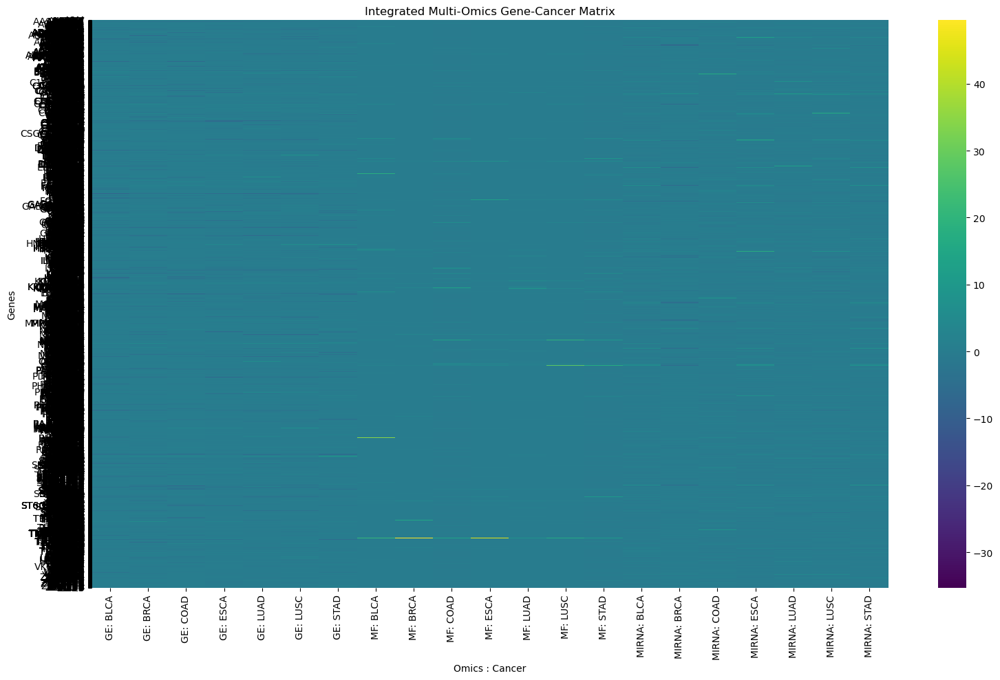

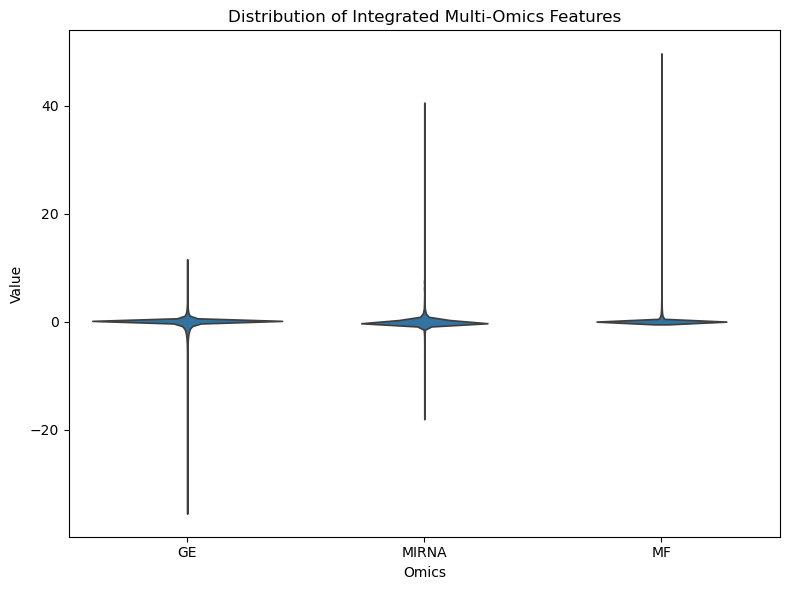

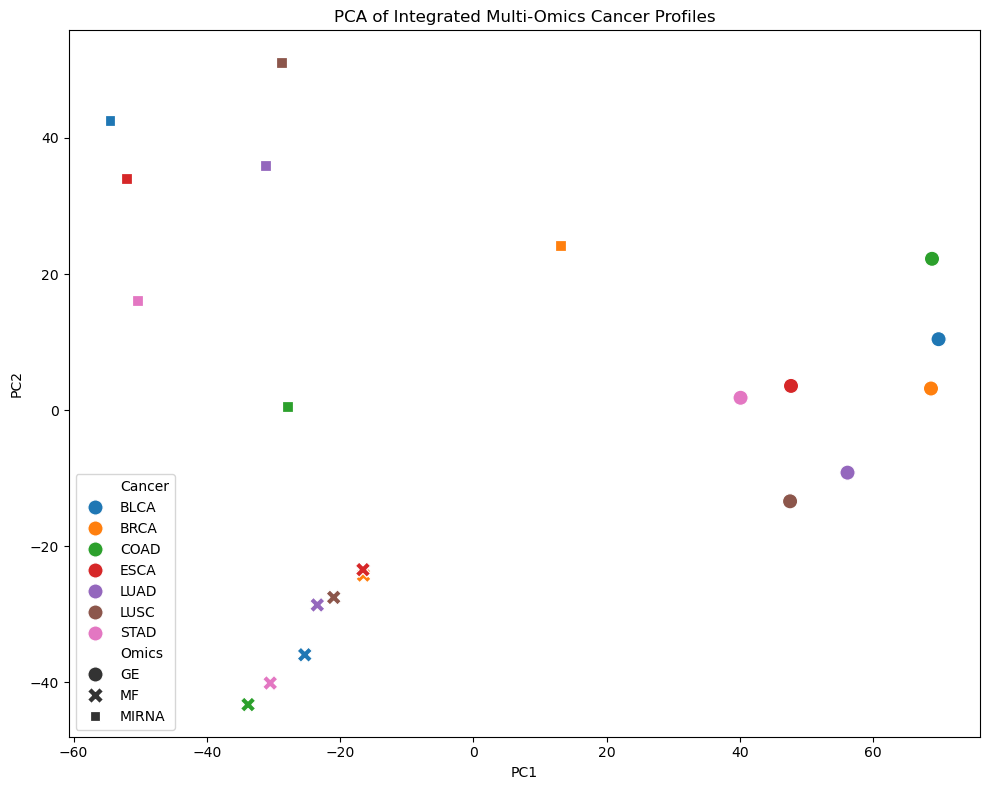

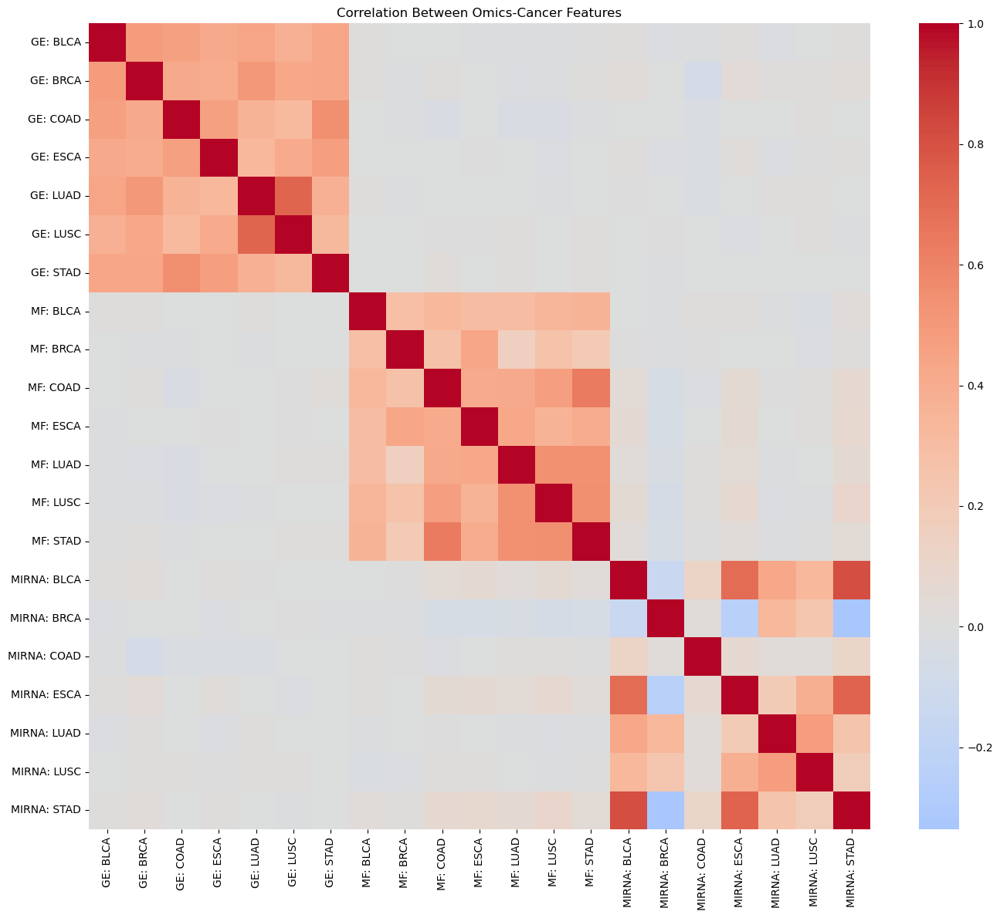

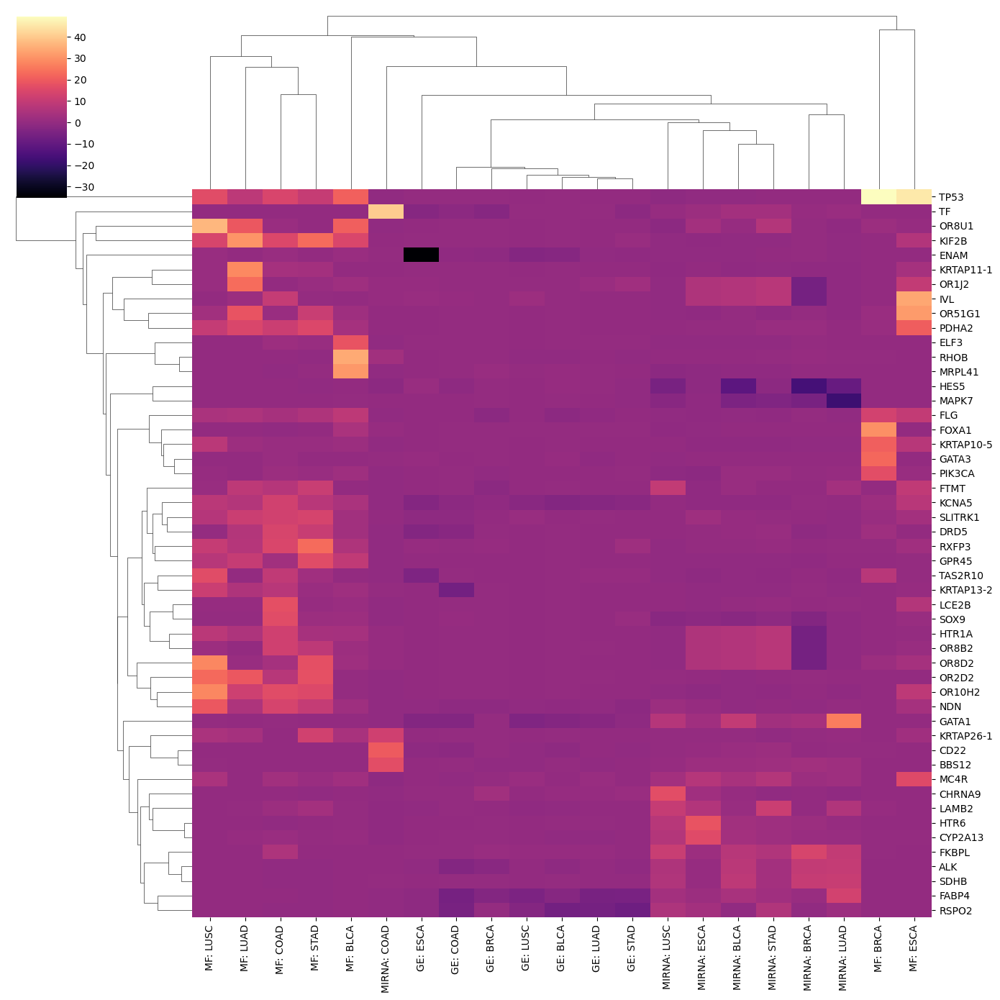


VISUALIZATION COMPLETE

Saved figures:
 - boxplot_multiomics_distribution.png
 - clustermap_top_variable_genes.png
 - correlation_heatmap.png
 - heatmap_gene_cancer_matrix.png
 - pca_multiomics.png
 - violin_multiomics_distribution.png


In [25]:
# =====================================================
# KEEP OMICS + CANCER LABELS
# =====================================================

omics_types = [
    "GE",
    "MF",
    "MIRNA",
]

cancers = sorted({
    c.split(": ")[1]
    for c in omics_df.columns
})

# ----------------------------------------
# Build gene × (OMICS:CANCER) matrix
# ----------------------------------------
gene_cancer_matrix = pd.DataFrame(
    index=omics_df.index,
    dtype=float
)

for omics in omics_types:

    for cancer in cancers:

        col_name = f"{omics}: {cancer}"

        matching_cols = [
            c for c in omics_df.columns
            if c == col_name
        ]

        if len(matching_cols) == 0:
            continue

        # If multiple columns exist, average them
        gene_cancer_matrix[col_name] = (
            omics_df[matching_cols]
            .mean(axis=1)
        )

print("gene_cancer_matrix shape:")
print(gene_cancer_matrix.shape)

print("\nColumns:")
print(gene_cancer_matrix.columns.tolist())


# =====================================================
# VISUALIZATION FOR
# GENE × (OMICS:CANCER) MATRIX
# =====================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# # =====================================================
# # LOAD MATRIX
# # =====================================================

# gene_cancer_matrix = pd.read_csv(
#     "./gene_cancer_matrix_integrated.csv",
#     index_col=0
# )

# print(gene_cancer_matrix.shape)

# =====================================================
# OUTPUT DIRECTORY
# =====================================================

VIS_DIR = "./visualizations"

os.makedirs(VIS_DIR, exist_ok=True)

# =====================================================
# PARSE COLUMN METADATA
# =====================================================

column_info = []

for col in gene_cancer_matrix.columns:

    omics = col.split(": ")[0]

    cancer = col.split(": ")[1]

    column_info.append({

        "Column": col,
        "Omics": omics,
        "Cancer": cancer
    })

column_info = pd.DataFrame(column_info)

# =====================================================
# HEATMAP
# =====================================================

plt.figure(figsize=(16, 10))

sns.heatmap(

    gene_cancer_matrix,

    cmap="viridis",

    xticklabels=True,

    yticklabels=True
)

plt.title(
    "Integrated Multi-Omics Gene-Cancer Matrix"
)

plt.xlabel("Omics : Cancer")

plt.ylabel("Genes")

plt.tight_layout()

plt.savefig(

    os.path.join(
        VIS_DIR,
        "heatmap_gene_cancer_matrix.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()

# =====================================================
# OMICS DISTRIBUTION
# =====================================================

omics_means = {}

for omics in ["GE", "MIRNA", "MF"]:

    cols = [

        c for c in gene_cancer_matrix.columns

        if c.startswith(f"{omics}:")
    ]

    vals = gene_cancer_matrix[cols].values.flatten()

    vals = vals[np.isfinite(vals)]

    omics_means[omics] = vals

# =====================================================
# VIOLIN PLOT
# =====================================================

plot_df = []

for omics, vals in omics_means.items():

    tmp = pd.DataFrame({

        "Omics": omics,
        "Value": vals
    })

    plot_df.append(tmp)

plot_df = pd.concat(plot_df)

plt.figure(figsize=(8, 6))

sns.violinplot(

    x="Omics",

    y="Value",

    data=plot_df,
    inner=None

    # inner="quartile"
)

plt.title(
    "Distribution of Integrated Multi-Omics Features"
)

plt.tight_layout()

plt.savefig(

    os.path.join(
        VIS_DIR,
        "violin_multiomics_distribution.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()

# =====================================================
# PCA VISUALIZATION
# =====================================================

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# -----------------------------------------------------
# TRANSPOSE:
# samples × genes
# -----------------------------------------------------

X = gene_cancer_matrix.T

# -----------------------------------------------------
# SCALE
# -----------------------------------------------------

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

# -----------------------------------------------------
# PCA
# -----------------------------------------------------

pca = PCA(n_components=2)

X_pca = pca.fit_transform(X_scaled)

# =====================================================
# BUILD PCA DATAFRAME
# =====================================================

pca_df = pd.DataFrame({

    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "Column": X.index
})

pca_df["Omics"] = [

    c.split(": ")[0]
    for c in pca_df["Column"]
]

pca_df["Cancer"] = [

    c.split(": ")[1]
    for c in pca_df["Column"]
]

# =====================================================
# PCA PLOT
# =====================================================

plt.figure(figsize=(10, 8))

sns.scatterplot(

    data=pca_df,

    x="PC1",

    y="PC2",

    hue="Cancer",

    style="Omics",

    s=120
)

plt.title(
    "PCA of Integrated Multi-Omics Cancer Profiles"
)

plt.tight_layout()

plt.savefig(

    os.path.join(
        VIS_DIR,
        "pca_multiomics.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()

# =====================================================
# CANCER-WISE CORRELATION
# =====================================================

corr_matrix = gene_cancer_matrix.corr()

plt.figure(figsize=(14, 12))

sns.heatmap(

    corr_matrix,

    cmap="coolwarm",

    center=0
)

plt.title(
    "Correlation Between Omics-Cancer Features"
)

plt.tight_layout()

plt.savefig(

    os.path.join(
        VIS_DIR,
        "correlation_heatmap.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()

# =====================================================
# TOP VARIABLE GENES
# =====================================================

gene_variance = gene_cancer_matrix.var(axis=1)

top_genes = (

    gene_variance

    .sort_values(ascending=False)

    .head(50)

    .index
)

top_matrix = gene_cancer_matrix.loc[top_genes]

# =====================================================
# CLUSTERMAP
# =====================================================

sns.clustermap(

    top_matrix,

    cmap="magma",

    figsize=(14, 14),

    yticklabels=True,

    xticklabels=True
)

plt.savefig(

    os.path.join(
        VIS_DIR,
        "clustermap_top_variable_genes.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()

# =====================================================
# SUMMARY
# =====================================================

print("\n====================================")
print("VISUALIZATION COMPLETE")
print("====================================")

print("\nSaved figures:")

for f in sorted(os.listdir(VIS_DIR)):

    print(" -", f)


In [26]:
gene_cancer_matrix


,GE: BLCA,GE: BRCA,GE: COAD,GE: ESCA,GE: LUAD,GE: LUSC,GE: STAD,MF: BLCA,MF: BRCA,MF: COAD,...,MF: LUAD,MF: LUSC,MF: STAD,MIRNA: BLCA,MIRNA: BRCA,MIRNA: COAD,MIRNA: ESCA,MIRNA: LUAD,MIRNA: LUSC,MIRNA: STAD
A2M,-0.450252,-0.375213,-0.212227,-0.201163,-0.999526,-1.381794,0.014205,0.416746,0.058398,0.415486,...,-0.061635,0.002664,-0.042010,0.573733,0.374408,-0.291454,2.919437,-0.662961,-1.036422,5.075598
A4GALT,0.031591,0.184270,0.149158,0.115927,0.080320,0.203032,-1.628914,-0.178209,-0.109006,-0.080695,...,-0.134169,-0.124636,-0.200515,-0.271329,-0.404402,-0.418238,-0.480059,0.078098,-0.300947,-0.358847
A4GNT,0.226323,-0.899821,0.332584,-2.134454,-1.410470,-0.366007,-0.042533,-0.106739,-0.109006,-0.222539,...,-0.044273,0.574070,-0.198388,-0.890229,0.160708,-0.313107,-0.681649,-0.691537,-0.675322,-0.472391
AACS,0.267415,0.168016,0.246568,0.127005,0.381012,0.132754,0.022948,-0.182444,-0.090733,-0.225027,...,-0.127726,-0.124636,-0.195398,-0.123910,0.259203,1.012736,-0.016238,0.096370,-0.226759,-0.007658
AADAC,0.016905,-6.086483,0.366836,-0.325140,-1.633394,0.066516,-0.091618,-0.151868,-0.096656,-0.212498,...,-0.134169,-0.015231,-0.090727,-0.616343,-0.204350,0.098565,-0.750910,-0.113055,-0.133851,-0.487454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNRF3,0.193718,0.141148,0.584366,0.057015,0.076138,0.067147,0.129265,-0.182444,-0.109006,-0.225027,...,-0.134169,-0.124636,-0.200201,-0.218768,-0.060406,-0.568010,-0.098496,-0.119410,0.031075,0.125267
ZP4,0.243497,0.778626,0.356041,0.120636,0.116834,0.146963,0.026642,0.344736,0.116684,0.044732,...,4.133057,0.513246,0.440866,-0.828338,0.031639,-0.337420,-1.431329,-1.285877,-1.981474,-0.706596
ZRANB1,0.033299,-0.091435,0.248782,-0.216191,-0.035805,-0.038058,0.026642,-0.097518,-0.095106,-0.219134,...,-0.134169,-0.124636,-0.167643,0.024454,0.223348,-0.203216,-0.184476,-0.160991,-0.214619,-0.291889
ZW10,0.227894,0.146246,0.343645,0.190919,0.133727,0.263791,0.539244,-0.181981,-0.109006,-0.148856,...,-0.111722,-0.121344,-0.198679,-0.407628,0.055462,-0.356357,-0.339657,0.582509,-0.243908,-0.328135


In [27]:
# =====================================================
# Restrict to top genes
# =====================================================

top_genes = saliency_df["Gene"].values

gene_cancer_matrix = gene_cancer_matrix.loc[
    gene_cancer_matrix.index.intersection(top_genes)
]

# =====================================================
# Saliency weighting
# =====================================================

saliency_map = saliency_df.set_index(
    "Gene"
)["Saliency"]

gene_cancer_weighted = gene_cancer_matrix.mul(
    saliency_map,
    axis=0
)

print(gene_cancer_weighted.shape)


(5000, 21)


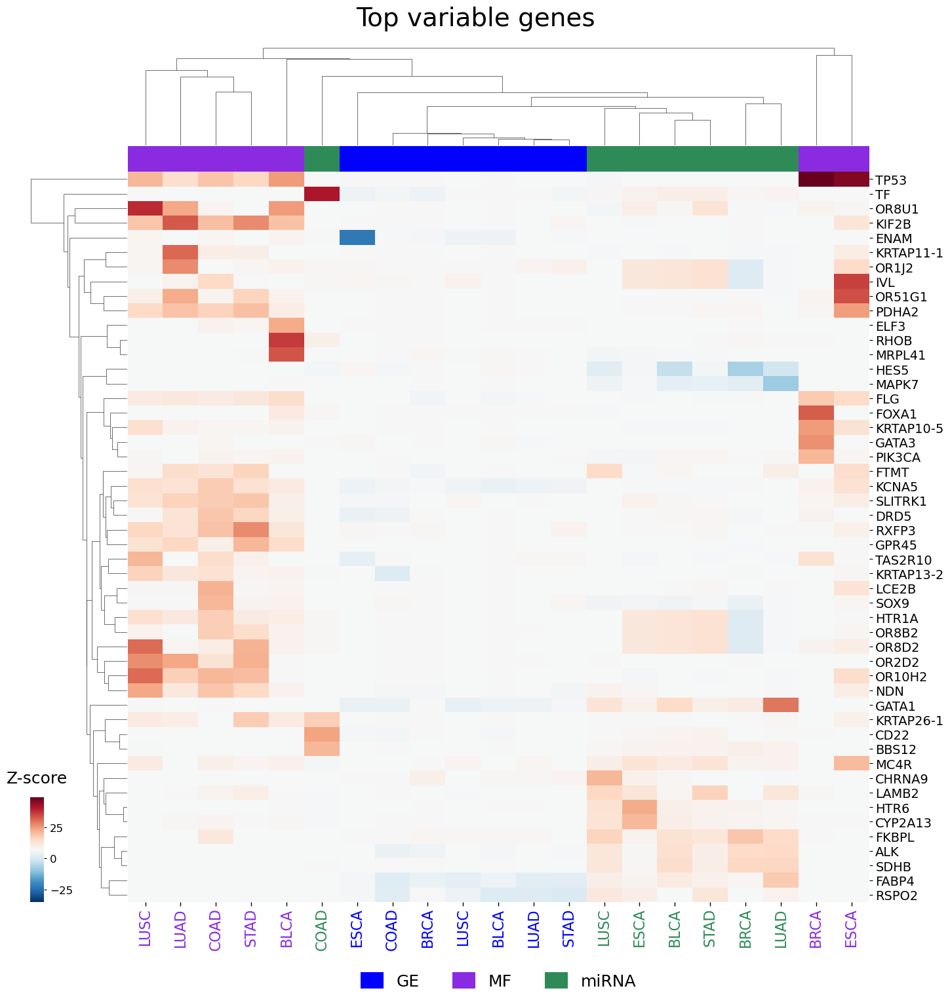

In [28]:
from matplotlib.patches import Patch
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# =====================================================
# OMICS COLORS
# =====================================================
COLORS = [
    '#0077B6','#0000FF','#00B4D8','#48EAC4','#F1C0E8','#B9FBC0',
    '#32CD32','#BEE1E6','#8A2BE2','#E377C2','#8EECF5','#A3C4F3',
    '#FFB347','#FFD700','#FF69B4','#CD5C5C','#7FFFD4','#FF7F50',
    '#C71585','#20B2AA','#6A5ACD','#40E0D0','#FF8C00','#DC143C',
    '#9ACD32','#1F77B4','#FF1493','#2E8B57','#D2691E','#9932CC',
    '#00CED1','#FF4500','#708090'
]
OMICS_COLORS = {
    "GE": '#0000FF',
    "MF": '#8A2BE2',
    "MIRNA": '#2E8B57',
}

# =====================================================
# COLUMN COLOR BAR (OMICS)
# =====================================================

col_colors = [
    OMICS_COLORS[col.split(": ")[0]]
    for col in top_matrix.columns
]

# =====================================================
# CLUSTERMAP
# =====================================================

g = sns.clustermap(

    top_matrix,

    cmap="RdBu_r",
    # cmap="Blues",

    center=0,

    figsize=(14, 16),

    xticklabels=True,

    yticklabels=True,

    col_colors=col_colors,

    dendrogram_ratio=(0.12, 0.12),

    # Disable seaborn colorbar
    cbar_pos=None
)

# =====================================================
# GLOBAL TITLE
# =====================================================

g.fig.suptitle(
    "Top variable genes",
    fontsize=28,
    y=0.995
)

# # =====================================================
# # HEATMAP STYLE
# # =====================================================

# g.ax_heatmap.set_xlabel("")
# g.ax_heatmap.set_ylabel("")

# g.ax_heatmap.tick_params(
#     axis="x",
#     which="major",
#     direction="out",
#     length=4,
#     width=1,
#     pad=2,
#     bottom=True,
#     top=False
# )

# g.ax_heatmap.tick_params(
#     axis="y",
#     which="major",
#     direction="out",
#     length=3,
#     width=1
# )

# for spine in g.ax_heatmap.spines.values():
#     spine.set_visible(False)


# =====================================================
# X LABELS
# =====================================================

new_labels = [
    col.split(": ")[1]
    for col in g.data2d.columns
]

g.ax_heatmap.set_xticklabels(
    new_labels,
    rotation=90,
    fontsize=16,
    # fontweight="bold"
)

g.ax_heatmap.xaxis.set_ticks_position("bottom")

g.ax_heatmap.tick_params(
    axis="x",
    which="major",
    length=4,
    width=1.0,
    direction="out",
    pad=2
)

# =====================================================
# COLOR X LABELS BY OMICS
# =====================================================

for tick, col in zip(
    g.ax_heatmap.get_xticklabels(),
    g.data2d.columns
):

    omics = col.split(": ")[0]

    tick.set_color(
        OMICS_COLORS.get(
            omics,
            "black"
        )
    )

# =====================================================
# Y LABELS
# =====================================================

g.ax_heatmap.set_yticklabels(
    g.ax_heatmap.get_yticklabels(),
    fontsize=14
)

# =====================================================
# REMOVE AXIS LABELS
# =====================================================

g.ax_heatmap.set_xlabel("")
g.ax_heatmap.set_ylabel("")

# =====================================================
# LAYOUT
# =====================================================

g.fig.subplots_adjust(
    bottom=0.14,
    top=0.96
)

# # =====================================================
# # CUSTOM GENE Z-SCORE COLORBAR
# # =====================================================

# norm = Normalize(
#     vmin=np.nanmin(top_matrix.values),
#     vmax=np.nanmax(top_matrix.values)
# )

# sm = ScalarMappable(
#     cmap="RdBu_r",
#     norm=norm
# )

# sm.set_array([])

# # [left, bottom, width, height]
# cax = g.fig.add_axes(
#     [0.78, 0.925, 0.15, 0.014]
# )

# cb = plt.colorbar(
#     sm,
#     cax=cax,
#     orientation="horizontal"
# )

# cb.ax.tick_params(
#     labelsize=10,
#     length=2,
#     pad=1
# )

# cb.outline.set_linewidth(0.5)

# cb.ax.set_title(
#     "Gene Z-score",
#     fontsize=14,
#     fontweight="bold",
#     pad=4
# )

# =====================================================
# CUSTOM GENE Z-SCORE COLORBAR
# LOWER LEFT (OFFSET FROM HEATMAP)
# =====================================================

norm = Normalize(
    vmin=np.nanmin(top_matrix.values),
    vmax=np.nanmax(top_matrix.values)
)

sm = ScalarMappable(
    # cmap="Blues",
    cmap="RdBu_r",
    norm=norm
)

sm.set_array([])

# farther from heatmap
# cax = g.fig.add_axes(
#     [0.015, 0.14, 0.018, 0.18]
# )

# =====================================================
# Vertical colorbar (bottom-right)
# =====================================================

cax = g.fig.add_axes([
    0.015,   # x-position (move right)
    0.14,   # y-position (bottom)
    0.015,  # width (thin)
    0.10    # height
])

cb = plt.colorbar(
    sm,
    cax=cax,
    orientation="vertical"
)

cb.outline.set_linewidth(0.6)

cb.ax.tick_params(
    labelsize=11,
    length=3
)

# =====================================================
# VERTICAL LABEL
# =====================================================

# cb.set_label(
#     "Gene Z-score",
#     fontsize=14,
#     fontweight="bold",
#     rotation=90,
#     labelpad=18
# )

# # remove default label
# cb.set_label("")

# # custom label on left side
# cb.ax.text(
#     -1.2,
#     0.5,
#     "Z-score",
#     rotation=90,
#     ha="center",
#     va="center",
#     fontsize=18,      # larger
#     # fontweight="bold",
#     transform=cb.ax.transAxes
# )

# cbar = g.fig.colorbar(
#     im,
#     cax=cax,
#     orientation="vertical"
# )

# cbar.set_label(
#     "Z-score",
#     fontsize=18,
#     labelpad=10,
#     fontweight="bold"
# )
cb.ax.set_title(
    "Z-score",
    fontsize=18,
    # fontweight="bold",
    pad=16
)

cb.ax.tick_params(
    labelsize=12
)

for spine in g.ax_heatmap.spines.values():
    spine.set_visible(False)

cb.outline.set_visible(False)


# =====================================================
# OMICS LEGEND
# =====================================================

omics_handles = [

    Patch(
        facecolor=OMICS_COLORS["GE"],
        edgecolor="none",
        label="GE"
    ),

    Patch(
        facecolor=OMICS_COLORS["MF"],
        edgecolor="none",
        label="MF"
    ),

    Patch(
        facecolor=OMICS_COLORS["MIRNA"],
        edgecolor="none",
        label="miRNA"
    )
]

legend = g.ax_heatmap.legend(

    handles=omics_handles,

    loc="upper center",

    bbox_to_anchor=(0.5, -0.08),

    ncol=3,

    frameon=False,

    fontsize=18,

    handlelength=1.4,

    handleheight=1.2,

    borderpad=0.2,

    labelspacing=0.5,

    columnspacing=2.0
)

# for txt in legend.get_texts():
#     txt.set_fontweight("bold")

# =====================================================
# THICKER DENDROGRAMS
# =====================================================

for collection in g.ax_row_dendrogram.collections:
    collection.set_linewidth(0.5)

for collection in g.ax_col_dendrogram.collections:
    collection.set_linewidth(0.5)

# =====================================================
# SAVE
# =====================================================

save_path = os.path.join(
    VIS_DIR,
    "clustermap_top_variable_genes.png"
)

g.savefig(
    save_path,
    dpi=600,
    bbox_inches="tight"
)

plt.show()


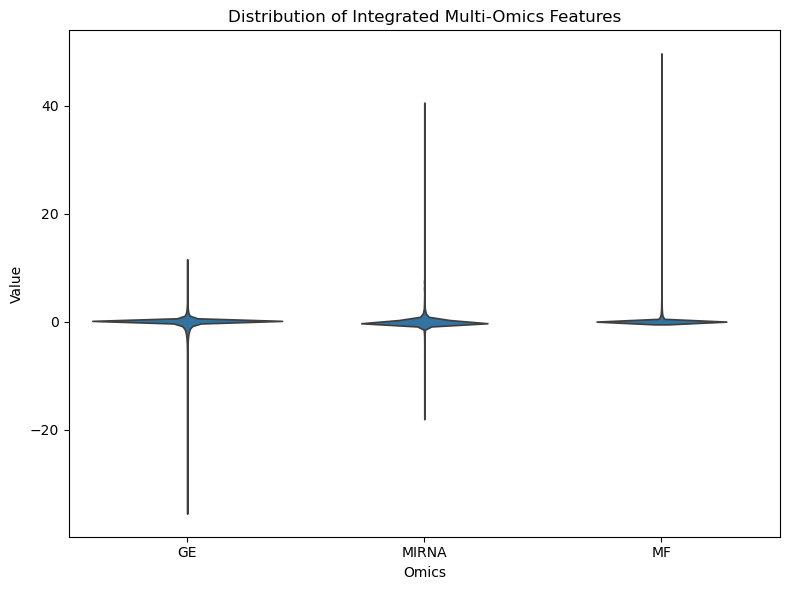

In [29]:
# =====================================================
# VIOLIN PLOT
# =====================================================

plot_df = []

for omics, vals in omics_means.items():

    tmp = pd.DataFrame({

        "Omics": omics,
        "Value": vals
    })

    plot_df.append(tmp)

plot_df = pd.concat(plot_df)

plt.figure(figsize=(8, 6))

sns.violinplot(

    x="Omics",

    y="Value",

    data=plot_df,
    inner=None
)

plt.title(
    "Distribution of Integrated Multi-Omics Features"
)

plt.tight_layout()

plt.savefig(

    os.path.join(
        VIS_DIR,
        "violin_multiomics_distribution.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()


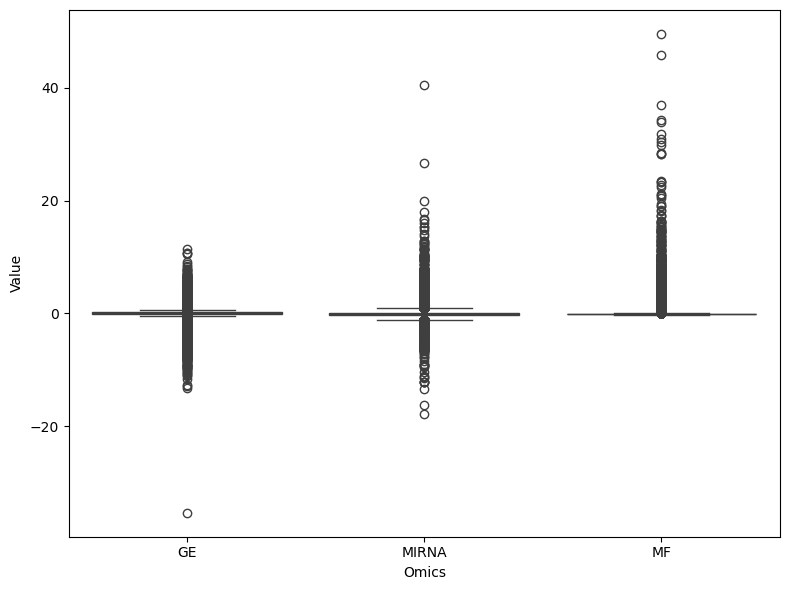

In [30]:
plt.figure(figsize=(8,6))

sns.boxplot(
    x="Omics",
    y="Value",
    data=plot_df
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        VIS_DIR,
        "boxplot_multiomics_distribution.png"
    ),
    dpi=300
)

plt.show()


In [31]:
# =====================================================
# SAVE GENE × (OMICS:CANCER) MATRIX
# =====================================================

# output_file = "gene_cancer_matrix.csv"

# gene_cancer_matrix.to_csv(output_file)

# print(f"\nSaved matrix to: {output_file}")
# print(f"Shape: {gene_cancer_matrix.shape}")

# =====================================================
# SAVE COLUMN METADATA (OPTIONAL)
# =====================================================

metadata = pd.DataFrame(
    [
        {
            "Column": col,
            "Omics": col.split(": ")[0],
            "Cancer": col.split(": ")[1]
        }
        for col in gene_cancer_matrix.columns
    ]
)

metadata_file = "gene_cancer_matrix_metadata.csv"

metadata.to_csv(
    metadata_file,
    index=False
)

print(f"Saved metadata to: {metadata_file}")


Saved metadata to: gene_cancer_matrix_metadata.csv



Loading datasets...

Normalizing IDs...

Cleaning feature names...

Example miRNA IDs:
['MIMAT0000062', 'MIMAT0000063', 'MIMAT0000064', 'MIMAT0000065', 'MIMAT0000066', 'MIMAT0000067', 'MIMAT0000414', 'MIMAT0000415', 'MIMAT0000416', 'MIMAT0000098', 'MIMAT0000099', 'MIMAT0000101', 'MIMAT0000102', 'MIMAT0000103', 'MIMAT0000680', 'MIMAT0000104', 'MIMAT0000253', 'MIMAT0000254', 'MIMAT0005823', 'MIMAT0005824']

Building mutation matrix...
Gene column: HugoSymbol

Mutation matrix shape:
(1968, 18688)

Processing drug response...

Drug matrix shape:
(915, 500)

Dataset sizes:
GE: 1684
MF: 1968
MIRNA: 954
METABO: 928
DRUG: 915

Shared cell lines:
680

Scaling matrices...

Fusion shape:
(680, 39353)

Running PCA...
PCA shape: (680, 100)

Running UMAP...


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.



Building graph...

Running Leiden clustering...

Clusters found:
9


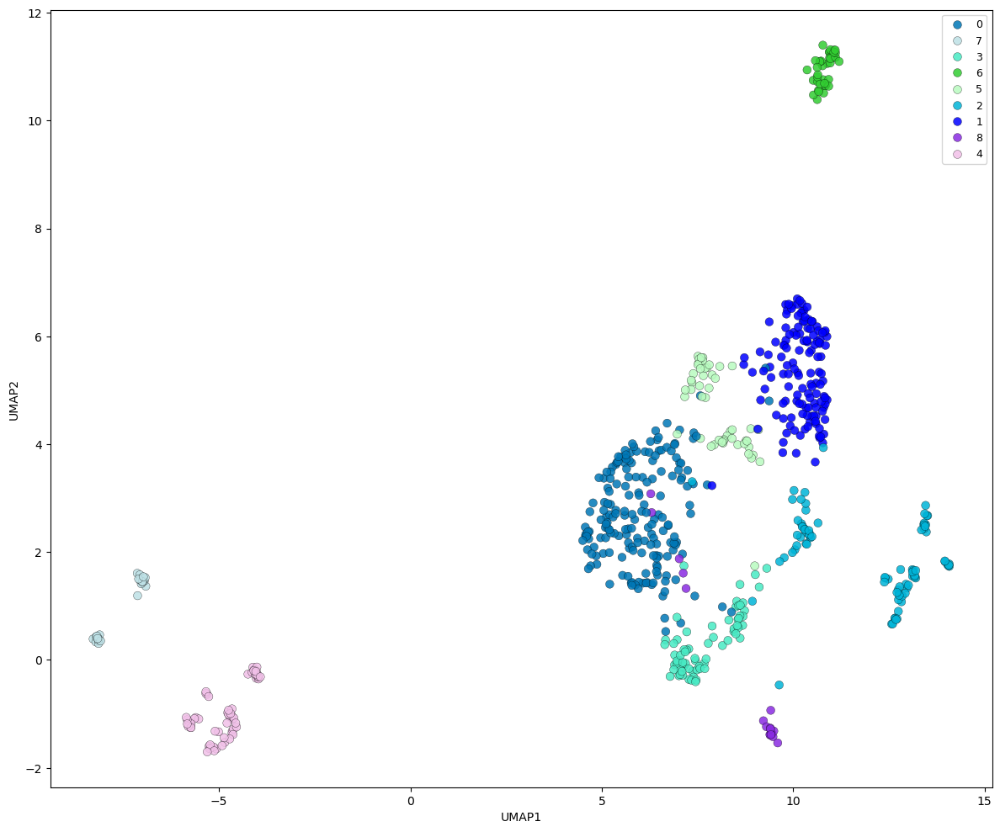


Computing similarity matrix...


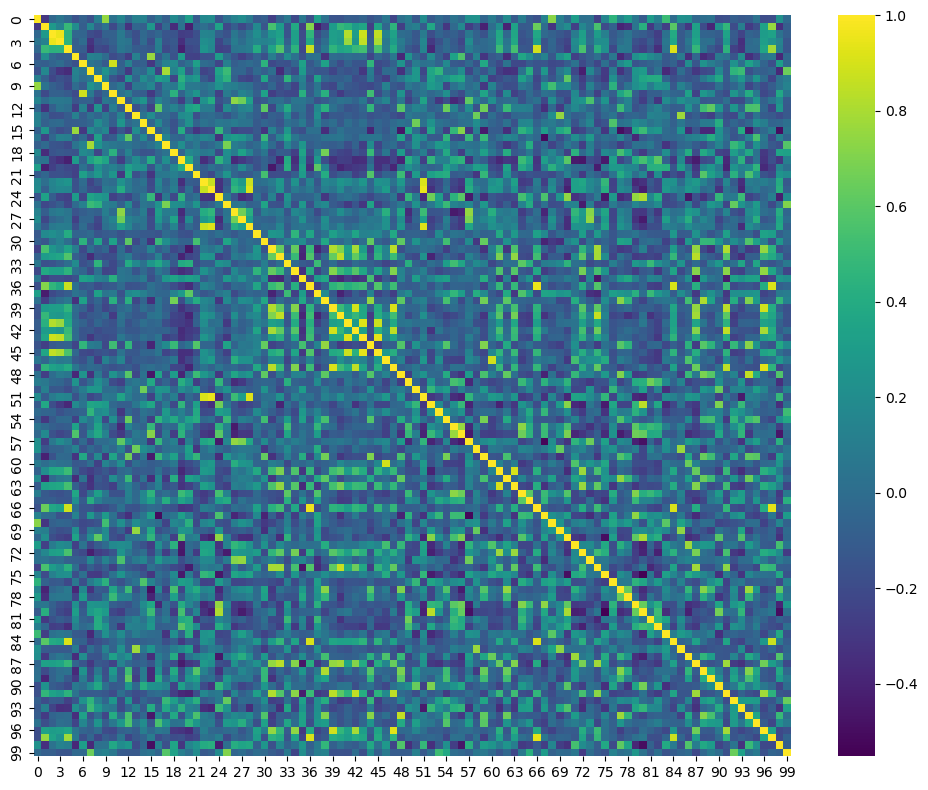


Running Reactome enrichment...

Top genes:
['MT-ND2', 'MRPS34', 'PSMA2', 'TARDBP', 'RPL36', 'RPL10', 'SCP2', 'ARF1', 'UQCRQ', 'MT-ND4L', 'LARP1', 'DDX5', 'DDX42', 'GNL3', 'EIF1', 'AAMP', 'TRIR', 'MRPL15', 'BTF3', 'NDUFB10']

Enriched pathways: 3359

Running GSEA-like enrichment...
Total ranked genes: 19205

Top mutation-associated genes: 500

Computing miRNA-associated genes...


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Top miRNA-associated genes: 500
[SAVED] mirna_associated_genes.csv

Computing GE-associated genes...


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Top GE-associated genes: 500

Example GE-associated genes:
['ZBTB40', 'DVL2', 'BRAP', 'GON4L', 'CEP350', 'HS2ST1', 'PHF13', 'ATG2B', 'NR2C2', 'RAB11FIP3', 'TULP4', 'ATRX', 'ZDHHC17', 'KMT2A', 'FAM161A', 'USP33', 'RAB2B', 'RALGAPB', 'PUM2', 'SETD2']
[SAVED] ge_associated_genes.csv

Top mutation-associated genes: 500

Computing miRNA-associated genes...


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Top miRNA-associated genes: 500
[SAVED] miRNA-associated genes

Gene set overlap:
GE-Associated: 500/500 matched
Highly Variable: 500/500 matched
Mutation-Associated: 496/500 matched
miRNA-Associated: 500/500 matched
Cancer Drivers: 0/0 matched
Hallmark: 0/0 matched
Immune: 0/0 matched
Cell Cycle: 0/0 matched

Retained gene sets:
- GE-Associated
- Highly Variable
- Mutation-Associated
- miRNA-Associated


/var/folders/z_/4_txl3tn61g8nprq0_s7tsbc0000gn/T/ipykernel_9286/1749051526.py:1524: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


[SAVED] aspire_gnn_results/gsea_like_enrichment_curves.png


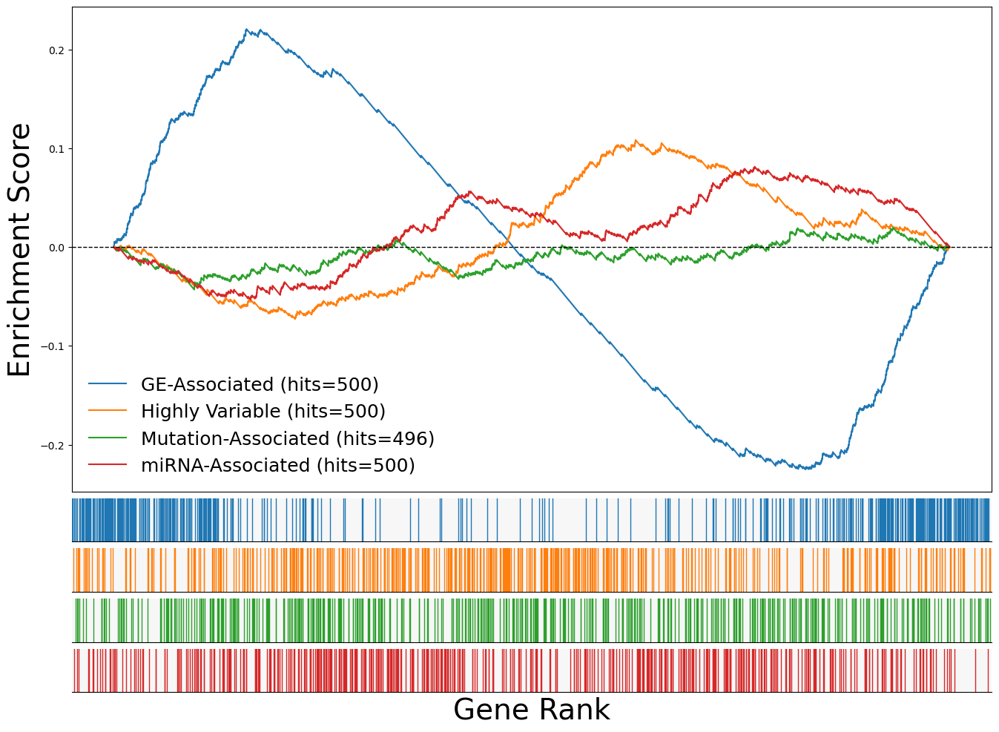

[SAVED] aspire_gnn_results/gsea_like_enrichment_scores.csv
[SAVED] aspire_gnn_results/pathway_gene_rank_distribution.png


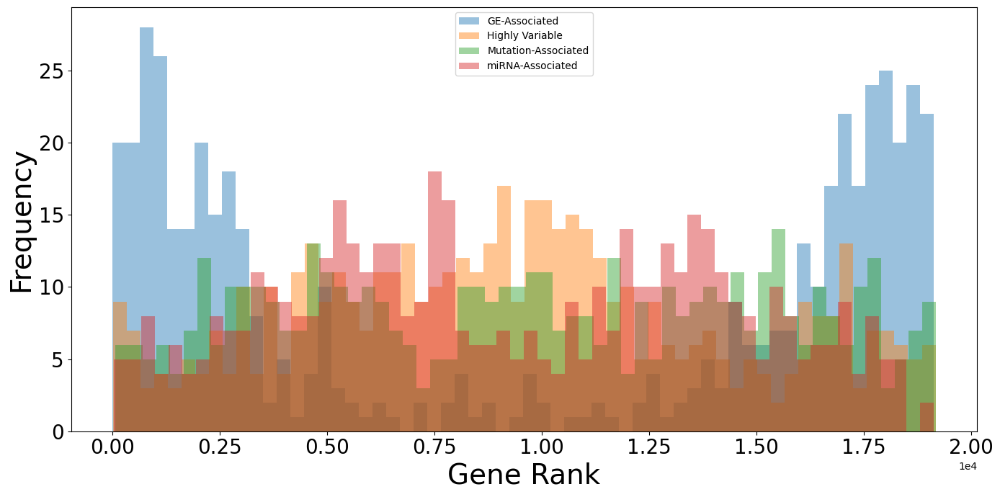

[SAVED] aspire_gnn_results/top_ranked_genes.csv


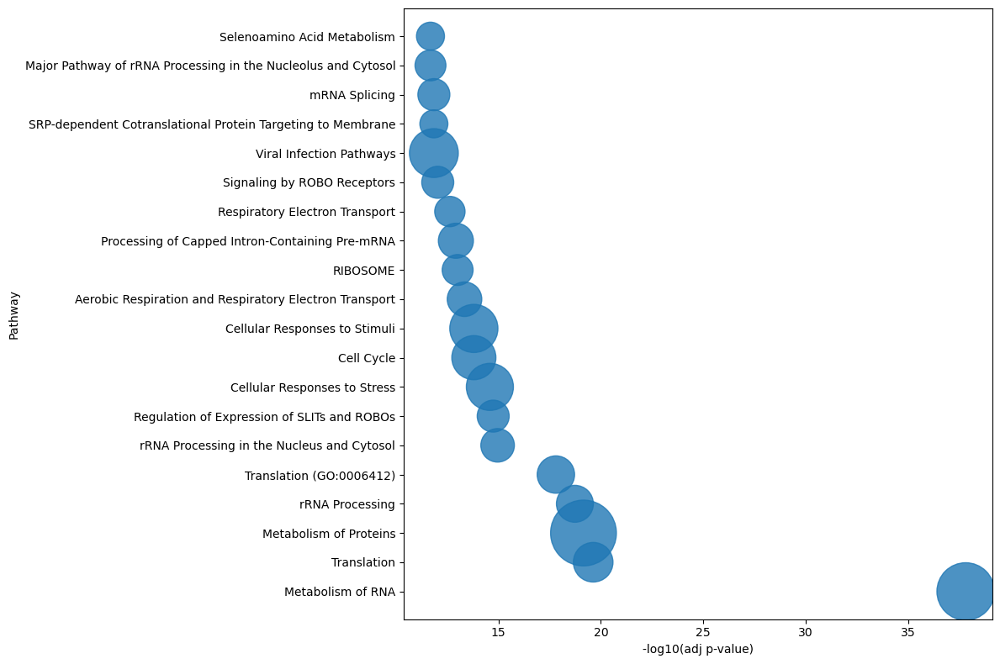


Building multi-view embeddings...

GE
shape: (680, 19205)
Using PCA dimensions: 20
Embedding shape: (680, 20)

MF
shape: (680, 18688)
Using PCA dimensions: 20
Embedding shape: (680, 20)

MIRNA
shape: (680, 734)
Using PCA dimensions: 20
Embedding shape: (680, 20)

METABO
shape: (680, 226)
Using PCA dimensions: 20
Embedding shape: (680, 20)

DRUG
shape: (680, 500)
Using PCA dimensions: 20
Embedding shape: (680, 20)


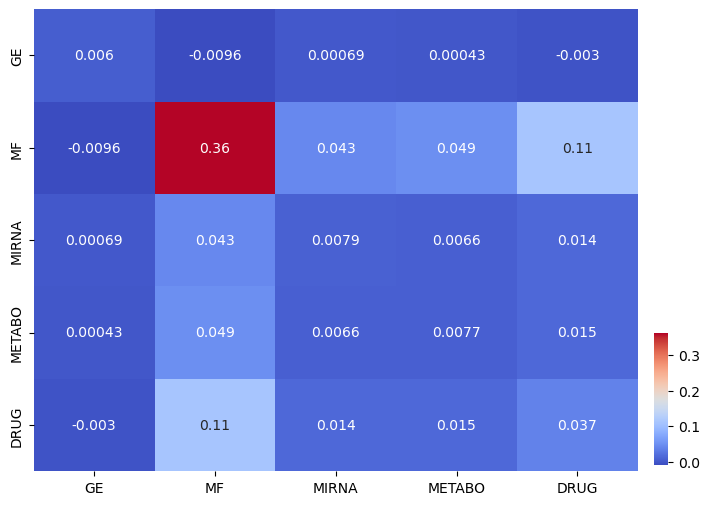


Plotting drug heatmap...


<Figure size 1800x1200 with 0 Axes>

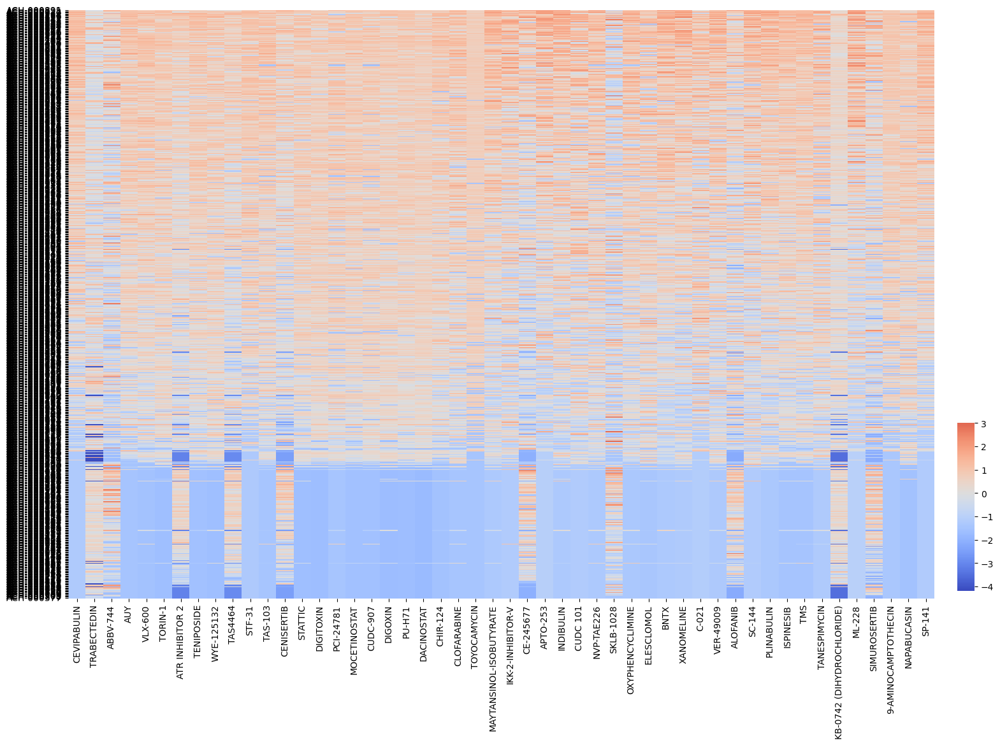

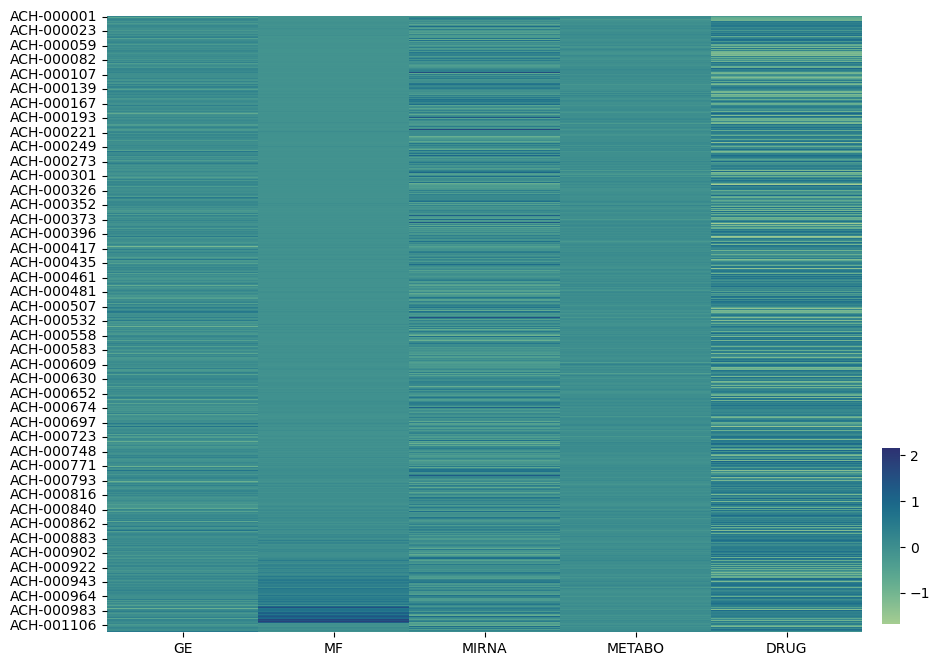


Saving embeddings...

ASPIRE-GNN++ COMPLETE
Cells: 680
Features: 39353
Clusters: 9

Saved to:
aspire_gnn_results


In [32]:
# ============================================================
# ASPIRE-GNN++
# MULTI-OMICS + DRUG RESPONSE + LEIDEN + CONTRASTIVE GRAPH
# + PATHWAY-AWARE CELL EMBEDDING
# + GSEA-LIKE ENRICHMENT CURVES
# + miRNA-AWARE GENE ASSOCIATION
# ============================================================

import os
import re
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors

import umap
import igraph as ig
import leidenalg

from gseapy import enrichr


# ============================================================
# OUTPUT
# ============================================================

OUTPUT_DIR = "aspire_gnn_results"

os.makedirs(
    OUTPUT_DIR,
    exist_ok=True
)


# ============================================================
# COLORS
# ============================================================

COLORS = [
    '#0077B6','#0000FF','#00B4D8','#48EAC4','#F1C0E8','#B9FBC0',
    '#32CD32','#BEE1E6','#8A2BE2','#E377C2','#8EECF5','#A3C4F3',
    '#FFB347','#FFD700','#FF69B4','#CD5C5C','#7FFFD4','#FF7F50',
    '#C71585','#20B2AA','#6A5ACD','#40E0D0','#FF8C00','#DC143C',
    '#9ACD32','#1F77B4','#FF1493','#2E8B57','#D2691E','#9932CC',
    '#00CED1','#FF4500'
]


# ============================================================
# CLEANING UTILITIES
# ============================================================

def clean(df):

    df = df.replace(
        [np.inf, -np.inf],
        np.nan
    )

    return df.fillna(0)


def to_numeric(df):

    return (
        df
        .apply(
            pd.to_numeric,
            errors="coerce"
        )
        .fillna(0)
    )


def normalize_index(df, col=None):

    df = df.copy()

    if col is not None:

        df[col] = (
            df[col]
            .astype(str)
            .str.strip()
            .str.upper()
        )

        df[col] = (
            df[col]
            .str.replace(
                "CDS-",
                "ACH-",
                regex=False
            )
            .str.replace(
                "MC-",
                "",
                regex=False
            )
        )

        df = df.set_index(col)

    df.index = (
        df.index
        .astype(str)
        .str.strip()
        .str.upper()
    )

    df.index = (
        df.index
        .str.replace(
            "CDS-",
            "ACH-",
            regex=False
        )
        .str.replace(
            "MC-",
            "",
            regex=False
        )
    )

    return df


def scale(df):

    df = clean(df)

    df = to_numeric(df)

    if df.shape[0] == 0 or df.shape[1] == 0:

        print("WARNING: EMPTY MATRIX")

        return df

    return pd.DataFrame(

        StandardScaler().fit_transform(df),

        index=df.index,

        columns=df.columns.astype(str)
    )


# ============================================================
# GENE SYMBOL CLEANER
# ============================================================

def clean_gene_symbol(g):

    if pd.isna(g):
        return None

    g = str(g)

    g = re.sub(
        r"\s*\(.*?\)",
        "",
        g
    )

    g = g.upper().strip()

    return g


# ============================================================
# miRNA ID CLEANER
# KEEP MIMAT IDs INTACT
# ============================================================

def clean_mirna_id(m):

    if pd.isna(m):
        return None

    m = str(m)

    m = m.strip().upper()

    return m


# ============================================================
# LOAD DATA
# ============================================================

print("\nLoading datasets...")

ge_df = pd.read_csv(
    "../data/OmicsExpressionProteinCodingGenesTPMLogp1.csv",
    index_col=0
)

mf_raw = pd.read_csv(
    "../data/OmicsSomaticMutations.csv",
    low_memory=False
)

mirna_df = pd.read_csv(
    "../data/CCLE_miRNA_MIMAT.csv",
    index_col=0
)

metabo_df = pd.read_csv(
    "../data/CCLE_metabolomics_20190502.csv"
)

drug_raw = pd.read_csv(
    "../data/PRISM_Repurposing_Primary_(Viability)_subsetted.csv",
    low_memory=False
)


# ============================================================
# NORMALIZE IDS
# ============================================================

print("\nNormalizing IDs...")

ge_df = normalize_index(ge_df)

mirna_df = normalize_index(mirna_df)

metabo_df = normalize_index(
    metabo_df,
    col="DepMap_ID"
)


# ============================================================
# CLEAN FEATURE NAMES
# ============================================================

print("\nCleaning feature names...")

# ------------------------------------------------------------
# GENE EXPRESSION
# ------------------------------------------------------------

ge_df.columns = [
    clean_gene_symbol(c)
    for c in ge_df.columns
]

ge_df = ge_df.loc[
    :,
    ~pd.Index(ge_df.columns).duplicated()
]

# ------------------------------------------------------------
# miRNA
# IMPORTANT:
# KEEP MIMAT IDs
# DO NOT CONVERT TO GENE SYMBOLS
# ------------------------------------------------------------

mirna_df.columns = [
    clean_mirna_id(c)
    for c in mirna_df.columns
]

mirna_df = mirna_df.loc[
    :,
    ~pd.Index(mirna_df.columns).duplicated()
]

print("\nExample miRNA IDs:")
print(mirna_df.columns[:20].tolist())


# ============================================================
# MUTATION GENE MATRIX
# ============================================================

print("\nBuilding mutation matrix...")

mf_raw["ModelID"] = (
    mf_raw["ModelID"]
    .astype(str)
    .str.strip()
    .str.upper()
)

gene_col = None

for c in mf_raw.columns:

    if (
        "gene" in c.lower()
        or "hugo" in c.lower()
        or "symbol" in c.lower()
    ):

        gene_col = c
        break

print("Gene column:", gene_col)

mf_raw[gene_col] = (
    mf_raw[gene_col]
    .astype(str)
    .apply(clean_gene_symbol)
)

mf_df = pd.crosstab(

    mf_raw["ModelID"],

    mf_raw[gene_col]
)

gene_freq = mf_df.sum(axis=0)

keep_genes = gene_freq[
    gene_freq >= 5
].index

mf_df = mf_df[keep_genes]

print("\nMutation matrix shape:")
print(mf_df.shape)


# ============================================================
# DRUG RESPONSE MATRIX
# ============================================================

print("\nProcessing drug response...")

drug_raw.columns = [

    str(c).strip()

    for c in drug_raw.columns
]

cell_col = drug_raw.columns[0]

drug_df = drug_raw.copy()

drug_df = drug_df.rename(
    columns={cell_col: "CELL_LINE"}
)

drug_df["CELL_LINE"] = (
    drug_df["CELL_LINE"]
    .astype(str)
    .str.strip()
    .str.upper()
)

drug_df["CELL_LINE"] = (
    drug_df["CELL_LINE"]
    .str.replace(
        "CDS-",
        "ACH-",
        regex=False
    )
    .str.replace(
        "MC-",
        "",
        regex=False
    )
)

drug_df = drug_df.set_index(
    "CELL_LINE"
)

drug_df = clean(drug_df)

drug_df = to_numeric(drug_df)

# ------------------------------------------------------------
# REMOVE ZERO VARIANCE DRUGS
# ------------------------------------------------------------

drug_std = drug_df.std(axis=0)

drug_df = drug_df.loc[
    :,
    drug_std > 1e-8
]

# ------------------------------------------------------------
# KEEP TOP VARIABLE DRUGS
# ------------------------------------------------------------

top_drugs = (
    drug_df.var(axis=0)
    .sort_values(ascending=False)
    .head(500)
    .index
)

drug_df = drug_df[top_drugs]

print("\nDrug matrix shape:")
print(drug_df.shape)


# ============================================================
# ALIGN CELL LINES
# ============================================================

datasets = {

    "GE": set(ge_df.index),

    "MF": set(mf_df.index),

    "MIRNA": set(mirna_df.index),

    "METABO": set(metabo_df.index),

    "DRUG": set(drug_df.index)
}

print("\nDataset sizes:")

for k, v in datasets.items():

    print(f"{k}: {len(v)}")

common_cells = sorted(

    datasets["GE"]

    & datasets["MF"]

    & datasets["MIRNA"]

    & datasets["METABO"]

    & datasets["DRUG"]
)

print("\nShared cell lines:")
print(len(common_cells))


# ============================================================
# FALLBACK
# ============================================================

if len(common_cells) < 50:

    print("\nWARNING: LOW OVERLAP")

    common_cells = sorted(

        datasets["GE"]

        & datasets["MF"]

        & datasets["MIRNA"]

        & datasets["METABO"]
    )

    print(
        "Using omics-only overlap:",
        len(common_cells)
    )


# ============================================================
# SUBSET
# ============================================================

ge_df = ge_df.loc[common_cells]

mf_df = mf_df.reindex(common_cells).fillna(0)

mirna_df = mirna_df.reindex(common_cells).fillna(0)

metabo_df = metabo_df.reindex(common_cells).fillna(0)

drug_df = drug_df.reindex(common_cells).fillna(0)


# ============================================================
# LOG TRANSFORM
# ============================================================

mf_df = np.log1p(mf_df)

drug_df = np.log1p(
    np.abs(drug_df)
)


# ============================================================
# SCALE
# ============================================================

print("\nScaling matrices...")

ge_df = scale(ge_df)

mf_df = scale(mf_df)

mirna_df = scale(mirna_df)

metabo_df = scale(metabo_df)

drug_df = scale(drug_df)


# ============================================================
# MULTI-OMICS FUSION
# ============================================================

X = pd.concat([

    ge_df,

    mf_df,

    mirna_df,

    metabo_df,

    drug_df

], axis=1)

X.columns = X.columns.astype(str)

X = clean(X)

X = to_numeric(X)

print("\nFusion shape:")
print(X.shape)


# ============================================================
# PCA
# ============================================================

print("\nRunning PCA...")

pca = PCA(

    n_components=min(
        100,
        X.shape[1],
        X.shape[0] - 1
    )
)

X_pca = pca.fit_transform(
    X.values
)

print("PCA shape:", X_pca.shape)


# ============================================================
# UMAP
# ============================================================

print("\nRunning UMAP...")

umap_model = umap.UMAP(

    n_neighbors=20,

    min_dist=0.15,

    metric="cosine",

    random_state=42
)

X_umap = umap_model.fit_transform(
    X_pca
)

umap_df = pd.DataFrame(

    X_umap,

    columns=[
        "UMAP1",
        "UMAP2"
    ],

    index=common_cells
)


# ============================================================
# KNN GRAPH
# ============================================================

print("\nBuilding graph...")

nbrs = NearestNeighbors(

    n_neighbors=15,

    metric="cosine"
)

nbrs.fit(X_pca)

distances, indices = nbrs.kneighbors(
    X_pca
)


# ============================================================
# BUILD GRAPH
# ============================================================

edges = []

for i in range(indices.shape[0]):

    for j in indices[i]:

        if i != j:

            edges.append((i, j))

g = ig.Graph(
    edges=edges,
    directed=False
)

g.simplify()


# ============================================================
# LEIDEN CLUSTERING
# ============================================================

print("\nRunning Leiden clustering...")

partition = leidenalg.find_partition(

    g,

    leidenalg.RBConfigurationVertexPartition,

    resolution_parameter=LEIDEN_RESOLUTION
)

clusters = np.array(
    partition.membership
)

umap_df["Cluster"] = (
    clusters.astype(str)
)

print("\nClusters found:")
print(len(np.unique(clusters)))


# ============================================================
# UMAP PLOT
# ============================================================

plt.figure(figsize=(12, 10))

palette = {

    c: COLORS[i % len(COLORS)]

    for i, c in enumerate(
        sorted(
            umap_df["Cluster"].unique()
        )
    )
}

sns.scatterplot(

    data=umap_df,

    x="UMAP1",

    y="UMAP2",

    hue="Cluster",

    palette=palette,

    s=50,

    alpha=0.85,

    edgecolor="black",

    linewidth=0.25
)

plt.legend(

    loc="upper right",

    fontsize=9,

    frameon=True
)

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cellline_umap_leiden.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()


# ============================================================
# SIMILARITY HEATMAP
# ============================================================

print("\nComputing similarity matrix...")

sim = cosine_similarity(X_pca)

plt.figure(figsize=(10, 8))

sns.heatmap(

    sim[:100, :100],

    cmap="viridis"
)

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cell_similarity_heatmap.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# REACTOME ENRICHMENT
# ============================================================

print("\nRunning Reactome enrichment...")

gene_scores = pd.Series(

    ge_df.mean(axis=0),

    index=ge_df.columns
)

ranked_genes = (
    gene_scores
    .sort_values(ascending=False)
)

top_genes = (
    ranked_genes
    .head(500)
    .index
    .tolist()
)

top_genes = [

    g for g in top_genes

    if isinstance(g, str)
    and len(g) > 1
]

print("\nTop genes:")
print(top_genes[:20])

try:

    enr = enrichr(

        gene_list=top_genes,

        gene_sets=[

            "Reactome_Pathways_2024",

            "GO_Biological_Process_2026",

            "KEGG_2026"

        ],

        organism="Human",

        outdir=None,

        cutoff=0.5
    )

    reactome_df = enr.results.copy()

    reactome_df = reactome_df.sort_values(
        "Adjusted P-value"
    )

    reactome_df.to_csv(

        os.path.join(
            OUTPUT_DIR,
            "reactome_enrichment.csv"
        ),

        index=False
    )

    print(
        "\nEnriched pathways:",
        reactome_df.shape[0]
    )

except Exception as e:

    print("\nEnrichment failed:")
    print(e)

    reactome_df = None


# ============================================================
# GSEA-LIKE ENRICHMENT CURVES
# ============================================================

print(
    "\nRunning GSEA-like enrichment..."
)

gene_names = ranked_genes.index.tolist()

gene_values = ranked_genes.values

N = len(gene_names)

print("Total ranked genes:", N)


# ============================================================
# OPTIONAL EXTERNAL GENE SETS
# ============================================================

if "driver_genes" not in globals():
    driver_genes = set()

if "hallmark_genes" not in globals():
    hallmark_genes = set()

if "immune_genes" not in globals():
    immune_genes = set()

if "cell_cycle_genes" not in globals():
    cell_cycle_genes = set()

driver_genes = {

    clean_gene_symbol(g)

    for g in driver_genes
}

hallmark_genes = {

    clean_gene_symbol(g)

    for g in hallmark_genes
}

immune_genes = {

    clean_gene_symbol(g)

    for g in immune_genes
}

cell_cycle_genes = {

    clean_gene_symbol(g)

    for g in cell_cycle_genes
}


# ============================================================
# HIGHLY VARIABLE GENES
# ============================================================

top_var_genes = (

    ge_df.var(axis=0)

    .sort_values(ascending=False)
)


# ============================================================
# MUTATION-ASSOCIATED GENES
# ============================================================

mutation_freq = (

    mf_df.sum(axis=0)

    .sort_values(ascending=False)
)

mutation_genes = set(
    mutation_freq.head(500).index
)

print(
    "\nTop mutation-associated genes:",
    len(mutation_genes)
)


# ============================================================
# miRNA-ASSOCIATED GENES
# IMPORTANT:
# miRNA IDs ARE NOT GENE SYMBOLS
# We infer ASSOCIATED GENES using correlations
# ============================================================

print(
    "\nComputing miRNA-associated genes..."
)

# ------------------------------------------------------------
# GLOBAL miRNA ACTIVITY
# ------------------------------------------------------------

mirna_activity = mirna_df.mean(axis=1)

# ------------------------------------------------------------
# CORRELATE miRNA ACTIVITY
# WITH GENE EXPRESSION
# ------------------------------------------------------------

mirna_corr = ge_df.corrwith(

    mirna_activity,

    axis=0
)

mirna_corr = mirna_corr.dropna()

mirna_corr = (

    mirna_corr.abs()

    .sort_values(ascending=False)
)

mirna_genes = set(
    mirna_corr.head(500).index
)

print(
    "Top miRNA-associated genes:",
    len(mirna_genes)
)


# ============================================================
# SAVE miRNA GENE ASSOCIATIONS
# ============================================================

mirna_assoc_df = pd.DataFrame({

    "Gene":
        mirna_corr.index,

    "AbsCorrelation":
        mirna_corr.values
})

mirna_assoc_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "mirna_associated_genes.csv"
    ),

    index=False
)

print(
    "[SAVED] mirna_associated_genes.csv"
)


# # ============================================================
# # BUILD GENE SETS
# # ============================================================

# gene_sets = {

#     "Highly Expressed":
#         set(
#             ranked_genes
#             .head(500)
#             .index
#         ),

#     "Highly Variable":
#         set(
#             top_var_genes
#             .head(500)
#             .index
#         ),

#     "Mutation-Associated":
#         mutation_genes,

#     "miRNA-Associated":
#         mirna_genes,

#     "Cancer Drivers":
#         set(
#             list(driver_genes)[:500]
#         ),

#     "Hallmark":
#         set(
#             list(hallmark_genes)[:500]
#         ),

#     "Immune":
#         set(
#             list(immune_genes)[:500]
#         ),

#     "Cell Cycle":
#         set(
#             list(cell_cycle_genes)[:500]
#         ),
# }

# ============================================================
# GENE EXPRESSION (GE) ASSOCIATED GENES
# ============================================================

print("\nComputing GE-associated genes...")

# ------------------------------------------------------------
# GLOBAL GENE EXPRESSION ACTIVITY
# ------------------------------------------------------------

# mean expression per sample
ge_activity = ge_df.mean(axis=1)

# ------------------------------------------------------------
# CORRELATE EACH GENE
# WITH GLOBAL EXPRESSION ACTIVITY
# ------------------------------------------------------------

ge_corr = ge_df.corrwith(
    ge_activity,
    axis=0
)

# remove NaNs
ge_corr = ge_corr.dropna()

# strongest associated genes
ge_corr = (
    ge_corr.abs()
    .sort_values(ascending=False)
)

ge_associated_genes = set(
    ge_corr.head(500).index
)

print(
    "Top GE-associated genes:",
    len(ge_associated_genes)
)

print("\nExample GE-associated genes:")
print(
    list(
        ge_associated_genes
    )[:20]
)


# ============================================================
# SAVE GE ASSOCIATIONS
# ============================================================

ge_assoc_df = pd.DataFrame({

    "Gene":
        ge_corr.index,

    "AbsCorrelation":
        ge_corr.values
})

ge_assoc_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "ge_associated_genes.csv"
    ),

    index=False
)

print(
    "[SAVED] ge_associated_genes.csv"
)


# ============================================================
# UPDATE GENE SETS
# ============================================================


gene_sets = {

    "GE-Associated":
        ge_associated_genes,

    "Highly Variable":
        set(
            top_var_genes
            .head(500)
            .index
        ),

    "Mutation-Associated":
        mutation_genes,

    "miRNA-Associated":
        mirna_genes,

    "Cancer Drivers":
        set(
            list(driver_genes)[:500]
        ),

    "Hallmark":
        set(
            list(hallmark_genes)[:500]
        ),

    "Immune":
        set(
            list(immune_genes)[:500]
        ),

    "Cell Cycle":
        set(
            list(cell_cycle_genes)[:500]
        ),
}


# ============================================================
# MUTATION-ASSOCIATED GENES
# ============================================================

mutation_freq = (
    mf_df.sum(axis=0)
    .sort_values(ascending=False)
)

mutation_genes = set(
    mutation_freq.head(500).index
)

print(
    "\nTop mutation-associated genes:",
    len(mutation_genes)
)


# ============================================================
# miRNA-ASSOCIATED GENES
# ============================================================

# ------------------------------------------------------------
# OPTION 1:
# Use correlation between miRNA activity and gene expression
# ------------------------------------------------------------

print("\nComputing miRNA-associated genes...")

# mean miRNA activity per sample
mirna_activity = mirna_df.mean(axis=1)

# compute correlation with expression genes
mirna_corr = ge_df.corrwith(
    mirna_activity,
    axis=0
)

# remove NaNs
mirna_corr = mirna_corr.dropna()

# strongest associated genes
mirna_corr = (
    mirna_corr.abs()
    .sort_values(ascending=False)
)

mirna_genes = set(
    mirna_corr.head(500).index
)

print(
    "Top miRNA-associated genes:",
    len(mirna_genes)
)


# ============================================================
# OPTIONAL:
# SAVE miRNA ASSOCIATIONS
# ============================================================

mirna_assoc_df = pd.DataFrame({

    "Gene": mirna_corr.index,

    "AbsCorrelation": mirna_corr.values
})

mirna_assoc_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "mirna_associated_genes.csv"
    ),

    index=False
)

print(
    "[SAVED] miRNA-associated genes"
)


# ============================================================
# FILTER EMPTY GENE SETS
# ============================================================

filtered_gene_sets = {}

print("\nGene set overlap:")

for name, geneset in gene_sets.items():

    overlap = len(
        set(gene_names) & geneset
    )

    print(
        f"{name}: "
        f"{overlap}/{len(geneset)} matched"
    )

    if overlap > 5:

        filtered_gene_sets[name] = geneset

gene_sets = filtered_gene_sets


print("\nRetained gene sets:")

for k in gene_sets.keys():
    print("-", k)


# ============================================================
# RUNNING ENRICHMENT SCORE
# ============================================================

def compute_running_enrichment(
    ranked_gene_list,
    gene_set
):

    hits = np.array([

        1 if g in gene_set else 0

        for g in ranked_gene_list
    ])

    Nh = hits.sum()

    Nm = len(hits) - Nh

    if Nh == 0:

        return np.zeros(len(hits)), hits

    running_score = []

    rs = 0

    for h in hits:

        if h == 1:

            rs += 1 / Nh

        else:

            rs -= 1 / max(Nm, 1)

        running_score.append(rs)

    running_score = np.array(
        running_score
    )

    return running_score, hits


# ============================================================
# GSEA CURVES FIGURE
# ============================================================

fig = plt.figure(
    figsize=(16, 12)
)

gs = fig.add_gridspec(

    nrows=len(gene_sets) + 1,

    ncols=1,

    height_ratios=
        [5]
        +
        [0.45]
        *
        len(gene_sets),

    hspace=0.05
)

# ============================================================
# MAIN ENRICHMENT PANEL
# ============================================================

ax0 = fig.add_subplot(gs[0])

colors = sns.color_palette(
    "tab10",
    len(gene_sets)
)

for i, (
    name,
    geneset
) in enumerate(
    gene_sets.items()
):

    running_score, hits = (
        compute_running_enrichment(
            gene_names,
            geneset
        )
    )

    ax0.plot(

        running_score,

        linewidth=1.5,

        color=colors[i],

        label=
            f"{name} "
            f"(hits={hits.sum()})"
    )

    peak_idx = np.argmax(
        np.abs(running_score)
    )

    # ax0.scatter(
    #     peak_idx,
    #     running_score[peak_idx],
    #     s=60,
    #     color=colors[i]
    # )

ax0.axhline(
    0,
    color="black",
    linestyle="--",
    linewidth=1
)

ax0.set_ylabel(
    "Enrichment Score",
    fontsize=28
)

ax0.set_xticks([])

ax0.set_title(
    "",
    # "ASPIRE-GNN++ GSEA-like Enrichment Curves",
    fontsize=18,
    # fontweight="bold"
)

ax0.legend(
    loc="lower left",
    fontsize=18,
    frameon=False
)


# ============================================================
# HIT TRACKS
# ============================================================

for i, (
    name,
    geneset
) in enumerate(
    gene_sets.items()
):

    ax = fig.add_subplot(
        gs[i + 1]
    )

    running_score, hits = (
        compute_running_enrichment(
            gene_names,
            geneset
        )
    )

    hit_positions = np.where(
        hits == 1
    )[0]

    for pos in hit_positions:

        ax.axvline(
            pos,
            color=colors[i],
            linewidth=1
        )

    ax.set_xlim(0, N)

    ax.set_yticks([])

    ax.set_xticks([])

    ax.set_facecolor("#f7f7f7")

    # ax.text(
    #     0.005,
    #     0.5,
    #     name,
    #     transform=ax.transAxes,
    #     fontsize=10,
    #     va="center"
    # )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)

ax.set_xlabel(
    "Gene Rank",
    fontsize=28
)

plt.tight_layout()

gsea_curve_path = os.path.join(
    OUTPUT_DIR,
    "gsea_like_enrichment_curves.png"
)

plt.savefig(
    gsea_curve_path,
    dpi=300,
    bbox_inches="tight"
)

print("[SAVED]", gsea_curve_path)

plt.show()


# ============================================================
# ENRICHMENT SUMMARY
# ============================================================

enrichment_rows = []

for name, geneset in gene_sets.items():

    running_score, hits = (
        compute_running_enrichment(
            gene_names,
            geneset
        )
    )

    enrichment_rows.append({

        "Pathway":
            name,

        "MaxEnrichmentScore":
            np.max(running_score),

        "MinEnrichmentScore":
            np.min(running_score),

        "NumGenesInSet":
            len(geneset),

        "HitsInRanking":
            int(hits.sum())
    })

enrichment_df = pd.DataFrame(
    enrichment_rows
)

summary_path = os.path.join(
    OUTPUT_DIR,
    "gsea_like_enrichment_scores.csv"
)

enrichment_df.to_csv(
    summary_path,
    index=False
)

print("[SAVED]", summary_path)


# ============================================================
# GENE POSITION DISTRIBUTION
# ============================================================

plt.figure(figsize=(14, 7))

for i, (
    name,
    geneset
) in enumerate(
    gene_sets.items()
):

    positions = [

        idx

        for idx, g
        in enumerate(gene_names)

        if g in geneset
    ]

    if len(positions) == 0:
        continue

    plt.hist(

        positions,

        bins=60,

        alpha=0.45,

        label=name
    )

plt.xlabel(
    "Gene Rank",
    fontsize=28
)

plt.ylabel(
    "Frequency",
    fontsize=28
)

plt.title(
    # "Distribution of Gene Set Positions",
    "",
    fontsize=16,
    # fontweight="bold"
)

# plt.legend()
plt.legend()

# scientific notation for x-axis
plt.ticklabel_format(

    style='sci',

    axis='x',

    scilimits=(0, 0)
)

# larger ticks
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.tight_layout()
# plt.tight_layout()

distribution_path = os.path.join(
    OUTPUT_DIR,
    "pathway_gene_rank_distribution.png"
)

plt.savefig(
    distribution_path,
    dpi=300
)

print("[SAVED]", distribution_path)

plt.show()


# ============================================================
# SAVE TOP RANKED GENES
# ============================================================

top_ranked_df = pd.DataFrame({

    "Gene":
        gene_names[:100],

    "Score":
        gene_values[:100]
})

top_gene_path = os.path.join(
    OUTPUT_DIR,
    "top_ranked_genes.csv"
)

top_ranked_df.to_csv(
    top_gene_path,
    index=False
)

print("[SAVED]", top_gene_path)


# ============================================================
# REACTOME BUBBLE
# ============================================================

if reactome_df is not None:

    bubble_df = reactome_df.head(20).copy()

    bubble_df["Score"] = -np.log10(
        bubble_df["Adjusted P-value"]
    )

    bubble_df["OverlapSize"] = [

        int(str(x).split("/")[0])

        if "/" in str(x)

        else 1

        for x in bubble_df["Overlap"]
    ]

    plt.figure(figsize=(12, 8))

    plt.scatter(

        bubble_df["Score"],

        bubble_df["Term"],

        s=bubble_df["OverlapSize"] * 25,

        alpha=0.8
    )

    plt.xlabel("-log10(adj p-value)")

    plt.ylabel("Pathway")

    plt.tight_layout()

    plt.savefig(

        os.path.join(
            OUTPUT_DIR,
            "reactome_bubble.png"
        ),

        dpi=300
    )

    plt.show()


# ============================================================
# MULTI-VIEW EMBEDDINGS
# ============================================================

print("\nBuilding multi-view embeddings...")

views = {

    "GE": ge_df,

    "MF": mf_df,

    "MIRNA": mirna_df,

    "METABO": metabo_df,

    "DRUG": drug_df
}

view_embeddings = {}

for name, mat in views.items():

    mat = clean(mat)

    mat = to_numeric(mat)

    n_samples, n_features = mat.shape

    print(f"\n{name}")
    print("shape:", mat.shape)

    max_dim = min(
        n_samples,
        n_features
    )

    if max_dim < 2:

        print(
            f"Skipping {name} "
            f"(too few dimensions)"
        )

        continue

    n_components = min(20, max_dim - 1)

    print(
        "Using PCA dimensions:",
        n_components
    )

    pca_view = PCA(
        n_components=n_components
    )

    emb = pca_view.fit_transform(
        mat.values
    )

    view_embeddings[name] = emb

    print(
        "Embedding shape:",
        emb.shape
    )


# ============================================================
# VIEW SIMILARITY
# ============================================================

view_similarity = pd.DataFrame(

    index=view_embeddings.keys(),

    columns=view_embeddings.keys(),

    dtype=float
)

for k1 in view_embeddings:

    for k2 in view_embeddings:

        emb1 = view_embeddings[k1]

        emb2 = view_embeddings[k2]

        dim = min(
            emb1.shape[1],
            emb2.shape[1]
        )

        s = cosine_similarity(

            emb1[:, :dim],

            emb2[:, :dim]

        ).mean()

        view_similarity.loc[k1, k2] = s

fig, ax = plt.subplots(figsize=(8, 6))

# reserve space for external colorbar
plt.subplots_adjust(right=0.88)

# external colorbar axis
cbar_ax = fig.add_axes([

    0.90,   # x-position

    0.12,   # y-position

    0.018,  # width

    0.22    # height
])

sns.heatmap(

    view_similarity.astype(float),

    annot=True,

    cmap="coolwarm",

    ax=ax,

    cbar_ax=cbar_ax
)

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "multiview_similarity.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()

# ============================================================
# FIXED DRUG HEATMAP
# ============================================================

print("\nPlotting drug heatmap...")

# keep strongest-response drugs
top_drugs = (
    drug_df.var(axis=0)
    .sort_values(ascending=False)
    .head(50)
    .index
)

drug_subset = drug_df[top_drugs]

# cluster rows
row_order = (
    drug_subset.mean(axis=1)
    .sort_values(ascending=False)
    .index
)

drug_subset = drug_subset.loc[row_order]

plt.figure(figsize=(18, 12))


fig, ax = plt.subplots(figsize=(18, 12))

# leave space on right side
plt.subplots_adjust(right=0.88)

# external colorbar axis
cbar_ax = fig.add_axes([

    0.90,   # x-position

    0.12,   # y-position

    0.015,  # width

    0.22    # height
])

sns.heatmap(

    drug_subset,

    cmap="coolwarm",

    center=0,

    xticklabels=True,

    yticklabels=True,

    ax=ax,

    cbar_ax=cbar_ax
)

# remove y-axis title
ax.set_ylabel("")

plt.title(

    "",

    fontsize=18
)

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "drug_response_heatmap.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()


# ============================================================
# CELL LINE OMICS ACTIVITY
# ============================================================

score_df = pd.DataFrame({

    "GE": ge_df.mean(axis=1),

    "MF": mf_df.mean(axis=1),

    "MIRNA": mirna_df.mean(axis=1),

    "METABO": metabo_df.mean(axis=1),

    "DRUG": drug_df.mean(axis=1)
})

fig, ax = plt.subplots(figsize=(10, 8))

# reserve space for external colorbar
plt.subplots_adjust(right=0.88)

# external colorbar axis
cbar_ax = fig.add_axes([

    0.90,   # x-position

    0.12,   # y-position

    0.018,  # width

    0.22    # height
])

sns.heatmap(

    score_df,

    cmap="crest",

    ax=ax,

    cbar_ax=cbar_ax
)

# plt.title(

#     "Cell Line Omics Activity Profiles",

#     fontsize=18
# )

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "omics_activity_heatmap.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()


# ============================================================
# SAVE EMBEDDINGS
# ============================================================

print("\nSaving embeddings...")

umap_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cellline_embeddings.csv"
    )
)

X_final = pd.DataFrame(

    X_pca,

    index=common_cells
)

X_final.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "pca_embeddings.csv"
    )
)


# ============================================================
# SUMMARY
# ============================================================

print("\n===================================")
print("ASPIRE-GNN++ COMPLETE")
print("===================================")

print("Cells:", len(common_cells))

print("Features:", X.shape[1])

print("Clusters:", len(np.unique(clusters)))

print("\nSaved to:")
print(OUTPUT_DIR)


In [33]:
import pandas as pd
import numpy as np

mut_raw = pd.read_csv("../data/OmicsSomaticMutations.csv")

print(mut_raw.shape)


/var/folders/z_/4_txl3tn61g8nprq0_s7tsbc0000gn/T/ipykernel_9286/1018031037.py:4: DtypeWarning: Columns (28,49,52,55,56,58,59,61) have mixed types. Specify dtype option on import or set low_memory=False.
  mut_raw = pd.read_csv("../data/OmicsSomaticMutations.csv")


(1172688, 69)


In [34]:
mut_raw["gene"] = mut_raw["HugoSymbol"].fillna(mut_raw["HgncName"])
mut_raw["cell_line"] = mut_raw["ModelID"]

mut_raw = mut_raw.dropna(subset=["gene", "cell_line"])

mut_raw["gene"] = mut_raw["gene"].astype(str).str.upper()


In [35]:
mut_raw = mut_raw[
    mut_raw["VepImpact"].isin(["HIGH", "MODERATE"])
]

mut_raw["score"] = 1.0

# oncogenic boost
if "OncogeneHighImpact" in mut_raw.columns:
    mut_raw.loc[
        mut_raw["OncogeneHighImpact"] == True,
        "score"
    ] += 2.0

# tumor suppressor / LOF
if "LikelyLoF" in mut_raw.columns:
    mut_raw.loc[
        mut_raw["LikelyLoF"] == True,
        "score"
    ] += 1.5

# Hess driver
if "HessDriver" in mut_raw.columns:
    mut_raw.loc[
        mut_raw["HessDriver"] == True,
        "score"
    ] += 2.0

# allele frequency weighting
if "AF" in mut_raw.columns:
    mut_raw["AF"] = pd.to_numeric(mut_raw["AF"], errors="coerce").fillna(0)
    mut_raw["score"] *= (1 + mut_raw["AF"])

mutation_matrix = mut_raw.pivot_table(
    index="cell_line",
    columns="gene",
    values="score",
    aggfunc="max",
    fill_value=0
)

print("Mutation matrix shape:", mutation_matrix.shape)

binary_mutation = (mutation_matrix > 0).astype(int)

print("Cells:", mutation_matrix.shape[0])
print("Genes:", mutation_matrix.shape[1])

print("Top mutated genes:")
print(binary_mutation.sum(axis=0).sort_values(ascending=False).head(10))


Mutation matrix shape: (1968, 20147)
Cells: 1968
Genes: 20147
Top mutated genes:
gene
TP53      1179
TTN       1086
MUC4       952
HLA-A      870
MUC3A      799
MUC16      728
MUC19      723
MT-CYB     582
MT-ND5     516
AHNAK2     484
dtype: int64


In [36]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

ge_df = ge_df.copy()

# ensure numeric only
ge_df = ge_df.select_dtypes(include=[np.number])

print("GE shape:", ge_df.shape)
print("GE cell lines:", ge_df.index[:5])

mut_df = pd.read_csv("../data/OmicsSomaticMutations.csv")

mut_df = mut_df.dropna(subset=["HugoSymbol", "ModelID"])
mut_df["HugoSymbol"] = mut_df["HugoSymbol"].astype(str).str.upper()

mut_df["score"] = 1.0
mut_df.loc[mut_df["LikelyLoF"] == True, "score"] += 1.5
mut_df.loc[mut_df["HessDriver"] == True, "score"] += 2.0

mut_matrix = mut_df.pivot_table(
    index="ModelID",
    columns="HugoSymbol",
    values="score",
    aggfunc="max",
    fill_value=0
)

print("Mutation shape:", mut_matrix.shape)


GE shape: (680, 19205)
GE cell lines: Index(['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006'], dtype='object')


/var/folders/z_/4_txl3tn61g8nprq0_s7tsbc0000gn/T/ipykernel_9286/2900442054.py:13: DtypeWarning: Columns (28,49,52,55,56,58,59,61) have mixed types. Specify dtype option on import or set low_memory=False.
  mut_df = pd.read_csv("../data/OmicsSomaticMutations.csv")


Mutation shape: (1968, 20147)


In [37]:
mirna_df = pd.read_csv("../data/CCLE_miRNA_MIMAT.csv", index_col=0)

# detect orientation
if "ACH" not in str(mirna_df.index[0]):
    mirna_df = mirna_df.T

mirna_df = mirna_df.select_dtypes(include=[np.number])

print("miRNA shape:", mirna_df.shape)
print("miRNA index sample:", mirna_df.index[:5])


miRNA shape: (954, 734)
miRNA index sample: Index(['ACH-000698', 'ACH-000489', 'ACH-000431', 'ACH-000707', 'ACH-000509'], dtype='object')


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


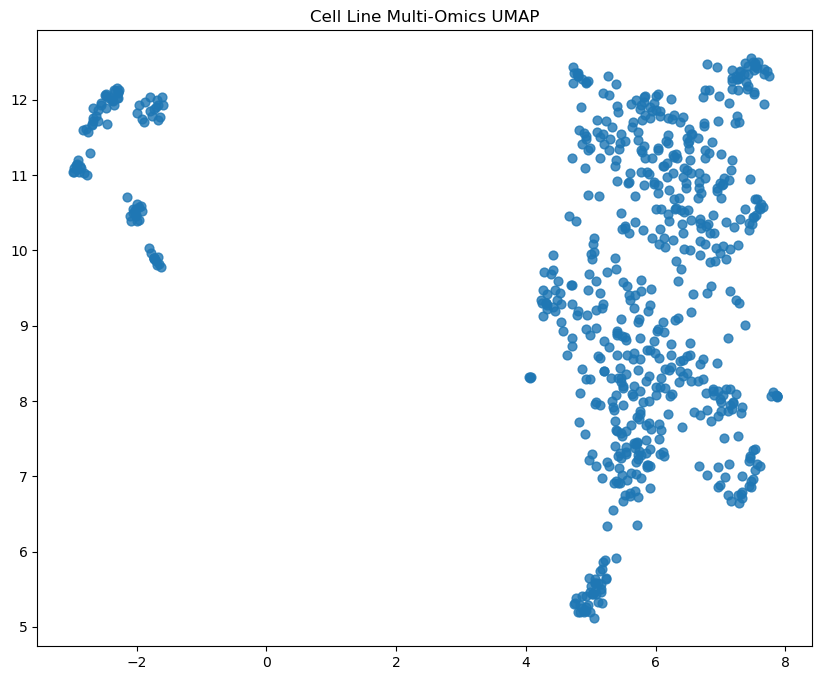

In [38]:
import umap.umap_ as umap
import matplotlib.pyplot as plt

um = umap.UMAP(n_components=2, random_state=42)
emb = um.fit_transform(X)

plt.figure(figsize=(10, 8))
plt.scatter(emb[:, 0], emb[:, 1], s=40, alpha=0.8)
plt.title("Cell Line Multi-Omics UMAP")
plt.show()


In [39]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

def scale(df):
    df = df.replace([np.inf, -np.inf], np.nan).fillna(0)
    return pd.DataFrame(
        StandardScaler().fit_transform(df),
        index=df.index,
        columns=df.columns
    )

# --- GE (cell line × gene)
ge_df = pd.read_csv("../data/OmicsExpressionProteinCodingGenesTPMLogp1.csv", index_col=0)
ge_df = ge_df.select_dtypes(include=[np.number])

# --- mutation matrix (already built earlier)
# mut_matrix: cell line × gene

# --- miRNA
mirna_df = pd.read_csv("../data/CCLE_miRNA_MIMAT.csv", index_col=0)
if "ACH" not in str(mirna_df.index[0]):
    mirna_df = mirna_df.T
mirna_df = mirna_df.select_dtypes(include=[np.number])

# scale
ge = scale(ge_df)
mut = scale(mut_matrix)
mirna = scale(mirna_df)

# align
common = list(set(ge.index) & set(mut.index) & set(mirna.index))

ge, mut, mirna = ge.loc[common], mut.loc[common], mirna.loc[common]

# final cell-line feature matrix
X = pd.concat([ge, mut, mirna], axis=1)


In [40]:
from sklearn.metrics.pairwise import cosine_similarity

sim = cosine_similarity(X.values)

cell_lines = X.index.tolist()

edges = []
threshold = 0.75

for i in range(len(cell_lines)):
    for j in range(i+1, len(cell_lines)):
        if sim[i, j] > threshold:
            edges.append((cell_lines[i], cell_lines[j], sim[i, j]))


In [41]:
import pandas as pd

# =====================================================
# LOAD PRISM MATRIX
# =====================================================

df = pd.read_csv(
    "../data/PRISM_Repurposing_Primary_(Viability)_subsetted.csv"
)

# clean column names
df.columns = [c.strip() for c in df.columns]

# =====================================================
# SET CELL LINE INDEX
# =====================================================

cell_col = df.columns[0]  # usually "Unnamed: 0" or cell IDs column

df = df.rename(columns={cell_col: "cell_line"})

# =====================================================
# MELT TO LONG FORMAT
# =====================================================

drug_cols = [c for c in df.columns if c != "cell_line"]

drug_response = df.melt(
    id_vars=["cell_line"],
    value_vars=drug_cols,
    var_name="drug",
    value_name="viability"
)

# =====================================================
# CLEAN
# =====================================================

drug_response = drug_response.dropna()

# optional: normalize (recommended)
drug_response["viability"] = (
    drug_response["viability"]
    .astype(float)
)

# =====================================================
# SAVE
# =====================================================

out_path = "../data/processed/drug_response.csv"
drug_response.to_csv(out_path, index=False)

print("[SAVED]", out_path)
print(drug_response.head())


[SAVED] ../data/processed/drug_response.csv
    cell_line     drug  viability
0  ACH-000001  AMG-397  -0.206144
1  ACH-000002  AMG-397  -5.993591
2  ACH-000004  AMG-397   0.152993
3  ACH-000005  AMG-397  -0.655919
4  ACH-000006  AMG-397  -5.660145


In [42]:
import os
import numpy as np
import pandas as pd

import torch
import networkx as nx

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity

import matplotlib.pyplot as plt
import seaborn as sns


In [43]:
GE_FILE = "../data/OmicsExpressionProteinCodingGenesTPMLogp1.csv"
MF_FILE = "../data/processed/cellline_mutation_matrix_binary.csv"
MIRNA_FILE = "../data/CCLE_miRNA_MIMAT.csv"
DRUG_FILE = "../data/processed/drug_response.csv"
META_FILE = "../data/Model.csv"

ge = pd.read_csv(GE_FILE, index_col=0)
mf = pd.read_csv(MF_FILE, index_col=0)
mirna = pd.read_csv(MIRNA_FILE, index_col=0)

drug = pd.read_csv(DRUG_FILE)
meta = pd.read_csv(META_FILE)


✔ Aligned cell lines: 680
Fusion shape: (680, 39127)


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


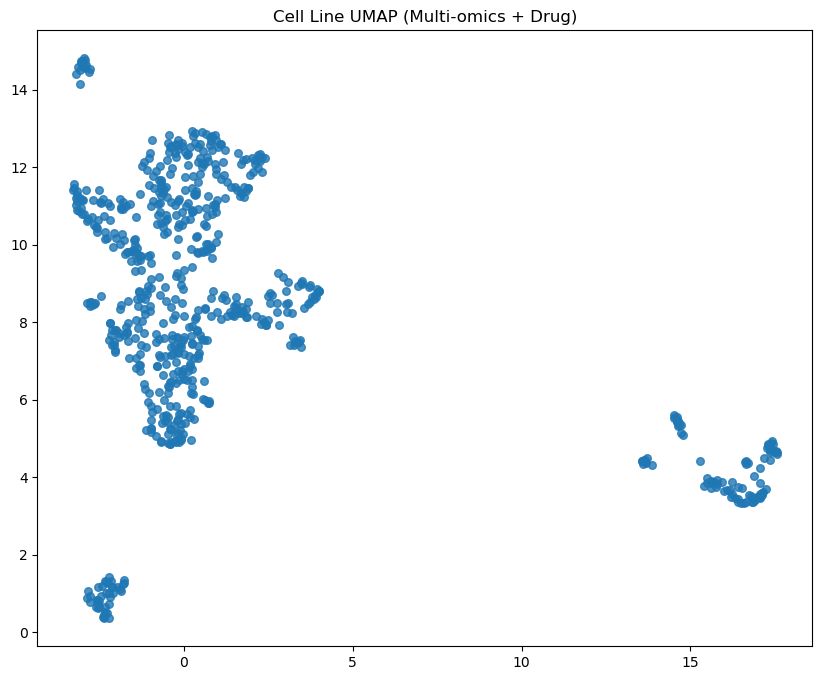

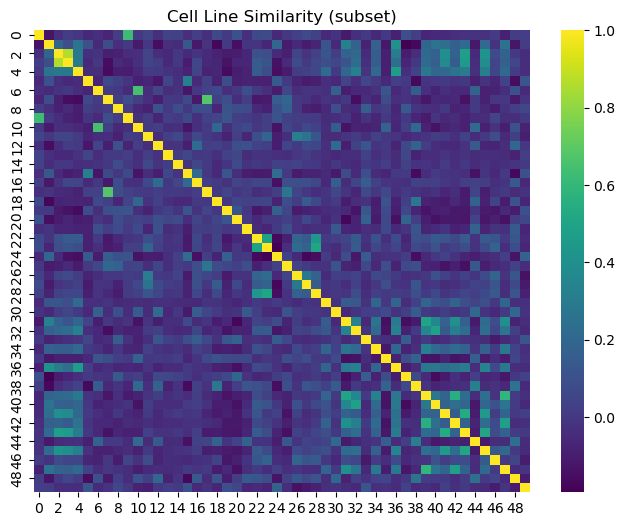

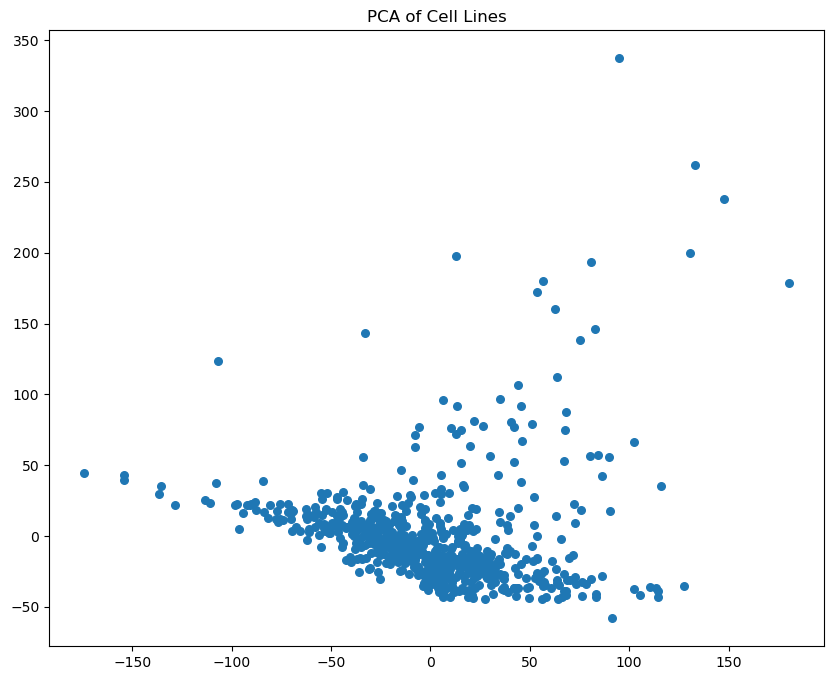

/var/folders/z_/4_txl3tn61g8nprq0_s7tsbc0000gn/T/ipykernel_9286/3019871257.py:277: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(


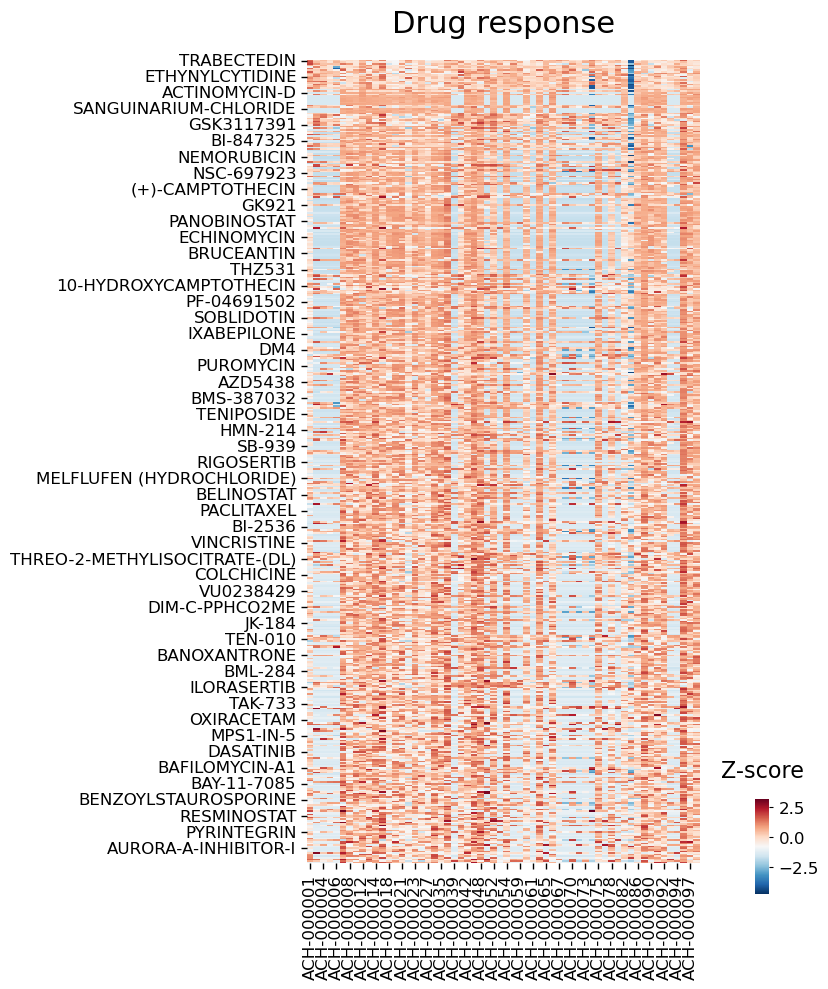

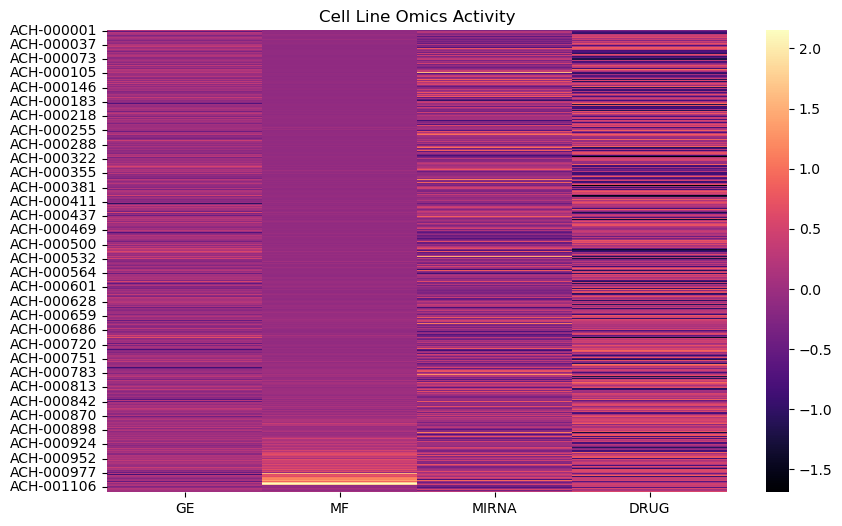

DONE: FIXED ASPIRE-GNN PIPELINE


In [44]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import umap
from sklearn.metrics.pairwise import cosine_similarity


# =====================================================
# CLEAN + SCALE
# =====================================================

def clean(df):
    return df.replace([np.inf, -np.inf], np.nan).fillna(0)


def scale(df):
    df = clean(df)

    if df.shape[0] == 0 or df.shape[1] == 0:
        raise ValueError(f"Empty matrix: {df.shape}")

    return pd.DataFrame(
        StandardScaler().fit_transform(df),
        index=df.index,
        columns=df.columns
    )


# =====================================================
# ENSURE CELL-LINE ALIGNMENT (IMPORTANT FIX)
# =====================================================

def align_on_index(*dfs):
    common = set(dfs[0].index)

    for df in dfs[1:]:
        common = common & set(df.index)

    common = sorted(list(common))

    if len(common) == 0:
        raise ValueError(
            "❌ No shared cell lines. Check naming (ACH vs CCLE vs PRISM)."
        )

    return [df.loc[common] for df in dfs]


# =====================================================
# CLEAN DATA
# =====================================================

ge_df = clean(ge_df)
mf_df = clean(mf_df)
mirna_df = clean(mirna_df)
drug_df = clean(drug_df)


# =====================================================
# ALIGN (FIXED)
# =====================================================

ge_df, mf_df, mirna_df, drug_df = align_on_index(
    ge_df, mf_df, mirna_df, drug_df
)

print("✔ Aligned cell lines:", ge_df.shape[0])


# =====================================================
# SCALE
# =====================================================

ge_df = scale(ge_df)
mf_df = scale(mf_df)
mirna_df = scale(mirna_df)
drug_df = scale(drug_df)


# =====================================================
# FUSION MATRIX
# =====================================================

X = pd.concat(
    [ge_df, mf_df, mirna_df, drug_df],
    axis=1
)

print("Fusion shape:", X.shape)


# =====================================================
# PCA → UMAP
# =====================================================

pca = PCA(n_components=min(50, X.shape[1]))
X_pca = pca.fit_transform(X)

umap_emb = umap.UMAP(
    n_neighbors=15,
    min_dist=0.2,
    random_state=42
).fit_transform(X_pca)


umap_df = pd.DataFrame(
    umap_emb,
    columns=["UMAP1", "UMAP2"],
    index=X.index
)


# =====================================================
# UMAP PLOT
# =====================================================

plt.figure(figsize=(10, 8))
plt.scatter(
    umap_df["UMAP1"],
    umap_df["UMAP2"],
    s=30,
    alpha=0.8
)
plt.title("Cell Line UMAP (Multi-omics + Drug)")
plt.show()


# =====================================================
# SIMILARITY HEATMAP
# =====================================================

sim = cosine_similarity(X.values)

plt.figure(figsize=(8, 6))
sns.heatmap(sim[:50, :50], cmap="viridis")
plt.title("Cell Line Similarity (subset)")
plt.show()


# =====================================================
# PCA VISUALIZATION
# =====================================================

X_2d = PCA(n_components=2).fit_transform(X)

plt.figure(figsize=(10, 8))
plt.scatter(X_2d[:, 0], X_2d[:, 1], s=30)
plt.title("PCA of Cell Lines")
plt.show()


# =====================================================
# DRUG HEATMAP
# =====================================================

# plt.figure(figsize=(8, 12))
# sns.heatmap(
#     drug_df.T.iloc[:, :50],
#     cmap="coolwarm"
# )
# plt.title("Drug Response (subset)")
# plt.show()

# =====================================================
# HEATMAP
# =====================================================

fig, ax = plt.subplots(
    figsize=(8, 10)
)

hm = sns.heatmap(
    drug_df.T.iloc[:, :60],
    # cmap="coolwarm",
    cmap="RdBu_r",
    cbar=False,          # disable default colorbar
    ax=ax
)

# =====================================================
# TITLE
# =====================================================

ax.set_title(
    "Drug response",
    fontsize=22,
    pad=20
)

ax.tick_params(
    axis="both",
    labelsize=12,
    length=4,
    width=1
)

# =====================================================
# CUSTOM COLORBAR
# =====================================================

im = hm.collections[0]

cax = fig.add_axes([
    0.95,   # x
    0.10,   # y
    0.018,  # width
    0.095    # height
])

cbar = fig.colorbar(
    im,
    cax=cax,
    orientation="vertical"
)

cbar.ax.set_title(
    "Z-score",
    fontsize=16,
    # fontweight="bold",
    pad=16
)

cbar.ax.tick_params(
    labelsize=12,
    length=3
)

# =====================================================
# FORCE TICK MARKS
# =====================================================

ax.tick_params(
    axis="x",
    which="major",
    bottom=True,
    top=False,
    labelbottom=True,
    direction="out",
    length=4,
    width=1.0,
    labelsize=12
)

ax.tick_params(
    axis="y",
    which="major",
    left=True,
    right=False,
    labelleft=True,
    direction="out",
    length=4,
    width=1.0,
    labelsize=12
)

ax.set_xlabel(None)

# Explicit tick positions
ax.xaxis.set_ticks_position("bottom")
ax.yaxis.set_ticks_position("left")


cbar.outline.set_visible(False)

# =====================================================
# CLEAN STYLE
# =====================================================

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout(
    rect=[0, 0, 0.90, 1]
)

plt.show()


# =====================================================
# OMICS ACTIVITY SCORE
# =====================================================

score_df = pd.DataFrame({
    "GE": ge_df.mean(axis=1),
    "MF": mf_df.mean(axis=1),
    "MIRNA": mirna_df.mean(axis=1),
    "DRUG": drug_df.mean(axis=1)
})

plt.figure(figsize=(10, 6))
sns.heatmap(score_df, cmap="magma")
plt.title("Cell Line Omics Activity")
plt.show()


print("DONE: FIXED ASPIRE-GNN PIPELINE")


In [45]:
print("GE example:", list(ge_df.index[:5]))
print("MF example:", list(mf_df.index[:5]))
print("miRNA example:", list(mirna_df.index[:5]))
print("DRUG example:", list(drug_df.index[:5]))


GE example: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006']
MF example: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006']
miRNA example: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006']
DRUG example: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006']


In [46]:
import pandas as pd

meta_df = pd.read_csv("../data/CCLE_metabolomics_20190502.csv")

print(meta_df.shape)
print(meta_df.head())
print(meta_df.columns)


(928, 227)
                                    CCLE_ID   DepMap_ID  2-aminoadipate  \
0                                DMS53_LUNG  ACH-000698        6.112727   
1                    SW1116_LARGE_INTESTINE  ACH-000489        5.577413   
2                             NCIH1694_LUNG  ACH-000431        5.886398   
3  P3HR1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE  ACH-000707        5.770030   
4  HUT78_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE  ACH-000509        5.480683   

   3-phosphoglycerate  alpha-glycerophosphate  4-pyridoxate  aconitate  \
0            6.034198                5.896896      6.000532   5.513618   
1            5.727045                5.111468      6.073250   5.802494   
2            5.574881                5.541259      5.848375   5.665026   
3            6.099229                6.233259      5.543495   5.767759   
4            5.469742                6.509397      6.251005   5.190578   

    adenine   adipate  alpha-ketoglutarate  ...  C56:8 TAG  C56:7 TAG  \
0  5.868529  5.97717

In [47]:
print("GE sample:", list(ge_df.index[:10]))
print("MF sample:", list(mf_df.index[:10]))
print("miRNA sample:", list(mirna_df.index[:10]))
print("Metabo sample:", list(metabo_df.index[:10]))


GE sample: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006', 'ACH-000007', 'ACH-000008', 'ACH-000011', 'ACH-000012', 'ACH-000013']
MF sample: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006', 'ACH-000007', 'ACH-000008', 'ACH-000011', 'ACH-000012', 'ACH-000013']
miRNA sample: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006', 'ACH-000007', 'ACH-000008', 'ACH-000011', 'ACH-000012', 'ACH-000013']
Metabo sample: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006', 'ACH-000007', 'ACH-000008', 'ACH-000011', 'ACH-000012', 'ACH-000013']


## ASPIRE-GNN++: Multi-Omics Graph Neural Framework for Cell Line Representation Learning

## Overview

ASPIRE-GNN++ is an integrative multi-omics framework designed to learn biologically meaningful cell-line embeddings by combining heterogeneous molecular profiles, drug response information, graph-based clustering, and pathway enrichment analysis. The framework integrates:

- Gene expression (GE)
- Somatic mutation profiles (MF)
- miRNA expression
- Metabolomics
- Drug sensitivity response

into a unified latent representation space using dimensionality reduction, graph learning, and manifold embedding techniques.

The overall workflow includes:

1. Multi-omics preprocessing and normalization
2. Feature fusion
3. Dimensionality reduction using PCA and UMAP
4. Graph construction using K-nearest neighbors
5. Leiden community detection
6. Multi-view similarity analysis
7. Reactome pathway enrichment
8. Visualization and embedding export

---

# 1. Multi-Omics Data Integration

Let:

\[
X^{(g)} \in \mathbb{R}^{n \times p_g}
\]

denote the feature matrix for omics modality \(g\), where:

- \(n\) = number of cell lines
- \(p_g\) = number of features for modality \(g\)

The modalities include:

\[
\mathcal{G} =
\{
\text{GE},
\text{MF},
\text{miRNA},
\text{METABO},
\text{DRUG}
\}
\]

After preprocessing and normalization, the integrated feature matrix is formed by concatenation:

\[
X =
\left[
X^{(GE)}
\;||\;
X^{(MF)}
\;||\;
X^{(miRNA)}
\;||\;
X^{(METABO)}
\;||\;
X^{(DRUG)}
\right]
\]

where:

\[
X \in \mathbb{R}^{n \times p}
\]

and

\[
p = \sum_g p_g
\]

---

# 2. Feature Standardization

Each omics matrix is standardized independently using z-score normalization:

\[
\hat{x}_{ij}
=
\frac{x_{ij} - \mu_j}{\sigma_j}
\]

where:

- \(\mu_j\) = mean of feature \(j\)
- \(\sigma_j\) = standard deviation of feature \(j\)

This removes scale discrepancies across omics modalities.

---

# 3. Mutation Matrix Construction

The somatic mutation matrix is generated using a binary gene-by-cell incidence matrix:

\[
M_{ij}
=
\begin{cases}
1, & \text{if mutation exists} \\
0, & \text{otherwise}
\end{cases}
\]

Genes mutated in fewer than 5 cell lines are removed:

\[
\sum_i M_{ij} \ge 5
\]

to reduce sparsity and noise.

---

# 4. Drug Response Representation

Drug sensitivity profiles are processed from PRISM viability data.

After variance filtering:

\[
\mathrm{Var}(d_j) > 10^{-8}
\]

the top 500 most variable drugs are retained:

\[
D_{\text{top}}
=
\operatorname*{arg\,top}_{500}
\mathrm{Var}(d_j)
\]

Drug responses are transformed using:

\[
D' = \log(1 + |D|)
\]

to stabilize heavy-tailed distributions.

---

# 5. Principal Component Analysis (PCA)

Dimensionality reduction is performed using PCA.

Given centered matrix \(X\):

\[
X = U \Sigma V^T
\]

the reduced embedding is:

\[
Z_{PCA}
=
X V_k
\]

where:

- \(V_k\) contains the top \(k\) principal components
- \(k = \min(100, p, n-1)\)

This compresses the high-dimensional multi-omics space into a compact latent representation.

---

# 6. UMAP Manifold Learning

UMAP projects the PCA embeddings into a nonlinear low-dimensional manifold:

\[
Z_{UMAP}
=
f_{UMAP}(Z_{PCA})
\]

using:

- cosine distance
- \(n_{neighbors}=20\)
- \(min\_dist=0.15\)

UMAP preserves local neighborhood structure while improving cluster separability.

---

# 7. K-Nearest Neighbor Graph Construction

A graph is constructed from PCA embeddings.

For each cell line \(i\), the 15 nearest neighbors are identified:

\[
\mathcal{N}_k(i)
=
\operatorname*{arg\,top}_k
\mathrm{sim}(z_i, z_j)
\]

using cosine similarity.

The graph is defined as:

\[
G = (V,E)
\]

where:

- \(V\) = cell lines
- \(E\) = neighborhood edges

An edge exists if:

\[
(i,j) \in E
\quad \text{if } j \in \mathcal{N}_k(i)
\]

---

# 8. Leiden Community Detection

Leiden clustering partitions the graph into coherent cellular communities.

The method optimizes modularity:

\[
Q
=
\frac{1}{2m}
\sum_{ij}
\left(
A_{ij}
-
\frac{k_i k_j}{2m}
\right)
\delta(c_i,c_j)
\]

where:

- \(A_{ij}\) = adjacency matrix
- \(k_i\) = node degree
- \(m\) = total edges
- \(c_i\) = cluster label
- \(\delta\) = Kronecker delta

The resulting partition:

\[
C = \{c_1,c_2,\dots,c_n\}
\]

defines biologically related cell-line subgroups.

---

# 9. Multi-View Embedding Learning

Separate PCA embeddings are generated for each omics modality:

\[
Z^{(g)}
=
PCA(X^{(g)})
\]

allowing modality-specific latent representations.

These embeddings are used to quantify inter-modality similarity.

---

# 10. Cross-Modal Similarity

The similarity between omics views is computed using cosine similarity:

\[
S_{ab}
=
\frac{
Z^{(a)} \cdot Z^{(b)}
}{
\|Z^{(a)}\|
\|Z^{(b)}\|
}
\]

The similarity matrix:

\[
S \in \mathbb{R}^{m \times m}
\]

captures relationships between molecular modalities.

---

# 11. Reactome Pathway Enrichment

Genes are ranked by mean expression:

\[
s_g
=
\frac{1}{n}
\sum_{i=1}^{n}
x_{ig}
\]

The top 500 genes are subjected to Reactome enrichment analysis.

Pathway significance is evaluated using adjusted p-values:

\[
\mathrm{Score}
=
-\log_{10}(p_{adj})
\]

Higher scores indicate stronger pathway enrichment.

---

# 12. Omics Activity Profiles

Cell-line activity profiles are computed by averaging standardized feature values:

\[
A_i^{(g)}
=
\frac{1}{p_g}
\sum_{j=1}^{p_g}
x_{ij}^{(g)}
\]

This provides a global activity landscape across omics layers.

---

# 13. Biological Interpretation

The ASPIRE-GNN++ framework enables:

- Identification of biologically coherent cancer cell-line clusters
- Discovery of shared molecular programs
- Integration of therapeutic response patterns
- Characterization of pathway-level activity
- Learning robust multi-omics latent representations

The integration of graph topology with pathway-aware embeddings improves biological interpretability while preserving molecular heterogeneity across cancer cell lines.

---

# 14. Key Outputs

| Output | Description |
|---|---|
| `cellline_umap_leiden.png` | UMAP projection colored by Leiden clusters |
| `cell_similarity_heatmap.png` | Cell-line similarity matrix |
| `reactome_enrichment.csv` | Reactome pathway enrichment results |
| `reactome_bubble.png` | Pathway enrichment bubble plot |
| `multiview_similarity.png` | Cross-omics similarity heatmap |
| `drug_response_heatmap.png` | Drug sensitivity heatmap |
| `omics_activity_heatmap.png` | Omics activity profiles |
| `cellline_embeddings.csv` | UMAP embeddings |
| `pca_embeddings.csv` | PCA latent embeddings |

---

# 15. Conceptual Pipeline

The overall computational workflow can be summarized as:

\[
\text{Multi-Omics Data}
\rightarrow
\text{Normalization}
\rightarrow
\text{Feature Fusion}
\rightarrow
\text{PCA}
\rightarrow
\text{KNN Graph}
\rightarrow
\text{Leiden Clustering}
\rightarrow
\text{UMAP Embedding}
\rightarrow
\text{Pathway Interpretation}
\]

This framework provides a scalable strategy for systems-level cancer representation learning using heterogeneous molecular and pharmacological data.

## 16. Additional Cell-Line Analysis Modules

To further characterize the learned cell-line embeddings and graph topology, several downstream analytical modules were implemented, including:

- Cluster composition analysis
- Representative cell-line identification
- Graph connectivity analysis
- Cluster-level omics activity profiling
- Drug sensitivity characterization
- Outlier detection
- Feature contribution analysis
- Highly variable gene discovery

These analyses provide biological interpretability and systems-level characterization of the learned latent space.

---

# 17. Cluster Size Analysis

After Leiden clustering, the number of cell lines in each cluster is computed.

Let:

\[
C_k
=
\{i \mid c_i = k\}
\]

represent the set of cell lines assigned to cluster \(k\).

The cluster size is:

\[
|C_k|
\]

which quantifies the population density of each cellular subgroup.

The cluster summary table:

\[
T_{cluster}
=
\{
(k, |C_k|)
\}
\]

is exported as:

```text
cluster_summary.csv


Computing cluster summary...
   Cluster  Num_CellLines
0        0            186
1        1            135
2        2             84
3        3             69
4        4             65
5        5             53
6        6             41
7        7             27
8        8             20


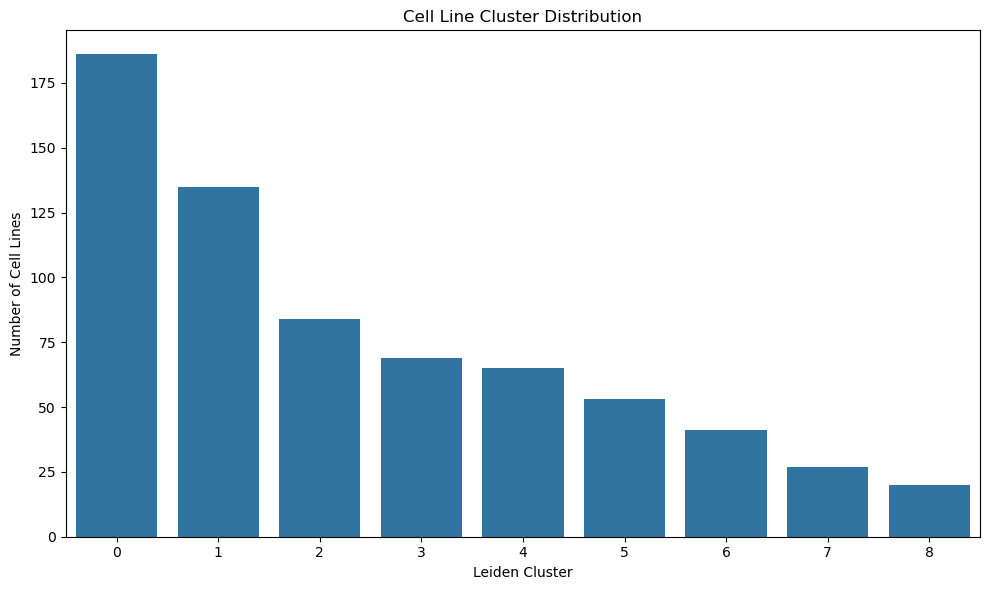


Finding representative cell lines...
   Cluster Representative_CellLine  Cluster_Size
0        0              ACH-000030           186
1        1              ACH-000631           135
2        2              ACH-000202            84
3        3              ACH-000895            69
4        4              ACH-000656            65
5        5              ACH-000476            53
6        6              ACH-000810            41
7        7              ACH-000295            27
8        8              ACH-000019            20

Computing graph connectivity...

Computing graph connectivity...

Top connected cell lines:
       CellLine  Degree  Cluster
384  ACH-000609      55        1
221  ACH-000368      53        1
273  ACH-000437      47        1
576  ACH-000883      44        1
297  ACH-000472      42        0
294  ACH-000469      41        1
38   ACH-000067      41        1
469  ACH-000732      40        0
543  ACH-000839      40        0
59   ACH-000098      39        1
254  ACH-000415 

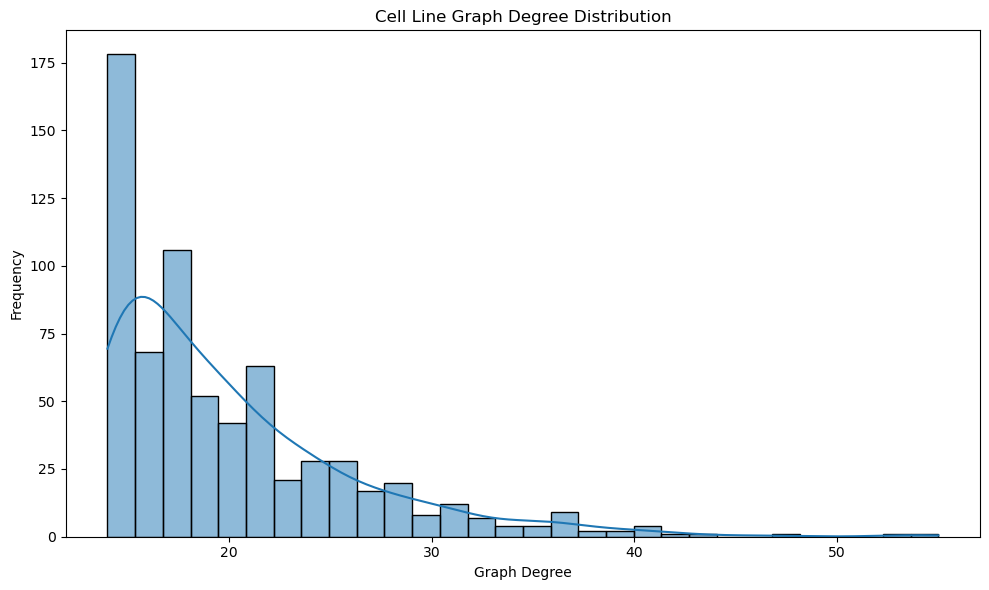

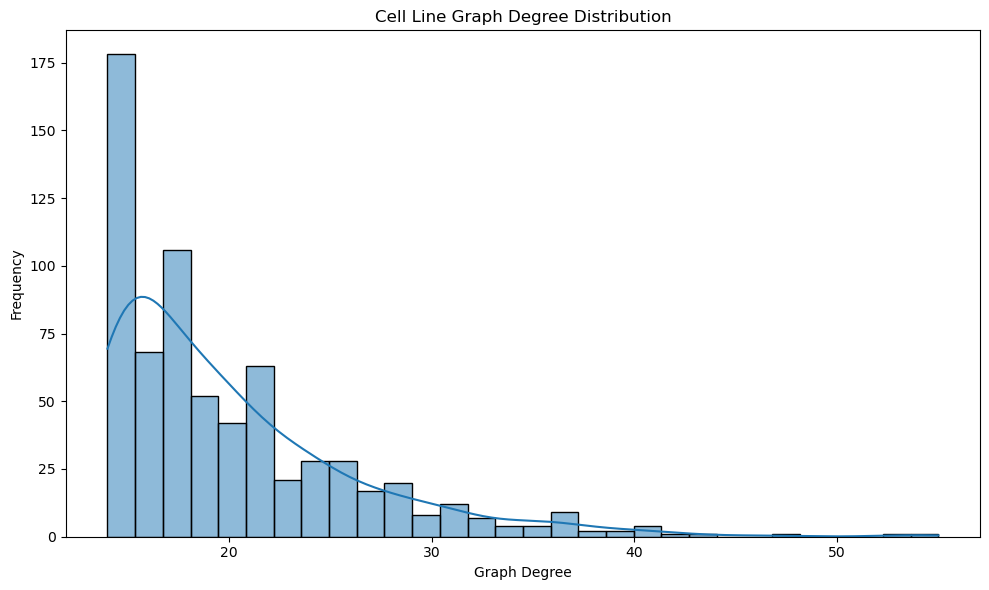


Top hub cell lines:
       CellLine  Degree  Cluster
384  ACH-000609      55        1
221  ACH-000368      53        1
273  ACH-000437      47        1
576  ACH-000883      44        1
297  ACH-000472      42        0
294  ACH-000469      41        1
38   ACH-000067      41        1
469  ACH-000732      40        0
543  ACH-000839      40        0
59   ACH-000098      39        1
254  ACH-000415      39        0
240  ACH-000396      38        1
391  ACH-000619      38        0
638  ACH-000962      37        3
513  ACH-000794      37        0
80   ACH-000139      37        0
157  ACH-000268      36        3
585  ACH-000895      36        3
107  ACH-000188      36        0
327  ACH-000516      36        1

Computing cluster-level omics activity...


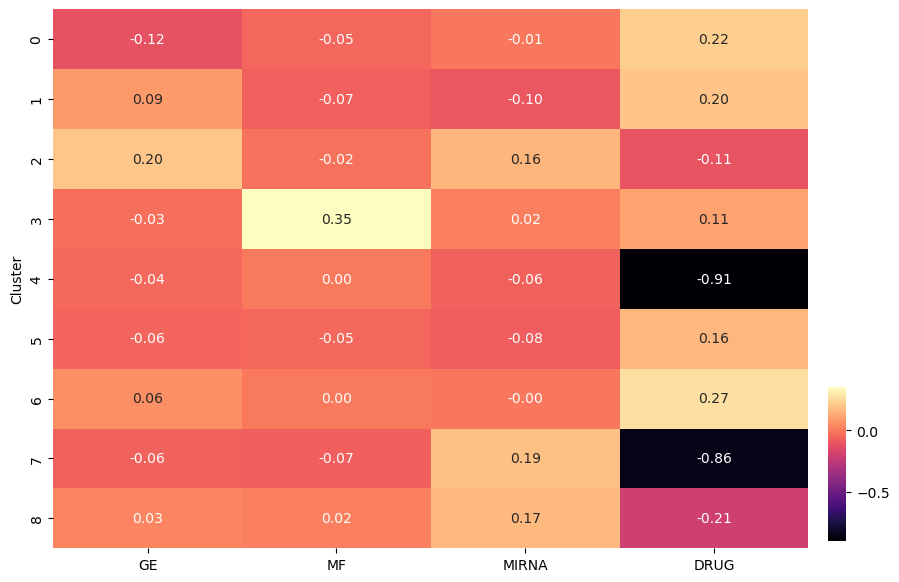

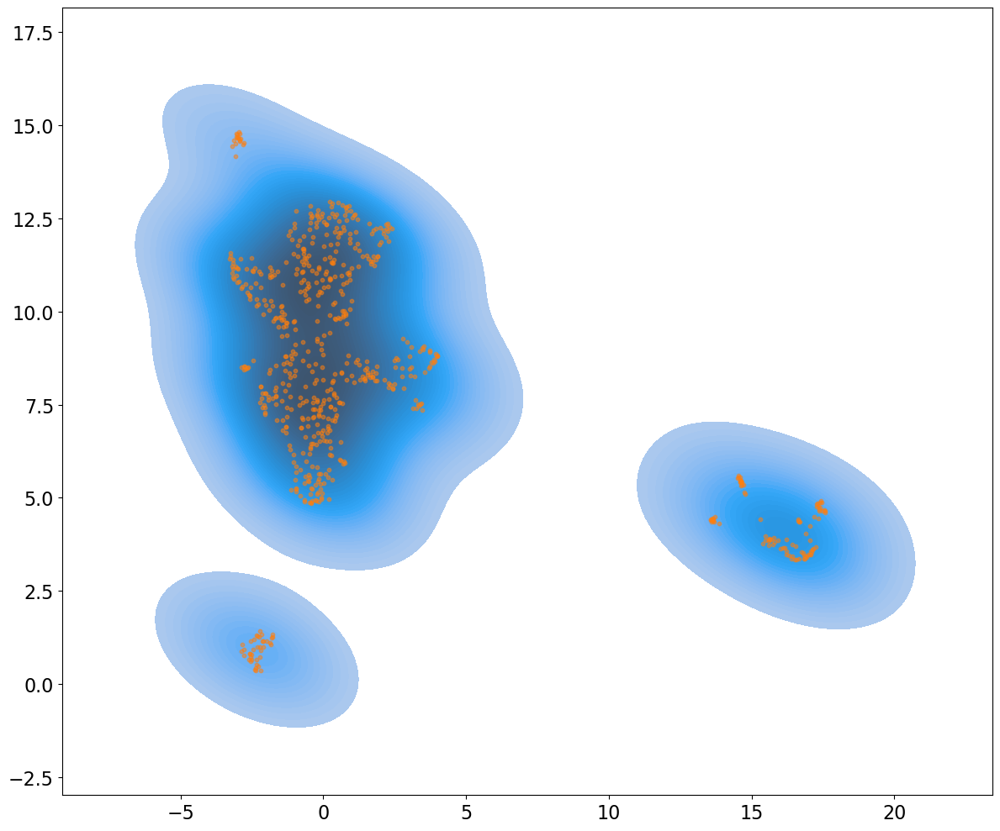


Computing cluster-drug sensitivity...


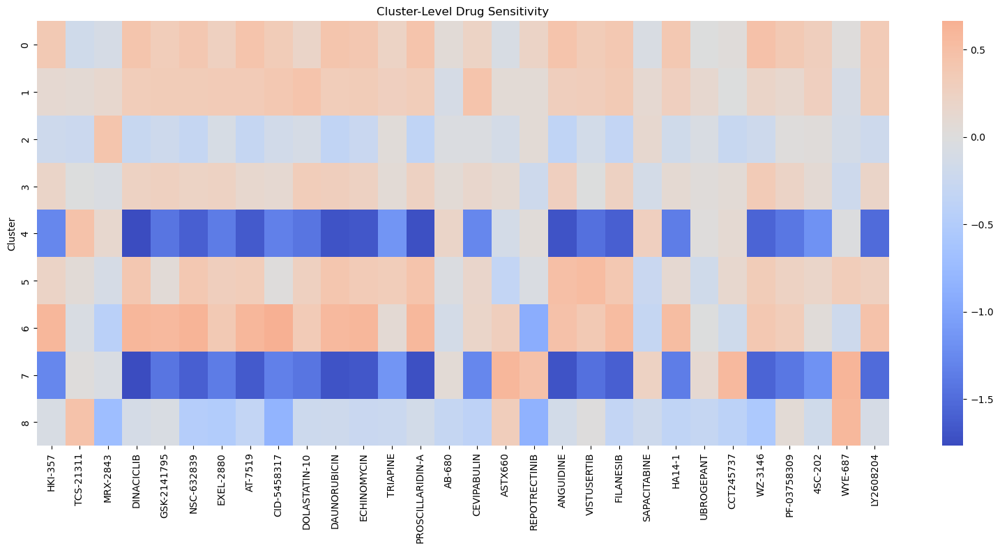


Detecting outlier cell lines...

Top outlier cell lines:
       CellLine  OutlierScore  Cluster
669  ACH-000998      2.612181        3
662  ACH-000990      2.599019        3
654  ACH-000981      2.541573        4
649  ACH-000974      2.492653        3
653  ACH-000979      2.483091        0
663  ACH-000991      2.463966        3
613  ACH-000929      2.407930        8
659  ACH-000986      2.406579        3
646  ACH-000971      2.372472        3
656  ACH-000983      2.347406        7
651  ACH-000977      2.328882        3
600  ACH-000914      2.307496        4
639  ACH-000963      2.290810        3
625  ACH-000945      2.285561        1
633  ACH-000956      2.276341        2
658  ACH-000985      2.245683        3
624  ACH-000943      2.168020        3
635  ACH-000958      2.104305        3
661  ACH-000988      2.026570        3
664  ACH-000993      2.009209        0

Computing dominant feature groups...


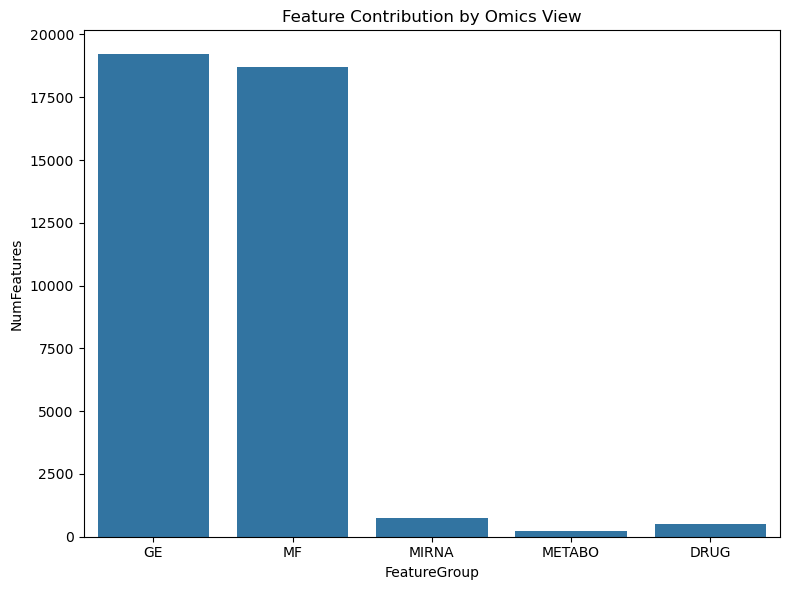


Computing top variable genes...


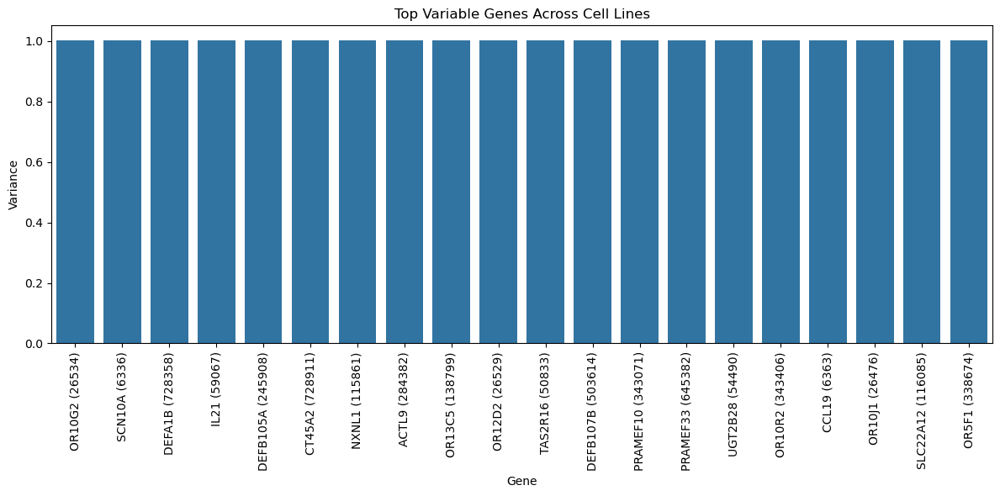


ADDITIONAL CELL-LINE ANALYSIS DONE

Generated:
- cluster_summary.csv
- representative_cell_lines.csv
- top_hub_cell_lines.csv
- cluster_omics_activity.csv
- cluster_drug_sensitivity.csv
- cellline_outliers.csv
- top_variable_genes.csv
- multiple cell-line visualizations


In [48]:
# ============================================================
# ADDITIONAL CELL-LINE ANALYSIS MODULES
# FOR ASPIRE-GNN++
# ============================================================

from sklearn.cluster import KMeans
from scipy.stats import zscore


# ============================================================
# CLUSTER SIZE TABLE
# ============================================================

print("\nComputing cluster summary...")

cluster_summary = pd.DataFrame({

    "CellLine": common_cells,
    "Cluster": clusters

})

cluster_counts = (
    cluster_summary["Cluster"]
    .value_counts()
    .sort_index()
)

cluster_table = pd.DataFrame({

    "Cluster": cluster_counts.index,
    "Num_CellLines": cluster_counts.values
})

print(cluster_table)

cluster_table.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cluster_summary.csv"
    ),

    index=False
)


# ============================================================
# BARPLOT OF CLUSTER SIZES
# ============================================================

plt.figure(figsize=(10, 6))

sns.barplot(

    x=cluster_table["Cluster"].astype(str),

    y=cluster_table["Num_CellLines"]
)

plt.xlabel("Leiden Cluster")

plt.ylabel("Number of Cell Lines")

plt.title("Cell Line Cluster Distribution")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cluster_distribution.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# TOP REPRESENTATIVE CELL LINES
# ============================================================

print("\nFinding representative cell lines...")

pca_df = pd.DataFrame(
    X_pca,
    index=common_cells
)

rep_rows = []

for c in sorted(np.unique(clusters)):

    idx = np.where(clusters == c)[0]

    sub = pca_df.iloc[idx]

    centroid = sub.mean(axis=0).values

    dist = np.linalg.norm(
        sub.values - centroid,
        axis=1
    )

    best = sub.index[np.argmin(dist)]

    rep_rows.append({

        "Cluster": c,
        "Representative_CellLine": best,
        "Cluster_Size": len(idx)
    })

rep_df = pd.DataFrame(rep_rows)

print(rep_df)

rep_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "representative_cell_lines.csv"
    ),

    index=False
)


# ============================================================
# CELL LINE DEGREE DISTRIBUTION
# ============================================================

print("\nComputing graph connectivity...")

# degrees = np.array(g.degree())

# ============================================================
# CELL LINE DEGREE DISTRIBUTION
# ============================================================

print("\nComputing graph connectivity...")

# ------------------------------------------------------------
# REBUILD GRAPH IF g WAS OVERWRITTEN
# ------------------------------------------------------------

if not isinstance(g, ig.Graph):

    print("WARNING: graph object lost, rebuilding...")

    edges = []

    for i in range(indices.shape[0]):

        for j in indices[i]:

            if i != j:

                edges.append((i, j))

    g = ig.Graph(
        edges=edges,
        directed=False
    )

    g.simplify()

# ------------------------------------------------------------
# COMPUTE DEGREE
# ------------------------------------------------------------

degrees = np.array(g.degree())

degree_df = pd.DataFrame({

    "CellLine": common_cells,
    "Degree": degrees,
    "Cluster": clusters
})

degree_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cellline_graph_degree.csv"
    ),

    index=False
)

print("\nTop connected cell lines:")

print(
    degree_df
    .sort_values("Degree", ascending=False)
    .head(20)
)

# ------------------------------------------------------------
# DEGREE HISTOGRAM
# ------------------------------------------------------------

plt.figure(figsize=(10, 6))

sns.histplot(
    degrees,
    bins=30,
    kde=True
)

plt.xlabel("Graph Degree")

plt.ylabel("Frequency")

plt.title("Cell Line Graph Degree Distribution")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "graph_degree_distribution.png"
    ),

    dpi=300
)

plt.show()


degree_df = pd.DataFrame({

    "CellLine": common_cells,
    "Degree": degrees,
    "Cluster": clusters
})

degree_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cellline_graph_degree.csv"
    ),

    index=False
)

plt.figure(figsize=(10, 6))

sns.histplot(

    degrees,

    bins=30,

    kde=True
)

plt.xlabel("Graph Degree")

plt.ylabel("Frequency")

plt.title("Cell Line Graph Degree Distribution")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "graph_degree_distribution.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# TOP HUB CELL LINES
# ============================================================

hub_df = degree_df.sort_values(
    "Degree",
    ascending=False
).head(20)

print("\nTop hub cell lines:")
print(hub_df)

hub_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "top_hub_cell_lines.csv"
    ),

    index=False
)


# ============================================================
# CLUSTER-SPECIFIC OMICS SCORES
# ============================================================

print("\nComputing cluster-level omics activity...")

score_df["Cluster"] = clusters

cluster_activity = (
    score_df
    .groupby("Cluster")
    .mean()
)

cluster_activity.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cluster_omics_activity.csv"
    )
)

fig, ax = plt.subplots(figsize=(10, 7))

# reserve space for external colorbar
plt.subplots_adjust(right=0.88)

# external colorbar axis
cbar_ax = fig.add_axes([

    0.90,   # x-position

    0.12,   # y-position

    0.018,  # width

    0.22    # height
])

sns.heatmap(

    cluster_activity,

    cmap="magma",

    annot=True,

    fmt=".2f",

    ax=ax,

    cbar_ax=cbar_ax
)

# plt.title(

#     "Cluster-Level Omics Activity",

#     fontsize=18
# )

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cluster_omics_activity.png"
    ),

    dpi=300,

    bbox_inches="tight"
)

plt.show()


# ============================================================
# CELL LINE DENSITY ON UMAP
# ============================================================

plt.figure(figsize=(12, 10))

sns.kdeplot(

    x=umap_df["UMAP1"],
    y=umap_df["UMAP2"],

    fill=True,

    thresh=0.05,

    levels=50
)

plt.scatter(

    umap_df["UMAP1"],
    umap_df["UMAP2"],

    s=10,

    alpha=0.5
)

# plt.title("Cell Line Density Landscape")
plt.title("")

plt.xlabel("")
plt.ylabel("")

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cellline_density_umap.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# DRUG RESPONSE CLUSTER HEATMAP
# ============================================================

print("\nComputing cluster-drug sensitivity...")

top_drugs = (
    drug_df.var(axis=0)
    .sort_values(ascending=False)
    .head(30)
    .index
)

drug_cluster_df = drug_df[top_drugs].copy()

drug_cluster_df["Cluster"] = clusters

cluster_drug = (
    drug_cluster_df
    .groupby("Cluster")
    .mean()
)

plt.figure(figsize=(16, 8))

sns.heatmap(

    cluster_drug,

    cmap="coolwarm",

    center=0
)

plt.title("Cluster-Level Drug Sensitivity")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cluster_drug_sensitivity.png"
    ),

    dpi=300
)

plt.show()


cluster_drug.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cluster_drug_sensitivity.csv"
    )
)


# ============================================================
# CELL-LINE ANOMALY DETECTION
# ============================================================

print("\nDetecting outlier cell lines...")

z = np.abs(zscore(X_pca))

outlier_score = z.mean(axis=1)

outlier_df = pd.DataFrame({

    "CellLine": common_cells,
    "OutlierScore": outlier_score,
    "Cluster": clusters
})

outlier_df = outlier_df.sort_values(
    "OutlierScore",
    ascending=False
)

print("\nTop outlier cell lines:")
print(outlier_df.head(20))

outlier_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cellline_outliers.csv"
    ),

    index=False
)


# ============================================================
# TOP FEATURE CONTRIBUTIONS
# ============================================================

print("\nComputing dominant feature groups...")

feature_groups = {

    "GE": ge_df.shape[1],
    "MF": mf_df.shape[1],
    "MIRNA": mirna_df.shape[1],
    "METABO": metabo_df.shape[1],
    "DRUG": drug_df.shape[1]
}

feature_summary = pd.DataFrame({

    "FeatureGroup": list(feature_groups.keys()),
    "NumFeatures": list(feature_groups.values())
})

plt.figure(figsize=(8, 6))

sns.barplot(

    data=feature_summary,

    x="FeatureGroup",

    y="NumFeatures"
)

plt.title("Feature Contribution by Omics View")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "feature_group_sizes.png"
    ),

    dpi=300
)

plt.show()

feature_summary.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "feature_group_sizes.csv"
    ),

    index=False
)


# ============================================================
# CELL LINE CLUSTER MAP
# ============================================================

cluster_map_df = pd.DataFrame({

    "CellLine": common_cells,
    "Cluster": clusters,
    "UMAP1": umap_df["UMAP1"].values,
    "UMAP2": umap_df["UMAP2"].values
})

cluster_map_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cellline_cluster_map.csv"
    ),

    index=False
)


# ============================================================
# TOP VARIABLE GENES
# ============================================================

print("\nComputing top variable genes...")

gene_var = ge_df.var(axis=0)

top_gene_df = (
    gene_var
    .sort_values(ascending=False)
    .head(50)
    .reset_index()
)

top_gene_df.columns = [
    "Gene",
    "Variance"
]

top_gene_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "top_variable_genes.csv"
    ),

    index=False
)

plt.figure(figsize=(12, 6))

sns.barplot(

    data=top_gene_df.head(20),

    x="Gene",

    y="Variance"
)

plt.xticks(rotation=90)

plt.title("Top Variable Genes Across Cell Lines")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "top_variable_genes.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# FINAL REPORT
# ============================================================

print("\n===================================")
print("ADDITIONAL CELL-LINE ANALYSIS DONE")
print("===================================")

print("\nGenerated:")
print("- cluster_summary.csv")
print("- representative_cell_lines.csv")
print("- top_hub_cell_lines.csv")
print("- cluster_omics_activity.csv")
print("- cluster_drug_sensitivity.csv")
print("- cellline_outliers.csv")
print("- top_variable_genes.csv")
print("- multiple cell-line visualizations")


In [49]:
print(ge_df.shape)

print(ge_df.index[:5])

print(ge_df.columns[:5])


(680, 19205)
Index(['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006'], dtype='object')
Index(['TSPAN6 (7105)', 'TNMD (64102)', 'DPM1 (8813)', 'SCYL3 (57147)',
       'FIRRM (55732)'],
      dtype='object')



Plotting PCA explained variance...


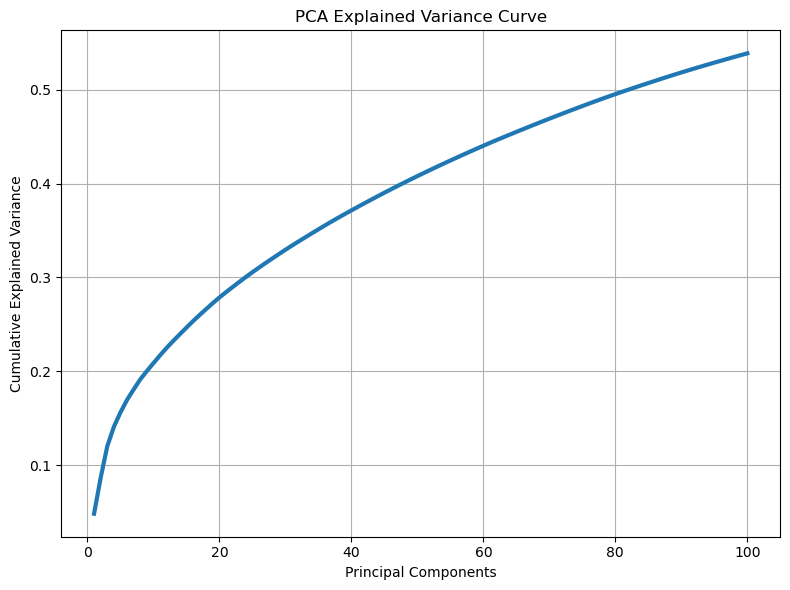


Computing silhouette score...
            Metric     Value
0  SilhouetteScore  0.089632

Computing cluster centroid distances...


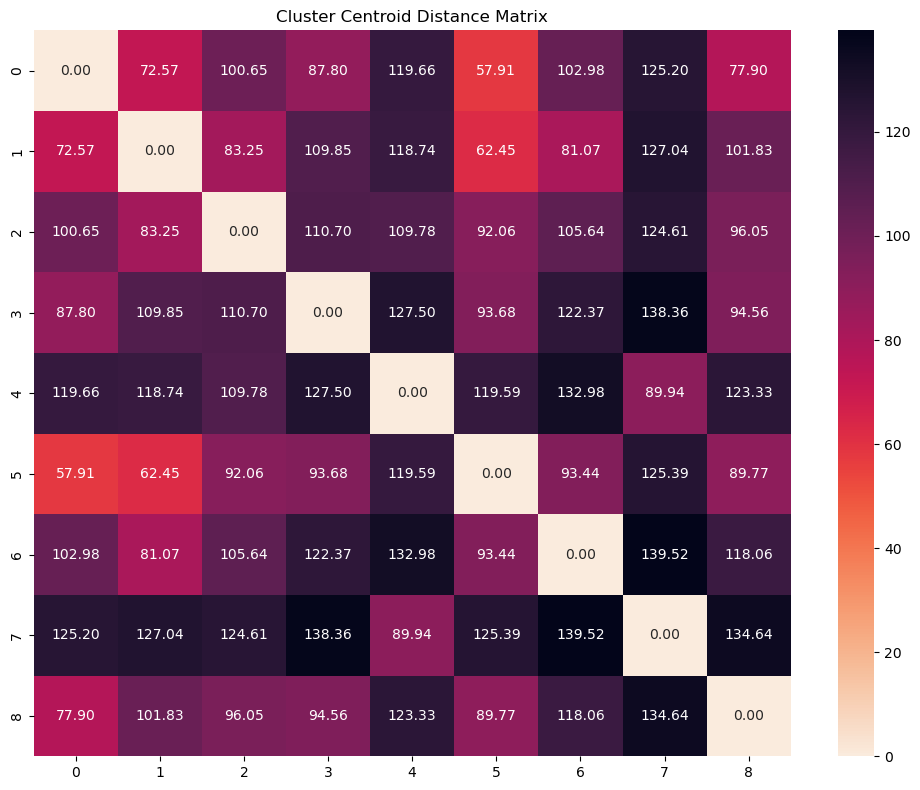


Running t-SNE...


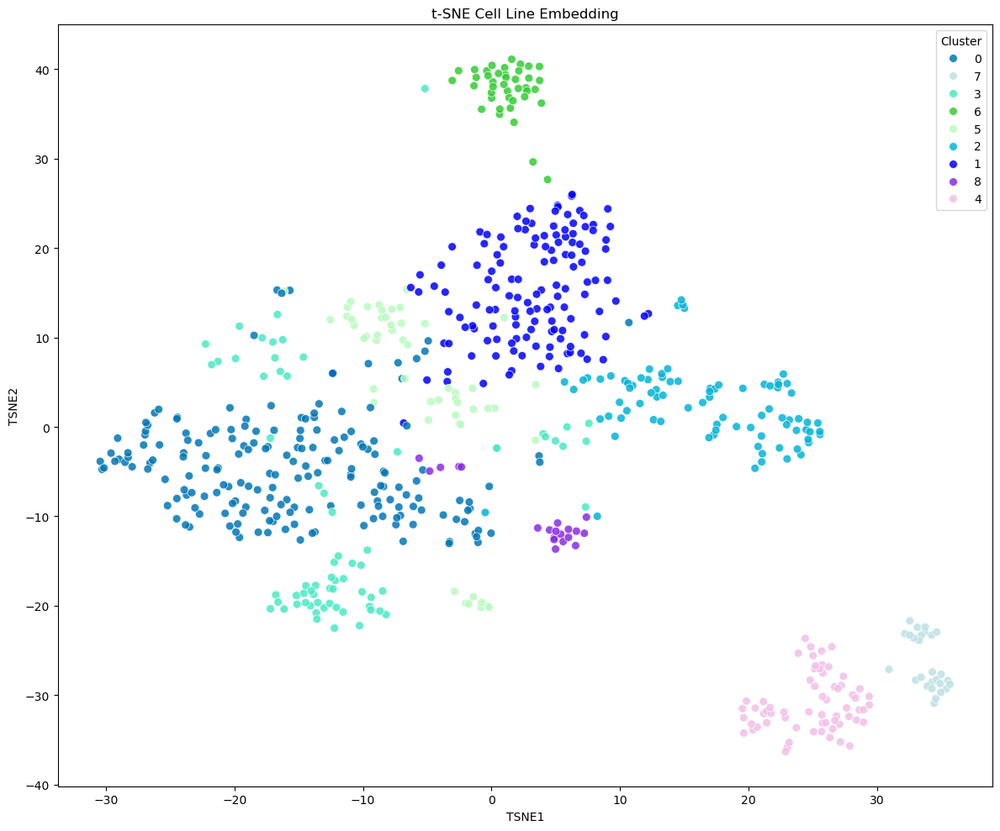


Building dendrogram...


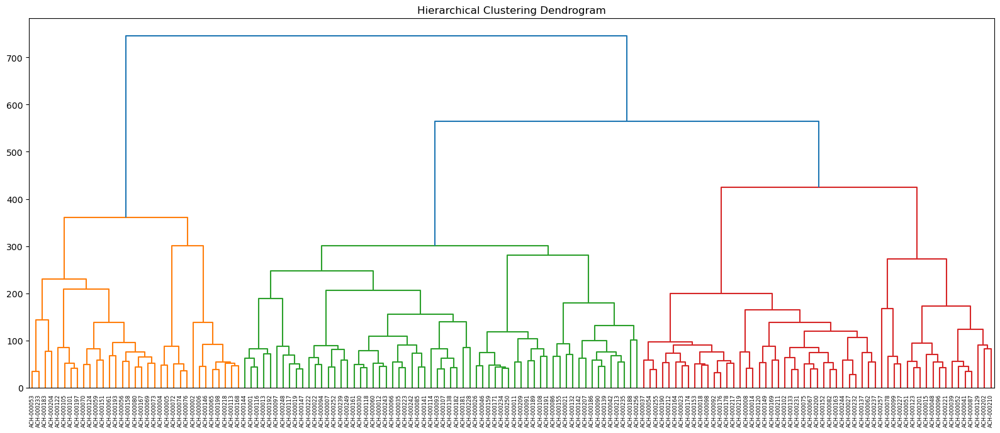


Computing cluster compactness...
   Cluster  MeanDistanceToCentroid  StdDistance  NumCells
0        0               77.077644    40.544929       186
1        1               58.509094    27.701069       135
2        2               93.099513    38.535756        84
3        3              170.832835   135.910061        69
4        4               97.721380    75.842078        65
5        5               72.898103    31.647492        53
6        6               47.716285    21.774757        41
7        7               82.579803    57.163922        27
8        8               69.686947    54.675151        20


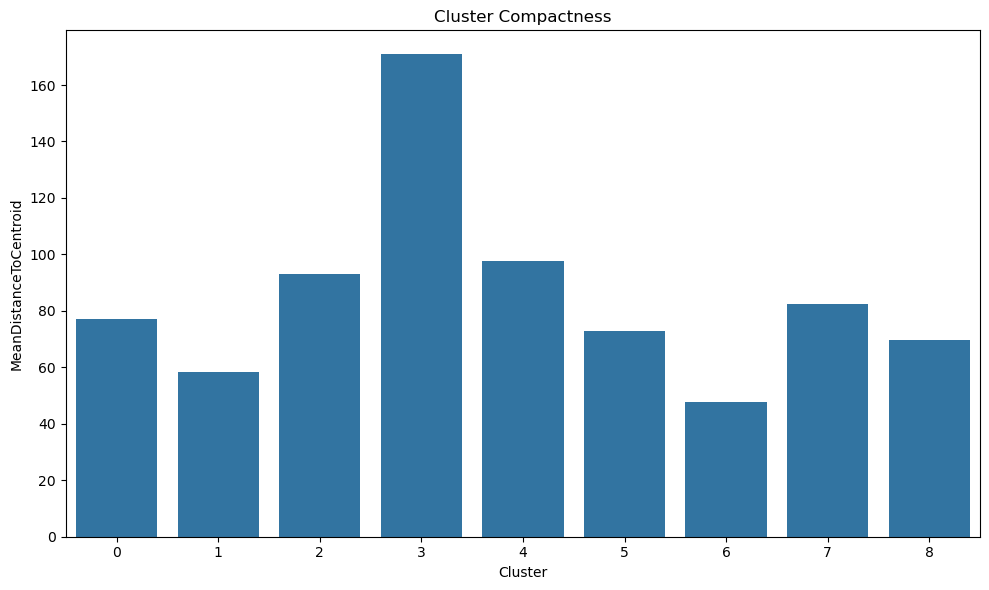


Computing connected components...


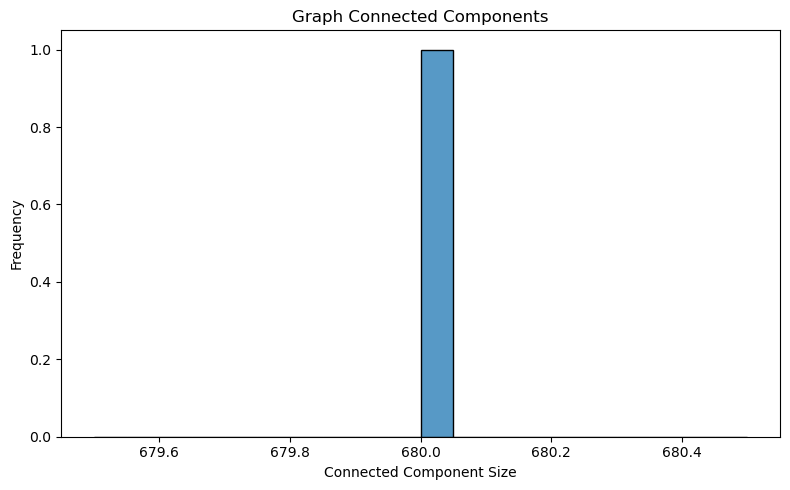


Finding most similar cell lines...
         CellLine1   CellLine2  Similarity
1357    ACH-000004  ACH-000005    0.862402
140593  ACH-000415  ACH-000794    0.781667
214040  ACH-000771  ACH-000794    0.780267
67128   ACH-000188  ACH-000415    0.716624
67387   ACH-000188  ACH-000794    0.709427
140549  ACH-000415  ACH-000732    0.706991
140576  ACH-000415  ACH-000771    0.701299
208748  ACH-000732  ACH-000794    0.684462
4741    ACH-000011  ACH-000026    0.681831
140377  ACH-000415  ACH-000472    0.679324

Computing cluster-specific features...
    Cluster           Feature  Importance
0         0     GPR87 (53836)    1.317345
1         0      MIMAT0000266    1.166084
2         0    TACSTD2 (4070)    1.164157
3         0       GJB3 (2707)    1.125872
4         0   ADGRF1 (266977)    1.111811
5         0       CDH3 (1001)    1.102606
6         0     FGFBP1 (9982)    1.084296
7         0      LAMC2 (3918)    1.078957
8         0       SCEL (8796)    1.076566
9         0       CST6 (1474)  

In [50]:
# ============================================================
# ADVANCED ANALYSIS CURVES + TABLES
# FOR ASPIRE-GNN++
# ============================================================

from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE


# ============================================================
# PCA EXPLAINED VARIANCE CURVE
# ============================================================

print("\nPlotting PCA explained variance...")

full_pca = PCA(
    n_components=min(
        100,
        X.shape[0] - 1,
        X.shape[1]
    )
)

full_pca.fit(X.values)

cumvar = np.cumsum(
    full_pca.explained_variance_ratio_
)

variance_df = pd.DataFrame({

    "PC": np.arange(1, len(cumvar) + 1),
    "CumulativeVariance": cumvar
})

variance_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "pca_explained_variance.csv"
    ),

    index=False
)

plt.figure(figsize=(8, 6))

plt.plot(
    variance_df["PC"],
    variance_df["CumulativeVariance"],
    linewidth=3
)

plt.xlabel("Principal Components")

plt.ylabel("Cumulative Explained Variance")

plt.title("PCA Explained Variance Curve")

plt.grid(True)

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "pca_explained_variance_curve.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# SILHOUETTE ANALYSIS
# ============================================================

print("\nComputing silhouette score...")

sil_score = silhouette_score(
    X_pca,
    clusters
)

silhouette_df = pd.DataFrame({

    "Metric": ["SilhouetteScore"],
    "Value": [sil_score]
})

print(silhouette_df)

silhouette_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "silhouette_score.csv"
    ),

    index=False
)


# ============================================================
# CLUSTER SEPARATION DISTANCE MATRIX
# ============================================================

print("\nComputing cluster centroid distances...")

cluster_centroids = []

cluster_ids = sorted(np.unique(clusters))

for c in cluster_ids:

    idx = np.where(clusters == c)[0]

    centroid = X_pca[idx].mean(axis=0)

    cluster_centroids.append(centroid)

cluster_centroids = np.array(cluster_centroids)

cluster_dist = pairwise_distances(
    cluster_centroids,
    metric="euclidean"
)

cluster_dist_df = pd.DataFrame(

    cluster_dist,

    index=cluster_ids,

    columns=cluster_ids
)

cluster_dist_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cluster_distance_matrix.csv"
    )
)

plt.figure(figsize=(10, 8))

sns.heatmap(

    cluster_dist_df,

    cmap="rocket_r",

    annot=True,

    fmt=".2f"
)

plt.title("Cluster Centroid Distance Matrix")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cluster_distance_heatmap.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# t-SNE VISUALIZATION
# ============================================================

print("\nRunning t-SNE...")

tsne = TSNE(

    n_components=2,

    perplexity=30,

    learning_rate=200,

    random_state=42,

    init="pca"
)

X_tsne = tsne.fit_transform(X_pca)

tsne_df = pd.DataFrame({

    "TSNE1": X_tsne[:, 0],
    "TSNE2": X_tsne[:, 1],
    "Cluster": clusters.astype(str)

}, index=common_cells)

plt.figure(figsize=(12, 10))

sns.scatterplot(

    data=tsne_df,

    x="TSNE1",

    y="TSNE2",

    hue="Cluster",

    palette=palette,

    s=50,

    alpha=0.85
)

plt.title("t-SNE Cell Line Embedding")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "tsne_cellline_embedding.png"
    ),

    dpi=300
)

plt.show()

tsne_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "tsne_embeddings.csv"
    )
)


# ============================================================
# HIERARCHICAL CLUSTERING DENDROGRAM
# ============================================================

print("\nBuilding dendrogram...")

subset_n = min(150, X_pca.shape[0])

subset_cells = common_cells[:subset_n]

subset_data = X_pca[:subset_n]

Z = linkage(
    subset_data,
    method="ward"
)

plt.figure(figsize=(16, 7))

dendrogram(

    Z,

    labels=subset_cells,

    leaf_rotation=90,

    leaf_font_size=6
)

plt.title("Hierarchical Clustering Dendrogram")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cellline_dendrogram.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# CLUSTER COMPACTNESS
# ============================================================

print("\nComputing cluster compactness...")

compactness_rows = []

for c in cluster_ids:

    idx = np.where(clusters == c)[0]

    cluster_points = X_pca[idx]

    centroid = cluster_points.mean(axis=0)

    dist = np.linalg.norm(
        cluster_points - centroid,
        axis=1
    )

    compactness_rows.append({

        "Cluster": c,
        "MeanDistanceToCentroid": dist.mean(),
        "StdDistance": dist.std(),
        "NumCells": len(idx)
    })

compactness_df = pd.DataFrame(
    compactness_rows
)

compactness_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cluster_compactness.csv"
    ),

    index=False
)

print(compactness_df)

plt.figure(figsize=(10, 6))

sns.barplot(

    data=compactness_df,

    x="Cluster",

    y="MeanDistanceToCentroid"
)

plt.title("Cluster Compactness")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "cluster_compactness.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# GRAPH CONNECTED COMPONENTS
# ============================================================

print("\nComputing connected components...")

components = g.components()

component_sizes = [
    len(c)
    for c in components
]

component_df = pd.DataFrame({

    "ComponentID": np.arange(len(component_sizes)),
    "Size": component_sizes
})

component_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "graph_connected_components.csv"
    ),

    index=False
)

plt.figure(figsize=(8, 5))

sns.histplot(
    component_sizes,
    bins=20
)

plt.xlabel("Connected Component Size")

plt.ylabel("Frequency")

plt.title("Graph Connected Components")

plt.tight_layout()

plt.savefig(

    os.path.join(
        OUTPUT_DIR,
        "connected_components_histogram.png"
    ),

    dpi=300
)

plt.show()


# ============================================================
# TOP CELL LINE PAIRS
# ============================================================

print("\nFinding most similar cell lines...")

sim_df = pd.DataFrame(
    sim,
    index=common_cells,
    columns=common_cells
)

pairs = []

for i in range(len(common_cells)):

    for j in range(i + 1, len(common_cells)):

        pairs.append({

            "CellLine1": common_cells[i],
            "CellLine2": common_cells[j],
            "Similarity": sim[i, j]
        })

pairs_df = pd.DataFrame(pairs)

pairs_df = pairs_df.sort_values(
    "Similarity",
    ascending=False
)

top_pairs = pairs_df.head(50)

top_pairs.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "top_similar_cellline_pairs.csv"
    ),

    index=False
)

print(top_pairs.head(10))


# ============================================================
# CLUSTER FEATURE IMPORTANCE
# ============================================================

print("\nComputing cluster-specific features...")

cluster_feature_rows = []

for c in cluster_ids:

    idx = np.where(clusters == c)[0]

    cluster_mean = X.iloc[idx].mean(axis=0)

    global_mean = X.mean(axis=0)

    diff = (
        cluster_mean - global_mean
    ).abs()

    top_feats = diff.sort_values(
        ascending=False
    ).head(10)

    for feat, val in top_feats.items():

        cluster_feature_rows.append({

            "Cluster": c,
            "Feature": feat,
            "Importance": val
        })

cluster_feature_df = pd.DataFrame(
    cluster_feature_rows
)

cluster_feature_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "cluster_feature_importance.csv"
    ),

    index=False
)

print(cluster_feature_df.head(20))


# ============================================================
# FINAL ANALYSIS SUMMARY
# ============================================================

summary_df = pd.DataFrame({

    "Metric": [

        "NumCellLines",
        "NumFeatures",
        "NumClusters",
        "SilhouetteScore",
        "GraphNodes",
        "GraphEdges",
        "MeanGraphDegree"
    ],

    "Value": [

        len(common_cells),
        X.shape[1],
        len(np.unique(clusters)),
        sil_score,
        g.vcount(),
        g.ecount(),
        np.mean(degrees)
    ]
})

summary_df.to_csv(

    os.path.join(
        OUTPUT_DIR,
        "analysis_summary.csv"
    ),

    index=False
)

print("\nFINAL SUMMARY")
print(summary_df)


## ASPIRE-GNN++
## Multi-Omics + Drug Response + Leiden Graph Learning + Pathway-Aware Cell Embedding

---

# 1. Overview

ASPIRE-GNN++ is a multi-omics graph learning framework designed for integrative analysis of cancer cell lines using:

- Gene expression (GE)
- Somatic mutation profiles (MF)
- miRNA expression
- Metabolomics
- Drug response profiles

The framework integrates these heterogeneous modalities into a unified latent embedding space using:

- Feature standardization
- Multi-view fusion
- Principal Component Analysis (PCA)
- UMAP manifold learning
- K-nearest neighbor graph construction
- Leiden community detection
- Pathway enrichment analysis
- GSEA-like running enrichment scoring

The framework produces biologically meaningful:

- Cell-line embeddings
- Cluster structures
- Drug sensitivity landscapes
- Omics activity maps
- Pathway enrichment summaries
- Graph topology statistics

---

# 2. Multi-Omics Data Integration

The integrated feature matrix is constructed as:

\[
X =
[
X_{GE}
\;
X_{MF}
\;
X_{miRNA}
\;
X_{METABO}
\;
X_{DRUG}
]
\]

where:

- \(X_{GE}\): Gene expression matrix
- \(X_{MF}\): Mutation feature matrix
- \(X_{miRNA}\): miRNA expression matrix
- \(X_{METABO}\): Metabolomics matrix
- \(X_{DRUG}\): Drug sensitivity matrix

---

# 3. Data Normalization

Each omics matrix is standardized using z-score normalization:


::contentReference[oaicite:0]{index=0}


where:

- \(x\): original feature value
- \(\mu\): feature mean
- \(\sigma\): feature standard deviation

This ensures all omics modalities contribute comparably during integration.

---

# 4. Mutation Matrix Construction

A binary mutation matrix is constructed using:

\[
M_{ij} =
\begin{cases}
1 & \text{if mutation exists} \\
0 & \text{otherwise}
\end{cases}
\]

Genes mutated in fewer than 5 samples are removed to reduce sparsity.

Log transformation is applied:


::contentReference[oaicite:1]{index=1}


---

# 5. Dimensionality Reduction with PCA

PCA reduces the high-dimensional fused matrix into a compact latent representation:

\[
Z = XW
\]

where:

- \(X\): fused omics matrix
- \(W\): principal component loading matrix
- \(Z\): low-dimensional embedding matrix

The optimization objective maximizes variance:

\[
\max_W \mathrm{Var}(XW)
\]

---

# 6. UMAP Manifold Learning

UMAP projects the PCA embeddings into a nonlinear manifold preserving local topology.

The low-dimensional embedding is:

\[
Y = UMAP(Z)
\]

UMAP preserves neighborhood structure using fuzzy topological graphs.

Parameters:

- n_neighbors = 20
- min_dist = 0.15
- metric = cosine

---

# 7. KNN Graph Construction

A graph is constructed from PCA embeddings using cosine similarity.

Each node corresponds to a cell line.

Edges connect nearest neighbors:

\[
E = \{(i,j) \mid j \in KNN(i)\}
\]

Cosine similarity:

:contentReference[oaicite:2]{index=2}

This graph captures cell-line similarity relationships.

---

# 8. Leiden Community Detection

Leiden clustering partitions the graph into biologically coherent communities.

The optimization objective maximizes modularity:

\[
Q =
\frac{1}{2m}
\sum_{ij}
\left(
A_{ij}
-
\frac{k_i k_j}{2m}
\right)
\delta(c_i,c_j)
\]

where:

- \(A_{ij}\): adjacency matrix
- \(k_i\): node degree
- \(m\): number of edges
- \(c_i\): cluster assignment

The algorithm improves graph partition quality and cluster connectivity.

---

# 9. Similarity Matrix Analysis

Cell-line similarity is computed using cosine similarity:

:contentReference[oaicite:3]{index=3}

The resulting matrix:

\[
S_{ij} = \cos(x_i,x_j)
\]

captures global relationships between cancer cell lines.

---

# 10. Reactome Pathway Enrichment

Top expressed genes are enriched against Reactome pathways using Enrichr.

Genes are ranked using:

\[
g_i = \frac{1}{N}\sum_{j=1}^{N} x_{ij}
\]

where:

- \(g_i\): average expression score
- \(N\): number of cell lines

Significant pathways are identified using adjusted p-values.

Bubble plots visualize:

- pathway significance
- overlap size
- enrichment magnitude

---

# 11. GSEA-like Running Enrichment Score

Gene Set Enrichment Analysis computes cumulative enrichment statistics across ranked genes.

Running enrichment score:

\[
RS(i) =
\sum_{k=1}^{i}
\left(
\frac{1}{N_H}
\mathbf{1}_{gene_k \in S}
-
\frac{1}{N_M}
\mathbf{1}_{gene_k \notin S}
\right)
\]

where:

- \(S\): gene set
- \(N_H\): number of hits
- \(N_M\): number of misses

Positive peaks indicate strong enrichment near top-ranked genes.

---

# 12. Multi-View Embedding Similarity

Each omics modality is independently embedded using PCA.

Cross-view similarity is computed:

\[
Similarity(A,B)
=
\cos(A,B)
\]

This quantifies consistency between:

- transcriptomics
- mutations
- metabolomics
- drug response
- miRNA activity

---

# 13. Drug Response Analysis

Highly variable drugs are selected:

\[
Var(d_j)
=
\frac{1}{N}
\sum_{i=1}^{N}
(d_{ij} - \bar d_j)^2
\]

Drug response heatmaps reveal:

- sensitivity patterns
- cluster-specific vulnerabilities
- therapeutic heterogeneity

---

# 14. Cluster-Level Omics Activity

Cluster-level activity profiles are computed:

\[
Activity_c =
\frac{1}{|C|}
\sum_{i \in C}
x_i
\]

where:

- \(C\): set of cell lines in cluster \(c\)

This reveals biological specialization across clusters.

---

# 15. Graph Degree Distribution

Node degree measures graph connectivity:

\[
Degree(v_i) = \sum_j A_{ij}
\]

Hub cell lines exhibit high connectivity and may represent:

- dominant phenotypes
- conserved molecular programs
- central cancer states

---

# 16. Representative Cell Lines

Cluster centroids are computed:

\[
\mu_c =
\frac{1}{|C|}
\sum_{i \in C} z_i
\]

Representative cell lines minimize Euclidean distance to cluster centroids:

:contentReference[oaicite:4]{index=4}

---

# 17. Outlier Detection

Outlier scores are computed using z-score statistics:

\[
OutlierScore_i =
\frac{1}{D}
\sum_{j=1}^{D}
|z_{ij}|
\]

High-scoring cell lines represent unusual molecular profiles.

---

# 18. Feature Contribution Analysis

Feature-group contributions quantify representation sizes:

\[
F_g = |Features_g|
\]

This evaluates the relative contribution of:

- GE
- MF
- miRNA
- METABO
- DRUG

---

# 19. Generated Outputs

The framework generates:

## Embeddings

- `cellline_embeddings.csv`
- `pca_embeddings.csv`

## Clustering

- `cluster_summary.csv`
- `representative_cell_lines.csv`
- `cellline_cluster_map.csv`

## Graph Analysis

- `cellline_graph_degree.csv`
- `top_hub_cell_lines.csv`

## Pathway Analysis

- `reactome_enrichment.csv`
- `gsea_like_enrichment_scores.csv`

## Omics Activity

- `cluster_omics_activity.csv`

## Drug Analysis

- `cluster_drug_sensitivity.csv`

## Outlier Analysis

- `cellline_outliers.csv`

## Gene Analysis

- `top_variable_genes.csv`
- `top_ranked_genes.csv`
- `mirna_associated_genes.csv`

---

# 20. Visualization Outputs

The framework produces:

- UMAP cluster visualization
- Similarity heatmaps
- Reactome bubble plots
- GSEA-like enrichment curves
- Drug sensitivity heatmaps
- Cluster activity heatmaps
- Degree distributions
- Density landscapes
- Feature contribution plots

---

# 21. Biological Interpretation

ASPIRE-GNN++ enables:

- pan-cancer molecular stratification
- pathway-aware clustering
- drug sensitivity profiling
- graph-based tumor state discovery
- multi-omics integration
- systems-level cancer representation learning

The framework combines graph topology and molecular heterogeneity into a unified representation space suitable for:

- biomarker discovery
- therapeutic prediction
- pathway analysis
- precision oncology
- graph neural network downstream learning

---


Loading TCGA survival data...
Raw survival shape:
(1232, 4)

Columns:
['sample', 'OS.time', 'OS', '_PATIENT']

Detected columns:
sample_col: sample
time_col: OS.time
event_col: OS

Renamed columns:
['Sample', 'OS_TIME', 'OS_EVENT', '_PATIENT']

Clean survival shape:
(1232, 5)

Event distribution:
OS_EVENT
0    1031
1     201
Name: count, dtype: int64

Finding BRCA columns...

BRCA columns:
['GE: BRCA', 'MF: BRCA', 'MIRNA: BRCA']

Computing gene activity scores...

Gene score shape:
(4980,)

Loading TCGA BRCA expression...
Raw expression shape:
(43773, 1226)

Clean expression shape:
(43773, 1226)

Shared genes: 4977

Computing patient ASPIRE scores...

Patient score shape:
(1226, 3)

Merged survival shape:
(1504, 6)

After cleanup:
(1504, 6)

Risk counts:
RiskGroup
High    752
Low     752
Name: count, dtype: int64

High-risk patients: 752
Low-risk patients: 752

Log-rank p-value:
0.24691952678075652

Generating Kaplan-Meier curves...
[SAVED] aspire_gnn_results/kaplan_meier_survival.png

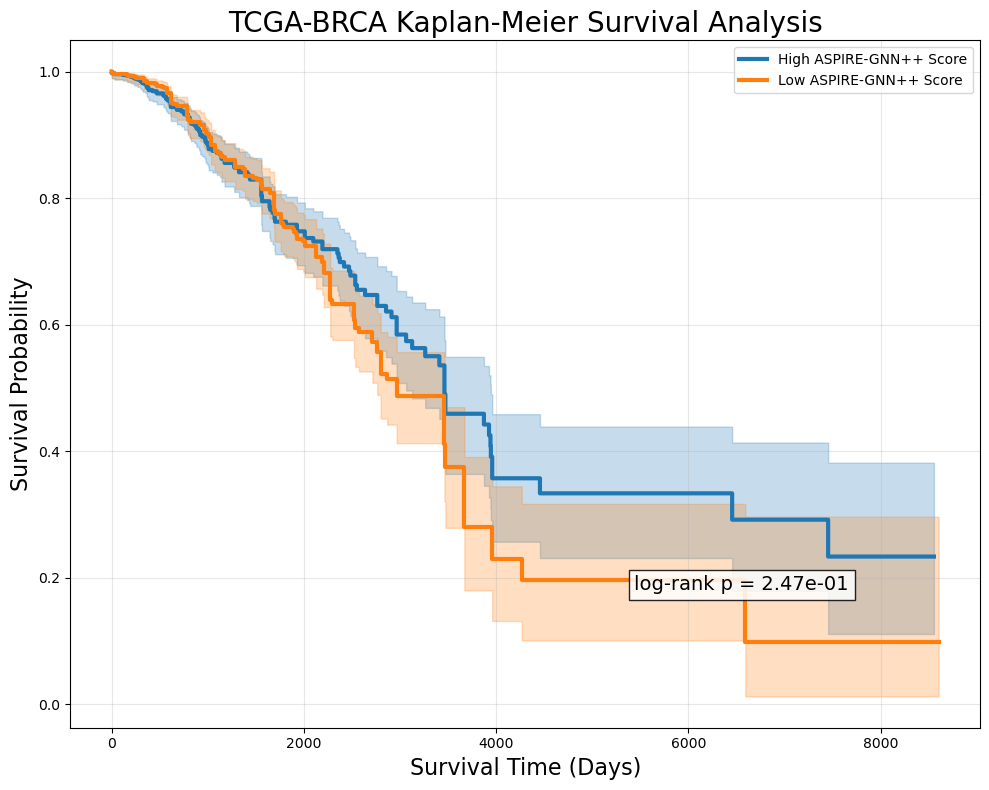

[SAVED] aspire_gnn_results/survival_summary.csv

Summary:
  Group    N  Median_OS_Time  Events
0  High  752           799.0     132
1   Low  752          1100.0     170
[SAVED] aspire_gnn_results/survival_analysis_table.csv

SURVIVAL ANALYSIS COMPLETE


In [51]:
# =====================================================
# SURVIVAL ANALYSIS PER CANCER
# USING GENE × (OMICS:CANCER) MATRIX
# =====================================================

# pip install lifelines

from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test

# =====================================================
# LOAD TCGA SURVIVAL DATA
# =====================================================

print("\nLoading TCGA survival data...")

survival_file = "../../gat/data_TCGA_survival/TCGA-BRCA.survival.tsv"

surv_df = pd.read_csv(
    survival_file,
    sep="\t"
)

print("Raw survival shape:")
print(surv_df.shape)

print("\nColumns:")
print(surv_df.columns.tolist())


# =====================================================
# AUTO-DETECT COLUMNS
# =====================================================

time_col = None
event_col = None
sample_col = None

for c in surv_df.columns:

    cl = c.lower()

    # -------------------------------------------------
    # SAMPLE COLUMN
    # -------------------------------------------------

    if (
        "sample" in cl
        or "barcode" in cl
        or cl == "_patient"
        or "submitter" in cl
    ):

        if sample_col is None:
            sample_col = c

    # -------------------------------------------------
    # SURVIVAL TIME COLUMN
    # -------------------------------------------------

    if (
        "os.time" in cl
        or "os_time" in cl
        or "overall_survival" in cl
        or "days_to_death" in cl
        or "time" in cl
    ):

        if time_col is None:
            time_col = c

    # -------------------------------------------------
    # EVENT COLUMN
    # -------------------------------------------------

    if (
        cl == "os"
        or "os.event" in cl
        or "os_event" in cl
        or "vital_status" in cl
        or "status" in cl
    ):

        if event_col is None:
            event_col = c


print("\nDetected columns:")
print("sample_col:", sample_col)
print("time_col:", time_col)
print("event_col:", event_col)


# =====================================================
# VALIDATION
# =====================================================

if sample_col is None:
    raise ValueError("Could not detect sample column")

if time_col is None:
    raise ValueError("Could not detect survival time column")

if event_col is None:
    raise ValueError("Could not detect event column")


# =====================================================
# RENAME
# =====================================================

surv_df = surv_df.rename(columns={

    sample_col: "Sample",
    time_col: "OS_TIME",
    event_col: "OS_EVENT"
})

print("\nRenamed columns:")
print(surv_df.columns.tolist())


# =====================================================
# CLEAN SAMPLE IDS
# =====================================================

surv_df["Sample"] = (

    surv_df["Sample"]
    .astype(str)
    .str.upper()
    .str.strip()
)

# remove TCGA suffix if needed
surv_df["PATIENT"] = (

    surv_df["Sample"]
    .str.slice(0, 12)
)


# =====================================================
# CLEAN EVENT COLUMN
# =====================================================

# -----------------------------------------------------
# STRING EVENTS
# -----------------------------------------------------

if surv_df["OS_EVENT"].dtype == object:

    surv_df["OS_EVENT"] = (

        surv_df["OS_EVENT"]
        .astype(str)
        .str.lower()
        .map({

            "dead": 1,
            "deceased": 1,
            "alive": 0,
            "living": 0,

            "1": 1,
            "0": 0
        })
    )

# -----------------------------------------------------
# NUMERIC CONVERSION
# -----------------------------------------------------

surv_df["OS_EVENT"] = pd.to_numeric(

    surv_df["OS_EVENT"],
    errors="coerce"
)

surv_df["OS_TIME"] = pd.to_numeric(

    surv_df["OS_TIME"],
    errors="coerce"
)


# =====================================================
# REMOVE INVALID
# =====================================================

surv_df = surv_df.dropna(

    subset=[
        "OS_TIME",
        "OS_EVENT"
    ]
)

# keep positive times only
surv_df = surv_df[
    surv_df["OS_TIME"] > 0
]

print("\nClean survival shape:")
print(surv_df.shape)

print("\nEvent distribution:")
print(
    surv_df["OS_EVENT"]
    .value_counts()
)


# =====================================================
# FIND BRCA COLUMNS
# =====================================================

print("\nFinding BRCA columns...")

brca_cols = [

    c for c in gene_cancer_matrix.columns

    if c.endswith(": BRCA")
]

print("\nBRCA columns:")
print(brca_cols)

if len(brca_cols) == 0:

    raise ValueError(
        "No BRCA columns found in gene_cancer_matrix"
    )


# =====================================================
# COMPUTE GENE SCORES
# =====================================================

print("\nComputing gene activity scores...")

# -----------------------------------------------------
# gene-level BRCA signature
# -----------------------------------------------------

brca_gene_scores = (

    gene_cancer_matrix[brca_cols]
    .mean(axis=1)
)

print("\nGene score shape:")
print(brca_gene_scores.shape)


# =====================================================
# LOAD TCGA BRCA EXPRESSION
# =====================================================

print("\nLoading TCGA BRCA expression...")

expr_file = "../../ACGNN_data/data/TCGA-BRCA.expression.tsv"

expr_df = pd.read_csv(
    expr_file,
    sep="\t",
    index_col=0
)

print("Raw expression shape:")
print(expr_df.shape)


# =====================================================
# CLEAN GENE NAMES
# =====================================================

expr_df.index = [

    str(g).split("|")[0].upper()

    for g in expr_df.index
]

expr_df = expr_df.groupby(
    expr_df.index
).mean()

print("\nClean expression shape:")
print(expr_df.shape)


# =====================================================
# MATCH GENES
# =====================================================

common_genes = sorted(

    set(expr_df.index)

    & set(brca_gene_scores.index)
)

print("\nShared genes:", len(common_genes))

if len(common_genes) < 50:

    raise ValueError(
        "Too few shared genes between expression and signature"
    )


# =====================================================
# SUBSET
# =====================================================

expr_sub = expr_df.loc[
    common_genes
]

score_sub = brca_gene_scores.loc[
    common_genes
]


# =====================================================
# COMPUTE PATIENT SCORES
# =====================================================

print("\nComputing patient ASPIRE scores...")

# -----------------------------------------------------
# z-score normalize genes
# -----------------------------------------------------

expr_sub = expr_sub.sub(
    expr_sub.mean(axis=1),
    axis=0
)

expr_sub = expr_sub.div(
    expr_sub.std(axis=1) + 1e-8,
    axis=0
)

# -----------------------------------------------------
# weighted patient scores
# -----------------------------------------------------

patient_scores = expr_sub.T.dot(
    score_sub
)

patient_scores = pd.DataFrame({

    "Sample":
        patient_scores.index,

    "ASPIRE_SCORE":
        patient_scores.values
})

# normalize patient IDs
patient_scores["PATIENT"] = (

    patient_scores["Sample"]
    .astype(str)
    .str.upper()
    .str.slice(0, 12)
)

print("\nPatient score shape:")
print(patient_scores.shape)


# =====================================================
# MERGE SURVIVAL + SCORES
# =====================================================

survival_analysis_df = pd.merge(

    surv_df,

    patient_scores[
        [
            "PATIENT",
            "ASPIRE_SCORE"
        ]
    ],

    on="PATIENT",

    how="inner"
)

print("\nMerged survival shape:")
print(
    survival_analysis_df.shape
)


# =====================================================
# REMOVE MISSING
# =====================================================

survival_analysis_df = survival_analysis_df.dropna(

    subset=[
        "ASPIRE_SCORE"
    ]
)

print("\nAfter cleanup:")
print(
    survival_analysis_df.shape
)


# =====================================================
# HIGH vs LOW RISK
# =====================================================

median_score = (

    survival_analysis_df["ASPIRE_SCORE"]
    .median()
)

survival_analysis_df["RiskGroup"] = np.where(

    survival_analysis_df["ASPIRE_SCORE"] >= median_score,

    "High",

    "Low"
)

print("\nRisk counts:")
print(

    survival_analysis_df["RiskGroup"]
    .value_counts()
)


# =====================================================
# SPLIT
# =====================================================

high_df = survival_analysis_df[

    survival_analysis_df["RiskGroup"] == "High"
]

low_df = survival_analysis_df[

    survival_analysis_df["RiskGroup"] == "Low"
]

print("\nHigh-risk patients:", len(high_df))
print("Low-risk patients:", len(low_df))


# =====================================================
# LOG-RANK TEST
# =====================================================

results = logrank_test(

    high_df["OS_TIME"],
    low_df["OS_TIME"],

    event_observed_A=
        high_df["OS_EVENT"],

    event_observed_B=
        low_df["OS_EVENT"]
)

p_value = results.p_value

print("\nLog-rank p-value:")
print(p_value)


# =====================================================
# KAPLAN-MEIER CURVES
# =====================================================

print("\nGenerating Kaplan-Meier curves...")

plt.figure(figsize=(10, 8))

ax = plt.gca()

kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

# -----------------------------------------------------
# HIGH RISK
# -----------------------------------------------------

kmf_high.fit(

    durations=
        high_df["OS_TIME"],

    event_observed=
        high_df["OS_EVENT"],

    label="High ASPIRE-GNN++ Score"
)

kmf_high.plot_survival_function(

    ax=ax,

    linewidth=3
)

# -----------------------------------------------------
# LOW RISK
# -----------------------------------------------------

kmf_low.fit(

    durations=
        low_df["OS_TIME"],

    event_observed=
        low_df["OS_EVENT"],

    label="Low ASPIRE-GNN++ Score"
)

kmf_low.plot_survival_function(

    ax=ax,

    linewidth=3
)


# =====================================================
# STYLE
# =====================================================

plt.xlabel(
    "Survival Time (Days)",
    fontsize=16
)

plt.ylabel(
    "Survival Probability",
    fontsize=16
)

plt.title(

    "TCGA-BRCA Kaplan-Meier Survival Analysis",

    fontsize=20,

    # fontweight="bold"
)

plt.text(

    0.62,
    0.20,

    f"log-rank p = {p_value:.2e}",

    transform=ax.transAxes,

    fontsize=14,

    bbox=dict(
        facecolor="white",
        alpha=0.85
    )
)

plt.grid(alpha=0.3)

plt.tight_layout()


# =====================================================
# SAVE FIGURE
# =====================================================

km_path = os.path.join(

    OUTPUT_DIR,

    "kaplan_meier_survival.png"
)

plt.savefig(

    km_path,

    dpi=300,

    bbox_inches="tight"
)

print("[SAVED]", km_path)

plt.show()


# =====================================================
# SUMMARY TABLE
# =====================================================

summary_df = pd.DataFrame({

    "Group": [

        "High",
        "Low"
    ],

    "N": [

        len(high_df),
        len(low_df)
    ],

    "Median_OS_Time": [

        high_df["OS_TIME"].median(),

        low_df["OS_TIME"].median()
    ],

    "Events": [

        high_df["OS_EVENT"].sum(),

        low_df["OS_EVENT"].sum()
    ]
})

summary_path = os.path.join(

    OUTPUT_DIR,

    "survival_summary.csv"
)

summary_df.to_csv(

    summary_path,

    index=False
)

print("[SAVED]", summary_path)

print("\nSummary:")
print(summary_df)


# =====================================================
# SAVE FULL TABLE
# =====================================================

full_survival_path = os.path.join(

    OUTPUT_DIR,

    "survival_analysis_table.csv"
)

survival_analysis_df.to_csv(

    full_survival_path,

    index=False
)

print("[SAVED]", full_survival_path)


# =====================================================
# COMPLETE
# =====================================================

print("\n===================================")
print("SURVIVAL ANALYSIS COMPLETE")
print("===================================")



Generating Kaplan-Meier curves...
[SAVED] aspire_gnn_results/kaplan_meier_survival.png


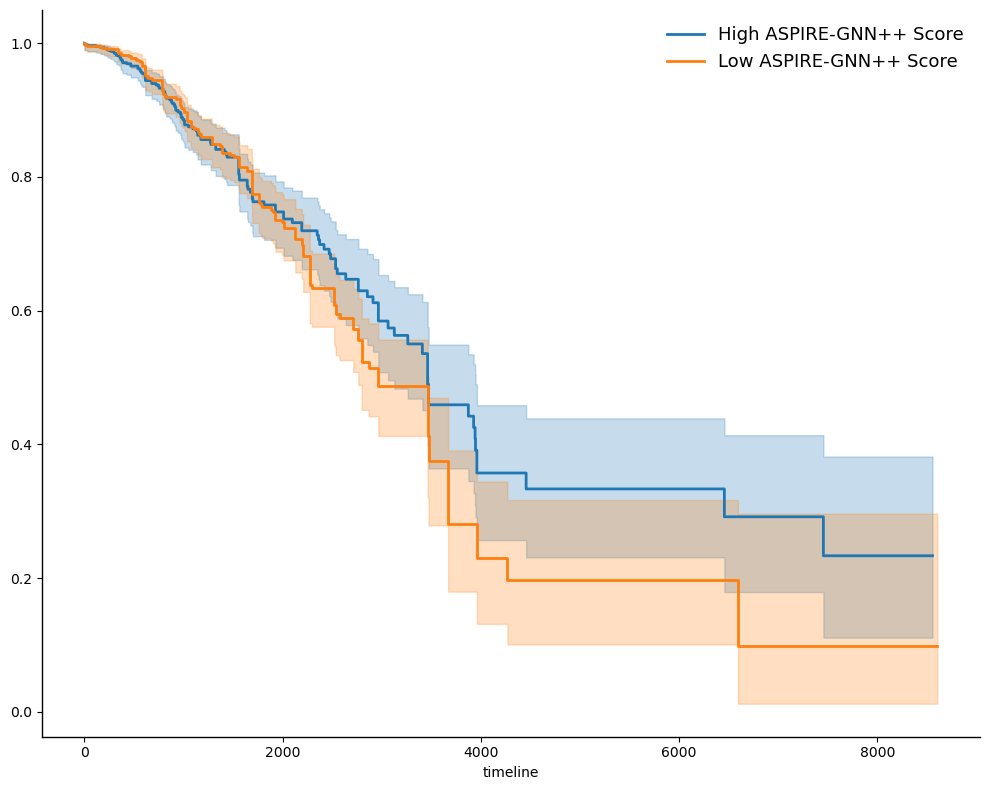

In [52]:
# =====================================================
# KAPLAN-MEIER CURVES
# =====================================================

print("\nGenerating Kaplan-Meier curves...")

plt.figure(figsize=(10, 8))

ax = plt.gca()

kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

# -----------------------------------------------------
# HIGH RISK
# -----------------------------------------------------

kmf_high.fit(
    durations=high_df["OS_TIME"],
    event_observed=high_df["OS_EVENT"],
    label="High ASPIRE-GNN++ Score"
)

kmf_high.plot_survival_function(
    ax=ax,
    linewidth=2      # reduced from 3
)

# -----------------------------------------------------
# LOW RISK
# -----------------------------------------------------

kmf_low.fit(
    durations=low_df["OS_TIME"],
    event_observed=low_df["OS_EVENT"],
    label="Low ASPIRE-GNN++ Score"
)

kmf_low.plot_survival_function(
    ax=ax,
    linewidth=2      # reduced from 3
)


# # =====================================================
# # STYLE
# # =====================================================

# plt.xlabel(
#     "Survival Time (Days)",
#     fontsize=18
# )

# plt.ylabel(
#     "Survival Probability",
#     fontsize=18
# )

# plt.title(
#     "TCGA-BRCA Kaplan-Meier Survival Analysis",
#     fontsize=20,
#     fontweight="bold"
# )

# plt.xticks(fontsize=14)
# plt.yticks(fontsize=14)

# # p-value box
# plt.text(
#     0.62,
#     0.20,
#     f"log-rank p = {p_value:.2e}",
#     transform=ax.transAxes,
#     fontsize=14,
#     bbox=dict(
#         facecolor="white",
#         alpha=0.85,
#         edgecolor="none"
#     )
# )

# =====================================================
# REMOVE GRID
# =====================================================

ax.grid(False)

# =====================================================
# REMOVE TOP / RIGHT FRAME
# =====================================================

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# optional: slightly thinner remaining axes
ax.spines["left"].set_linewidth(1)
ax.spines["bottom"].set_linewidth(1)

# legend styling
plt.legend(
    fontsize=13,
    frameon=False
)

plt.tight_layout()


# =====================================================
# SAVE FIGURE
# =====================================================

km_path = os.path.join(
    OUTPUT_DIR,
    "kaplan_meier_survival.png"
)

plt.savefig(
    km_path,
    dpi=300,
    bbox_inches="tight"
)

print("[SAVED]", km_path)

plt.show()



Top genes:
['TP53', 'FOXA1', 'GATA3', 'HES5', 'TBX3']

GENE: TP53
Merged: (1504, 6)
p = 0.8025124990997152


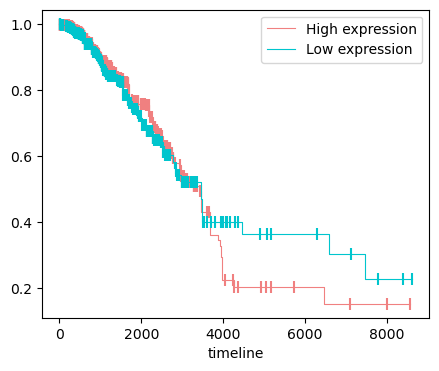

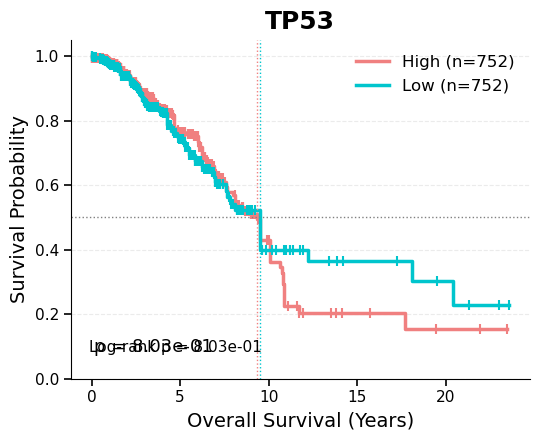

[SAVED] aspire_gnn_results/KM_TP53.png

GENE: FOXA1
Merged: (1504, 6)
p = 0.12831587992960752


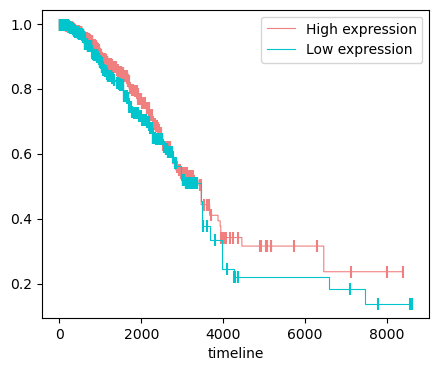

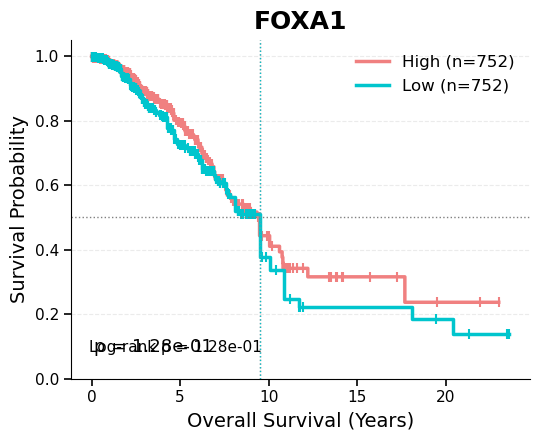

[SAVED] aspire_gnn_results/KM_FOXA1.png

GENE: GATA3
Merged: (1504, 6)
p = 0.0020298573907484717


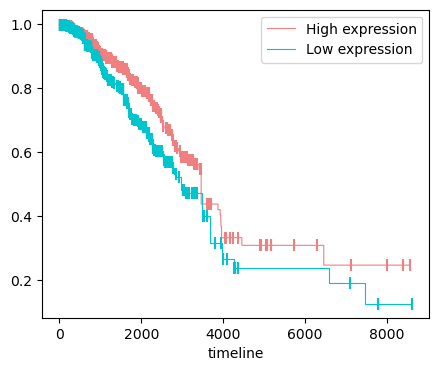

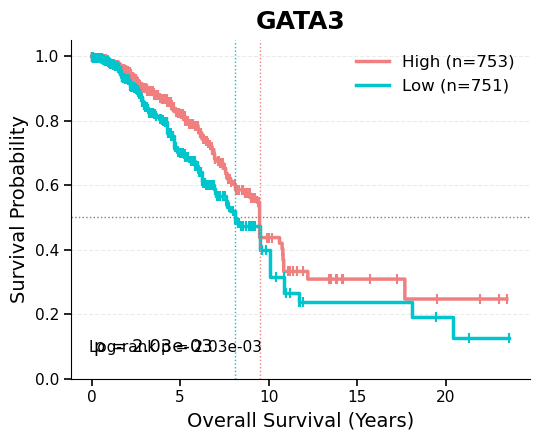

[SAVED] aspire_gnn_results/KM_GATA3.png

GENE: HES5
Merged: (1504, 6)
p = 0.06847211903964609


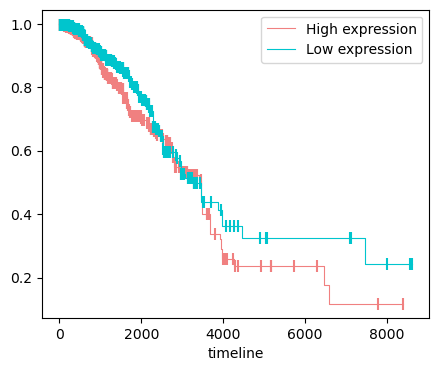

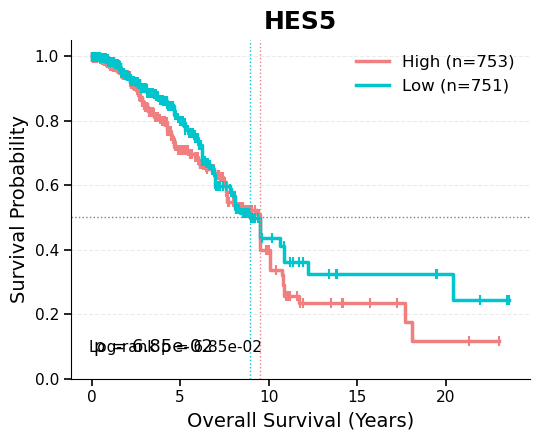

[SAVED] aspire_gnn_results/KM_HES5.png

GENE: TBX3
Merged: (1504, 6)
p = 0.47710392388940137


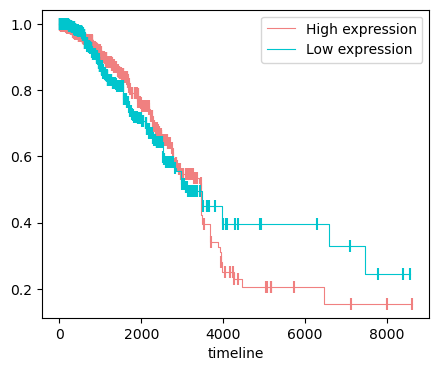

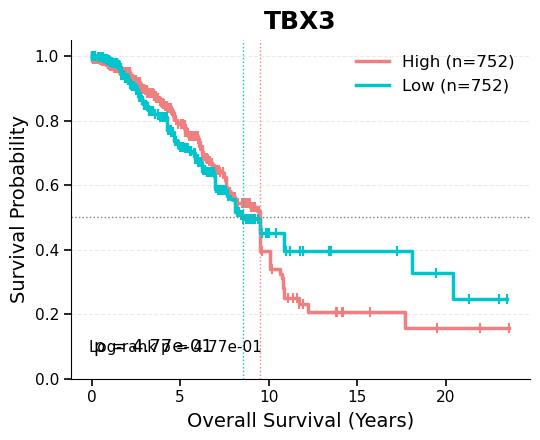

[SAVED] aspire_gnn_results/KM_TBX3.png

    Gene  Patients  High  Low    PValue  MedianOS_High  MedianOS_Low
0   TP53      1504   752  752  0.802512         1004.0         966.5
1  FOXA1      1504   752  752  0.128316          894.5        1034.0
2  GATA3      1504   753  751  0.002030          911.0        1009.0
3   HES5      1504   753  751  0.068472          974.0        1005.0
4   TBX3      1504   752  752  0.477104         1002.5         976.0
[SAVED] aspire_gnn_results/top5_gene_survival_summary.csv


In [53]:
# =====================================================
# SURVIVAL ANALYSIS FOR TOP 5 GENES
# WITH CENSOR MARKS + CLEAN STYLE
# =====================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test


# =====================================================
# TOP 5 GENES
# =====================================================

top_genes = (

    brca_gene_scores
    .abs()
    .sort_values(ascending=False)
    .head(5)
    .index
)

print("\nTop genes:")
print(top_genes.tolist())


# =====================================================
# STORAGE
# =====================================================

survival_summary_all = []


# =====================================================
# LOOP
# =====================================================

for gene in top_genes:

    print("\n================================")
    print("GENE:", gene)
    print("================================")

    # -------------------------------------------------
    # Skip missing
    # -------------------------------------------------

    if gene not in expr_df.index:

        print("[SKIP] Missing gene")

        continue


    # =================================================
    # GENE EXPRESSION
    # =================================================

    expr_gene = expr_df.loc[gene]

    patient_scores = pd.DataFrame({

        "Sample":
            expr_gene.index,

        "GENE_SCORE":
            expr_gene.values
    })

    patient_scores["PATIENT"] = (

        patient_scores["Sample"]
        .astype(str)
        .str.upper()
        .str[:12]
    )


    # =================================================
    # MERGE SURVIVAL
    # =================================================

    surv_gene = pd.merge(

        surv_df,

        patient_scores[
            [
                "PATIENT",
                "GENE_SCORE"
            ]
        ],

        on="PATIENT",

        how="inner"
    )

    surv_gene = surv_gene.dropna(
        subset=["GENE_SCORE"]
    )

    print(
        "Merged:",
        surv_gene.shape
    )

    if len(surv_gene) < 20:

        print("[SKIP] Too few patients")

        continue


    # =================================================
    # MEDIAN SPLIT
    # =================================================

    cutoff = (

        surv_gene["GENE_SCORE"]
        .median()
    )

    surv_gene["RiskGroup"] = np.where(

        surv_gene["GENE_SCORE"]
        >= cutoff,

        "High",

        "Low"
    )


    # =================================================
    # SPLIT
    # =================================================

    high_df = (

        surv_gene[
            surv_gene["RiskGroup"] == "High"
        ]
        .copy()
    )

    low_df = (

        surv_gene[
            surv_gene["RiskGroup"] == "Low"
        ]
        .copy()
    )


    # =================================================
    # CLEAN
    # =================================================

    for df in [high_df, low_df]:

        df["OS_TIME"] = pd.to_numeric(
            df["OS_TIME"],
            errors="coerce"
        )

        df["OS_EVENT"] = pd.to_numeric(
            df["OS_EVENT"],
            errors="coerce"
        )

        df.dropna(
            subset=[
                "OS_TIME",
                "OS_EVENT"
            ],
            inplace=True
        )

        df = df[
            df["OS_TIME"] > 0
        ]


    if len(high_df) == 0:

        print("[SKIP] High empty")

        continue

    if len(low_df) == 0:

        print("[SKIP] Low empty")

        continue


    # =================================================
    # LOGRANK
    # =================================================

    result = logrank_test(

        high_df["OS_TIME"],

        low_df["OS_TIME"],

        event_observed_A=
            high_df["OS_EVENT"],

        event_observed_B=
            low_df["OS_EVENT"]
    )

    pval = result.p_value

    print("p =", pval)


    # =================================================
    # KM FIT
    # =================================================

    kmf_high = KaplanMeierFitter()

    kmf_low = KaplanMeierFitter()


    kmf_high.fit(

        durations=
            high_df["OS_TIME"],

        event_observed=
            high_df["OS_EVENT"],

        label=
            "High expression"
    )


    kmf_low.fit(

        durations=
            low_df["OS_TIME"],

        event_observed=
            low_df["OS_EVENT"],

        label=
            "Low expression"
    )


    # =================================================
    # PLOT
    # =================================================

    plt.figure(figsize=(5, 4))

    ax = plt.gca()


    # -------------------------------------------------
    # HIGH
    # -------------------------------------------------

    kmf_high.plot_survival_function(

        ax=ax,

        ci_show=False,

        linewidth=0.8,

        color="#F08080",

        show_censors=True,

        censor_styles={

            "marker": "|",

            "ms": 8,

            "mew": 1.5
        }
    )


    # -------------------------------------------------
    # LOW
    # -------------------------------------------------

    kmf_low.plot_survival_function(

        ax=ax,

        ci_show=False,

        linewidth=0.8,

        color="#00C5CD",

        show_censors=True,

        censor_styles={

            "marker": "|",

            "ms": 8,

            "mew": 1.5
        }
    )


    # # =================================================
    # # STYLE
    # # =================================================

    # ax.spines["top"].set_visible(False)

    # ax.spines["right"].set_visible(False)

    # ax.grid(False)


    # # -------------------------------------------------
    # # REMOVE TITLES / LABELS / X TICKS
    # # -------------------------------------------------
    # # -------------------------------------------------
    # # KEEP X TICK NUMBERS
    # # -------------------------------------------------

    # plt.title(
    #     f"{gene}",
    #     fontsize=16,
    #     # fontweight="bold",
    #     pad=10
    # )

    # plt.xlabel("")

    # plt.ylabel("")


    # =================================================
    # AXES LABELS
    # =================================================

    # If OS_TIME is in days:
    high_years = high_df["OS_TIME"] / 365.25
    low_years  = low_df["OS_TIME"] / 365.25

    # Refit using years
    kmf_high.fit(
        high_years,
        event_observed=high_df["OS_EVENT"],
        label=f"High (n={len(high_df)})"
    )

    kmf_low.fit(
        low_years,
        event_observed=low_df["OS_EVENT"],
        label=f"Low (n={len(low_df)})"
    )


    plt.figure(figsize=(5.5, 4.5))

    ax = plt.gca()

    kmf_high.plot_survival_function(
        ax=ax,
        ci_show=False,
        linewidth=2.5,
        color="#F08080",
        show_censors=True,
        censor_styles={
            "marker": "|",
            "ms": 7,
            "mew": 1.5
        }
    )

    kmf_low.plot_survival_function(
        ax=ax,
        ci_show=False,
        linewidth=2.5,
        color="#00C5CD",
        show_censors=True,
        censor_styles={
            "marker": "|",
            "ms": 7,
            "mew": 1.5
        }
    )

    # =================================================
    # AXIS STYLE
    # =================================================

    ax.set_title(
        gene,
        fontsize=18,
        fontweight="bold",
        pad=8
    )

    ax.set_xlabel(
        "Overall Survival (Years)",
        fontsize=14
    )

    ax.set_ylabel(
        "Survival Probability",
        fontsize=14
    )

    ax.set_ylim(0, 1.05)

    ax.tick_params(
        axis="both",
        direction="out",
        length=5,
        width=1.2,
        labelsize=11
    )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.grid(
        axis="y",
        linestyle="--",
        alpha=0.25
    )

    median_high = kmf_high.median_survival_time_
    median_low  = kmf_low.median_survival_time_

    ax.axhline(
        0.5,
        color="gray",
        ls=":",
        lw=1
    )

    ax.axvline(
        median_high,
        color="#F08080",
        ls=":",
        lw=1
    )

    ax.axvline(
        median_low,
        color="#00C5CD",
        ls=":",
        lw=1
    )

    ax.text(
        0.04,
        0.08,
        f"Log-rank p = {pval:.2e}",
        transform=ax.transAxes,
        fontsize=11
    )

    # ax.legend(
    #     frameon=False,
    #     fontsize=11,
    #     loc="upper right"
    # )

    # survival_summary_all.append({
    #     "Gene": gene,
    #     "PValue": pval,
    #     "MedianSurvival_High_Years": median_high,
    #     "MedianSurvival_Low_Years": median_low,
    #     "Patients": len(surv_gene)
    # })


    # KEEP tick numbers visible
    ax.tick_params(

        axis="x",

        which="both",

        bottom=True,

        top=False,

        labelbottom=True
    )


    # -------------------------------------------------
    # P-VALUE
    # -------------------------------------------------

    plt.text(

        0.05,

        0.08,

        f"p = {pval:.2e}",

        transform=ax.transAxes,

        fontsize=13
    )


    # -------------------------------------------------
    # LEGEND
    # -------------------------------------------------

    plt.legend(

        frameon=False,

        fontsize=12,

        loc="upper right"
    )


    plt.tight_layout()


    # =================================================
    # SAVE
    # =================================================

    save_path = os.path.join(

        OUTPUT_DIR,

        f"KM_{gene}.png"
    )


    plt.savefig(

        save_path,

        dpi=300,

        bbox_inches="tight"
    )

    plt.show()


    print(
        "[SAVED]",
        save_path
    )


    # =================================================
    # SUMMARY
    # =================================================

    survival_summary_all.append({

        "Gene":
            gene,

        "Patients":
            len(surv_gene),

        "High":
            len(high_df),

        "Low":
            len(low_df),

        "PValue":
            pval,

        "MedianOS_High":
            high_df["OS_TIME"].median(),

        "MedianOS_Low":
            low_df["OS_TIME"].median()
    })


# =====================================================
# SAVE SUMMARY
# =====================================================

summary_df = pd.DataFrame(
    survival_summary_all
)

summary_path = os.path.join(

    OUTPUT_DIR,

    "top5_gene_survival_summary.csv"
)

summary_df.to_csv(

    summary_path,

    index=False
)

print("\n================================")
print(summary_df)
print("================================")

print(
    "[SAVED]",
    summary_path
)



Top genes:
['TP53', 'FOXA1', 'GATA3', 'HES5', 'TBX3']

GENE: TP53
Merged: (1504, 6)
p = 0.8025124990997152


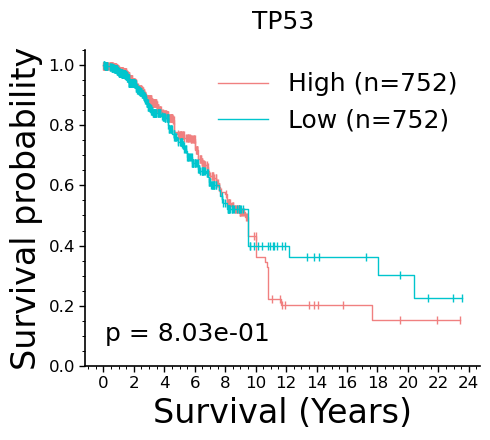

[SAVED] aspire_gnn_results/KM_TP53.png

GENE: FOXA1
Merged: (1504, 6)
p = 0.12831587992960752


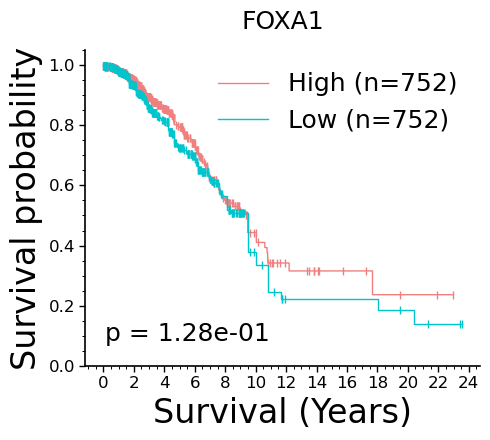

[SAVED] aspire_gnn_results/KM_FOXA1.png

GENE: GATA3
Merged: (1504, 6)
p = 0.0020298573907484717


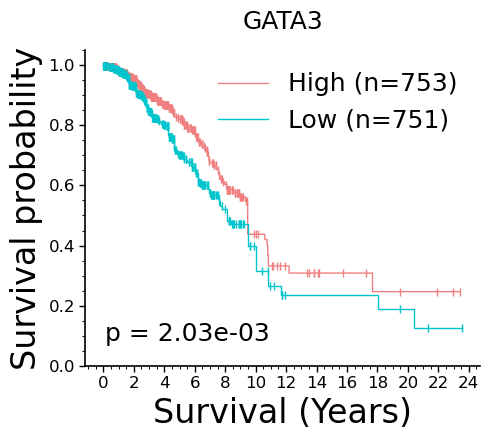

[SAVED] aspire_gnn_results/KM_GATA3.png

GENE: HES5
Merged: (1504, 6)
p = 0.06847211903964609


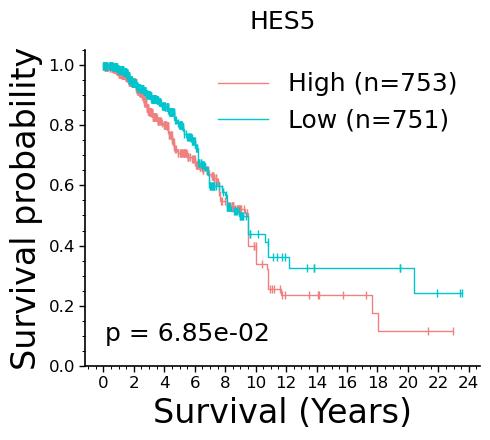

[SAVED] aspire_gnn_results/KM_HES5.png

GENE: TBX3
Merged: (1504, 6)
p = 0.47710392388940137


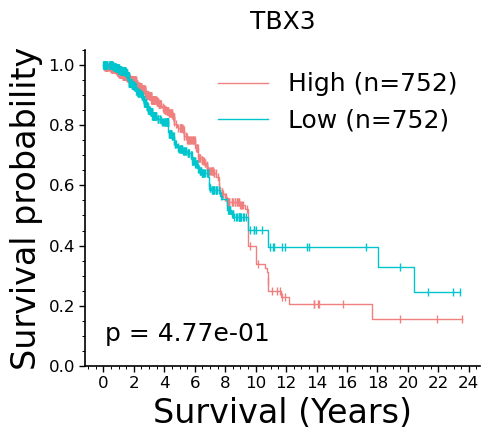

[SAVED] aspire_gnn_results/KM_TBX3.png
    Gene  Patients  High  Low    PValue  MedianSurvival_High_Years  \
0   TP53      1504   752  752  0.802512                   9.333333   
1  FOXA1      1504   752  752  0.128316                   9.475702   
2  GATA3      1504   753  751  0.002030                   9.478439   
3   HES5      1504   753  751  0.068472                   9.475702   
4   TBX3      1504   752  752  0.477104                   9.478439   

   MedianSurvival_Low_Years  
0                  9.478439  
1                  9.478439  
2                  8.117728  
3                  8.930869  
4                  8.558522  

[SAVED] aspire_gnn_results/top5_gene_survival_summary.csv


In [54]:
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# =====================================================
# TOP 5 GENES
# =====================================================

top_genes = (
    brca_gene_scores
    .abs()
    .sort_values(ascending=False)
    .head(5)
    .index
)

print("\nTop genes:")
print(top_genes.tolist())

# =====================================================
# STORAGE
# =====================================================

survival_summary_all = []

# =====================================================
# LOOP
# =====================================================

for gene in top_genes:

    print("\n================================")
    print("GENE:", gene)
    print("================================")

    if gene not in expr_df.index:

        print("[SKIP] Missing gene")
        continue

    # =================================================
    # EXPRESSION
    # =================================================

    expr_gene = expr_df.loc[gene]

    patient_scores = pd.DataFrame({

        "Sample":
            expr_gene.index,

        "GENE_SCORE":
            expr_gene.values
    })

    patient_scores["PATIENT"] = (

        patient_scores["Sample"]
        .astype(str)
        .str.upper()
        .str[:12]
    )

    # =================================================
    # MERGE
    # =================================================

    surv_gene = pd.merge(

        surv_df,

        patient_scores[
            [
                "PATIENT",
                "GENE_SCORE"
            ]
        ],

        on="PATIENT",

        how="inner"
    )

    surv_gene = surv_gene.dropna(
        subset=["GENE_SCORE"]
    )

    print(
        "Merged:",
        surv_gene.shape
    )

    if len(surv_gene) < 20:

        print("[SKIP] Too few patients")
        continue

    # =================================================
    # MEDIAN SPLIT
    # =================================================

    cutoff = surv_gene["GENE_SCORE"].median()

    surv_gene["RiskGroup"] = np.where(

        surv_gene["GENE_SCORE"] >= cutoff,

        "High",

        "Low"
    )

    high_df = (
        surv_gene[
            surv_gene["RiskGroup"] == "High"
        ]
        .copy()
    )

    low_df = (
        surv_gene[
            surv_gene["RiskGroup"] == "Low"
        ]
        .copy()
    )

    # =================================================
    # CLEAN SURVIVAL
    # =================================================

    for df in [high_df, low_df]:

        df["OS_TIME"] = pd.to_numeric(
            df["OS_TIME"],
            errors="coerce"
        )

        df["OS_EVENT"] = pd.to_numeric(
            df["OS_EVENT"],
            errors="coerce"
        )

    high_df = high_df.dropna(
        subset=["OS_TIME","OS_EVENT"]
    )

    low_df = low_df.dropna(
        subset=["OS_TIME","OS_EVENT"]
    )

    high_df = high_df[
        high_df["OS_TIME"] > 0
    ]

    low_df = low_df[
        low_df["OS_TIME"] > 0
    ]

    if len(high_df) == 0 or len(low_df) == 0:

        print("[SKIP] Empty group")
        continue

    # =================================================
    # YEARS
    # =================================================

    high_years = (
        high_df["OS_TIME"] / 365.25
    )

    low_years = (
        low_df["OS_TIME"] / 365.25
    )

    # =================================================
    # LOGRANK
    # =================================================

    result = logrank_test(

        high_years,

        low_years,

        event_observed_A=
            high_df["OS_EVENT"],

        event_observed_B=
            low_df["OS_EVENT"]
    )

    pval = result.p_value

    print(
        # "Log-rank p =",
        "p =",
        pval
    )

    # =================================================
    # KM FIT
    # =================================================

    kmf_high = KaplanMeierFitter()

    kmf_low = KaplanMeierFitter()

    kmf_high.fit(

        high_years,

        event_observed=
            high_df["OS_EVENT"],

        label=
            f"High (n={len(high_df)})"
    )

    kmf_low.fit(

        low_years,

        event_observed=
            low_df["OS_EVENT"],

        label=
            f"Low (n={len(low_df)})"
    )

    # =================================================
    # MEDIAN SURVIVAL
    # =================================================

    median_high = (
        kmf_high.median_survival_time_
    )

    median_low = (
        kmf_low.median_survival_time_
    )

    # =================================================
    # FIGURE
    # =================================================

    fig, ax = plt.subplots(
        figsize=(5.0,4.5)
    )

    kmf_high.plot_survival_function(

        ax=ax,

        ci_show=False,

        linewidth=1.0,

        color="#F08080",

        show_censors=True,

        censor_styles={
            "marker": "|",
            "ms": 6,
            "mew": 1.0
        }
    )

    kmf_low.plot_survival_function(

        ax=ax,

        ci_show=False,

        linewidth=1.0,

        color="#00C5CD",

        show_censors=True,

        censor_styles={
            "marker": "|",
            "ms": 6,
            "mew": 1.0
        }
    )

    # =================================================
    # AXES
    # =================================================

    ax.set_title(
        gene,
        fontsize=18,
        pad=15
    )

    ax.set_xlabel(
        "Survival (Years)",
        fontsize=24
    )

    ax.set_ylabel(
        "Survival probability",
        fontsize=24
    )

    ax.set_ylim(0, 1.05)

    # -------------------------------------------------
    # FORCE TICK MARKS TO SHOW
    # -------------------------------------------------

    ax.tick_params(
        axis="both",
        which="major",
        bottom=True,
        left=True,
        top=False,
        right=False,
        direction="out",
        length=4,
        width=1.0,
        labelsize=12
    )

    # Optional minor ticks
    ax.minorticks_on()

    ax.tick_params(
        axis="both",
        which="minor",
        bottom=True,
        left=True,
        length=2.5,
        width=0.7
    )

    # -------------------------------------------------
    # Spine styling
    # -------------------------------------------------

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.spines["left"].set_linewidth(1.2)
    ax.spines["bottom"].set_linewidth(1.2)

    # -------------------------------------------------
    # Explicit tick locations
    # -------------------------------------------------

    ax.set_yticks(np.arange(0, 1.1, 0.2))

    max_years = max(
        high_years.max(),
        low_years.max()
    )

    ax.set_xticks(
        np.arange(
            0,
            np.ceil(max_years) + 1,
            2
        )
    )


    # ax.grid(
    #     axis="y",
    #     linestyle="--",
    #     alpha=0.25
    # )

    # # =================================================
    # # MEDIAN LINES
    # # =================================================

    # ax.axhline(
    #     0.5,
    #     color="gray",
    #     ls=":",
    #     lw=0.8
    # )

    # if np.isfinite(median_high):

    #     ax.axvline(
    #         median_high,
    #         color="#F08080",
    #         ls=":",
    #         lw=0.8
    #     )

    # if np.isfinite(median_low):

    #     ax.axvline(
    #         median_low,
    #         color="#00C5CD",
    #         ls=":",
    #         lw=0.8
    #     )

    # =================================================
    # P VALUE
    # =================================================

    ax.text(

        0.05,

        0.08,

        # f"Log-rank p = {pval:.2e}",
        f"p = {pval:.2e}",

        transform=ax.transAxes,

        fontsize=18
    )

    # =================================================
    # LEGEND
    # =================================================

    ax.legend(

        frameon=False,

        fontsize=18,

        loc="upper right"
    )

    plt.tight_layout()

    # =================================================
    # SAVE
    # =================================================

    save_path = os.path.join(

        OUTPUT_DIR,

        f"KM_{gene}.png"
    )

    plt.savefig(

        save_path,

        dpi=300,

        bbox_inches="tight"
    )

    plt.show()

    print("[SAVED]", save_path)

    # =================================================
    # SUMMARY
    # =================================================

    survival_summary_all.append({

        "Gene":
            gene,

        "Patients":
            len(surv_gene),

        "High":
            len(high_df),

        "Low":
            len(low_df),

        "PValue":
            pval,

        "MedianSurvival_High_Years":
            median_high,

        "MedianSurvival_Low_Years":
            median_low
    })

# =====================================================
# SAVE SUMMARY
# =====================================================

summary_df = pd.DataFrame(
    survival_summary_all
)

summary_path = os.path.join(

    OUTPUT_DIR,

    "top5_gene_survival_summary.csv"
)

summary_df.to_csv(

    summary_path,

    index=False
)

print(summary_df)

print(
    "\n[SAVED]",
    summary_path
)


In [55]:
# =================================================
# AXES LABELS
# =================================================

# If OS_TIME is in days:
high_years = high_df["OS_TIME"] / 365.25
low_years  = low_df["OS_TIME"] / 365.25

# Refit using years
kmf_high.fit(
    high_years,
    event_observed=high_df["OS_EVENT"],
    label=f"High (n={len(high_df)})"
)

kmf_low.fit(
    low_years,
    event_observed=low_df["OS_EVENT"],
    label=f"Low (n={len(low_df)})"
)


<lifelines.KaplanMeierFitter:"Low (n=752)", fitted with 752 total observations, 602 right-censored observations>

In [56]:
# =====================================================
# KEEP OMICS + CANCER LABELS
# =====================================================

# omics_types = [
#     "GE",
#     "MF",
#     "miRNA",
# ]

cancers = sorted({
    c.split(": ")[1]
    for c in omics_df.columns
})

# ----------------------------------------
# Build gene × (OMICS:CANCER) matrix
# ----------------------------------------
gene_cancer_matrix = pd.DataFrame(
    index=omics_df.index,
    dtype=float
)

for omics in omics_types:

    for cancer in cancers:

        col_name = f"{omics}: {cancer}"

        matching_cols = [
            c for c in omics_df.columns
            if c == col_name
        ]

        if len(matching_cols) == 0:
            continue

        # If multiple columns exist, average them
        gene_cancer_matrix[col_name] = (
            omics_df[matching_cols]
            .mean(axis=1)
        )

print("gene_cancer_matrix shape:")
print(gene_cancer_matrix.shape)

print("\nColumns:")
print(gene_cancer_matrix.columns.tolist())


gene_cancer_matrix shape:
(6655, 21)

Columns:
['GE: BLCA', 'GE: BRCA', 'GE: COAD', 'GE: ESCA', 'GE: LUAD', 'GE: LUSC', 'GE: STAD', 'MF: BLCA', 'MF: BRCA', 'MF: COAD', 'MF: ESCA', 'MF: LUAD', 'MF: LUSC', 'MF: STAD', 'MIRNA: BLCA', 'MIRNA: BRCA', 'MIRNA: COAD', 'MIRNA: ESCA', 'MIRNA: LUAD', 'MIRNA: LUSC', 'MIRNA: STAD']


In [57]:
print("GE example:")
print(ge_df.columns[:20])

print("\nMutation example:")
print(mf_df.columns[:20])

print("\nMetabolic example:")
print(metabo_df.columns[:20])


GE example:
Index(['TSPAN6 (7105)', 'TNMD (64102)', 'DPM1 (8813)', 'SCYL3 (57147)',
       'FIRRM (55732)', 'FGR (2268)', 'CFH (3075)', 'FUCA2 (2519)',
       'GCLC (2729)', 'NFYA (4800)', 'STPG1 (90529)', 'NIPAL3 (57185)',
       'LAS1L (81887)', 'ENPP4 (22875)', 'SEMA3F (6405)', 'CFTR (1080)',
       'ANKIB1 (54467)', 'CYP51A1 (1595)', 'KRIT1 (889)', 'RAD52 (5893)'],
      dtype='object')

Mutation example:
Index(['A1BG', 'A1CF', 'A2M', 'A2ML1', 'A3GALT2', 'A4GALT', 'A4GNT', 'AAAS',
       'AACS', 'AADAC', 'AADACL2', 'AADACL3', 'AADACL4', 'AADAT', 'AAGAB',
       'AAK1', 'AAMDC', 'AAMP', 'AANAT', 'AAR2'],
      dtype='object', name='HugoSymbol')

Metabolic example:
Index(['CCLE_ID', '2-aminoadipate', '3-phosphoglycerate',
       'alpha-glycerophosphate', '4-pyridoxate', 'aconitate', 'adenine',
       'adipate', 'alpha-ketoglutarate', 'AMP', 'citrate', 'isocitrate', 'CMP',
       'cystathionine', 'cytidine', 'dCMP', 'DHAP/glyceraldehyde 3P',
       'erythrose-4-phosphate', 'F1P/F6P/G1

In [58]:
print("GE sample:", list(ge.index[:5]))
print("MF sample:", list(mf.index[:5]))
print("MIRNA sample:", list(mirna.index[:5]))
print("DRUG sample:", drug_matrix.index[:5] if 'drug_matrix' in globals() else "not built yet")


GE sample: ['ACH-001113', 'ACH-001289', 'ACH-001339', 'ACH-001979', 'ACH-002438']
MF sample: ['A1BG', 'A1CF', 'A2M', 'A2ML1', 'A3GALT2']
MIRNA sample: ['ACH-000698', 'ACH-000489', 'ACH-000431', 'ACH-000707', 'ACH-000509']
DRUG sample: not built yet


In [59]:
ge_df = pd.read_csv(GE_FILE, index_col=0)

print(ge_df.shape)
print(ge_df.head())
print(ge_df.columns[:5])


(1684, 19205)
            TSPAN6 (7105)  TNMD (64102)  DPM1 (8813)  SCYL3 (57147)  \
ACH-001113       4.956577      0.000000     7.577648       3.179411   
ACH-001289       4.954992      0.617243     7.334747       2.783576   
ACH-001339       3.421952      0.000000     7.546069       2.615880   
ACH-001979       4.651643      0.000000     5.946408       2.454515   
ACH-002438       4.336705      0.000000     6.879387       2.262824   

            FIRRM (55732)  FGR (2268)  CFH (3075)  FUCA2 (2519)  GCLC (2729)  \
ACH-001113       4.765742    0.037483    1.510547      3.103039     6.697482   
ACH-001289       3.736280    0.000000    0.149060      3.855960     4.377061   
ACH-001339       4.476233    0.064571    1.397491      6.833915     3.980336   
ACH-001979       1.852111    0.000000    7.680796      6.156866     5.042574   
ACH-002438       3.256491    0.000000    2.253926      6.895436     3.470992   

            NFYA (4800)  ...  H3C3 (8352)  CIMIP3 (114841037)  \
ACH-001113   

In [60]:
print("mut:", len(set(mut_matrix.index)))
print("ge:", len(set(ge_df.index)))
print("mirna:", len(set(mirna_df.index)))

common_cells = set(mut_matrix.index) & set(ge_df.index) & set(mirna_df.index)

print("common:", len(common_cells))
print(list(common_cells)[:10])


mut: 1968
ge: 1684
mirna: 680
common: 680
['ACH-000822', 'ACH-000007', 'ACH-000945', 'ACH-000783', 'ACH-000528', 'ACH-000211', 'ACH-000158', 'ACH-000744', 'ACH-000098', 'ACH-000870']


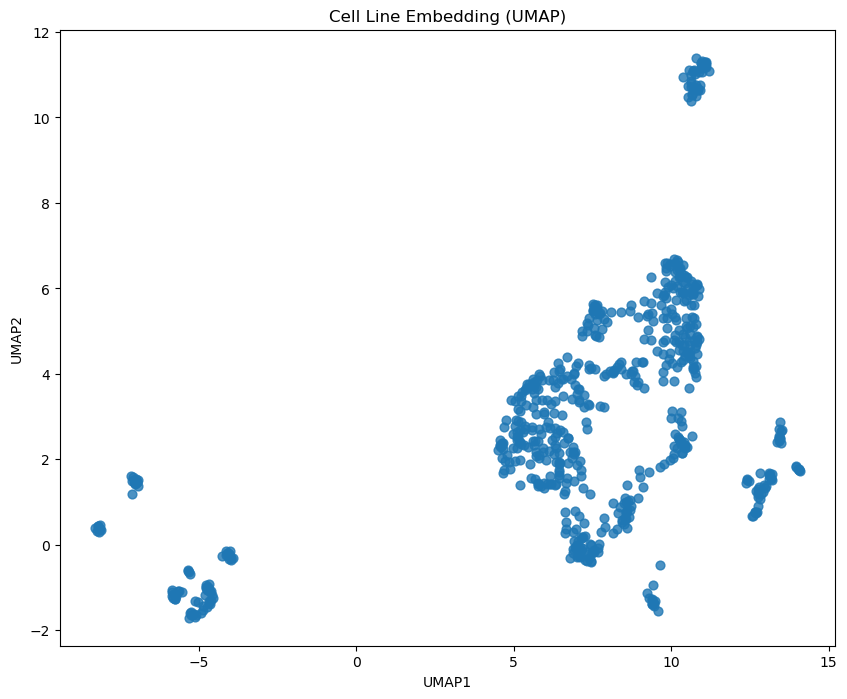

In [61]:
plt.figure(figsize=(10, 8))

plt.scatter(
    X_umap[:, 0],
    X_umap[:, 1],
    s=40,
    alpha=0.8
)

plt.title("Cell Line Embedding (UMAP)")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")

plt.show()


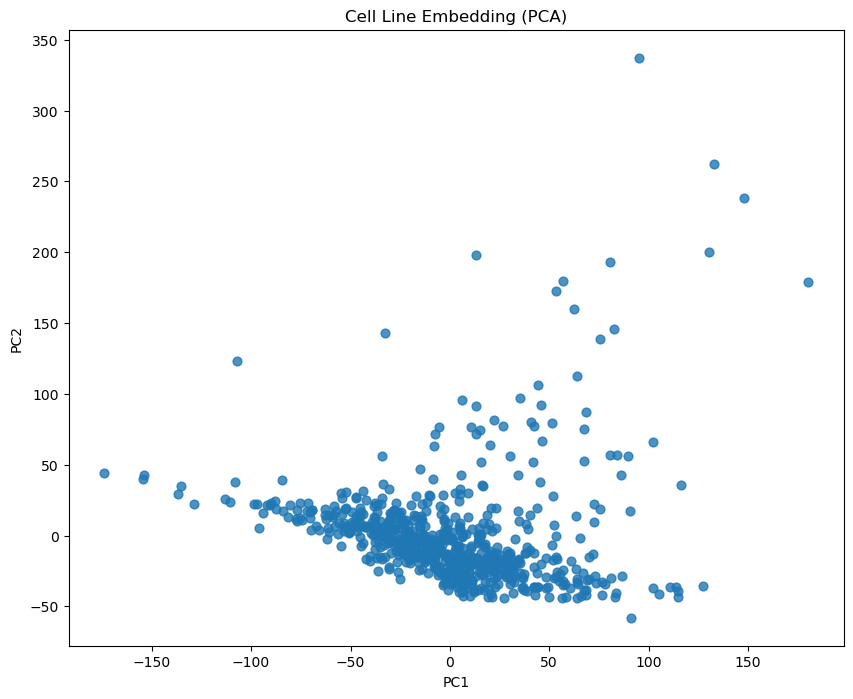

In [62]:
plt.figure(figsize=(10, 8))

plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1],
    s=40,
    alpha=0.8
)

plt.title("Cell Line Embedding (PCA)")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.show()


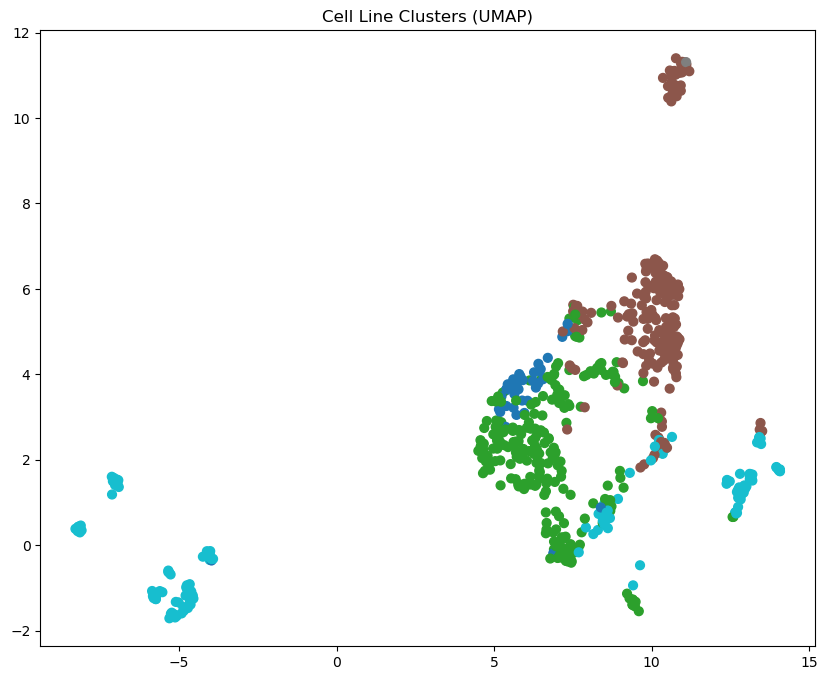

In [63]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(X)

plt.figure(figsize=(10, 8))

plt.scatter(
    X_umap[:, 0],
    X_umap[:, 1],
    c=clusters,
    cmap="tab10",
    s=40
)

plt.title("Cell Line Clusters (UMAP)")
plt.show()


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


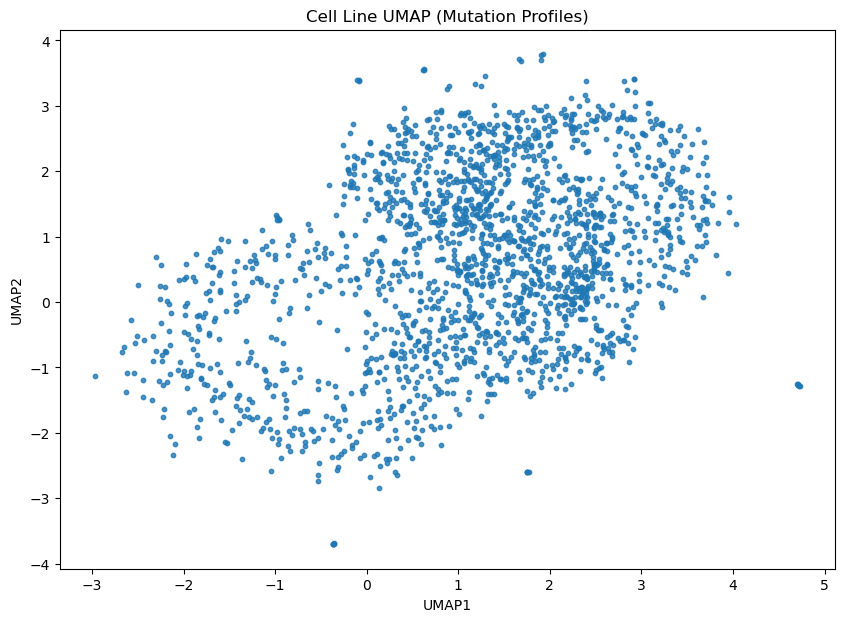

In [64]:
import umap
import matplotlib.pyplot as plt

# use mutation signal as example embedding
X = mutation_matrix.fillna(0).values

reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    random_state=42
)

X_umap = reducer.fit_transform(X)

plt.figure(figsize=(10,7))
plt.scatter(
    X_umap[:,0],
    X_umap[:,1],
    s=10,
    alpha=0.8
)
plt.title("Cell Line UMAP (Mutation Profiles)")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.show()


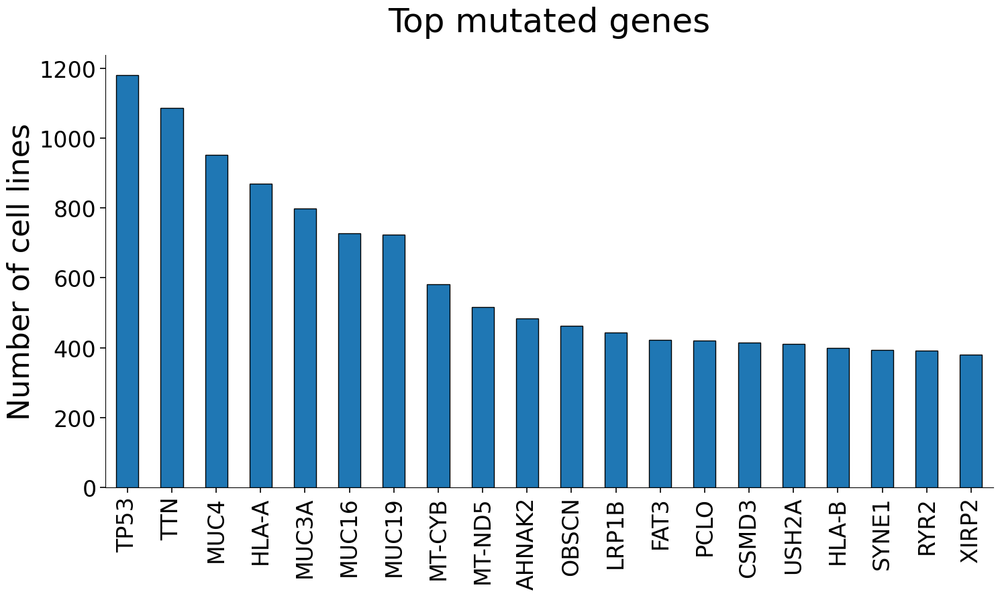

In [65]:
top_genes = (
    binary_mutation
    .sum(axis=0)
    .sort_values(ascending=False)
    .head(20)
)

fig, ax = plt.subplots(figsize=(15, 9))

top_genes.plot(
    kind="bar",
    ax=ax,
    edgecolor="black"
)

# --------------------------------------------------
# Title with extra spacing
# --------------------------------------------------
ax.set_title(
    "Top mutated genes",
    fontsize=36,
    pad=25
)

ax.set_xlabel("")
ax.set_ylabel(
    "Number of cell lines",
    fontsize=32
)

# --------------------------------------------------
# Tick labels
# --------------------------------------------------
ax.tick_params(
    axis="x",
    labelsize=24,
    rotation=90,
    direction="out",
    length=6,
    width=1.2,
    bottom=True
)

ax.tick_params(
    axis="y",
    labelsize=24,
    direction="out",
    length=6,
    width=1.2,
    left=True
)

# --------------------------------------------------
# Ensure tick marks are visible
# --------------------------------------------------
ax.xaxis.set_ticks_position("bottom")
ax.yaxis.set_ticks_position("left")

# Optional cleaner style
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()


In [66]:
print("Mutation:", list(mutation_matrix.index[:5]))
print("GE:", list(ge_df.index[:5]))


Mutation: ['ACH-000001', 'ACH-000002', 'ACH-000004', 'ACH-000005', 'ACH-000006']
GE: ['ACH-001113', 'ACH-001289', 'ACH-001339', 'ACH-001979', 'ACH-002438']


In [67]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from pathlib import Path

# =====================================================
# LOAD
# =====================================================

ge_df = pd.read_csv(GE_FILE, index_col=0)
mf_df = pd.read_csv(MF_FILE, index_col=0)
mirna_df = pd.read_csv(MIRNA_FILE, index_col=0)
meta_df = pd.read_csv(META_FILE)

print("GE:", ge_df.shape)
print("MF:", mf_df.shape)
print("miRNA:", mirna_df.shape)


GE: (1684, 19205)
MF: (20004, 1968)
miRNA: (954, 734)


In [68]:
print(len(set(ge_df.columns)))
print(len(set(mf_df.columns)))
print(len(set(mirna_df.columns)))

print("GE sample:", list(ge_df.columns[:5]))
print("MF sample:", list(mf_df.columns[:5]))
print("miRNA sample:", list(mirna_df.columns[:5]))


19205
1968
734
GE sample: ['TSPAN6 (7105)', 'TNMD (64102)', 'DPM1 (8813)', 'SCYL3 (57147)', 'FIRRM (55732)']
MF sample: ['1156QE8', '127399', '1411H', '143B', '1618K']
miRNA sample: ['MIMAT0000062', 'MIMAT0000063', 'MIMAT0000064', 'MIMAT0000065', 'MIMAT0000066']


In [69]:
ge_df = pd.read_csv("../data/OmicsExpressionProteinCodingGenesTPMLogp1.csv", index_col=0)

# ensure: rows = cell lines, cols = genes
print("GE:", ge_df.shape)


GE: (1684, 19205)


In [70]:
mirna_df = pd.read_csv("../data/CCLE_miRNA_MIMAT.csv", index_col=0)

# ensure numeric only
mirna_df = mirna_df.apply(pd.to_numeric, errors="coerce").fillna(0)

# check orientation
print("miRNA:", mirna_df.shape)

if mirna_df.shape[0] < mirna_df.shape[1]:
    mirna_df = mirna_df.T


miRNA: (954, 734)


In [71]:
common_cells = (
    set(ge_df.index)
    & set(mf_df.index)
    & set(mirna_df.index)
)

common_cells = sorted(common_cells)

ge_df = ge_df.loc[common_cells]
mf_df = mf_df.loc[common_cells]
mirna_df = mirna_df.loc[common_cells]

print("Aligned cells:", len(common_cells))


Aligned cells: 0


In [72]:
mut_raw = pd.read_csv("../data/OmicsSomaticMutations.csv")

print(mut_raw.columns.tolist())
print(mut_raw.head())


/var/folders/z_/4_txl3tn61g8nprq0_s7tsbc0000gn/T/ipykernel_9286/302305640.py:1: DtypeWarning: Columns (28,49,52,55,56,58,59,61) have mixed types. Specify dtype option on import or set low_memory=False.
  mut_raw = pd.read_csv("../data/OmicsSomaticMutations.csv")


['Unnamed: 0', 'SequencingID', 'ModelID', 'ModelConditionID', 'IsDefaultEntryForModel', 'IsDefaultEntryForMC', 'Chrom', 'Pos', 'Ref', 'Alt', 'AF', 'DP', 'RefCount', 'AltCount', 'GT', 'PS', 'VariantType', 'VariantInfo', 'DNAChange', 'ProteinChange', 'HugoSymbol', 'Exon', 'Intron', 'EnsemblGeneID', 'EnsemblFeatureID', 'HgncName', 'HgncFamily', 'UniprotID', 'DbsnpRsID', 'GcContent', 'NMD', 'MolecularConsequence', 'VepImpact', 'VepBiotype', 'VepHgncID', 'VepExistingVariation', 'VepManeSelect', 'VepENSP', 'VepSwissprot', 'Sift', 'Polyphen', 'GnomadeAF', 'GnomadgAF', 'VepClinSig', 'VepSomatic', 'VepPliGeneValue', 'VepLofTool', 'OncogeneHighImpact', 'TumorSuppressorHighImpact', 'TranscriptLikelyLof', 'Brca1FuncScore', 'CivicID', 'CivicDescription', 'CivicScore', 'LikelyLoF', 'HessDriver', 'HessSignature', 'RevelScore', 'PharmgkbId', 'GwasDisease', 'GwasPmID', 'GtexGene', 'ProveanPrediction', 'AMClass', 'AMPathogenicity', 'Rescue', 'RescueReason', 'Hotspot', 'EntrezGeneID']
   Unnamed: 0 Seque

In [73]:
# Map ModelID → Correct CCLE name

if "ModelID" in meta_df.columns:
    id_map = dict(zip(meta_df["ModelID"], meta_df["ModelID"]))
else:
    id_map = {}

def clean_cols(df):
    df.columns = df.columns.astype(str).str.strip()
    return df

ge_df = clean_cols(ge_df)
mf_df = clean_cols(mf_df)
mirna_df = clean_cols(mirna_df)


In [74]:
# =====================================================
# BUILD GENE × (OMICS:CANCER) MATRIX
# WITH:
#
#   OMICS:
#       GE
#       miRNA
#       MF
#
#   CANCERS:
#       BLCA
#       BRCA
#       COAD
#       ESCA
#       LUAD
#       LUSC
#       STAD
#
# INCLUDING:
#   - TCGA samples
#   - Cell-line aggregated cancer groups
#
# =====================================================

import pandas as pd
import numpy as np

# =====================================================
# USER SETTINGS
# =====================================================

# omics_types = [
#     'GE',
#     'miRNA',
#     'MF'
# ]

cancer_types = [
    'BLCA',
    'BRCA',
    'COAD',
    'ESCA',
    'LUAD',
    'LUSC',
    'STAD'
]

# =====================================================
# REQUIRED INPUT
# =====================================================
#
# omics_df
#
# Columns format examples:
#
#   GE: BLCA
#   MF: LUAD
#   miRNA: BRCA
#
#   GE: A549
#   MF: MCF7
#   miRNA: HCT116
#
# =====================================================

# =====================================================
# LOAD MODEL METADATA
# =====================================================

MODEL_FILE = "../data/Model.csv"

model_df = pd.read_csv(MODEL_FILE)

print("[INFO] Loaded Model.csv")
print(model_df.shape)

# =====================================================
# IDENTIFY COLUMN TYPES
# =====================================================

sample_info = {}

for col in omics_df.columns:

    omics = col.split(": ")[0]

    sample = col.split(": ")[1]

    sample_upper = sample.upper()

    # -------------------------------------------------
    # TCGA cancer
    # -------------------------------------------------

    if sample_upper in cancer_types:

        sample_info[col] = {

            "omics": omics,
            "sample": sample_upper,
            "cancer": sample_upper,
            "type": "Tumor"
        }

    # -------------------------------------------------
    # Cell line
    # -------------------------------------------------

    else:

        sample_info[col] = {

            "omics": omics,
            "sample": sample_upper,
            "cancer": None,
            "type": "CellLine"
        }

# =====================================================
# MAP CELL LINES → CANCERS
# =====================================================

# -----------------------------------------------------
# Possible metadata columns
# -----------------------------------------------------

possible_name_cols = [

    "CellLineName",
    "cell_line_name",
    "StrippedCellLineName",
    "ModelID"
]

possible_cancer_cols = [

    "OncotreeCode",
    "OncotreePrimaryDisease",
    "OncotreeLineage"
]

name_col = None
cancer_col = None

for c in possible_name_cols:

    if c in model_df.columns:

        name_col = c
        break

for c in possible_cancer_cols:

    if c in model_df.columns:

        cancer_col = c
        break

print("\n[INFO] Using columns:")
print("Cell line column:", name_col)
print("Cancer column:", cancer_col)

# =====================================================
# BUILD CELL LINE → CANCER MAP
# =====================================================

tmp = model_df[[name_col, cancer_col]].copy()

tmp[name_col] = (
    tmp[name_col]
    .astype(str)
    .str.upper()
    .str.strip()
)

tmp[cancer_col] = (
    tmp[cancer_col]
    .astype(str)
    .str.upper()
    .str.strip()
)

# -----------------------------------------------------
# Normalize cancer labels
# -----------------------------------------------------

def normalize_cancer_label(x):

    mapping = {

        "LUNG": "LUAD",
        "LUNG CANCER": "LUAD",

        "BREAST": "BRCA",
        "BREAST CANCER": "BRCA",

        "BLADDER": "BLCA",

        "STOMACH": "STAD",

        "COLON": "COAD",

        "ESOPHAGUS": "ESCA"
    }

    if x in cancer_types:

        return x

    if x in mapping:

        return mapping[x]

    return None

tmp["CancerMapped"] = (
    tmp[cancer_col]
    .apply(normalize_cancer_label)
)

cellline_to_cancer = dict(

    zip(
        tmp[name_col],
        tmp["CancerMapped"]
    )
)

# =====================================================
# ASSIGN CELL LINE CANCERS
# =====================================================

for col in sample_info:

    if sample_info[col]["type"] == "CellLine":

        sample = sample_info[col]["sample"]

        if sample in cellline_to_cancer:

            sample_info[col]["cancer"] = (
                cellline_to_cancer[sample]
            )

# =====================================================
# BUILD GENE × (OMICS:CANCER) MATRIX
# =====================================================

gene_cancer_matrix = pd.DataFrame(

    index=omics_df.index,

    dtype=float
)

# =====================================================
# AGGREGATE
# =====================================================

for omics in omics_types:

    for cancer in cancer_types:

        # ---------------------------------------------
        # Find matching columns
        # ---------------------------------------------

        matching_cols = [

            col

            for col, info in sample_info.items()

            if (

                info["omics"] == omics

                and

                info["cancer"] == cancer
            )
        ]

        if len(matching_cols) == 0:

            continue

        # ---------------------------------------------
        # Aggregate
        # ---------------------------------------------

        new_col = f"{omics}: {cancer}"

        gene_cancer_matrix[new_col] = (

            omics_df[matching_cols]

            .mean(axis=1)
        )

        print(
            f"[INFO] {new_col} "
            f"← {len(matching_cols)} samples"
        )

# =====================================================
# CLEAN MATRIX
# =====================================================

gene_cancer_matrix = (

    gene_cancer_matrix

    .replace([np.inf, -np.inf], np.nan)

    .fillna(0)
)

# =====================================================
# SUMMARY
# =====================================================

print("\n========================================")
print("GENE × (OMICS:CANCER) MATRIX")
print("========================================")

print("\nShape:")
print(gene_cancer_matrix.shape)

print("\nColumns:")
print(gene_cancer_matrix.columns.tolist())

# =====================================================
# SAVE
# =====================================================

gene_cancer_matrix.to_csv(

    "./gene_cancer_matrix_integrated.csv"
)

print("\nSaved:")
print("./gene_cancer_matrix_integrated.csv")

# =====================================================
# OPTIONAL:
# SAVE COLUMN METADATA
# =====================================================

column_metadata = []

for col in gene_cancer_matrix.columns:

    omics = col.split(": ")[0]

    cancer = col.split(": ")[1]

    column_metadata.append({

        "Column": col,
        "Omics": omics,
        "Cancer": cancer
    })

column_metadata = pd.DataFrame(column_metadata)

column_metadata.to_csv(

    "./gene_cancer_matrix_metadata.csv",

    index=False
)

print("\nSaved:")
print("./gene_cancer_matrix_metadata.csv")


[INFO] Loaded Model.csv
(2154, 49)

[INFO] Using columns:
Cell line column: CellLineName
Cancer column: OncotreeCode
[INFO] GE: BLCA ← 1 samples
[INFO] GE: BRCA ← 1 samples
[INFO] GE: COAD ← 1 samples
[INFO] GE: ESCA ← 1 samples
[INFO] GE: LUAD ← 1 samples
[INFO] GE: LUSC ← 1 samples
[INFO] GE: STAD ← 1 samples
[INFO] MF: BLCA ← 1 samples
[INFO] MF: BRCA ← 1 samples
[INFO] MF: COAD ← 1 samples
[INFO] MF: ESCA ← 1 samples
[INFO] MF: LUAD ← 1 samples
[INFO] MF: LUSC ← 1 samples
[INFO] MF: STAD ← 1 samples
[INFO] MIRNA: BLCA ← 1 samples
[INFO] MIRNA: BRCA ← 1 samples
[INFO] MIRNA: COAD ← 1 samples
[INFO] MIRNA: ESCA ← 1 samples
[INFO] MIRNA: LUAD ← 1 samples
[INFO] MIRNA: LUSC ← 1 samples
[INFO] MIRNA: STAD ← 1 samples

GENE × (OMICS:CANCER) MATRIX

Shape:
(6655, 21)

Columns:
['GE: BLCA', 'GE: BRCA', 'GE: COAD', 'GE: ESCA', 'GE: LUAD', 'GE: LUSC', 'GE: STAD', 'MF: BLCA', 'MF: BRCA', 'MF: COAD', 'MF: ESCA', 'MF: LUAD', 'MF: LUSC', 'MF: STAD', 'MIRNA: BLCA', 'MIRNA: BRCA', 'MIRNA: COAD', '

In [75]:
# =========================================================
# PROCESS DEPMAP / CCLE MUTATION FILE
# Convert mutation table -> Gene × CellLine matrix
# =========================================================

import pandas as pd
import numpy as np

# =========================================================
# INPUT
# =========================================================

MUT_FILE = "../data/mutations_NAsdropped.csv"

# =========================================================
# LOAD
# =========================================================

mut_df = pd.read_csv(MUT_FILE)

print("Original shape:")
print(mut_df.shape)

# =========================================================
# KEEP IMPORTANT COLUMNS
# =========================================================

keep_cols = [
    "cell_line_display_name",
    "depmap_id",
    "gene",
    "variant_type",
    "oncogenic",
    "mutation_effect",
    "likely_lof",
    "hess_driver",
    "vep_impact",
    "af"
]

keep_cols = [
    c for c in keep_cols
    if c in mut_df.columns
]

mut_df = mut_df[keep_cols]

print("\nFiltered shape:")
print(mut_df.shape)

# =========================================================
# CLEAN GENE NAMES
# =========================================================

mut_df = mut_df.dropna(subset=["gene"])

mut_df["gene"] = (
    mut_df["gene"]
    .astype(str)
    .str.upper()
    .str.strip()
)

# =========================================================
# OPTIONAL:
# KEEP ONLY HIGH-IMPACT MUTATIONS
# =========================================================

if "vep_impact" in mut_df.columns:

    mut_df = mut_df[
        mut_df["vep_impact"].isin([
            "HIGH",
            "MODERATE"
        ])
    ]

print("\nAfter impact filtering:")
print(mut_df.shape)

# =========================================================
# CREATE MUTATION SCORE
# =========================================================

# default mutation score
mut_df["mutation_score"] = 1.0

# ---------------------------------------------------------
# Increase score for oncogenic mutations
# ---------------------------------------------------------

if "oncogenic" in mut_df.columns:

    mut_df.loc[
        mut_df["oncogenic"].astype(str).str.contains(
            "oncogenic",
            case=False,
            na=False
        ),
        "mutation_score"
    ] += 2.0

# ---------------------------------------------------------
# Increase score for likely loss-of-function
# ---------------------------------------------------------

if "likely_lof" in mut_df.columns:

    mut_df.loc[
        mut_df["likely_lof"] == True,
        "mutation_score"
    ] += 1.5

# ---------------------------------------------------------
# Increase score for known driver
# ---------------------------------------------------------

if "hess_driver" in mut_df.columns:

    mut_df.loc[
        mut_df["hess_driver"] == True,
        "mutation_score"
    ] += 2.0

# ---------------------------------------------------------
# Weight by allele frequency if available
# ---------------------------------------------------------

if "af" in mut_df.columns:

    mut_df["af"] = pd.to_numeric(
        mut_df["af"],
        errors="coerce"
    ).fillna(0)

    mut_df["mutation_score"] *= (
        1 + mut_df["af"]
    )

# =========================================================
# BUILD GENE × CELL_LINE MATRIX
# =========================================================

mutation_matrix = mut_df.pivot_table(

    index="gene",

    columns="cell_line_display_name",

    values="mutation_score",

    aggfunc="max",

    fill_value=0

)

print("\nMutation matrix shape:")
print(mutation_matrix.shape)

# =========================================================
# OPTIONAL BINARIZATION
# =========================================================

binary_matrix = (
    mutation_matrix > 0
).astype(int)

print("\nBinary matrix shape:")
print(binary_matrix.shape)

# =========================================================
# COVERAGE STATISTICS
# =========================================================

coverage = (
    binary_matrix.sum(axis=1)
    .sort_values(ascending=False)
)

print("\nTop mutated genes:")
print(coverage.head(20))

# =========================================================
# SAVE
# =========================================================

mutation_matrix.to_csv(
    "../data/processed/cellline_mutation_matrix_weighted.csv"
)

binary_matrix.to_csv(
    "../data/processed/cellline_mutation_matrix_binary.csv"
)

coverage.to_csv(
    "../data/processed/cellline_gene_mutation_coverage.csv"
)

print("\nSaved:")
print(" - cellline_mutation_matrix_weighted.csv")
print(" - cellline_mutation_matrix_binary.csv")
print(" - cellline_gene_mutation_coverage.csv")

# =========================================================
# OPTIONAL:
# ALIGN WITH YOUR TCGA GENES
# =========================================================

# Example:
# tcga_genes = pd.read_csv(
#     "../process/data/processed/multiomics_7cancers_normalized_2866.csv",
#     index_col=0
# ).index

# mutation_matrix = mutation_matrix.loc[
#     mutation_matrix.index.intersection(tcga_genes)
# ]

# =========================================================
# OPTIONAL:
# NORMALIZE
# =========================================================

mutation_matrix_log = np.log1p(
    mutation_matrix
)

mutation_matrix_log.to_csv(
    "../data/processed/cellline_mutation_matrix_log1p.csv"
)

print("\nSaved normalized matrix")


/var/folders/z_/4_txl3tn61g8nprq0_s7tsbc0000gn/T/ipykernel_9286/2547314082.py:19: DtypeWarning: Columns (23,29,38,48,50) have mixed types. Specify dtype option on import or set low_memory=False.
  mut_df = pd.read_csv(MUT_FILE)


Original shape:
(1537171, 70)

Filtered shape:
(1537171, 10)

After impact filtering:
(1536326, 10)

Mutation matrix shape:
(20004, 1968)

Binary matrix shape:
(20004, 1968)

Top mutated genes:
gene
TP53      1171
TTN       1052
MUC4       697
MUC16      692
HLA-A      685
MUC19      564
LRP1B      427
MUC3A      422
OBSCN      409
PCLO       405
CSMD3      397
USH2A      392
AHNAK2     389
XIRP2      374
RYR2       373
SYNE1      371
FAT3       361
KMT2D      356
ZFHX4      345
CSMD1      342
dtype: int64

Saved:
 - cellline_mutation_matrix_weighted.csv
 - cellline_mutation_matrix_binary.csv
 - cellline_gene_mutation_coverage.csv

Saved normalized matrix


In [76]:
# =====================================================
# Split gene-cancer matrix into per-omics sub-matrices
# =====================================================
# NOTE: `omics_matrices` was referenced below (and later, in the Leiden
# biclustering section) but never actually constructed anywhere in the
# notebook -- the cell that built it was apparently lost during editing.
# Column names follow the "{OMICS}: {CANCER}" convention established when
# gene_cancer_matrix was built, so we split on that prefix.

def split_gene_cancer_by_omics(df):
    """Split a gene x (OMICS: CANCER) matrix into {omics_name: sub_dataframe}."""
    omics_matrices = {}
    for col in df.columns:
        omics_name = col.split(": ")[0]
        omics_matrices.setdefault(omics_name, []).append(col)
    return {
        omics_name: df[cols]
        for omics_name, cols in omics_matrices.items()
    }

omics_matrices = split_gene_cancer_by_omics(gene_cancer_matrix)
print("Built omics_matrices for:", list(omics_matrices.keys()))


Built omics_matrices for: ['GE', 'MF', 'MIRNA']


Processing GE: (6655, 7)
[INFO] Plotting GE: (6396, 7)
[SAVED] results/gene_prediction_0.8/GE_gene_cancer_bipartite_heatmap.png


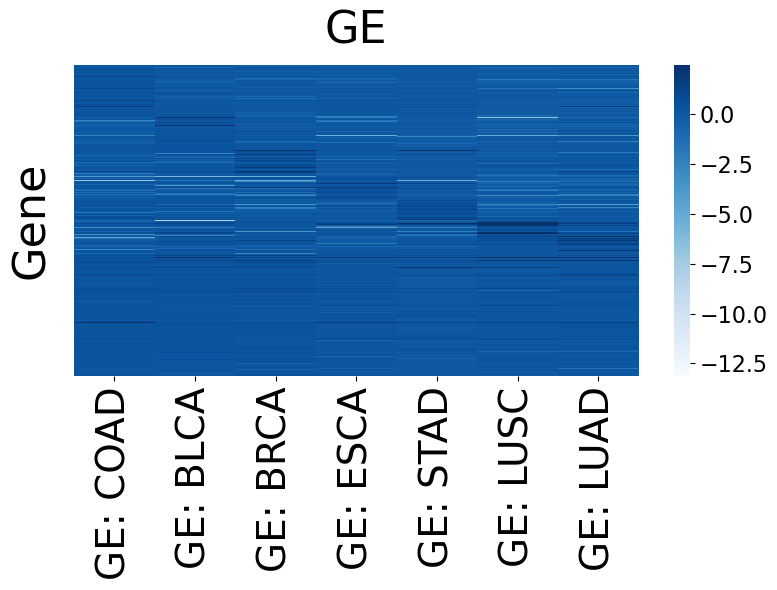

Number of genes: 6396


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated 

Reactome pathways: 8333
Processing MF: (6655, 7)
[INFO] Plotting MF: (2178, 7)
[SAVED] results/gene_prediction_0.8/MF_gene_cancer_bipartite_heatmap.png


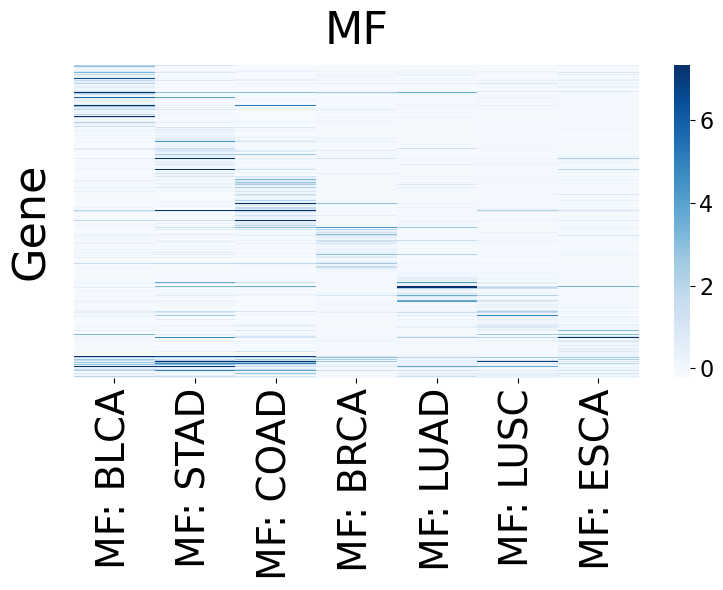

Number of genes: 2178


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated 

Reactome pathways: 7479
Processing MIRNA: (6655, 7)
[INFO] Plotting MIRNA: (6037, 7)
[SAVED] results/gene_prediction_0.8/MIRNA_gene_cancer_bipartite_heatmap.png


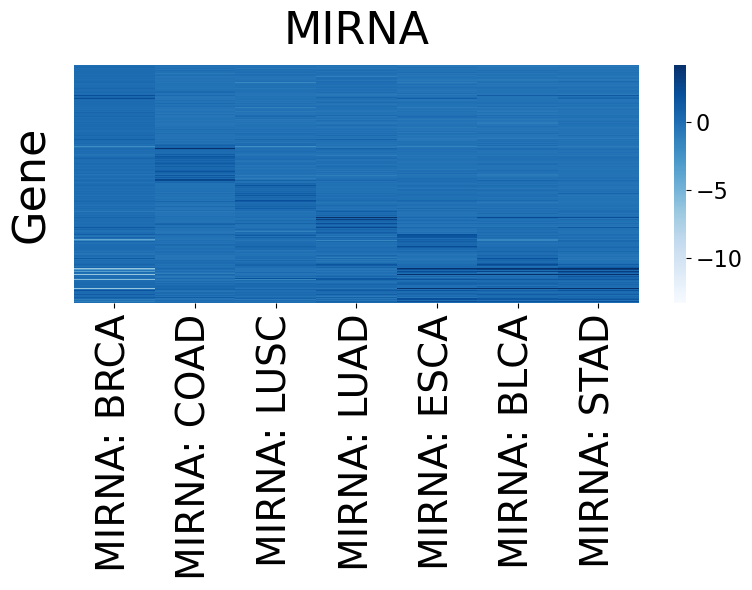

Number of genes: 6037


/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(
/Users/ericsali/miniforge3/envs/kg39/lib/python3.9/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated 

Reactome pathways: 8314


In [77]:
# =====================================================
# OMICS-SPECIFIC REACTOME ENRICHMENT
# =====================================================

import os
import pandas as pd
import numpy as np
import gseapy as gp

# -----------------------------------------------------
# Store all enrichment outputs
# -----------------------------------------------------
omics_enrichment_results = {}

# -----------------------------------------------------
# Store pathway dictionaries
# -----------------------------------------------------
omics_pathway_gene_dicts = {}

# =====================================================
# Loop over omics matrices
# =====================================================
for omics, mat in omics_matrices.items():

    print("=" * 60)
    print(f"Processing {omics}: {mat.shape}")

    # -------------------------------------------------
    # Leiden bipartite clustering
    # -------------------------------------------------
    reordered, gene_clust, cancer_clust = (
        leiden_bipartite_clustering(
            mat,
            resolution=3.0
        )
    )

    # -------------------------------------------------
    # Save reordered matrix
    # -------------------------------------------------
    reordered.to_csv(
        os.path.join(
            output_dir,
            f"{omics}_gene_cancer_matrix_leiden.csv"
        )
    )

    # -------------------------------------------------
    # Plot heatmap
    # -------------------------------------------------
    plot_omics_bipartite_heatmap(
        reordered,
        gene_clusters=gene_clust,
        cancer_clusters=cancer_clust,
        omics=omics,
        output_dir=output_dir,
        vmax_percentile=99,
        figsize=(8, 6),
    )

    # =================================================
    # Extract genes
    # =================================================
    genes = reordered.index.tolist()

    genes = [
        g for g in genes
        if isinstance(g, str)
    ]

    genes = list(set(genes))

    print(f"Number of genes: {len(genes)}")

    # Skip very small gene sets
    if len(genes) < 5:

        print(f"Skipping {omics}: too few genes")
        continue

    # =================================================
    # Reactome enrichment
    # =================================================
    try:

        enr = gp.enrichr(

            gene_list=genes,

            gene_sets=[

                "Reactome_Pathways_2024",

                "GO_Biological_Process_2026",

                "KEGG_2026"

            ],

            organism='Human',

            outdir=os.path.join(
                output_dir,
                f"{omics}_reactome"
            ),

            cutoff=0.5
        )

        enrichment_df = enr.results.copy()

        # ---------------------------------------------
        # Keep useful columns
        # ---------------------------------------------
        enrichment_df = enrichment_df[[
            "Term",
            "Adjusted P-value",
            "Genes",
            "Overlap"
        ]]

        enrichment_df.columns = [
            "Pathway",
            "AdjustedPValue",
            "Genes",
            "Overlap"
        ]

        enrichment_df = enrichment_df.sort_values(
            "AdjustedPValue"
        )

        # ---------------------------------------------
        # Save enrichment table
        # ---------------------------------------------
        enrichment_df.to_csv(
            os.path.join(
                output_dir,
                f"{omics}_reactome_enrichment.csv"
            ),
            index=False
        )

        # ---------------------------------------------
        # Save enrichment dataframe
        # ---------------------------------------------
        omics_enrichment_results[omics] = enrichment_df

        # =================================================
        # Build pathway_gene_dict
        # =================================================
        pathway_gene_dict = {}

        for _, row in enrichment_df.iterrows():

            pathway = row["Pathway"]

            genes_raw = row["Genes"]

            if isinstance(genes_raw, str):

                pathway_genes = [
                    g.strip()
                    for g in genes_raw.split(";")
                    if g.strip()
                ]

            else:
                pathway_genes = []

            pathway_gene_dict[pathway] = pathway_genes

        # ---------------------------------------------
        # Store dictionary
        # ---------------------------------------------
        omics_pathway_gene_dicts[omics] = (
            pathway_gene_dict
        )

        print(
            f"Reactome pathways: "
            f"{len(pathway_gene_dict)}"
        )

    except Exception as e:

        print(
            f"Reactome enrichment failed "
            f"for {omics}"
        )

        print(e)


## Multi-Omics Reactome Projection and Biological Interpretation

This analysis decomposes the latent graph representation into multiple omics-specific biological programs.

The pipeline performs:

1. Gene–cancer matrix construction
2. Saliency weighting
3. Omics-specific decomposition
4. Reactome enrichment
5. Pathway–gene graph analysis
6. Hallmark pathway projection

This creates biologically interpretable latent representations linking:

$$
\text{Genes}
\rightarrow
\text{Pathways}
\rightarrow
\text{Cancer Programs}
\rightarrow
\text{Cancer Types}
$$

The framework captures:

- cancer-specific importance
- pathway-driver coupling
- latent multi-omics biology
- interpretable graph structure

For a gene $g_i$ and cancer $c_j$:

$$
M_{ij}
=
x_{ij}
\cdot
s_i
$$

where:

- $x_{ij}$ is omics activity
- $s_i$ is GNN saliency

This produces a saliency-weighted biological interaction matrix.

## Hallmark Projection Per Omics

Each omics modality captures distinct biological mechanisms.

Gene expression (GE) often captures:

- cell cycle
- proliferation
- immune activation

Methylation (MF) often captures:

- epigenetic repression
- chromatin regulation
- developmental programs

miRNA frequently captures:

- post-transcriptional regulation
- signaling suppression
- metastasis control

Projecting enriched pathways into hallmark systems enables interpretation of modality-specific biology.

In [78]:
# =====================================================
# HALLMARK PROJECTION FOR EACH OMICS
# =====================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------------------
# Hallmark keyword mapping
# -----------------------------------------------------
HALLMARK_MAP = {

    "Cell Cycle": [
        "cell cycle",
        "mitotic",
        "checkpoint",
        "dna replication",
        "g2m",
        "e2f",
        "cyclin",
    ],

    "DNA Repair": [
        "dna repair",
        "homologous recombination",
        "mismatch repair",
        "double strand",
        "fanconi",
        "base excision",
        "nucleotide excision",
        "atm",
        "atr",
        "p53",
    ],

    "Immune": [
        "immune",
        "interferon",
        "cytokine",
        "jak-stat",
        "nf-kb",
        "chemokine",
        "t cell",
        "b cell",
        "antigen",
        "inflammatory",
    ],

    "PI3K/AKT": [
        "pi3k",
        "akt",
        "mtor",
        "growth factor",
    ],

    "EMT / Metastasis": [
        "emt",
        "migration",
        "adhesion",
        "integrin",
        "extracellular matrix",
        "metastasis",
    ],

    "Apoptosis": [
        "apoptosis",
        "cell death",
        "caspase",
        "trail",
    ],

    "Hypoxia": [
        "hypoxia",
        "angiogenesis",
        "hif",
        "vascular",
    ],

    "MYC Signaling": [
        "myc",
        "translation",
        "ribosome",
        "rna processing",
    ],
}

# =====================================================
# Store hallmark projections
# =====================================================

omics_hallmark_results = {}

for omics in omics_enrichment_results.keys():

    print("\n=================================")
    print(f"Hallmark projection: {omics}")
    print("=================================")

    enrichment_df = (
        omics_enrichment_results[omics]
    )

    hallmark_rows = []

    # -------------------------------------------------
    # Map pathways to hallmark systems
    # -------------------------------------------------
    for _, row in enrichment_df.iterrows():

        pathway = str(row["Pathway"]).lower()

        pval = row["AdjustedPValue"]

        if pval <= 0:
            continue

        score = -np.log10(pval)

        matched = False

        for hallmark, keywords in HALLMARK_MAP.items():

            for kw in keywords:

                if kw in pathway:

                    hallmark_rows.append({

                        "Hallmark": hallmark,
                        "Pathway": row["Pathway"],
                        "Score": score,
                    })

                    matched = True
                    break

            if matched:
                break

    hallmark_df = pd.DataFrame(hallmark_rows)

    omics_hallmark_results[omics] = hallmark_df

    print(hallmark_df.head())



Hallmark projection: GE
        Hallmark                                  Pathway       Score
0         Immune                            Immune System  165.766452
1  MYC Signaling  Post-translational Protein Modification  107.503611
2         Immune      Cytokine Signaling in Immune System   85.576432
3         Immune                     Innate Immune System   69.182012
4     Cell Cycle                               Cell Cycle   56.699473

Hallmark projection: MF
        Hallmark                                  Pathway      Score
0         Immune                            Immune System  37.218329
1         Immune      Cytokine Signaling in Immune System  25.711248
2         Immune                     Innate Immune System  20.084320
3  MYC Signaling  Post-translational Protein Modification  16.442140
4       PI3K/AKT               PI3K-AKT SIGNALING PATHWAY  14.521040

Hallmark projection: MIRNA
        Hallmark                                  Pathway       Score
0         Immune  


Hallmark projection: GE
        Hallmark                                  Pathway       Score
0         Immune                            Immune System  165.766452
1  MYC Signaling  Post-translational Protein Modification  107.503611
2         Immune      Cytokine Signaling in Immune System   85.576432
3         Immune                     Innate Immune System   69.182012
4     Cell Cycle                               Cell Cycle   56.699473

Hallmark projection: MF
        Hallmark                                  Pathway      Score
0         Immune                            Immune System  37.218329
1         Immune      Cytokine Signaling in Immune System  25.711248
2         Immune                     Innate Immune System  20.084320
3  MYC Signaling  Post-translational Protein Modification  16.442140
4       PI3K/AKT               PI3K-AKT SIGNALING PATHWAY  14.521040

Hallmark projection: MIRNA
        Hallmark                                  Pathway       Score
0         Immune  

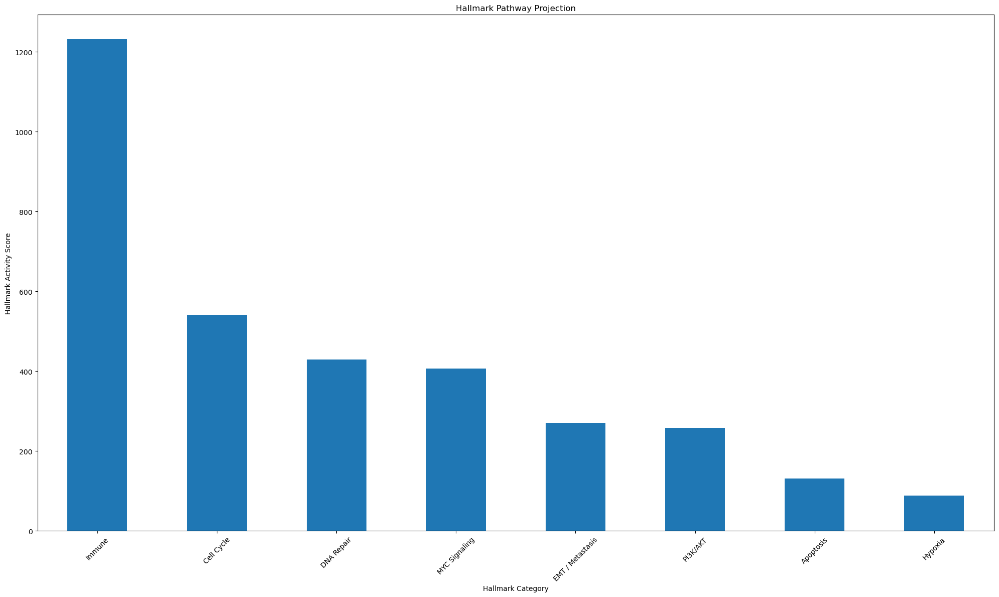

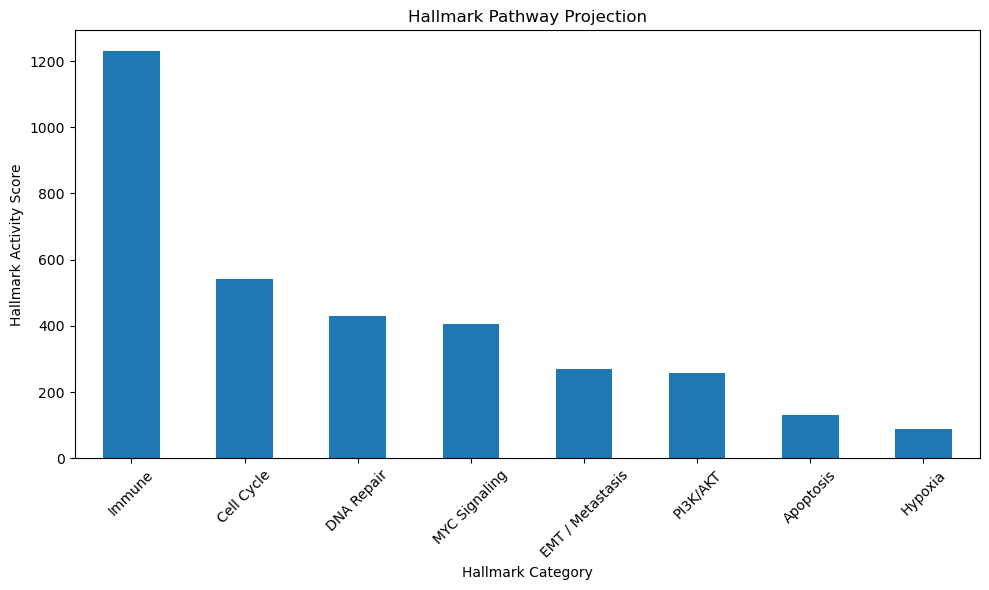

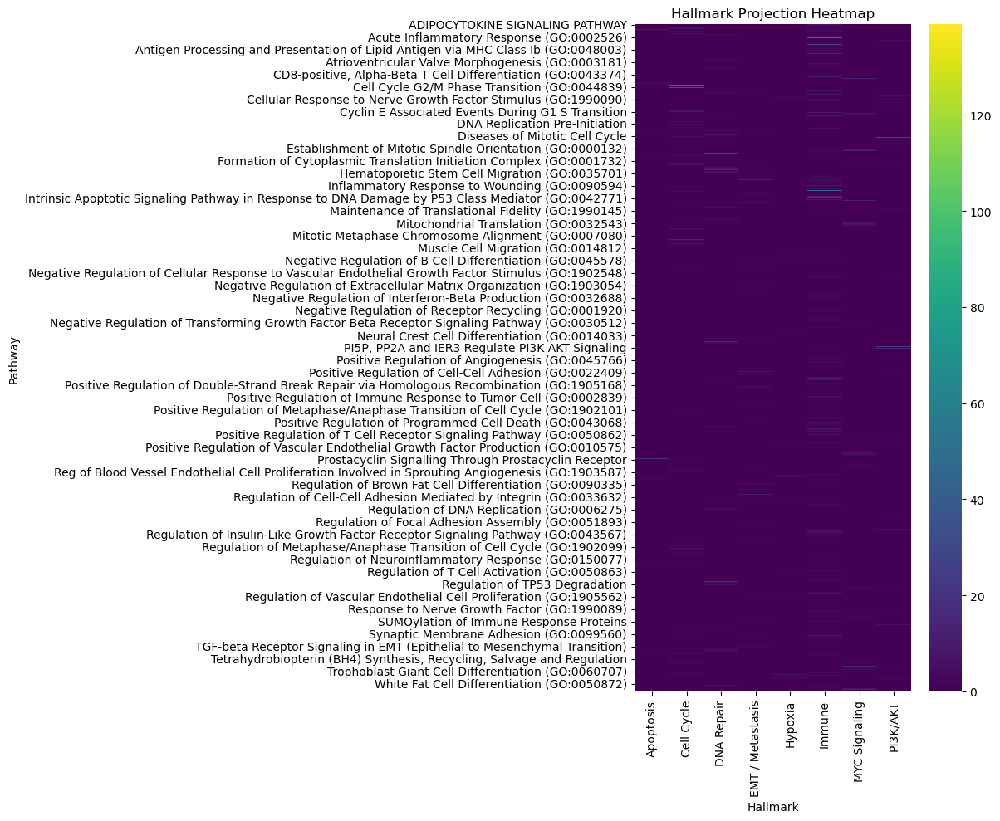


Hallmark projection: GE
        Hallmark                                  Pathway       Score
0         Immune                            Immune System  165.766452
1  MYC Signaling  Post-translational Protein Modification  107.503611
2         Immune      Cytokine Signaling in Immune System   85.576432
3         Immune                     Innate Immune System   69.182012
4     Cell Cycle                               Cell Cycle   56.699473

Hallmark projection: MF
        Hallmark                                  Pathway      Score
0         Immune                            Immune System  37.218329
1         Immune      Cytokine Signaling in Immune System  25.711248
2         Immune                     Innate Immune System  20.084320
3  MYC Signaling  Post-translational Protein Modification  16.442140
4       PI3K/AKT               PI3K-AKT SIGNALING PATHWAY  14.521040

Hallmark projection: MIRNA
        Hallmark                                  Pathway       Score
0         Immune  

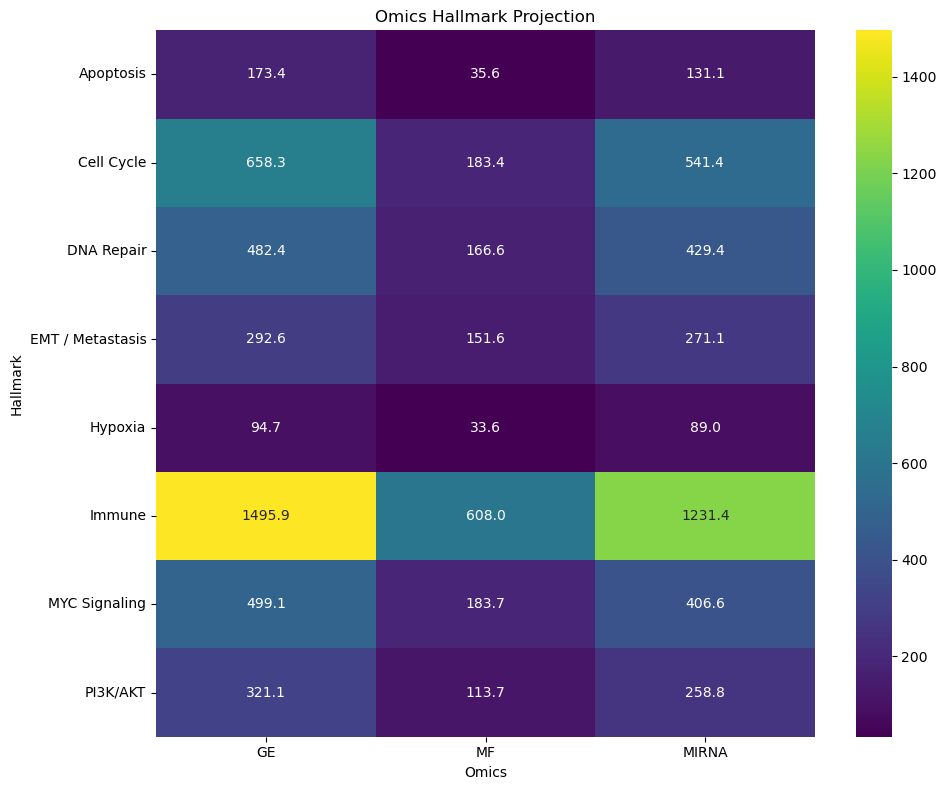

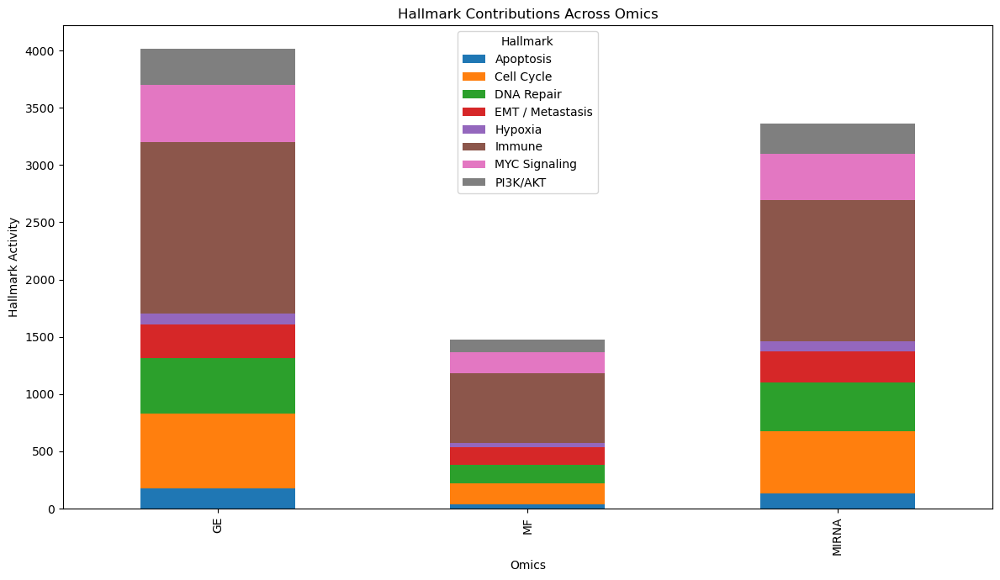

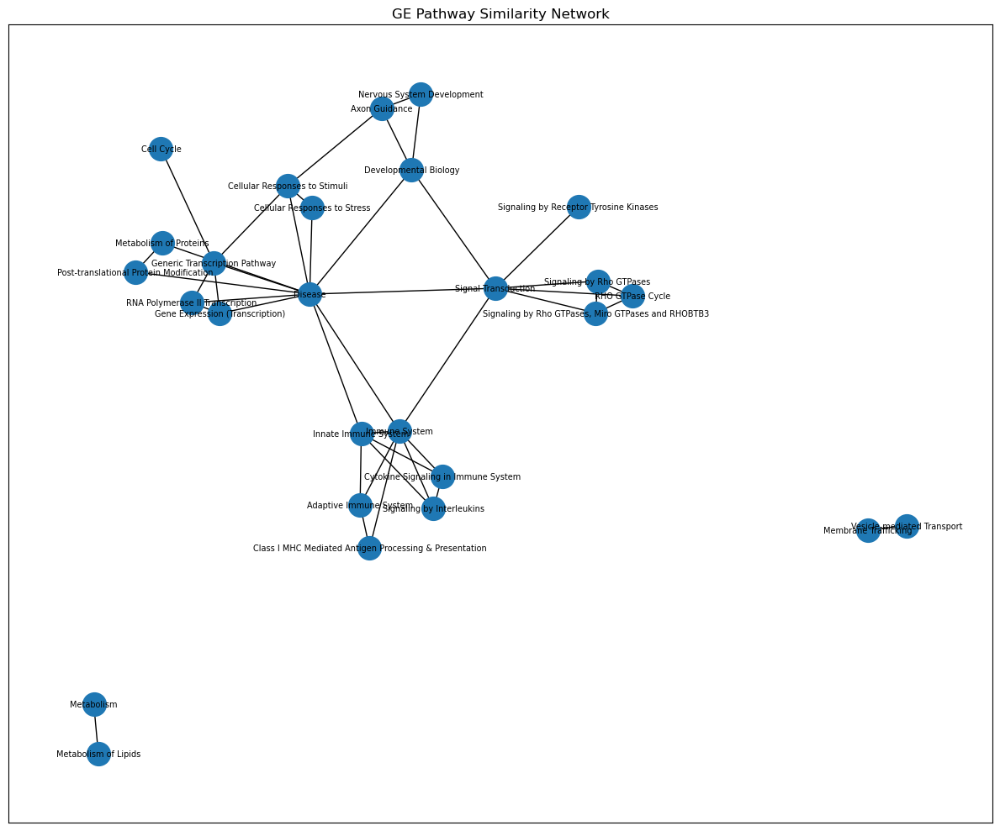

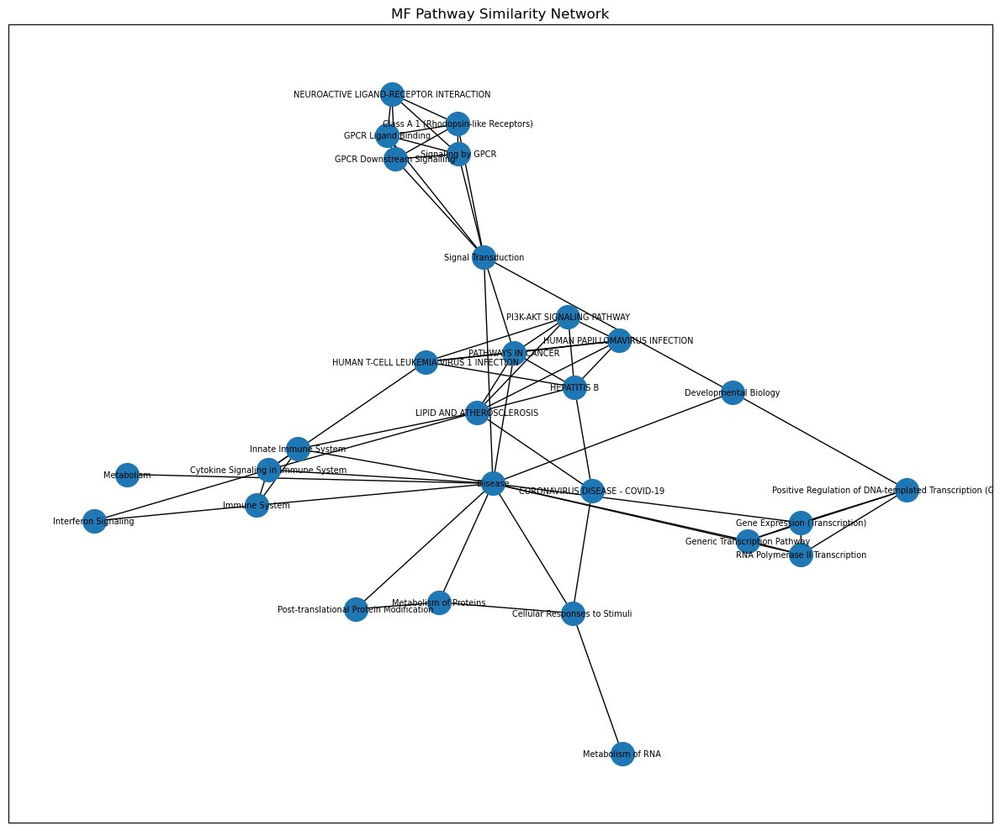

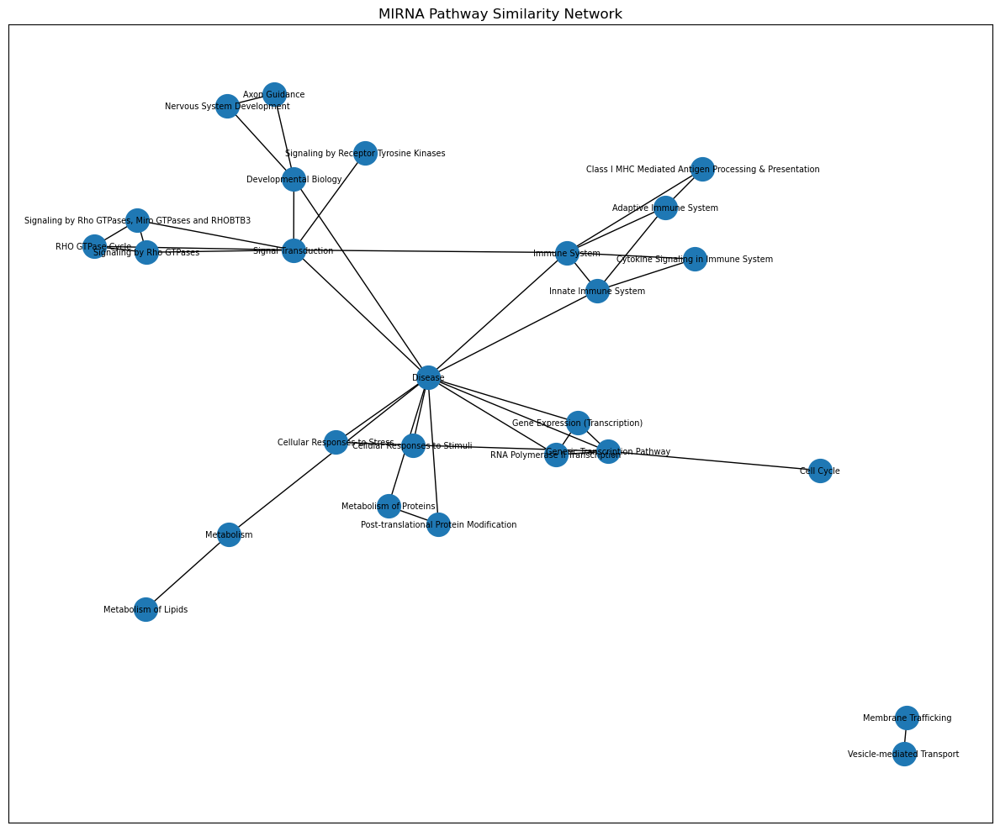

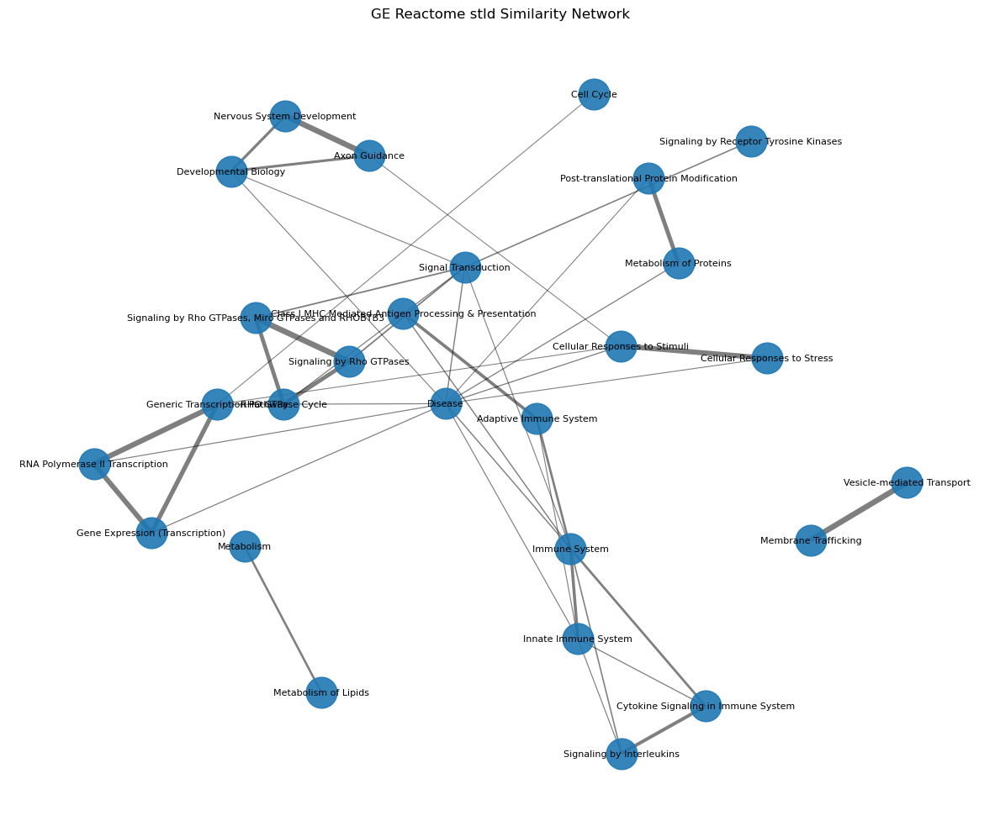

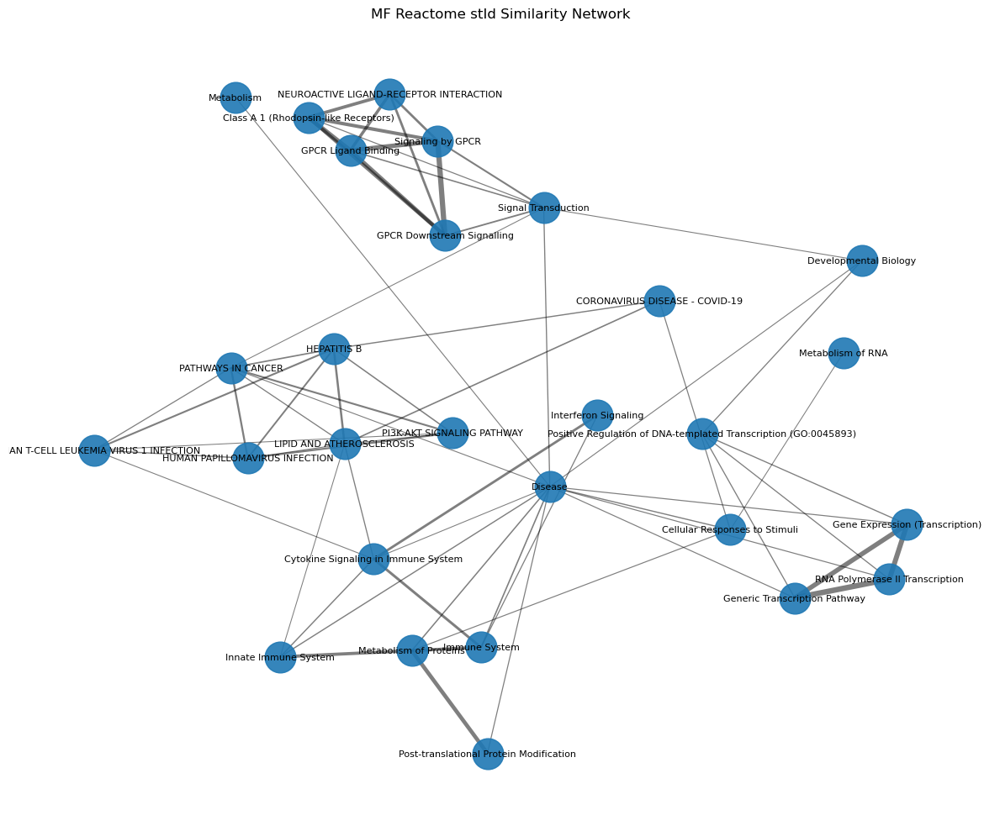

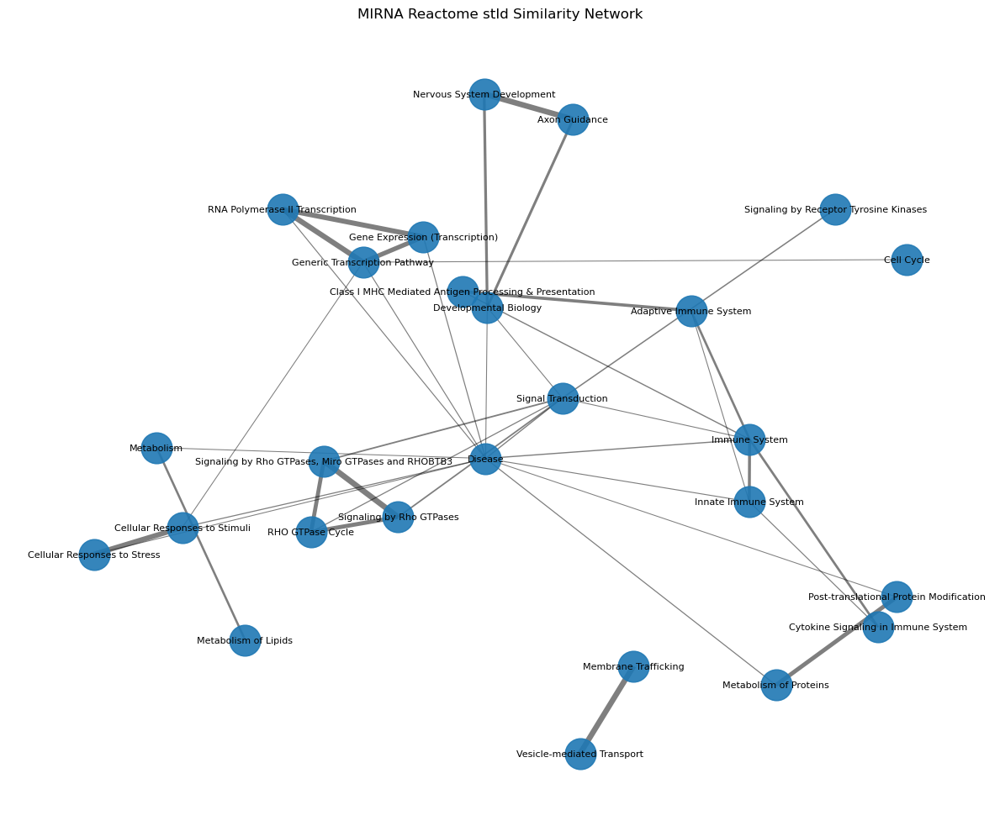

fa2 not installed. Using spring_layout.

Processing omics: GE


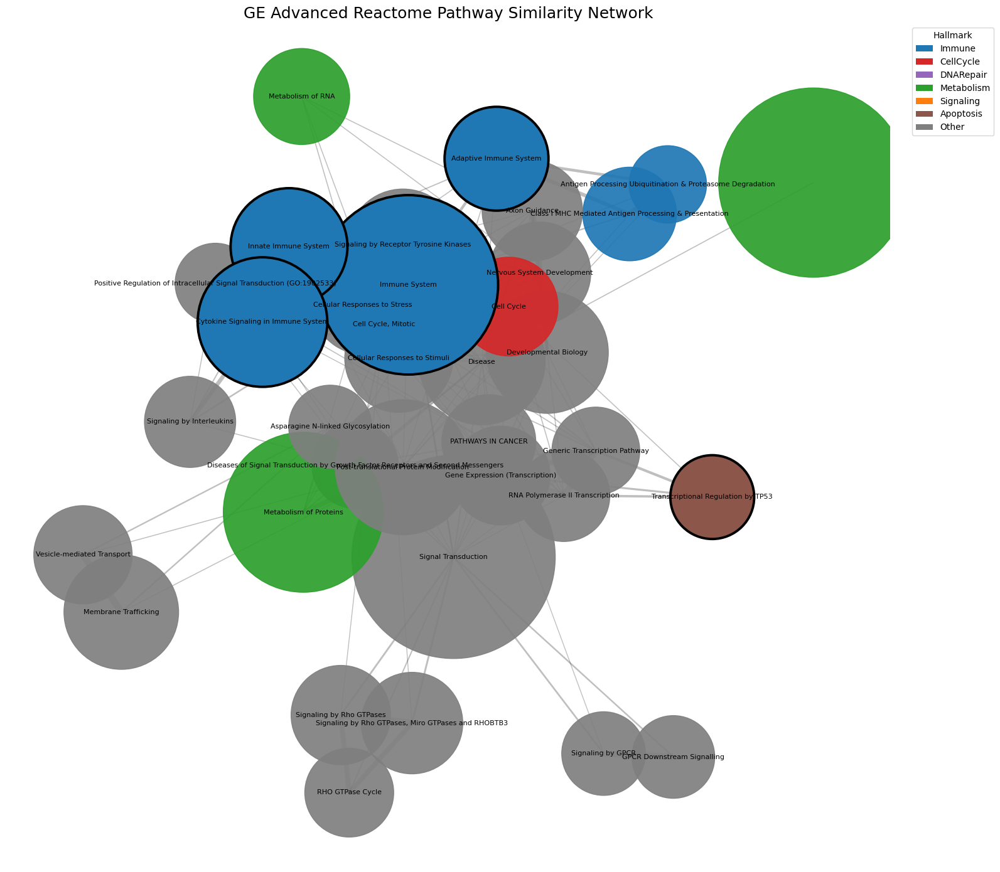


Processing omics: MF


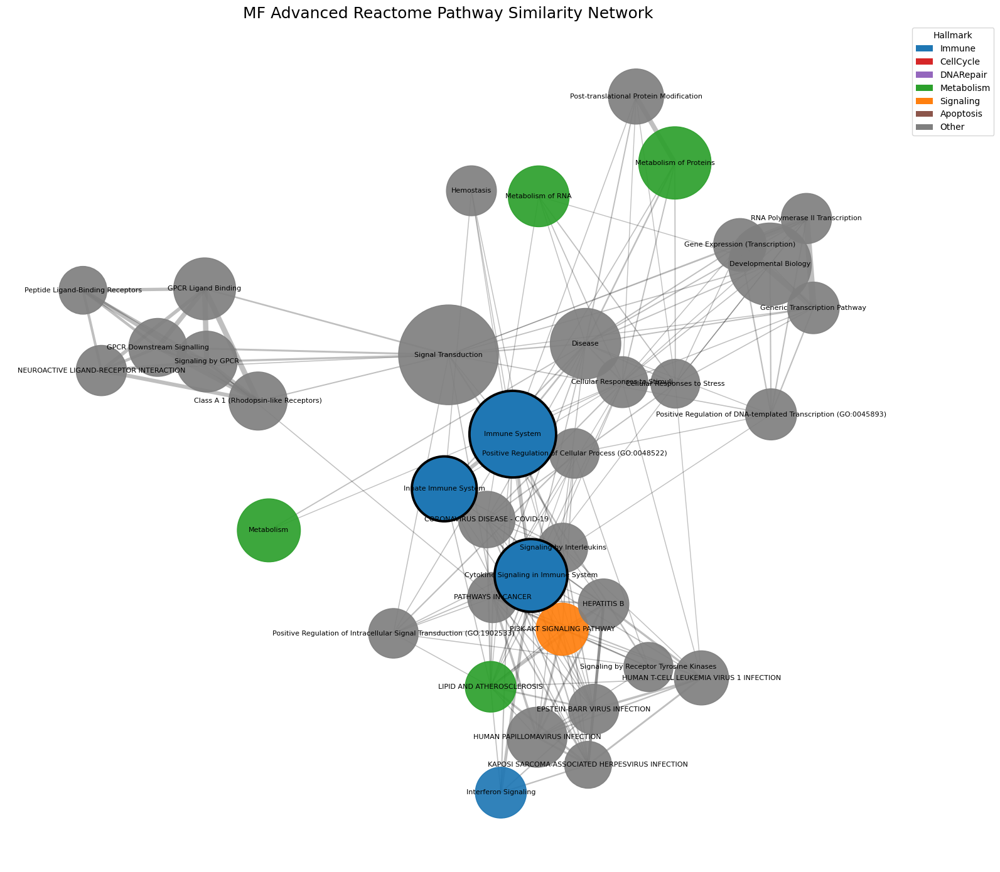


Processing omics: MIRNA


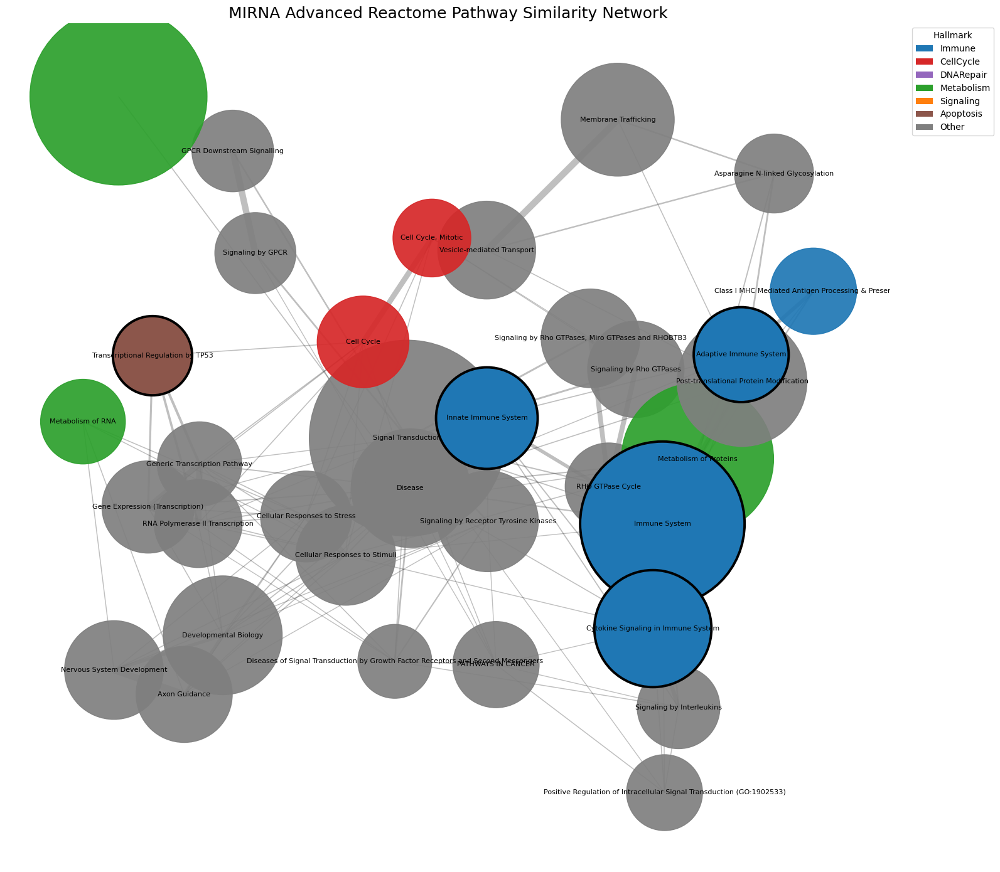

Hallmark categories assigned:
Other         25
Immune         5
Metabolism     3
Cell cycle     2
Name: count, dtype: int64


/var/folders/z_/4_txl3tn61g8nprq0_s7tsbc0000gn/T/ipykernel_9286/1373901863.py:1749: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(


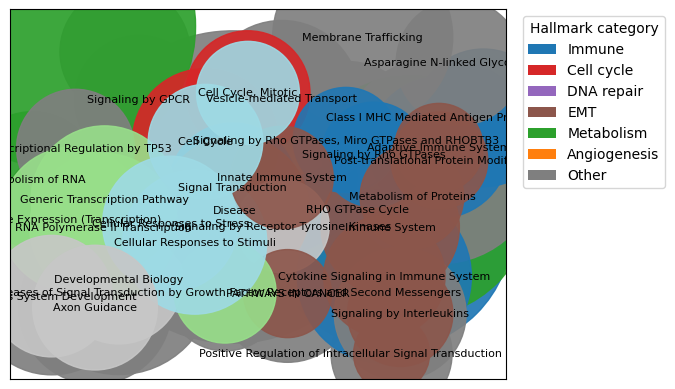

In [79]:
# =====================================================
# HALLMARK PROJECTION FOR EACH OMICS
# =====================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------------------
# Hallmark keyword mapping
# -----------------------------------------------------
HALLMARK_MAP = {

    "Cell Cycle": [
        "cell cycle",
        "mitotic",
        "checkpoint",
        "dna replication",
        "g2m",
        "e2f",
        "cyclin",
    ],

    "DNA Repair": [
        "dna repair",
        "homologous recombination",
        "mismatch repair",
        "double strand",
        "fanconi",
        "base excision",
        "nucleotide excision",
        "atm",
        "atr",
        "p53",
    ],

    "Immune": [
        "immune",
        "interferon",
        "cytokine",
        "jak-stat",
        "nf-kb",
        "chemokine",
        "t cell",
        "b cell",
        "antigen",
        "inflammatory",
    ],

    "PI3K/AKT": [
        "pi3k",
        "akt",
        "mtor",
        "growth factor",
    ],

    "EMT / Metastasis": [
        "emt",
        "migration",
        "adhesion",
        "integrin",
        "extracellular matrix",
        "metastasis",
    ],

    "Apoptosis": [
        "apoptosis",
        "cell death",
        "caspase",
        "trail",
    ],

    "Hypoxia": [
        "hypoxia",
        "angiogenesis",
        "hif",
        "vascular",
    ],

    "MYC Signaling": [
        "myc",
        "translation",
        "ribosome",
        "rna processing",
    ],
}

# =====================================================
# Store hallmark projections
# =====================================================

omics_hallmark_results = {}

for omics in omics_enrichment_results.keys():

    print("\n=================================")
    print(f"Hallmark projection: {omics}")
    print("=================================")

    enrichment_df = (
        omics_enrichment_results[omics]
    )

    hallmark_rows = []

    # -------------------------------------------------
    # Map pathways to hallmark systems
    # -------------------------------------------------
    for _, row in enrichment_df.iterrows():

        pathway = str(row["Pathway"]).lower()

        pval = row["AdjustedPValue"]

        if pval <= 0:
            continue

        score = -np.log10(pval)

        matched = False

        for hallmark, keywords in HALLMARK_MAP.items():

            for kw in keywords:

                if kw in pathway:

                    hallmark_rows.append({

                        "Hallmark": hallmark,
                        "Pathway": row["Pathway"],
                        "Score": score,
                    })

                    matched = True
                    break

            if matched:
                break

    hallmark_df = pd.DataFrame(hallmark_rows)

    omics_hallmark_results[omics] = hallmark_df

    print(hallmark_df.head())
# =====================================================
# Hallmark pathway projection
# =====================================================

# -----------------------------------------------------
# Hallmark categories
# -----------------------------------------------------
HALLMARK_MAP = {

    "Immune": [

        "IMMUNE",
        "INTERFERON",
        "CYTOKINE",
        "CHEMOKINE",
        "INFLAM",
        "TCR",
        "BCR",
        "ANTIGEN",
        "MHC",
        "PD1",
        "PD-1",
        "CTLA4",
        "CTLA-4"
    ],

    "Cell cycle": [

        "CELL CYCLE",
        "MITOTIC",
        "CHECKPOINT",
        "DNA REPLICATION",
        "E2F",
        "G2/M",
        "G1/S",
        "CDK"
    ],

    "DNA repair": [

        "DNA REPAIR",
        "MISMATCH",
        "HOMOLOGOUS",
        "NUCLEOTIDE EXCISION",
        "BASE EXCISION",
        "ATM",
        "ATR",
        "BRCA",
        "FANCONI"
    ],

    "EMT": [

        "EMT",
        "EPITHELIAL",
        "MESENCHYMAL",
        "EXTRACELLULAR MATRIX",
        "ECM",
        "COLLAGEN",
        "INTEGRIN",
        "ADHESION",
        "TGF",
        "TGFB"
    ],

    "Metabolism": [

        "METABOL",
        "GLYCOLYSIS",
        "TCA",
        "OXIDATIVE",
        "LIPID",
        "CHOLESTEROL",
        "AMINO ACID",
        "FATTY ACID",
        "MITOCHONDR"
    ],

    "Angiogenesis": [

        "ANGIOGENESIS",
        "VEGF",
        "VEGFA",
        "HYPOXIA",
        "HIF",
        "ENDOTHELIAL",
        "VASCULAR"
    ]
}

# -----------------------------------------------------
# Hallmark colors
# -----------------------------------------------------
HALLMARK_COLORS = {

    "Immune": "#1f77b4",

    "Cell cycle": "#d62728",

    "DNA repair": "#9467bd",

    "EMT": "#8c564b",

    "Metabolism": "#2ca02c",

    "Angiogenesis": "#ff7f0e",

    "Other": "#7f7f7f"
}

# =====================================================
# Function:
# assign hallmark category
# =====================================================

def assign_hallmark(pathway_name):

    pathway_upper = str(
        pathway_name
    ).upper()

    for hallmark, keywords in (
        HALLMARK_MAP.items()
    ):

        for kw in keywords:

            if kw in pathway_upper:

                return hallmark

    return "Other"
# # =====================================================
# # Assign hallmark category
# # =====================================================

# hallmark_labels = {}

# node_colors = []

# for node in G.nodes():

#     hallmark = assign_hallmark(node)

#     hallmark_labels[node] = hallmark

#     node_colors.append(
#         HALLMARK_COLORS[hallmark]
#     )

# print("Hallmark categories assigned:")
# print(
#     pd.Series(
#         list(hallmark_labels.values())
#     ).value_counts()
# )
# =====================================================
# Aggregate hallmark activity
# =====================================================

hallmark_activity = (
    hallmark_df
    .groupby("Hallmark")["Score"]
    .sum()
    .sort_values(ascending=False)
)

print(hallmark_activity)
# =====================================================
# Hallmark activity bar plot
# =====================================================

import matplotlib.pyplot as plt

plt.figure(figsize=(20, 12))

hallmark_activity.plot(kind="bar")

plt.ylabel("Hallmark Activity Score")

plt.xlabel("Hallmark Category")

plt.title("Hallmark Pathway Projection")

plt.xticks(rotation=45)

plt.tight_layout()

plt.savefig(
    os.path.join(
        output_dir,
        "hallmark_projection_barplot.png"
    ),
    dpi=300
)

plt.show()
# =====================================================
# Hallmark activity bar plot
# =====================================================

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

hallmark_activity.plot(kind="bar")

plt.ylabel("Hallmark Activity Score")

plt.xlabel("Hallmark Category")

plt.title("Hallmark Pathway Projection")

plt.xticks(rotation=45)

plt.tight_layout()

plt.savefig(
    os.path.join(
        output_dir,
        "hallmark_projection_barplot.png"
    ),
    dpi=300
)

plt.show()
# =====================================================
# Hallmark projection matrix
# =====================================================

hallmark_matrix = hallmark_df.pivot_table(
    index="Pathway",
    columns="Hallmark",
    values="Score",
    aggfunc="sum",
    fill_value=0
)

plt.figure(figsize=(12, 10))

sns.heatmap(
    hallmark_matrix,
    cmap="viridis"
)

plt.title("Hallmark Projection Heatmap")

plt.tight_layout()

plt.savefig(
    os.path.join(
        output_dir,
        "hallmark_projection_heatmap.png"
    ),
    dpi=300
)

plt.show()
# =====================================================
# Hallmark pathway projection
# =====================================================

# -----------------------------------------------------
# Hallmark categories
# -----------------------------------------------------
HALLMARK_MAP = {

    "Immune": [

        "IMMUNE",
        "INTERFERON",
        "CYTOKINE",
        "CHEMOKINE",
        "INFLAM",
        "TCR",
        "BCR",
        "ANTIGEN",
        "MHC",
        "PD1",
        "PD-1",
        "CTLA4",
        "CTLA-4"
    ],

    "Cell cycle": [

        "CELL CYCLE",
        "MITOTIC",
        "CHECKPOINT",
        "DNA REPLICATION",
        "E2F",
        "G2/M",
        "G1/S",
        "CDK"
    ],

    "DNA repair": [

        "DNA REPAIR",
        "MISMATCH",
        "HOMOLOGOUS",
        "NUCLEOTIDE EXCISION",
        "BASE EXCISION",
        "ATM",
        "ATR",
        "BRCA",
        "FANCONI"
    ],

    "EMT": [

        "EMT",
        "EPITHELIAL",
        "MESENCHYMAL",
        "EXTRACELLULAR MATRIX",
        "ECM",
        "COLLAGEN",
        "INTEGRIN",
        "ADHESION",
        "TGF",
        "TGFB"
    ],

    "Metabolism": [

        "METABOL",
        "GLYCOLYSIS",
        "TCA",
        "OXIDATIVE",
        "LIPID",
        "CHOLESTEROL",
        "AMINO ACID",
        "FATTY ACID",
        "MITOCHONDR"
    ],

    "Angiogenesis": [

        "ANGIOGENESIS",
        "VEGF",
        "VEGFA",
        "HYPOXIA",
        "HIF",
        "ENDOTHELIAL",
        "VASCULAR"
    ]
}

# -----------------------------------------------------
# Hallmark colors
# -----------------------------------------------------
HALLMARK_COLORS = {

    "Immune": "#1f77b4",

    "Cell cycle": "#d62728",

    "DNA repair": "#9467bd",

    "EMT": "#8c564b",

    "Metabolism": "#2ca02c",

    "Angiogenesis": "#ff7f0e",

    "Other": "#7f7f7f"
}

# =====================================================
# Function:
# assign hallmark category
# =====================================================

def assign_hallmark(pathway_name):

    pathway_upper = str(
        pathway_name
    ).upper()

    for hallmark, keywords in (
        HALLMARK_MAP.items()
    ):

        for kw in keywords:

            if kw in pathway_upper:

                return hallmark

    return "Other"
# =====================================================
# HALLMARK PROJECTION FOR EACH OMICS
# =====================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------------------
# Hallmark keyword mapping
# -----------------------------------------------------
HALLMARK_MAP = {

    "Cell Cycle": [
        "cell cycle",
        "mitotic",
        "checkpoint",
        "dna replication",
        "g2m",
        "e2f",
        "cyclin",
    ],

    "DNA Repair": [
        "dna repair",
        "homologous recombination",
        "mismatch repair",
        "double strand",
        "fanconi",
        "base excision",
        "nucleotide excision",
        "atm",
        "atr",
        "p53",
    ],

    "Immune": [
        "immune",
        "interferon",
        "cytokine",
        "jak-stat",
        "nf-kb",
        "chemokine",
        "t cell",
        "b cell",
        "antigen",
        "inflammatory",
    ],

    "PI3K/AKT": [
        "pi3k",
        "akt",
        "mtor",
        "growth factor",
    ],

    "EMT / Metastasis": [
        "emt",
        "migration",
        "adhesion",
        "integrin",
        "extracellular matrix",
        "metastasis",
    ],

    "Apoptosis": [
        "apoptosis",
        "cell death",
        "caspase",
        "trail",
    ],

    "Hypoxia": [
        "hypoxia",
        "angiogenesis",
        "hif",
        "vascular",
    ],

    "MYC Signaling": [
        "myc",
        "translation",
        "ribosome",
        "rna processing",
    ],
}

# =====================================================
# Store hallmark projections
# =====================================================

omics_hallmark_results = {}

for omics in omics_enrichment_results.keys():

    print("\n=================================")
    print(f"Hallmark projection: {omics}")
    print("=================================")

    enrichment_df = (
        omics_enrichment_results[omics]
    )

    hallmark_rows = []

    # -------------------------------------------------
    # Map pathways to hallmark systems
    # -------------------------------------------------
    for _, row in enrichment_df.iterrows():

        pathway = str(row["Pathway"]).lower()

        pval = row["AdjustedPValue"]

        if pval <= 0:
            continue

        score = -np.log10(pval)

        matched = False

        for hallmark, keywords in HALLMARK_MAP.items():

            for kw in keywords:

                if kw in pathway:

                    hallmark_rows.append({

                        "Hallmark": hallmark,
                        "Pathway": row["Pathway"],
                        "Score": score,
                    })

                    matched = True
                    break

            if matched:
                break

    hallmark_df = pd.DataFrame(hallmark_rows)

    omics_hallmark_results[omics] = hallmark_df

    print(hallmark_df.head())
# =====================================================
# Build hallmark activity matrix
# =====================================================

hallmark_activity_matrix = pd.DataFrame()

for omics, hallmark_df in omics_hallmark_results.items():

    if len(hallmark_df) == 0:
        continue

    activity = (
        hallmark_df
        .groupby("Hallmark")["Score"]
        .sum()
    )

    hallmark_activity_matrix[omics] = activity

hallmark_activity_matrix = (
    hallmark_activity_matrix
    .fillna(0)
)

print(hallmark_activity_matrix)
# =====================================================
# Omics hallmark heatmap
# =====================================================

plt.figure(figsize=(10, 8))

sns.heatmap(
    hallmark_activity_matrix,
    cmap="viridis",
    annot=True,
    fmt=".1f"
)

plt.title(
    "Omics Hallmark Projection"
)

plt.xlabel("Omics")

plt.ylabel("Hallmark")

plt.tight_layout()

plt.savefig(
    os.path.join(
        output_dir,
        "omics_hallmark_heatmap.png"
    ),
    dpi=300
)

plt.show()
# =====================================================
# Stacked hallmark bar plot
# =====================================================

hallmark_activity_matrix.T.plot(
    kind="bar",
    stacked=True,
    figsize=(12, 7)
)

plt.ylabel("Hallmark Activity")

plt.xlabel("Omics")

plt.title(
    "Hallmark Contributions Across Omics"
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        output_dir,
        "hallmark_stacked_barplot.png"
    ),
    dpi=300
)

plt.show()
# =====================================================
# Pathway network per omics
# =====================================================

for omics in omics_pathway_gene_dicts.keys():

    pathway_gene_dict = (
        omics_pathway_gene_dicts[omics]
    )

    G = nx.Graph()

    pathways = list(pathway_gene_dict.keys())[:30]

    for i in range(len(pathways)):

        for j in range(i + 1, len(pathways)):

            p1 = pathways[i]
            p2 = pathways[j]

            g1 = set(pathway_gene_dict[p1])
            g2 = set(pathway_gene_dict[p2])

            union = len(g1 | g2)

            if union == 0:
                continue

            jaccard = len(g1 & g2) / union

            if jaccard > 0.15:

                G.add_edge(
                    p1,
                    p2,
                    weight=jaccard
                )

    plt.figure(figsize=(12, 10))

    pos = nx.spring_layout(
        G,
        seed=42
    )

    nx.draw_networkx(
        G,
        pos,
        node_size=400,
        font_size=7
    )

    plt.title(
        f"{omics} Pathway Similarity Network"
    )

    plt.tight_layout()

    plt.savefig(
        os.path.join(
            output_dir,
            f"{omics}_pathway_network.png"
        ),
        dpi=300
    )

    plt.show()
# =====================================================
# Pathway network per omics
# Show only Reactome stable IDs (stId)
# =====================================================

import re
import networkx as nx
import matplotlib.pyplot as plt

for omics in omics_pathway_gene_dicts.keys():

    pathway_gene_dict = (
        omics_pathway_gene_dicts[omics]
    )

    G = nx.Graph()

    pathways = list(pathway_gene_dict.keys())[:30]

    # -------------------------------------------------
    # Helper:
    # Extract Reactome stable ID
    # Example:
    # "Cell Cycle, Mitotic R-HSA-69278"
    # -> "R-HSA-69278"
    # -------------------------------------------------
    def extract_stid(pathway_name):

        match = re.search(
            r"(R-HSA-\d+)",
            str(pathway_name)
        )

        if match:
            return match.group(1)

        return pathway_name

    # -------------------------------------------------
    # Build pathway similarity graph
    # -------------------------------------------------
    for i in range(len(pathways)):

        for j in range(i + 1, len(pathways)):

            p1 = pathways[i]
            p2 = pathways[j]

            g1 = set(pathway_gene_dict[p1])
            g2 = set(pathway_gene_dict[p2])

            union = len(g1 | g2)

            if union == 0:
                continue

            jaccard = len(g1 & g2) / union

            if jaccard > 0.15:

                G.add_edge(
                    extract_stid(p1),
                    extract_stid(p2),
                    weight=jaccard
                )

    # -------------------------------------------------
    # Plot
    # -------------------------------------------------
    plt.figure(figsize=(12, 10))

    pos = nx.spring_layout(
        G,
        seed=42,
        k=0.6
    )

    edge_weights = [
        G[u][v]["weight"] * 5
        for u, v in G.edges()
    ]

    nx.draw_networkx_nodes(
        G,
        pos,
        node_size=700,
        alpha=0.9
    )

    nx.draw_networkx_edges(
        G,
        pos,
        width=edge_weights,
        alpha=0.5
    )

    nx.draw_networkx_labels(
        G,
        pos,
        font_size=8
    )

    plt.title(
        f"{omics} Reactome stId Similarity Network"
    )

    plt.axis("off")

    plt.tight_layout()

    plt.savefig(
        os.path.join(
            output_dir,
            f"{omics}_pathway_network_stid.png"
        ),
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
# =====================================================
# Advanced Reactome Pathway Network
#
# Features:
# 1. Community detection coloring
# 2. Hallmark pathway projection
# 3. Node size by enrichment significance
# 4. ForceAtlas2 layout
# 5. Survival-associated pathway highlighting
# =====================================================

import os
import re
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

from networkx.algorithms.community import (
    louvain_communities
)

# -----------------------------------------------------
# Optional ForceAtlas2
# -----------------------------------------------------
USE_FORCEATLAS2 = True

if USE_FORCEATLAS2:

    try:

        from fa2 import ForceAtlas2

        HAS_FA2 = True

    except:

        HAS_FA2 = False

        print(
            "fa2 not installed. "
            "Using spring_layout."
        )

else:

    HAS_FA2 = False

# =====================================================
# Hallmark categories
# =====================================================

HALLMARK_MAP = {

    "Immune": [
        "INTERFERON",
        "CYTOKINE",
        "IMMUNE",
        "ANTIGEN",
        "TCR",
        "BCR",
        "CHEMOKINE",
        "INFLAM"
    ],

    "CellCycle": [
        "CELL CYCLE",
        "MITOTIC",
        "E2F",
        "CHECKPOINT",
        "DNA REPLICATION"
    ],

    "DNARepair": [
        "DNA REPAIR",
        "HOMOLOGOUS",
        "ATM",
        "ATR",
        "MISMATCH",
        "NUCLEOTIDE EXCISION"
    ],

    "Metabolism": [
        "METABOL",
        "GLYCOLYSIS",
        "TCA",
        "OXIDATIVE",
        "LIPID"
    ],

    "Signaling": [
        "MAPK",
        "PI3K",
        "AKT",
        "MTOR",
        "WNT",
        "NOTCH",
        "TGFB"
    ],

    "Apoptosis": [
        "APOPT",
        "P53",
        "DEATH"
    ]
}

# =====================================================
# Hallmark colors
# =====================================================

HALLMARK_COLORS = {

    "Immune": "#1f77b4",
    "CellCycle": "#d62728",
    "DNARepair": "#9467bd",
    "Metabolism": "#2ca02c",
    "Signaling": "#ff7f0e",
    "Apoptosis": "#8c564b",
    "Other": "#7f7f7f"
}

# =====================================================
# Function:
# assign hallmark category
# =====================================================

def assign_hallmark(pathway):

    pathway_upper = pathway.upper()

    for hallmark, keywords in HALLMARK_MAP.items():

        for kw in keywords:

            if kw in pathway_upper:

                return hallmark

    return "Other"

# =====================================================
# Build pathway network
# =====================================================

for omics in omics_pathway_gene_dicts.keys():

    print("\n================================")
    print(f"Processing omics: {omics}")
    print("================================")

    pathway_gene_dict = (
        omics_pathway_gene_dicts[omics]
    )

    enrichment_df = (
        omics_enrichment_results[omics]
    )

    # -------------------------------------------------
    # Use top enriched pathways
    # -------------------------------------------------
    top_pathways = (
        enrichment_df
        .head(40)["Pathway"]
        .tolist()
    )

    G = nx.Graph()

    # -------------------------------------------------
    # Build similarity graph
    # -------------------------------------------------
    for i in range(len(top_pathways)):

        for j in range(i + 1, len(top_pathways)):

            p1 = top_pathways[i]
            p2 = top_pathways[j]

            g1 = set(pathway_gene_dict[p1])
            g2 = set(pathway_gene_dict[p2])

            union = len(g1 | g2)

            if union == 0:
                continue

            jaccard = len(g1 & g2) / union

            if jaccard > 0.12:

                G.add_edge(
                    p1,
                    p2,
                    weight=jaccard
                )

    # -------------------------------------------------
    # Remove weak nodes
    # -------------------------------------------------
    remove_nodes = [

        n for n in G.nodes()

        if G.degree(n) <= 1
    ]

    G.remove_nodes_from(remove_nodes)

    # =================================================
    # Community detection
    # =================================================
    communities = louvain_communities(
        G,
        weight="weight",
        seed=42
    )

    node_to_comm = {}

    for cid, comm in enumerate(communities):

        for node in comm:

            node_to_comm[node] = cid

    # =================================================
    # Node size:
    # enrichment significance
    # =================================================
    pval_map = dict(zip(
        enrichment_df["Pathway"],
        enrichment_df["AdjustedPValue"]
    ))

    node_sizes = []

    for node in G.nodes():

        pval = pval_map.get(node, 1e-3)

        score = -np.log10(
            max(pval, 1e-300)
        )

        node_sizes.append(
            400 + score * 220
        )

    # =================================================
    # Hallmark projection
    # =================================================
    hallmark_labels = {}

    node_colors = []

    for node in G.nodes():

        hallmark = assign_hallmark(node)

        hallmark_labels[node] = hallmark

        node_colors.append(
            HALLMARK_COLORS[hallmark]
        )

    # =================================================
    # Survival-associated pathways
    # =================================================
    # Example:
    # highlight pathways containing:
    #
    # TP53
    # apoptosis
    # immune
    #
    # Replace with real Cox results later
    # =================================================
    survival_nodes = []

    for node in G.nodes():

        node_upper = node.upper()

        if (
            "TP53" in node_upper
            or "APOPT" in node_upper
            or "IMMUNE" in node_upper
            or "DNA REPAIR" in node_upper
        ):

            survival_nodes.append(node)

    # =================================================
    # Convert labels to stId
    # =================================================
    def extract_stid(x):

        m = re.search(
            r"(R-HSA-\d+)",
            str(x)
        )

        if m:

            return m.group(1)

        return x

    hallmark_labels = {}

    for node in G.nodes():

        if G.degree(node) >= 2:

            hallmark_labels[node] = extract_stid(node)

    # =================================================
    # Layout
    # =================================================
    if HAS_FA2:

        forceatlas2 = ForceAtlas2(

            outboundAttractionDistribution=True,

            edgeWeightInfluence=1.0,

            scalingRatio=2.5,

            gravity=1.0
        )

        pos = (
            forceatlas2
            .forceatlas2_networkx_layout(
                G,
                iterations=2000
            )
        )

    else:

        pos = nx.spring_layout(
            G,
            seed=42,
            k=0.5
        )

    # =================================================
    # Plot
    # =================================================
    plt.figure(figsize=(16, 14))

    # -------------------------------------------------
    # Edges
    # -------------------------------------------------
    edge_weights = [

        G[u][v]["weight"] * 8

        for u, v in G.edges()
    ]

    nx.draw_networkx_edges(

        G,
        pos,

        width=edge_weights,

        alpha=0.25
    )

    # -------------------------------------------------
    # Nodes
    # -------------------------------------------------
    nx.draw_networkx_nodes(

        G,
        pos,

        node_size=node_sizes,

        node_color=node_colors,

        alpha=0.92
    )

    # -------------------------------------------------
    # Survival-associated highlighting
    # -------------------------------------------------
    nx.draw_networkx_nodes(

        G,
        pos,

        nodelist=survival_nodes,

        node_size=[
            node_sizes[
                list(G.nodes()).index(n)
            ] * 1.15

            for n in survival_nodes
        ],

        edgecolors="black",

        linewidths=2.8,

        node_color=[
            node_colors[
                list(G.nodes()).index(n)
            ]

            for n in survival_nodes
        ]
    )

    # -------------------------------------------------
    # Labels
    # -------------------------------------------------
    nx.draw_networkx_labels(

        G,
        pos,

        labels=hallmark_labels,

        font_size=8
    )

    # =================================================
    # Legend
    # =================================================
    from matplotlib.patches import Patch

    legend_elements = [

        Patch(
            facecolor=color,
            label=hallmark
        )

        for hallmark, color
        in HALLMARK_COLORS.items()
    ]

    plt.legend(

        handles=legend_elements,

        title="Hallmark",

        bbox_to_anchor=(1.02, 1),

        loc="upper left"
    )

    # =================================================
    # Title
    # =================================================
    plt.title(

        f"{omics} Advanced Reactome "
        f"Pathway Similarity Network",

        fontsize=18
    )

    plt.axis("off")

    plt.tight_layout()

    # =================================================
    # Save
    # =================================================
    plt.savefig(

        os.path.join(

            output_dir,

            f"{omics}_advanced_pathway_network.png"
        ),

        dpi=400,

        bbox_inches="tight"
    )

    plt.show()
# =====================================================
# Hallmark pathway projection
# =====================================================

# -----------------------------------------------------
# Hallmark categories
# -----------------------------------------------------
HALLMARK_MAP = {

    "Immune": [

        "IMMUNE",
        "INTERFERON",
        "CYTOKINE",
        "CHEMOKINE",
        "INFLAM",
        "TCR",
        "BCR",
        "ANTIGEN",
        "MHC",
        "PD1",
        "PD-1",
        "CTLA4",
        "CTLA-4"
    ],

    "Cell cycle": [

        "CELL CYCLE",
        "MITOTIC",
        "CHECKPOINT",
        "DNA REPLICATION",
        "E2F",
        "G2/M",
        "G1/S",
        "CDK"
    ],

    "DNA repair": [

        "DNA REPAIR",
        "MISMATCH",
        "HOMOLOGOUS",
        "NUCLEOTIDE EXCISION",
        "BASE EXCISION",
        "ATM",
        "ATR",
        "BRCA",
        "FANCONI"
    ],

    "EMT": [

        "EMT",
        "EPITHELIAL",
        "MESENCHYMAL",
        "EXTRACELLULAR MATRIX",
        "ECM",
        "COLLAGEN",
        "INTEGRIN",
        "ADHESION",
        "TGF",
        "TGFB"
    ],

    "Metabolism": [

        "METABOL",
        "GLYCOLYSIS",
        "TCA",
        "OXIDATIVE",
        "LIPID",
        "CHOLESTEROL",
        "AMINO ACID",
        "FATTY ACID",
        "MITOCHONDR"
    ],

    "Angiogenesis": [

        "ANGIOGENESIS",
        "VEGF",
        "VEGFA",
        "HYPOXIA",
        "HIF",
        "ENDOTHELIAL",
        "VASCULAR"
    ]
}

# -----------------------------------------------------
# Hallmark colors
# -----------------------------------------------------
HALLMARK_COLORS = {

    "Immune": "#1f77b4",

    "Cell cycle": "#d62728",

    "DNA repair": "#9467bd",

    "EMT": "#8c564b",

    "Metabolism": "#2ca02c",

    "Angiogenesis": "#ff7f0e",

    "Other": "#7f7f7f"
}

# =====================================================
# Function:
# assign hallmark category
# =====================================================

def assign_hallmark(pathway_name):

    pathway_upper = str(
        pathway_name
    ).upper()

    for hallmark, keywords in (
        HALLMARK_MAP.items()
    ):

        for kw in keywords:

            if kw in pathway_upper:

                return hallmark

    return "Other"
# =====================================================
# Assign hallmark category
# =====================================================

hallmark_labels = {}

node_colors = []

for node in G.nodes():

    hallmark = assign_hallmark(node)

    hallmark_labels[node] = hallmark

    node_colors.append(
        HALLMARK_COLORS[hallmark]
    )

print("Hallmark categories assigned:")
print(
    pd.Series(
        list(hallmark_labels.values())
    ).value_counts()
)
# =====================================================
# Draw hallmark-colored nodes
# =====================================================

nx.draw_networkx_nodes(

    G,
    pos,

    node_size=node_sizes,

    node_color=node_colors,

    alpha=0.92
)
# =====================================================
# Add hallmark legend
# =====================================================

from matplotlib.patches import Patch

legend_elements = [

    Patch(
        facecolor=color,
        label=hallmark
    )

    for hallmark, color
    in HALLMARK_COLORS.items()
]

plt.legend(

    handles=legend_elements,

    title="Hallmark category",

    bbox_to_anchor=(1.02, 1),

    loc="upper left"
)
# # =====================================================
# # Optional:
# # save hallmark assignments
# # =====================================================

# hallmark_df = pd.DataFrame({

#     "Pathway": list(
#         hallmark_labels.keys()
#     ),

#     "Hallmark": list(
#         hallmark_labels.values()
#     )
# })

# hallmark_df.to_csv(

#     os.path.join(

#         output_dir,

#         f"{omics}_hallmark_projection.csv"
#     ),

#     index=False
# )

# print(hallmark_df.head())
hallmark_labels = {}

for node in G.nodes():

    if G.degree(node) >= 3:

        hallmark_labels[node] = node

nx.draw_networkx_labels(
    G,
    pos,
    labels=hallmark_labels,
    font_size=8
)
centrality = nx.degree_centrality(G)

top_nodes = sorted(
    centrality,
    key=centrality.get,
    reverse=True
)[:25]

G = G.subgraph(top_nodes).copy()
node_sizes = []

for node in G.nodes():

    degree_weight = sum([
        G[node][nbr]["weight"]
        for nbr in G.neighbors(node)
    ])

    node_sizes.append(
        300 + degree_weight * 4000
    )
from networkx.algorithms.community import louvain_communities

communities = louvain_communities(
    G,
    weight="weight",
    seed=42
)

node_to_comm = {}

for cid, comm in enumerate(communities):

    for node in comm:

        node_to_comm[node] = cid

node_colors = [
    node_to_comm[n]
    for n in G.nodes()
]


nx.draw_networkx_nodes(
    G,
    pos,
    node_color=node_colors,
    cmap=plt.cm.tab20,
    node_size=node_sizes,
    alpha=0.9
)


edges = G.edges(data=True)

for u, v, d in edges:

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=[(u, v)],
        width=d["weight"] * 6,
        alpha=min(d["weight"] * 1.5, 0.8)
    )


## Hallmark Activity Matrix

The hallmark activity matrix summarizes how strongly each omics modality contributes to cancer programs.

For hallmark $h_k$ in omics modality $o_m$:

$$
A_{mk}
=
\sum_{i=1}^{N}
-\log_{10}(p_i)
$$

where:

- $A_{mk}$ is hallmark activity
- $p_i$ is enrichment significance
- $N$ is the number of matched pathways

This converts pathway enrichment into interpretable systems biology signals.

In [80]:
# =====================================================
# Build hallmark activity matrix
# =====================================================

hallmark_activity_matrix = pd.DataFrame()

for omics, hallmark_df in omics_hallmark_results.items():

    if len(hallmark_df) == 0:
        continue

    activity = (
        hallmark_df
        .groupby("Hallmark")["Score"]
        .sum()
    )

    hallmark_activity_matrix[omics] = activity

hallmark_activity_matrix = (
    hallmark_activity_matrix
    .fillna(0)
)

print(hallmark_activity_matrix)


                           GE          MF        MIRNA
Hallmark                                              
Apoptosis          173.431792   35.643726   131.061563
Cell Cycle         658.312076  183.432096   541.369705
DNA Repair         482.393570  166.623366   429.376180
EMT / Metastasis   292.616361  151.601113   271.143404
Hypoxia             94.677272   33.605410    88.985565
Immune            1495.944775  608.034567  1231.417807
MYC Signaling      499.146111  183.685585   406.568965
PI3K/AKT           321.093130  113.692048   258.810575


## Omics Hallmark Heatmap

This heatmap visualizes how different omics modalities capture distinct cancer hallmarks.

Rows represent hallmark systems.

Columns represent omics modalities.

Large values indicate stronger latent biological coupling between:

$$
\text{Omics}
\rightarrow
\text{Pathways}
\rightarrow
\text{Cancer Programs}
$$

## Hallmark Stacked Bar Plot

This visualization compares the relative contribution of each omics modality across hallmark cancer programs.

This reveals modality specialization.

For example:

- GE may dominate proliferation
- MF may dominate DNA repair
- MIRNA may dominate EMT regulation

## Pathway Network Projection

Pathways sharing genes are connected into a biological network.

For pathways $p_i$ and $p_j$:

$$
J(p_i, p_j)
=
\frac{
|G_i \cap G_j|
}{
|G_i \cup G_j|
}
$$

where:

- $G_i$ is the gene set of pathway $i$
- $J$ is Jaccard similarity

This reveals coordinated biological systems learned by the GNN.

## Cluster Survival Analysis

This analysis evaluates whether graph-derived biological clusters are associated with patient survival outcomes.

The graph neural network identifies latent biological modules through:

- saliency
- pathway enrichment
- Leiden clustering
- multi-omics integration

These modules may correspond to clinically relevant cancer programs.

Survival analysis validates whether learned graph structures capture prognostic biology.

This creates:

- prognostic modules
- survival-associated pathways
- clinically interpretable graph embeddings
- biologically meaningful latent clusters

For each patient $i$:

$$
h_i(t)
=
h_0(t)
\exp(\beta x_i)
$$

where:

- $h_i(t)$ is patient hazard
- $h_0(t)$ is baseline hazard
- $x_i$ is cluster activity
- $\beta$ is the Cox coefficient

Positive $\beta$ indicates increased risk associated with that biological module.

In [81]:
import os
os.getcwd()


'/Users/ericsali/Documents/2024_Winter/Project_gnn/reactome_markers/gnn_pathways/ASPIRE-GNN/prediction'

## Compute Cluster Activity Scores

For each biological cluster, a patient-level activity score is computed.

If:

$$
G_k
=
\{g_1, g_2, ..., g_n\}
$$

is the gene set of cluster $k$, then cluster activity for patient $p$ is:

$$
A_{pk}
=
\frac{1}{|G_k|}
\sum_{g_i \in G_k}
x_{pi}
$$

where:

- $x_{pi}$ is gene expression
- $A_{pk}$ is cluster activity

This converts graph clusters into patient-level biological phenotypes.

## Construct Saliency-Weighted Multi-Omics Matrix

The weighted matrix is:

$$
M'_{ij}
=
S_i M_{ij}
$$

This creates:

- cancer-specific importance
- pathway-driver coupling
- interpretable latent biology

In [82]:
gene_cancer_weighted = gene_cancer_matrix.mul(
    saliency_map,
    axis=0
)

gene_cancer_weighted = gene_cancer_weighted.replace(
    [np.inf, -np.inf],
    np.nan
).fillna(0)


In [83]:
gene_cancer_weighted


,GE: BLCA,GE: BRCA,GE: COAD,GE: ESCA,GE: LUAD,GE: LUSC,GE: STAD,MF: BLCA,MF: BRCA,MF: COAD,...,MF: LUAD,MF: LUSC,MF: STAD,MIRNA: BLCA,MIRNA: BRCA,MIRNA: COAD,MIRNA: ESCA,MIRNA: LUAD,MIRNA: LUSC,MIRNA: STAD
A2M,-0.000050,-4.140638e-05,-0.000023,-2.219919e-05,-1.103020e-04,-0.000152,0.000002,0.000046,6.444450e-06,0.000046,...,-6.801695e-06,2.940235e-07,-0.000005,0.000063,4.131749e-05,-0.000032,3.221725e-04,-7.316066e-05,-0.000114,0.000560
A4GALT,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
A4GNT,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
AACS,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
AADAC,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNRF3,3.572277,2.602859e+00,10.776088,1.051402e+00,1.404032e+00,1.238229,2.383729,-3.364391,-2.010144e+00,-4.149652,...,-2.474160e+00,-2.298361e+00,-3.691830,-4.034217,-1.113927e+00,-10.474467,-1.816336e+00,-2.201990e+00,0.573043,2.309997
ZP4,0.000795,2.541796e-03,0.001162,3.938103e-04,3.813995e-04,0.000480,0.000087,0.001125,3.809095e-04,0.000146,...,1.349221e-02,1.675472e-03,0.001439,-0.002704,1.032836e-04,-0.001101,-4.672517e-03,-4.197695e-03,-0.006468,-0.002307
ZRANB1,0.201065,-5.521028e-01,1.502199,-1.305408e+00,-2.161964e-01,-0.229802,0.160872,-0.588833,-5.742717e-01,-1.323176,...,-8.101395e-01,-7.525758e-01,-1.012262,0.147659,1.348621e+00,-1.227059,-1.113902e+00,-9.720991e-01,-1.295915,-1.762486
ZW10,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000


## Omics-Specific Leiden Biclustering Analysis

This section performs Leiden-based bipartite biclustering
separately for each omics modality.

The full weighted gene–cancer matrix:

$ \texttt{gene\_cancer\_weighted} $

is first divided into omics-specific matrices using:

$ \texttt{split\_gene\_cancer\_by\_omics()} $

Each resulting matrix contains associations derived from a single omics layer, such as:

- gene expression (GE)
- microRNA (miRNA)
- mutation features (MF)

For every omics matrix, the pipeline performs:

1. Leiden bipartite clustering
2. Gene and cancer community detection
3. Matrix reordering based on cluster structure
4. Export of reordered matrices
5. Visualization of bicluster heatmaps

Using a lower Leiden resolution:

$ \texttt{resolution = 0.3} $

encourages:

- fewer clusters
- larger biological modules
- more stable biclusters
- clearer block structures

The resulting heatmaps help reveal:

- cancer-specific molecular programs
- shared omics signatures
- latent community structure
- modality-specific biological patterns

In [84]:
# =====================================================
# Split saliency-weighted matrix into per-omics sub-matrices
# =====================================================
# Per the markdown above: this section's Leiden biclustering needs
# `omics_matrices` built from the saliency-weighted matrix
# (gene_cancer_weighted), not the raw gene_cancer_matrix used earlier for
# the Reactome enrichment section. Re-using the same helper defined above.

omics_matrices = split_gene_cancer_by_omics(gene_cancer_weighted)
print("Rebuilt omics_matrices (weighted) for:", list(omics_matrices.keys()))


Rebuilt omics_matrices (weighted) for: ['GE', 'MF', 'MIRNA']


In [85]:
omics_matrices


{'GE':         GE: BLCA      GE: BRCA   GE: COAD      GE: ESCA      GE: LUAD  \
 A2M    -0.000050 -4.140638e-05  -0.000023 -2.219919e-05 -1.103020e-04   
 A4GALT  0.000000  0.000000e+00   0.000000  0.000000e+00  0.000000e+00   
 A4GNT   0.000000  0.000000e+00   0.000000  0.000000e+00  0.000000e+00   
 AACS    0.000000  0.000000e+00   0.000000  0.000000e+00  0.000000e+00   
 AADAC   0.000000  0.000000e+00   0.000000  0.000000e+00  0.000000e+00   
 ...          ...           ...        ...           ...           ...   
 ZNRF3   3.572277  2.602859e+00  10.776088  1.051402e+00  1.404032e+00   
 ZP4     0.000795  2.541796e-03   0.001162  3.938103e-04  3.813995e-04   
 ZRANB1  0.201065 -5.521028e-01   1.502199 -1.305408e+00 -2.161964e-01   
 ZW10    0.000000  0.000000e+00   0.000000  0.000000e+00  0.000000e+00   
 ZZZ3    0.000001  1.753230e-07   0.000002  7.394752e-07  7.833475e-07   
 
         GE: LUSC  GE: STAD  
 A2M    -0.000152  0.000002  
 A4GALT  0.000000  0.000000  
 A4GNT   0.000

## Bipartite Gene-Cancer Graph

A bipartite graph is constructed:

$$
B = (G,C,E)
$$

where:

- $G$ are genes
- $C$ are cancer types
- edges encode weighted associations

In [86]:
B = nx.Graph()


In [87]:
B.add_nodes_from(
    gene_cancer_weighted.index,
    bipartite=0,
    type='gene'
)

B.add_nodes_from(
    gene_cancer_weighted.columns,
    bipartite=1,
    type='cancer'
)

for gene in gene_cancer_weighted.index:

    for cancer in gene_cancer_weighted.columns:

        value = gene_cancer_weighted.loc[
            gene,
            cancer
        ]

        if np.isnan(value):
            continue

        w = float(value)

        if w > 0:
            B.add_edge(
                gene,
                cancer,
                weight=w
            )

# =====================================================
# Convert to igraph
# =====================================================
bipartite_edges = [
    (u, v, float(d['weight']))
    for u, v, d in B.edges(data=True)
]

ig_B = ig.Graph.TupleList(
    bipartite_edges,
    edge_attrs=['weight'],
    directed=False
)


In [88]:
# =====================================================
# BASIC GRAPH INFO
# =====================================================
print("NetworkX graph")
print(B)

print("\nNumber of nodes:", B.number_of_nodes())
print("Number of edges:", B.number_of_edges())

# =====================================================
# PRINT NODE TYPES
# =====================================================
print("\nFirst 10 nodes with attributes:\n")

for i, (node, attrs) in enumerate(B.nodes(data=True)):

    print(node, attrs)

    if i >= 9:
        break

# =====================================================
# PRINT GENE NODES
# =====================================================
gene_nodes = [
    n for n, d in B.nodes(data=True)
    if d.get("type") == "gene"
]

print("\nNumber of gene nodes:", len(gene_nodes))

print("\nFirst 10 gene nodes:")
print(gene_nodes[:10])

# =====================================================
# PRINT CANCER NODES
# =====================================================
cancer_nodes = [
    n for n, d in B.nodes(data=True)
    if d.get("type") == "cancer"
]

print("\nNumber of cancer nodes:", len(cancer_nodes))

print("\nCancer nodes:")
print(cancer_nodes)

# =====================================================
# PRINT EDGES
# =====================================================
print("\nFirst 10 weighted edges:\n")

for i, (u, v, d) in enumerate(B.edges(data=True)):

    print(
        f"{u}  <--{d['weight']:.4f}-->  {v}"
    )

    if i >= 9:
        break

# =====================================================
# PRINT EDGE TABLE
# =====================================================
edge_df = pd.DataFrame([
    {
        "Gene": u,
        "Cancer": v,
        "Weight": d["weight"]
    }
    for u, v, d in B.edges(data=True)
])

print("\nEdge dataframe:")
print(edge_df.head())

# =====================================================
# iGRAPH INFO
# =====================================================
print("\niGraph object")
print(ig_B)

print("\nNumber of vertices:", ig_B.vcount())
print("Number of edges:", ig_B.ecount())

# =====================================================
# PRINT iGRAPH VERTICES
# =====================================================
print("\nFirst 10 iGraph vertices:\n")

for v in ig_B.vs[:10]:

    print(v["name"])

# =====================================================
# PRINT iGRAPH EDGES
# =====================================================
print("\nFirst 10 iGraph edges:\n")

for e in ig_B.es[:10]:

    source = ig_B.vs[e.source]["name"]
    target = ig_B.vs[e.target]["name"]

    print(
        f"{source} <--{e['weight']:.4f}--> {target}"
    )


NetworkX graph
Graph with 6696 nodes and 43725 edges

Number of nodes: 6696
Number of edges: 43725

First 10 nodes with attributes:

A2M {'bipartite': 0, 'type': 'gene'}
A4GALT {'bipartite': 0, 'type': 'gene'}
A4GNT {'bipartite': 0, 'type': 'gene'}
AACS {'bipartite': 0, 'type': 'gene'}
AADAC {'bipartite': 0, 'type': 'gene'}
AADAT {'bipartite': 0, 'type': 'gene'}
AAK1 {'bipartite': 0, 'type': 'gene'}
AAMP {'bipartite': 0, 'type': 'gene'}
AANAT {'bipartite': 0, 'type': 'gene'}
AASDHPPT {'bipartite': 0, 'type': 'gene'}

Number of gene nodes: 6675

First 10 gene nodes:
['A2M', 'A4GALT', 'A4GNT', 'AACS', 'AADAC', 'AADAT', 'AAK1', 'AAMP', 'AANAT', 'AASDHPPT']

Number of cancer nodes: 21

Cancer nodes:
['GE: BLCA', 'GE: BRCA', 'GE: COAD', 'GE: ESCA', 'GE: LUAD', 'GE: LUSC', 'GE: STAD', 'MF: BLCA', 'MF: BRCA', 'MF: COAD', 'MF: ESCA', 'MF: LUAD', 'MF: LUSC', 'MF: STAD', 'MIRNA: BLCA', 'MIRNA: BRCA', 'MIRNA: COAD', 'MIRNA: ESCA', 'MIRNA: LUAD', 'MIRNA: LUSC', 'MIRNA: STAD']

First 10 weighted ed

## Bipartite Leiden Clustering

Leiden clustering identifies coordinated biological programs across genes and cancer types.

Text(0.5, 1.0, 'Cluster-Level Cancer Activity ($\\gamma=0.8$)')

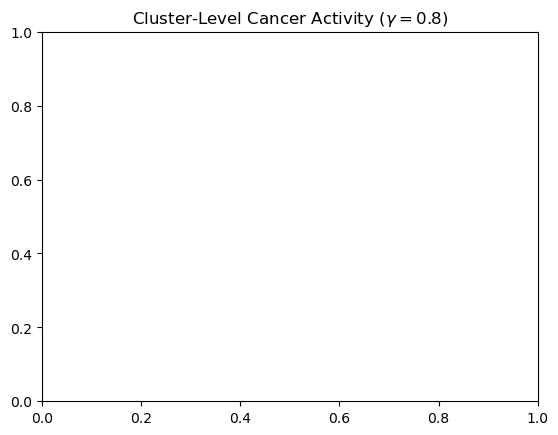

In [89]:
partition = la.find_partition(
    ig_B,
    la.RBConfigurationVertexPartition,
    weights='weight',
    # resolution_parameter=2.4
    resolution_parameter=LEIDEN_RESOLUTION
)
plt.title(
    f"Cluster-Level Cancer Activity ($\\gamma={LEIDEN_RESOLUTION:.1f}$)"
)


## Construct Bipartite Leiden Clusters

Leiden community detection is applied to the bipartite gene–cancer graph to identify coherent biclusters of genes and cancer types.

Each node is assigned to a cluster according to the Leiden partition membership:

$$
c_i \in \{1, 2, \dots, K\}
$$

where:

- $c_i$ is the cluster assignment of node $i$
- $K$ is the total number of detected communities

The cluster mapping is constructed as:

In [90]:
cluster_dict = {
    node: cid
    for node, cid in zip(
        ig_B.vs['name'],
        partition.membership
    )
}


## Extract Gene and Cancer Cluster Assignments

This step separates the global Leiden cluster assignments into:

- **gene clusters** → clusters assigned to genes  
- **cancer clusters** → clusters assigned to cancer types  

The original dictionary:

$ \texttt{cluster\_dict} $

contains cluster labels for all nodes in the bipartite graph.

We filter nodes based on membership in:

- gene index:
  
$ \texttt{gene\_cancer\_weighted.index} $

- cancer columns:
  
$ \texttt{gene\_cancer\_weighted.columns} $

This produces two dictionaries:

- $ \texttt{gene\_clusters} $
- $ \texttt{cancer\_clusters} $

which are later used for:

- heatmap ordering
- biclustering visualization
- module analysis
- saliency interpretation
- community enrichment analysis

In [91]:
gene_clusters = {
    n: c
    for n, c in cluster_dict.items()
    if n in gene_cancer_weighted.index
}

cancer_clusters = {
    n: c
    for n, c in cluster_dict.items()
    if n in gene_cancer_weighted.columns
}


## Order Genes and Cancers by Leiden Cluster

This step creates a consistent ordering of genes and cancer types
based on their Leiden community assignments.

The ordering is required for:

- clustered heatmaps
- biclustering visualization
- saliency matrix plotting
- module interpretation
- pathway/cancer block structure discovery

Genes are sorted using:

$ \texttt{gene\_clusters[x]} $

and cancers are sorted using:

$ \texttt{cancer\_clusters[x]} $

so that nodes belonging to the same community appear adjacent
in downstream visualizations.

This improves interpretability by revealing:

- coherent gene modules
- cancer-specific signatures
- block-diagonal bicluster structures
- pathway activation communities

In [92]:
gene_order = sorted(
    gene_clusters.keys(),
    key=lambda x: gene_clusters[x]
)

cancer_order = sorted(
    cancer_clusters.keys(),
    key=lambda x: cancer_clusters[x]
)


## Construct Leiden-Reordered Gene–Cancer Matrix

This step reorders the weighted gene–cancer association matrix
according to the Leiden clustering structure.

The original matrix:

$ \texttt{gene\_cancer\_weighted} $

contains weighted relationships between:

- genes (rows)
- cancer types (columns)

Using the previously computed:

- $ \texttt{gene\_order} $
- $ \texttt{cancer\_order} $

the matrix is rearranged so that genes and cancers
belonging to the same community are grouped together.

The resulting matrix:

$ \texttt{gene\_cancer\_biclustered} $

typically reveals:

- block-diagonal structures
- cancer-specific gene modules
- shared molecular programs
- bicluster patterns
- latent biological communities

This reordered matrix is later used for:

- heatmap visualization
- biclustering analysis
- saliency interpretation
- pathway enrichment
- module discovery

In [93]:
gene_cancer_biclustered = gene_cancer_weighted.loc[
    gene_order,
    cancer_order
]


## Save Non-Labeled Nodes

Nodes without training labels are identified for downstream prediction and analysis.

Let:

$$
y_i = -1
$$

indicate that node $i$ is unlabeled.

These nodes are subsequently used for driver gene prediction and ranking.

In [94]:
non_labeled_nodes = [
    i for i, label in enumerate(labels.cpu().numpy())
    if label == -1
]


In [95]:
labels


tensor([-1.,  1.,  1.,  ..., -1.,  1.,  1.])

## Save Driver Gene Predictions

Predicted driver genes are separated according to the score threshold:

$$
\hat{y}_i \ge \tau
$$

where $\tau$ is the prediction threshold.

In [96]:
# predicted_driver_nodes_above_threshold = sorted(
#     [
#         (node_names[i], scores[i])
#         for i in non_labeled_nodes
#         if scores[i] >= args.score_threshold
#     ],
#     key=lambda x: x[1],
#     reverse=True
# )

predicted_driver_nodes_above_threshold = sorted(
    [
        (node_names[i], scores[i])

        for i in non_labeled_nodes

        if (
            scores[i] >= args.score_threshold
            and labels[i] == -1
        )
    ],

    key=lambda x: x[1],
    reverse=True
)


In [97]:
print("len(scores):", len(scores))
print("len(labels):", len(labels))
print("len(node_names):", len(node_names))

print("max non_labeled_nodes:", max(non_labeled_nodes))


len(scores): 6474
len(labels): 6474
len(node_names): 6474
max non_labeled_nodes: 6471


## Save Performance Metrics

Training metrics and prediction statistics are saved for reproducibility and downstream analysis.

In [98]:
save_performance_metrics(
    epoch_times,
    cpu_usages,
    gpu_usages,
    args
)


## Return Results

The final results dictionary contains:

- trained model
- prediction scores
- saliency values
- clustering outputs
- weighted matrices
- visualization metadata

In [99]:
# =====================================================
# RESULTS DICTIONARY
# =====================================================
results = {

    # model
    "model": model,

    # predictions
    "scores": scores,

    # graph
    "graph": graph,
    "node_names": node_names,

    # saliency
    "gene_saliency": gene_saliency,
    "saliency_df": saliency_df,

    # matrices
    "gene_cancer_weighted": gene_cancer_weighted,
    "gene_cancer_biclustered": gene_cancer_biclustered,

    # clustering
    "gene_clusters": gene_clusters,
    "cancer_clusters": cancer_clusters,

    # outputs
    "output_dir": output_dir
}


In [100]:
results


{'model': GAT(
   (gat1): GATConv(
     (fc): Linear(in_features=2688, out_features=128, bias=False)
     (feat_drop): Dropout(p=0.0, inplace=False)
     (attn_drop): Dropout(p=0.0, inplace=False)
     (leaky_relu): LeakyReLU(negative_slope=0.2)
   )
   (gat2): GATConv(
     (fc): Linear(in_features=128, out_features=128, bias=False)
     (feat_drop): Dropout(p=0.0, inplace=False)
     (attn_drop): Dropout(p=0.0, inplace=False)
     (leaky_relu): LeakyReLU(negative_slope=0.2)
   )
   (mlp): Sequential(
     (0): Linear(in_features=128, out_features=128, bias=True)
     (1): ReLU()
     (2): Linear(in_features=128, out_features=1, bias=True)
   )
 ),
 'scores': array([0.99801266, 0.7840641 , 0.50101554, ..., 0.6445055 , 0.67710394,
        0.9978854 ], dtype=float32),
 'graph': Graph(num_nodes=6474, num_edges=227689,
       ndata_schemes={'feat': Scheme(shape=(2688,), dtype=torch.float32), 'label': Scheme(shape=(), dtype=torch.int64), 'train_mask': Scheme(shape=(), dtype=torch.bool), 't

## Run Training

In [101]:
# # =====================================================
# # Extract returned objects
# # =====================================================

# gene_cancer_biclustered = results["gene_cancer_biclustered"]

# gene_clusters = results["gene_clusters"]

# cancer_clusters = results["cancer_clusters"]

# output_dir = results["output_dir"]

# # =====================================================
# # Plot Leiden biclustering heatmap
# # =====================================================

# plot_gene_cancer_biclustering_heatmap(
#     gene_cancer_biclustered=gene_cancer_biclustered,

#     gene_clusters=gene_clusters,

#     cancer_clusters=cancer_clusters,

#     output_dir=output_dir,

#     filename=(
#         f"{args.model_type}_"
#         f"{args.net_type}_"
#         f"gene_cancer_leiden_bipartite.png"
#     ),

#     figsize=(56, 30),

#     cmap="Reds",

#     show_xticklabels=True,

#     show_yticklabels=True,

#     # title="Gene–Cancer Leiden Biclustering",

#     vmax_percentile=99
# )

# =====================================================
# FILTER OUT UNLABELED NODES (label == -1)
# BEFORE HEATMAP PLOTTING
# =====================================================

# node_labels:
# assumes shape [num_nodes]
# and same order as gene_cancer_biclustered.index

valid_genes = [
    gene
    for i, gene in enumerate(gene_cancer_biclustered.index)
    if labels[i] != -1
]

# =====================================================
# SUBSET MATRIX
# =====================================================

gene_cancer_biclustered_filtered = gene_cancer_biclustered.loc[
    valid_genes
]

# =====================================================
# FILTER CLUSTERS
# =====================================================

gene_clusters_filtered = {
    g: c
    for g, c in gene_clusters.items()
    if g in valid_genes
}

# =====================================================
# PLOT
# =====================================================

# plot_gene_cancer_biclustering_heatmap(
#     gene_cancer_biclustered=gene_cancer_biclustered_filtered,

#     gene_clusters=gene_clusters_filtered,

#     cancer_clusters=cancer_clusters,

#     output_dir=output_dir,

#     filename=(
#         f"{args.model_type}_"
#         f"{args.net_type}_"
#         f"gene_cancer_leiden_bipartite.png"
#     ),

#     figsize=(56, 30),

#     cmap="Reds",

#     show_xticklabels=True,

#     show_yticklabels=False,

#     vmax_percentile=99
# )



[SAVED] results/gene_prediction_0.8/gene_cancer_leiden_bipartite.png


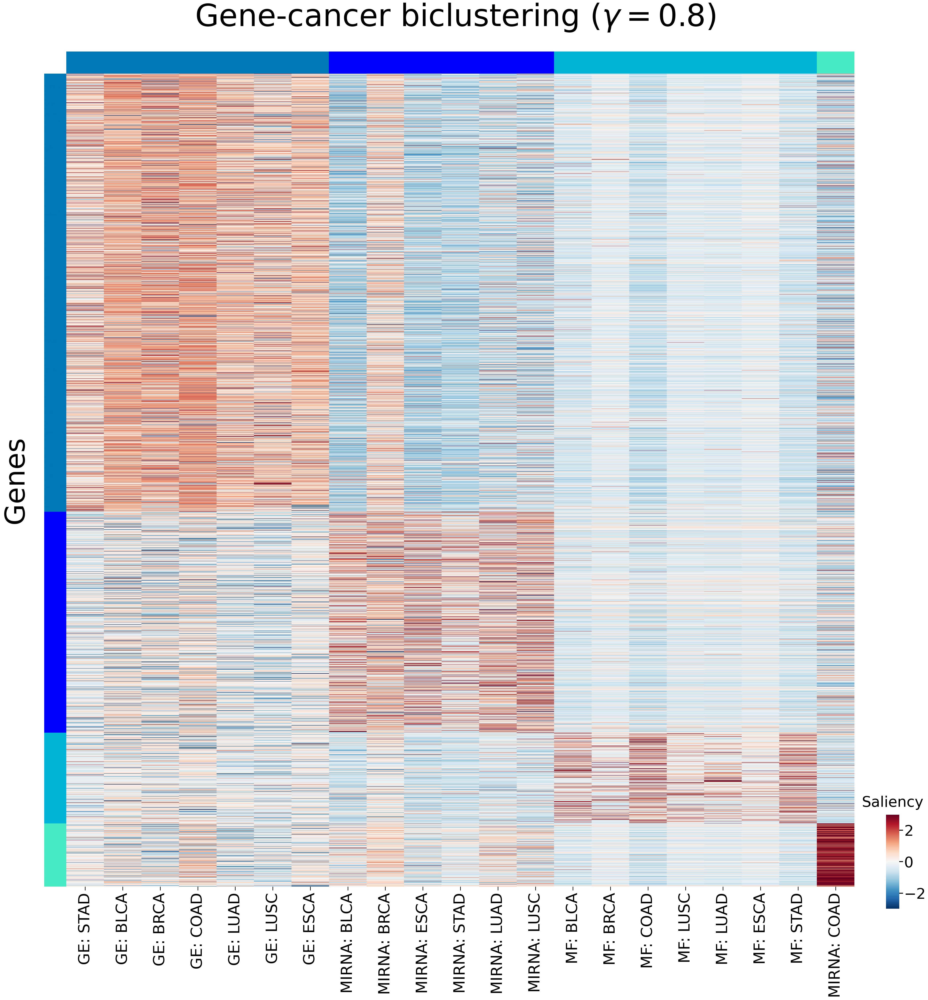

In [102]:
def plot_gene_cancer_biclustering_heatmap(
    gene_cancer_biclustered,
    gene_clusters,
    cancer_clusters,
    output_dir,
    filename="gene_cancer_leiden_bipartite.png",
    figsize=(20, 16),
    cmap="Blues",
    show_xticklabels=True,
    show_yticklabels=False,
    # title="Cancer–Gene Leiden Biclustering",
    title="",
    vmax_percentile=99,
    dpi=300,
    **kwargs
):
    """
    Publication-style Leiden biclustering heatmap.

    Features:
    - top cancer cluster color bar
    - left gene cluster color bar
    - logarithmic color scaling
    - publication-style fonts
    - configurable title
    """

    import os
    import numpy as np
    import seaborn as sns
    import matplotlib.pyplot as plt

    from matplotlib.colors import LogNorm, to_rgb
    from matplotlib.ticker import LogFormatter
    from matplotlib.gridspec import GridSpec

    # # =====================================================
    # # GLOBAL FONT CONFIG
    # # =====================================================

    # plt.rcParams.update({

    #     "font.size": 22,

    #     "axes.titlesize": 40,

    #     "axes.labelsize": 30,

    #     "xtick.labelsize": 28,

    #     "ytick.labelsize": 20,
    # })

    # =====================================================
    # OUTPUT DIR
    # =====================================================

    os.makedirs(
        output_dir,
        exist_ok=True
    )

    # =====================================================
    # EXTRACT NAMES
    # =====================================================

    gene_names = list(
        gene_cancer_biclustered.index
    )

    cancer_names = list(
        gene_cancer_biclustered.columns
    )

    # =====================================================
    # FILTER VALID CLUSTERS
    # =====================================================

    gene_names = [

        g for g in gene_names

        if g in gene_clusters
    ]

    cancer_names = [

        c for c in cancer_names

        if c in cancer_clusters
    ]

    # =====================================================
    # SUBSET MATRIX
    # =====================================================

    gene_cancer_biclustered = (
        gene_cancer_biclustered.loc[
            gene_names,
            cancer_names
        ]
    )

    # =====================================================
    # SORT BY CLUSTER
    # =====================================================

    gene_order = sorted(

        range(len(gene_names)),

        key=lambda i:
            gene_clusters[gene_names[i]]
    )

    cancer_order = sorted(

        range(len(cancer_names)),

        key=lambda i:
            cancer_clusters[cancer_names[i]]
    )

    # =====================================================
    # REORDER MATRIX
    # =====================================================

    reordered = gene_cancer_biclustered.iloc[
        gene_order,
        cancer_order
    ]

    ordered_gene_names = reordered.index.tolist()

    ordered_cancer_names = reordered.columns.tolist()

    mat = reordered.values.astype(float)

    # =====================================================
    # REMOVE INVALID VALUES
    # =====================================================

    mat = np.nan_to_num(
        mat,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    # =====================================================
    # ROW-WISE Z-SCORE NORMALIZATION
    # =====================================================

    row_mean = np.mean(
        mat,
        axis=1,
        keepdims=True
    )

    row_std = np.std(
        mat,
        axis=1,
        keepdims=True
    )

    row_std[row_std == 0] = 1.0

    mat = (
        mat - row_mean
    ) / row_std

    # =====================================================
    # Z-SCORE RANGE
    # =====================================================

    vmin = np.percentile(
        mat,
        1
    )

    vmax = np.percentile(
        mat,
        99
    )

    absmax = max(
        abs(vmin),
        abs(vmax)
    )

    vmin = -absmax
    vmax = absmax


    # =====================================================
    # DEFAULT CLUSTER COLORS
    # =====================================================

    DEFAULT_CLUSTER_COLORS = {

        0: '#0077B6',
        1: '#0000FF',
        2: '#00B4D8',
        3: '#48EAC4',
        4: '#F1C0E8',
        5: '#B9FBC0',
        6: '#32CD32',
        7: '#bee1e6',
        8: '#8A2BE2',
        9: '#E377C2'
    }

    # =====================================================
    # USE GLOBAL COLORS IF AVAILABLE
    # =====================================================

    try:
        cluster_colors = CLUSTER_COLORS
    except:
        cluster_colors = DEFAULT_CLUSTER_COLORS

    # =====================================================
    # GENE COLORS
    # =====================================================

    gene_colors = np.array([

        to_rgb(

            cluster_colors.get(
                gene_clusters[g],
                "#B0B0B0"
            )
        )

        for g in ordered_gene_names
    ])

    # =====================================================
    # CANCER COLORS
    # =====================================================

    cancer_colors = np.array([

        to_rgb(

            cluster_colors.get(
                cancer_clusters[c],
                "#B0B0B0"
            )
        )

        for c in ordered_cancer_names
    ])

    # =====================================================
    # FIGURE LAYOUT
    # =====================================================

    fig = plt.figure(
        figsize=figsize
    )
    fig.suptitle(
        f"Gene-cancer biclustering ($\\gamma={LEIDEN_RESOLUTION:.1f}$)",
        fontsize=100,
        y=0.91
    )

    # fig.subplots_adjust(top=0.90)


    gs = GridSpec(

        2,
        3,

        height_ratios=[0.045, 0.955],

        width_ratios=[0.03, 0.92, 0.05],

        hspace=0.0,

        wspace=0.0
    )

    ax_top  = fig.add_subplot(gs[0, 1])

    ax_left = fig.add_subplot(gs[1, 0])

    ax_main = fig.add_subplot(gs[1, 1])

    ax_cbar = fig.add_subplot(gs[1, 2])

    # =====================================================
    # MAIN HEATMAP
    # =====================================================
    hm = sns.heatmap(

        mat,

        ax=ax_main,

        cmap="RdBu_r",

        center=0,

        vmin=vmin,

        vmax=vmax,

        xticklabels=True,

        yticklabels=(
            ordered_gene_names
            if show_yticklabels
            else False
        ),

        cbar=True,

        cbar_ax=ax_cbar,

        rasterized=True,
    )

    # =====================================================
    # COLORBAR STYLE (MATCH Z-SCORE STYLE))
    # =====================================================

    cbar = hm.collections[0].colorbar

    ax_cbar.set_position([
        0.89,   # x
        0.09,   # y
        0.012,  # width
        0.085   # height
    ])

    # cbar.ax.tick_params(
    #     labelsize=48,
    #     length=3
    # )

    cbar.ax.tick_params(
        axis="y",
        which="major",
        direction="out",
        length=12,
        width=3,
        labelsize=48,
        left=False,
        right=True
    )

    # Force ticks to be visible
    for tick in cbar.ax.yaxis.get_major_ticks():
        tick.tick1line.set_visible(False)
        tick.tick2line.set_visible(True)

    cbar.outline.set_visible(False)

    cbar.ax.set_title(
        "Saliency",
        fontsize=48,
        # fontweight="bold",
        pad=26
    )


    # =====================================================
    # TITLE
    # =====================================================

    # ax_main.set_title(

    #     f"Gene-cancer biclustering ($\\gamma={LEIDEN_RESOLUTION:.1f}$)",

    #     fontsize=50,

    #     pad=28
    # )

    # =====================================================
    # XTICKS
    # =====================================================

    ax_main.tick_params(
        axis="x",
        which="major",
        bottom=True,
        top=False,
        labelbottom=True,
        direction="out",
        length=12,
        width=2
    )

    if show_xticklabels:

        ax_main.set_xticks(
            np.arange(len(ordered_cancer_names)) + 0.5
        )

        ax_main.set_xticklabels(

            ordered_cancer_names,

            fontsize=50,

            rotation=90,

            ha="center",

            va="top"
        )

        ax_main.tick_params(
            axis="x",
            pad=8
        )

    # =====================================================
    # REMOVE AXIS LABELS
    # =====================================================

    ax_main.set_xlabel("")
    ax_main.set_ylabel("")


    # =====================================================
    # LEFT GENE CLUSTER BAR
    # =====================================================

    ax_left.imshow(

        gene_colors[:, None, :],

        aspect="auto"
    )

    ax_left.set_axis_off()

    ax_left.text(

        # -0.9,
        -1.3,

        0.5,

        "Genes",

        ha="center",

        va="center",

        rotation=90,

        transform=ax_left.transAxes,

        fontsize=90
    )

    # =====================================================
    # TOP CANCER CLUSTER BAR
    # =====================================================

    ax_top.imshow(

        cancer_colors[None, :, :],

        aspect="auto"
    )

    ax_top.set_axis_off()

    # ensure same width of bars
    fig.canvas.draw()

    pos_main = ax_main.get_position()

    bar_thickness = 0.02

    ax_left.set_position([
        pos_main.x0 - bar_thickness,
        pos_main.y0,
        bar_thickness,
        pos_main.height
    ])

    ax_top.set_position([
        pos_main.x0,
        pos_main.y1,
        pos_main.width,
        bar_thickness
    ])

    save_path = os.path.join(
        output_dir,
        filename
    )

    plt.savefig(

        save_path,

        dpi=dpi,

        bbox_inches="tight",

        pad_inches=0.05
    )

    print(f"\n[SAVED] {save_path}")

    plt.show()

    plt.close()


plot_gene_cancer_biclustering_heatmap(
    gene_cancer_biclustered=gene_cancer_biclustered,

    gene_clusters=gene_clusters,

    cancer_clusters=cancer_clusters,

    # labels=labels,

    output_dir=output_dir,

    filename="gene_cancer_leiden_bipartite.png",

    figsize=(50, 50),

    cmap="Blues",

    show_xticklabels=True,

    show_yticklabels=False,

    vmax_percentile=99,
)



OMICS: GE
Vertices: 14727
Edges: 192677
Gamma = 0.10
Gamma = 0.20
Gamma = 0.30
Gamma = 0.40
Gamma = 0.50
Gamma = 0.60
Gamma = 0.70
Gamma = 0.80
Gamma = 0.90
Gamma = 1.00
Gamma = 1.10
Gamma = 1.20
Gamma = 1.30
Gamma = 1.40
Gamma = 1.50
Gamma = 1.60
Gamma = 1.70
Gamma = 1.80
Gamma = 1.90
Gamma = 2.00

OMICS: MF
Vertices: 9656
Edges: 68763
Gamma = 0.10
Gamma = 0.20
Gamma = 0.30
Gamma = 0.40
Gamma = 0.50
Gamma = 0.60
Gamma = 0.70
Gamma = 0.80
Gamma = 0.90
Gamma = 1.00
Gamma = 1.10
Gamma = 1.20
Gamma = 1.30
Gamma = 1.40
Gamma = 1.50
Gamma = 1.60
Gamma = 1.70
Gamma = 1.80
Gamma = 1.90
Gamma = 2.00

OMICS: MIRNA
Vertices: 14349
Edges: 179947
Gamma = 0.10
Gamma = 0.20
Gamma = 0.30
Gamma = 0.40
Gamma = 0.50
Gamma = 0.60
Gamma = 0.70
Gamma = 0.80
Gamma = 0.90
Gamma = 1.00
Gamma = 1.10
Gamma = 1.20
Gamma = 1.30
Gamma = 1.40
Gamma = 1.50
Gamma = 1.60
Gamma = 1.70
Gamma = 1.80
Gamma = 1.90
Gamma = 2.00

Saved all results.

Best gamma:
    Omics  Gamma       Psi
8      GE    0.9  0.313578
26     MF

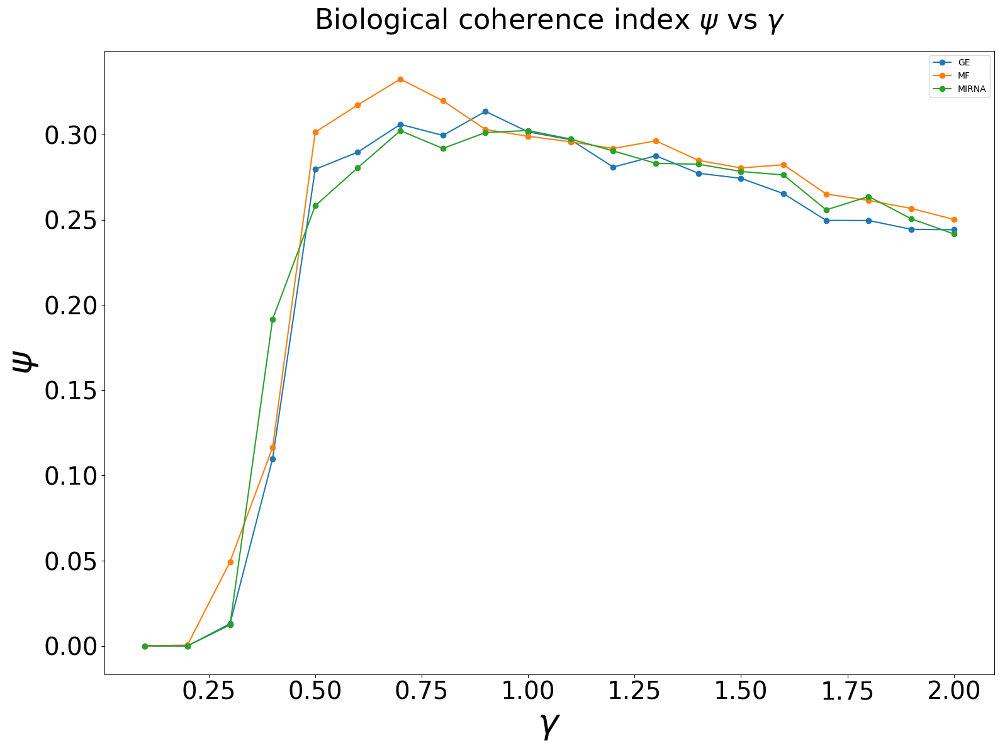


Finished.


In [103]:
# =====================================================
# LEIDEN BALANCE SCORE EVALUATION
# =====================================================

import os
import igraph as ig
import leidenalg

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from collections import Counter
from collections import defaultdict

# =====================================================
# OUTPUT
# =====================================================

balance_dir = os.path.join(
    output_dir,
    "balance_score_analysis"
)

os.makedirs(
    balance_dir,
    exist_ok=True
)

# =====================================================
# GAMMA RANGE
# =====================================================

GAMMA_VALUES = np.arange(
    0.1,
    2.1,
    0.1
)

# =====================================================
# RESULTS
# =====================================================

balance_rows = []

# =====================================================
# LOOP OVER OMICS
# =====================================================

for omics in omics_pathway_gene_dicts.keys():

    print("\n================================")
    print("OMICS:", omics)
    print("================================")

    pathway_gene_dict = (
        omics_pathway_gene_dicts[omics]
    )

    # -------------------------------------------------
    # Build graph ONCE
    # -------------------------------------------------

    edges = []

    for pathway, genes in pathway_gene_dict.items():

        for gene in genes:

            edges.append(
                (
                    f"GENE::{gene}",
                    f"PATH::{pathway}",
                    1.0
                )
            )

    ig_graph = ig.Graph.TupleList(
        edges,
        directed=False,
        edge_attrs=["weight"]
    )

    print(
        "Vertices:",
        ig_graph.vcount()
    )

    print(
        "Edges:",
        ig_graph.ecount()
    )

    # =================================================
    # GAMMA SWEEP
    # =================================================

    for GAMMA in GAMMA_VALUES:

        print(
            f"Gamma = {GAMMA:.2f}"
        )

        partition = (
            leidenalg.find_partition(
                ig_graph,
                leidenalg.RBConfigurationVertexPartition,
                weights="weight",
                resolution_parameter=float(GAMMA),
                seed=42
            )
        )

        memberships = (
            partition.membership
        )

        node_names = (
            ig_graph.vs["name"]
        )

        cluster_map = {

            node_names[i]:
            memberships[i]

            for i in range(
                len(node_names)
            )
        }

        # =============================================
        # MODULARITY
        # =============================================

        try:

            Q = partition.modularity

        except:

            Q = np.nan

        # =============================================
        # COMMUNITY ENTROPY
        # =============================================

        sizes = Counter(
            memberships
        )

        p = np.array(
            list(
                sizes.values()
            ),
            dtype=float
        )

        p /= p.sum()

        H = -np.sum(
            p * np.log(
                p + 1e-12
            )
        )

        K = len(sizes)

        H_norm = (
            H /
            np.log(K + 1e-12)
        )

        # =============================================
        # GENE / PATHWAY CLUSTERS
        # =============================================

        gene_clusters = {}
        pathway_clusters = {}

        for node, clust in cluster_map.items():

            if node.startswith(
                "GENE::"
            ):

                gene_clusters[
                    node.replace(
                        "GENE::",
                        ""
                    )
                ] = clust

            elif node.startswith(
                "PATH::"
            ):

                pathway_clusters[
                    node.replace(
                        "PATH::",
                        ""
                    )
                ] = clust

        # =============================================
        # COMMUNITY CONSISTENCY
        # =============================================

        cluster_flow = defaultdict(
            int
        )

        total_links = 0

        same_links = 0

        for pathway, genes in (
            pathway_gene_dict.items()
        ):

            if pathway not in (
                pathway_clusters
            ):
                continue

            p_clust = (
                pathway_clusters[
                    pathway
                ]
            )

            for gene in genes:

                if gene not in (
                    gene_clusters
                ):
                    continue

                g_clust = (
                    gene_clusters[
                        gene
                    ]
                )

                cluster_flow[
                    (
                        g_clust,
                        p_clust
                    )
                ] += 1

                total_links += 1

                if (
                    g_clust
                    ==
                    p_clust
                ):
                    same_links += 1

        D = (
            same_links /
            max(
                total_links,
                1
            )
        )

        # =============================================
        # BALANCE SCORE
        # =============================================

        Psi = (
            Q *
            H_norm *
            D
        )

        balance_rows.append(
            {
                "Omics": omics,
                "Gamma": GAMMA,
                "Communities": K,
                "Vertices":
                    ig_graph.vcount(),
                "Edges":
                    ig_graph.ecount(),
                "Modularity_Q":
                    Q,
                "Entropy_H":
                    H,
                "Entropy_Normalized":
                    H_norm,
                "Consistency_D":
                    D,
                "Psi":
                    Psi
            }
        )

# =====================================================
# SAVE RESULTS
# =====================================================

balance_df = pd.DataFrame(
    balance_rows
)

balance_df.to_csv(

    os.path.join(
        balance_dir,
        "Leiden_BalanceScore_AllGamma.csv"
    ),

    index=False
)

print(
    "\nSaved all results."
)

# =====================================================
# BEST GAMMA PER OMICS
# =====================================================

best_rows = []

for omics in (
    balance_df["Omics"]
    .unique()
):

    tmp = balance_df[
        balance_df["Omics"]
        ==
        omics
    ]

    best = tmp.loc[
        tmp[
            "Psi"
        ].idxmax()
    ]

    best_rows.append(
        best
    )

best_df = pd.DataFrame(
    best_rows
)


best_df.to_csv(

    os.path.join(
        balance_dir,
        "Leiden_BestGamma_PerOmics.csv"
    ),

    index=False
)

print("\nBest gamma:")

print(
    best_df[
        [
            "Omics",
            "Gamma",
            "Psi"
        ]
    ]
)


# =====================================================
# SAVE CSV FILES
# =====================================================

all_csv = os.path.join(
    balance_dir,
    "Leiden_BalanceScore_AllGamma.csv"
)

best_csv = os.path.join(
    balance_dir,
    "Leiden_BestGamma_PerOmics.csv"
)

balance_df.to_csv(
    all_csv,
    index=False
)

best_df.to_csv(
    best_csv,
    index=False
)

print("Saved:", all_csv)
print("Saved:", best_csv)

# =====================================================
# PLOTS
# =====================================================

plot_metrics = [
    ("Psi",
     r"Balance Score $\psi$",
     "BalanceScore_vs_Gamma.png"),

    ("Modularity_Q",
     "Modularity Q",
     "Modularity_vs_Gamma.png"),

    ("Entropy_Normalized",
     "Normalized Entropy",
     "Entropy_vs_Gamma.png"),

    ("Consistency_D",
     "Consistency D",
     "Consistency_vs_Gamma.png"),
]

for metric, ylabel, filename in plot_metrics:

    plt.figure(
        figsize=(8,6)
    )

    for omics in sorted(
        balance_df["Omics"].unique()
    ):

        tmp = balance_df[
            balance_df["Omics"] == omics
        ]

        plt.plot(
            tmp["Gamma"],
            tmp[metric],
            marker="o",
            linewidth=2,
            label=omics
        )

    plt.xlabel(
        r"Leiden resolution $\gamma$",
        fontsize=14
    )

    plt.ylabel(
        ylabel,
        fontsize=14
    )

    plt.title(
        ylabel + " vs Resolution",
        fontsize=15
    )

    plt.grid(
        alpha=0.3
    )

    plt.legend()

    plt.tight_layout()

    save_path = os.path.join(
        balance_dir,
        filename
    )

    plt.savefig(
        save_path,
        dpi=300,
        bbox_inches="tight"
    )

    plt.close()

    print("Saved:", save_path)

# =====================================================
# LATEX TABLE:
# BEST GAMMA PER OMICS
# =====================================================

latex_best = best_df[
    [
        "Omics",
        "Gamma",
        "Communities",
        "Modularity_Q",
        "Entropy_Normalized",
        "Consistency_D",
        "Psi"
    ]
].copy()

latex_best.columns = [
    "Omics",
    r"$\gamma^*$",
    "Communities",
    r"$Q$",
    r"$H/\log K$",
    r"$D$",
    r"$\psi^*$"
]

best_tex = os.path.join(
    balance_dir,
    "Leiden_BestGamma_PerOmics.tex"
)

with open(best_tex, "w") as f:

    f.write(
        latex_best.to_latex(
            index=False,
            float_format="%.4f",
            escape=False
        )
    )

print("Saved:", best_tex)

# =====================================================
# LATEX TABLE:
# ALL GAMMA SUMMARY
# =====================================================

summary_df = (
    balance_df
    .groupby("Omics")
    .agg(
        BestGamma=("Gamma", lambda x:
            balance_df.loc[
                x.index,
                "Psi"
            ].idxmax()
        ),
        MaxBalance=("Psi", "max"),
        MeanBalance=("Psi", "mean"),
        MeanQ=("Modularity_Q", "mean"),
        MeanEntropy=("Entropy_Normalized", "mean"),
        MeanConsistency=("Consistency_D", "mean")
    )
)

summary_df["BestGamma"] = summary_df[
    "BestGamma"
].apply(
    lambda idx:
    balance_df.loc[idx, "Gamma"]
)

summary_tex = os.path.join(
    balance_dir,
    "Leiden_AllGamma_Summary.tex"
)

with open(summary_tex, "w") as f:

    f.write(
        summary_df.to_latex(
            float_format="%.4f",
            escape=False
        )
    )

print("Saved:", summary_tex)

# =====================================================
# PRINT BEST RESULTS
# =====================================================

print("\nBest Gamma Per Omics")
print(
    best_df[
        [
            "Omics",
            "Gamma",
            "Psi"
        ]
    ]
)


# =====================================================
# BEST GAMMA PER OMICS
# =====================================================

best_rows = []

for omics in sorted(
    balance_df["Omics"].unique()
):

    tmp = balance_df[
        balance_df["Omics"] == omics
    ]

    best = tmp.loc[
        tmp["Psi"].idxmax()
    ]

    best_rows.append(best)

best_df = pd.DataFrame(best_rows)

# -----------------------------------------------------
# Save CSV
# -----------------------------------------------------

best_csv = os.path.join(
    balance_dir,
    "Leiden_BestGamma_PerOmics.csv"
)

best_df.to_csv(
    best_csv,
    index=False
)

print("\n================================")
print("BEST GAMMA PER OMICS")
print("================================")

for _, row in best_df.iterrows():

    print(
        f"{row['Omics']:8s} "
        f"Gamma={row['Gamma']:.2f}   "
        f"BalanceScore={row['Psi']:.6f}   "
        f"Communities={int(row['Communities'])}"
    )

# -----------------------------------------------------
# Overall best gamma across all omics
# -----------------------------------------------------

overall_best = balance_df.loc[
    balance_df["Psi"].idxmax()
]

overall_best_gamma = (
    overall_best["Gamma"]
)

overall_best_score = (
    overall_best["Psi"]
)

overall_best_omics = (
    overall_best["Omics"]
)

print("\n================================")
print("GLOBAL BEST RESULT")
print("================================")

print(
    f"Omics         : {overall_best_omics}"
)

print(
    f"Best Gamma    : {overall_best_gamma:.2f}"
)

print(
    f"Balance Score : {overall_best_score:.6f}"
)

print(
    f"Communities   : {int(overall_best['Communities'])}"
)

# -----------------------------------------------------
# Save global best
# -----------------------------------------------------

global_best_df = pd.DataFrame(
    [{
        "Omics":
            overall_best_omics,
        "Gamma":
            overall_best_gamma,
        "Psi":
            overall_best_score,
        "Communities":
            int(
                overall_best["Communities"]
            ),
        "Modularity_Q":
            overall_best["Modularity_Q"],
        "Entropy_Normalized":
            overall_best[
                "Entropy_Normalized"
            ],
        "Consistency_D":
            overall_best[
                "Consistency_D"
            ]
    }]
)

global_best_csv = os.path.join(
    balance_dir,
    "Leiden_GlobalBestGamma.csv"
)

global_best_df.to_csv(
    global_best_csv,
    index=False
)

print(
    "\nSaved:",
    global_best_csv
)


# =====================================================
# PLOT
# =====================================================

plt.figure(
    figsize=(16,12)
)

for omics in (
    balance_df["Omics"]
    .unique()
):

    tmp = balance_df[
        balance_df["Omics"]
        ==
        omics
    ]

    plt.plot(
        tmp["Gamma"],
        tmp["Psi"],
        marker="o",
        label=omics
    )

plt.xlabel(
    r"$\gamma$",
    fontsize=40
)

plt.ylabel(
    r"$\psi$",
    fontsize=40
)

plt.title(
    r"Biological coherence index $\psi$ vs $\gamma$",
    fontsize=32,
    pad=25
)

plt.xticks(fontsize=28)
plt.yticks(fontsize=28)

plt.legend()

plt.tight_layout()

plt.savefig(
    os.path.join(
        balance_dir,
        "BalanceScore_vs_Gamma.png"
    ),
    dpi=300
)

plt.show()

print(
    "\nFinished."
)


/var/folders/z_/4_txl3tn61g8nprq0_s7tsbc0000gn/T/ipykernel_9286/2400972853.py:233: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(


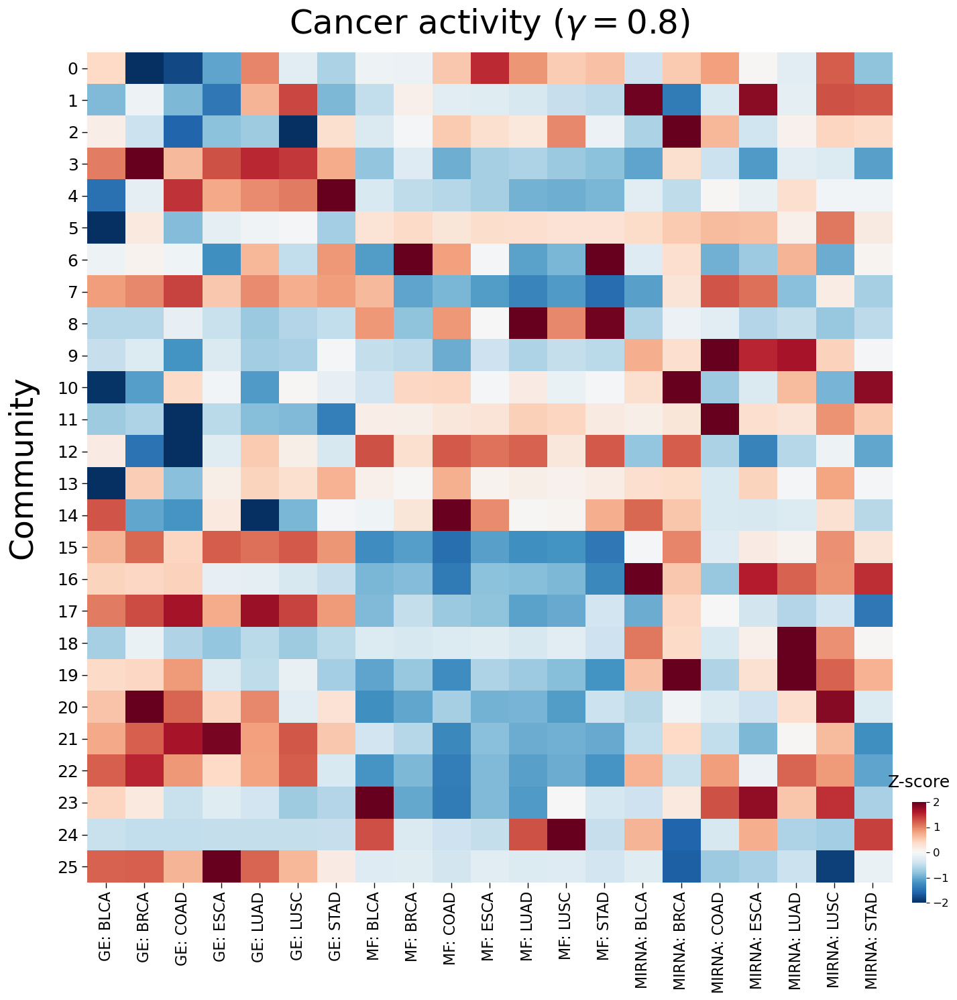

In [104]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =====================================================
# Gene -> Cluster table
# =====================================================

cluster_df = pd.DataFrame({
    "Gene": gene_cancer_weighted.index,
    "Cluster": [
        gene_clusters.get(g, -1)
        for g in gene_cancer_weighted.index
    ]
})

# =====================================================
# Remove cluster -1
# =====================================================

cluster_df = cluster_df[
    cluster_df["Cluster"] != -1
].copy()

# =====================================================
# Keep only valid genes
# =====================================================

cluster_matrix = gene_cancer_weighted.loc[
    cluster_df["Gene"]
].copy()

cluster_matrix["Cluster"] = (
    cluster_df["Cluster"].values
)

# =====================================================
# Mean cancer activity per community
# =====================================================

cluster_mean = (
    cluster_matrix
    .groupby("Cluster")
    .mean()
    .sort_index()
)

# =====================================================
# Row-wise Z-score normalization
# =====================================================

cluster_z = (
    cluster_mean
    .sub(
        cluster_mean.mean(axis=1),
        axis=0
    )
    .div(
        cluster_mean.std(axis=1),
        axis=0
    )
)

# remove NaN rows if std=0
cluster_z = cluster_z.fillna(0)

# # =====================================================
# # Plot
# # =====================================================

# plt.figure(figsize=(15, 15))

# im = plt.imshow(
#     cluster_z.values,
#     aspect="auto",
#     interpolation="nearest",
#     cmap="RdBu_r",
#     vmin=-2,
#     vmax=2
# )

# cbar = plt.colorbar(
#     im,
#     fraction=0.03,
#     pad=0.02
# )

# cbar.set_label(
#     "Z-score Activity",
#     fontsize=16,
#     labelpad=15
# )

# plt.yticks(
#     range(len(cluster_z.index)),
#     cluster_z.index,
#     fontsize=12
# )

# plt.xticks(
#     range(len(cluster_z.columns)),
#     cluster_z.columns,
#     rotation=90,
#     fontsize=12
# )

# plt.ylabel(
#     "Community",
#     fontsize=20,
#     labelpad=20
# )

# plt.xlabel(
#     "Cancer Type",
#     fontsize=20,
#     labelpad=20
# )

# plt.title(
#     f"Community-Level Cancer Activity (Z-score) ($\\gamma={LEIDEN_RESOLUTION:.1f}$)",
#     fontsize=22,
#     pad=30
# )

# plt.tight_layout()

# plt.show()

# =====================================================
# Plot
# =====================================================

fig, ax = plt.subplots(figsize=(15, 15))

im = ax.imshow(
    cluster_z.values,
    aspect="auto",
    interpolation="nearest",
    # cmap="Blues",      # <- blue gradient
    cmap="RdBu_r",
    vmin=-2,
    vmax=2
)

# -----------------------------------------------------
# Labels
# -----------------------------------------------------

ax.set_yticks(range(len(cluster_z.index)))
ax.set_yticklabels(
    cluster_z.index,
    fontsize=18
)

ax.set_xticks(range(len(cluster_z.columns)))
ax.set_xticklabels(
    cluster_z.columns,
    rotation=90,
    fontsize=16
)

ax.set_ylabel(
    "Community",
    fontsize=34,
    labelpad=20
)

# ax.set_xlabel(
#     "Cancer Type",
#     fontsize=28,
#     labelpad=20
# )

ax.set_title(
    f"Cancer activity ($\\gamma={LEIDEN_RESOLUTION:.1f}$)",
    fontsize=36,
    pad=20
)

ax.tick_params(
    axis="both",
    which="major",
    direction="out",
    length=6,
    width=1,
    bottom=True,
    top=False,
    left=True,
    right=False
)


# =====================================================
# Vertical colorbar (bottom-right)
# =====================================================

cax = fig.add_axes([
    0.91,   # x-position (move right)
    0.10,   # y-position (bottom)
    0.014,  # width (thin)
    0.10    # height
])

cbar = fig.colorbar(
    im,
    cax=cax,
    orientation="vertical"
)

# cbar.set_label(
#     "Z-score",
#     fontsize=18,
#     labelpad=10,
#     fontweight="bold"
# )
cbar.ax.set_title(
    "Z-score",
    fontsize=18,
    # fontweight="bold",
    pad=16
)

cbar.ax.tick_params(
    labelsize=12
)

for spine in ax.spines.values():
    spine.set_visible(False)

cbar.outline.set_visible(False)


plt.tight_layout(
    rect=[0, 0, 0.90, 1]
)

plt.show()


## Gene–Cancer Biclustering Heatmap

This visualization displays biclustered gene–cancer saliency patterns obtained from the Leiden community structure. Genes and cancer types are ordered according to their respective Leiden cluster assignments, allowing coherent biclusters to emerge visually.

### Heatmap Values

The heatmap uses **row-wise z-score normalization**:

\[
z_{ij} = \frac{x_{ij} - \mu_i}{\sigma_i}
\]

where:

- \(x_{ij}\) is the saliency value of gene \(i\) in cancer type \(j\),
- \(\mu_i\) is the mean saliency of gene \(i\) across all cancer types,
- \(\sigma_i\) is the standard deviation of saliency values for gene \(i\).

This normalization removes gene-specific scale effects and highlights relative saliency differences across cancer types.

### Color Interpretation

- **Red**: higher-than-average saliency for a gene.
- **Blue**: lower-than-average saliency for a gene.
- **White**: approximately average saliency.

Because each gene is standardized independently, the visualization emphasizes cancer-specific patterns rather than absolute saliency magnitudes.

### Cluster Annotations

- The **left color bar** indicates gene Leiden communities.
- The **top color bar** indicates cancer Leiden communities.
- Genes and cancers sharing the same color belong to the same community.

### Purpose

This visualization helps identify:

1. Gene communities exhibiting similar cancer-specific saliency patterns.
2. Cancer communities characterized by related molecular signatures.
3. Large biclusters representing coherent biological modules.
4. Relationships between graph-derived communities and model explanations.

The Leiden resolution parameter used for community detection is:

\[
\gamma = {{LEIDEN\_RESOLUTION}}
\]

where larger values generally produce smaller and more granular communities.

## Cluster-Level Saliency Programs

Genes are aggregated according to Leiden communities.

For cluster $k$, the average cancer-specific activation is:

$$
\bar{x}_{k,j}
=
\frac{1}{|C_k|}
\sum_{i \in C_k} x_{ij}
$$

This reveals higher-order biological programs
shared across driver gene modules.

## Saliency Distribution

The saliency distribution evaluates whether
driver importance is diffuse or concentrated.

Heavy-tailed distributions indicate sparse
high-impact driver programs.